<span style="color:red; font-family:Helvetica Neue, Helvetica, Arial, sans-serif; font-size:2em;">An Exception was encountered at '<a href="#papermill-error-cell">In [36]</a>'.</span>

In [1]:
%matplotlib inline
%load_ext autoreload
%autoreload 2

In [2]:
# import numpy as np
# import os
# from functools import partial
# import seaborn as sns
# import plotly.graph_objects as go
# import pandas as pd
# import dask.dataframe as dd
# import matplotlib.pyplot as plt
# import sys
# import pickle
# from pathlib import Path


# # hex2vec
# HOME = os.environ["HOME"]

# sys.path.insert(0, f"{HOME}/hex2vec")

# # add codebase
# sys.path.insert(0, f"/gcsmount-notebook/codebase")

# from src.data.make_dataset import h3_to_polygon
# import urban_tools.constants as uc
# from urban_tools.hex_pipeline import RouteHexHandler, TestTrainManager
# from urban_tools.pipelines import route_hex_pipeline


# ## Read in the Delivery DataFrame
# p = Path("/gcsmount-research-data-staging/osmnx-cities/hexed-routes/debug-multi-synthetic-tags/hh.pkl")
# hh = RouteHexHandler.from_pickle(p)
# # embedding_df = pd.read_pickle("/gcsmount-research-data-staging/osmnx-cities/hexed-complete/Boston, MA/boston_embedding.pkl")

# ### Remove Super Tags
# # hh.drop_super_tags()
# ### Remove Sub Tags
# # hh = hh.drop_sub_tags()
# ### Filter for only H3 with > X Data Points

# hh = hh.filter_hex_occurance(20)
# ## Drop Unecessary Columns
# hh.other_tags
# ### Drop Chicago
# # print(tagged_df.shape[0].compute(), tagged_df.shape[1])
# # tagged_df = tagged_df.loc[~tagged_df["city"].str.contains("Chicago")]
# # filter for only Boston
# hh.df = hh.df.loc[hh.df.city.str.contains("Boston")]
# # print(tagged_df.shape[0].compute(), tagged_df.shape[1])

# ## Data Preprocessing: Scaling and Splitting into train test


# # create a grouped dataframe
# tagged_df = hh.df.groupby("h3").agg({
#     "planned_service_time_log": "mean",
#     **{
#         tag: "first"
#         for tag in hh.all_tags
#     }
# })


# from sklearn.preprocessing import RobustScaler

# tt = TestTrainManager(
#     tagged_df,
#     x_col=hh.all_tags,
#     y_col=["planned_service_time_log"],
#     scaler=RobustScaler,
#     grouped=True,
# )
# tt.split_test_train(train_size=0.8, random_seed=6781)


# tt.scale_test_train()
# tt.build_test_df(agg=False)

In [3]:
import os
import sys
import pickle
from pathlib import Path
import torch; torch.manual_seed(0)
import torch.nn as nn
import torch.nn.functional as F
import torch.utils
import torch.distributions
import torchvision
from torchvision import datasets, transforms
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

from functools import partial
import seaborn as sns
import gc
from numpy.random import binomial
from numpy.random import normal

import pandas as pd
import seaborn as sns

# %reset -s -f
import os
from functools import partial
import logging

# hex2vec
HOME = os.environ["HOME"]

sys.path.insert(0, f"{HOME}/hex2vec")

# add codebase
sys.path.insert(0, f"/gcsmount-notebook/codebase")

from src.data.make_dataset import h3_to_polygon
import urban_tools.constants as uc
from urban_tools.hex_pipeline import RouteHexHandler, TestTrainManager
from urban_tools.pipelines import route_hex_pipeline

p = Path("/gcsmount-research-data-staging/osmnx-cities/hexed-routes/debug-multi-synthetic-tags/hh.pkl")
hh = RouteHexHandler.from_pickle(p)
# embedding_df = pd.read_pickle("/gcsmount-research-data-staging/osmnx-cities/hexed-complete/Boston, MA/boston_embedding.pkl")

### Filter for only H3 with > X Data Points
hh = hh.filter_hex_occurance(20)
## Drop Unecessary Columns
hh.other_tags

## Data Preprocessing: Scaling and Splitting into train test

#### Create the Test-Train Manager
# filter for only Boston
from sklearn.preprocessing import RobustScaler
hh.df = hh.df.loc[hh.df.city.str.contains("Boston")]
tt = TestTrainManager(
        hh.df,
        scaler=RobustScaler,
        x_col=hh.all_tags,
        y_col=hh.df.columns.intersection(["planned_service_time_log"]),
    )

tt.split_test_train(random_seed=12323)
tt.scale_test_train()
tt.build_test_df()
train = pd.concat([tt.X_train, tt.Y_train], axis=1, copy=True)
test = pd.concat([tt.X_test, tt.Y_test.loc, tt.Y_test.scale], axis=1, copy=True)

print(f'Training Data shape is {tt.X_train.shape}')
print(f'testing Data shape is {tt.X_test.shape}')

del hh
gc.collect()

# convert a pandas dataframe to a pytorch dataset
class PandasDataset(torch.utils.data.Dataset):
    def __init__(self, x_df, y_df):
        self._x_df = x_df.values.astype(np.float32)
        self._y_df = y_df.values.astype(np.float32).ravel()

    def __len__(self):
        return len(self._x_df)

    def __getitem__(self, idx):
        if torch.is_tensor(idx):
            idx = idx.tolist()
        return self._x_df[idx], self._y_df[idx]

Training Data shape is (28337, 674)
testing Data shape is (240, 674)


In [4]:
import sys
sys.path.append('/home/ext_navish_iitkgp_gmail_com/ganRegression/')

In [5]:
import importlib

import dataset, metrics, plotting, config, network
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from models import cgan_model
import numpy as np
import random

importlib.reload(network)
importlib.reload(dataset)
importlib.reload(metrics)
importlib.reload(plotting)
importlib.reload(config)
importlib.reload(cgan_model)

2022-11-17 17:47:30.915488: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2022-11-17 17:47:31.112735: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory
2022-11-17 17:47:31.112769: I tensorflow/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dlerror if you do not have a GPU set up on your machine.
2022-11-17 17:47:31.143610: E tensorflow/stream_executor/cuda/cuda_blas.cc:2981] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


2022-11-17 17:47:31.964427: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libnvinfer.so.7'; dlerror: libnvinfer.so.7: cannot open shared object file: No such file or directory
2022-11-17 17:47:31.964610: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libnvinfer_plugin.so.7'; dlerror: libnvinfer_plugin.so.7: cannot open shared object file: No such file or directory
2022-11-17 17:47:31.964623: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Cannot dlopen some TensorRT libraries. If you would like to use Nvidia GPU with TensorRT, please make sure the missing libraries mentioned above are installed properly.


<module 'models.cgan_model' from '/home/ext_navish_iitkgp_gmail_com/ganRegression/models/cgan_model.py'>

In [6]:
import os

# dataset_config = config.DatasetConfig(scenario="census-house")
dataset_config = config.DatasetConfig(scenario="amazon-boston-dataset")

assert(dataset_config.scenario == "CA-housing"
      or dataset_config.scenario == "ailerons"
      or dataset_config.scenario == "CA-housing-single"
      or dataset_config.scenario == "comp-activ"
      or dataset_config.scenario == "pumadyn"
      or dataset_config.scenario == "bank"
      or dataset_config.scenario == "abalone"
      or dataset_config.scenario == "abalone"
      or dataset_config.scenario == "amazon-boston-dataset")
    #   or dataset_config.scenario == "census-house-single"
fig_dir = f"/gcsmount-notebook/navish/RegressionNN/figures/{dataset_config.scenario}"

try:
    os.mkdir(fig_dir)
    print(f"Directory {fig_dir} created ") 
except FileExistsError:
    print(f"Directory {fig_dir} already exists replacing files in this notebook")

Directory /gcsmount-notebook/navish/RegressionNN/figures/amazon-boston-dataset already exists replacing files in this notebook


In [7]:
random_seed = 1985

exp_config = config.Config(
    model=config.ModelConfig(activation="elu", lr_gen=1e-4, lr_disc=1e-4, dec_gen=0, dec_disc=0, 
                                optim_gen="Adam", optim_disc="Adam", z_input_size=1, random_seed=random_seed),
    training=config.TrainingConfig(n_epochs=100, batch_size=128, n_samples=100),
    dataset=dataset_config,
    run=config.RunConfig(save_fig=1)
)

In [8]:
# Set random seed
np.random.seed(exp_config.model.random_seed)
random.seed(exp_config.model.random_seed)

import tensorflow as tf
tf.random.set_seed(exp_config.model.random_seed)

# gpu = tf.config.experimental.list_physical_devices('CPU')
# tf.config.experimental.set_memory_growth(gpu, True)

In [9]:
X_train, y_train, X_test, y_test = tt.X_train.values, tt.Y_train.values.ravel(), tt.X_test.values, tt.Y_test.loc.values

In [10]:
X_train.shape, X_test.shape

((28337, 674), (240, 674))

# XGBoost

##### Tuning XGBOOST

In [11]:
# from sklearn.model_selection import GridSearchCV, KFold
# import xgboost as xgb

# # XGBoost
# xg_reg = xgb.XGBRegressor(objective ='reg:squarederror', colsample_bytree = 1,eta=0.3, learning_rate = 1e-3,
#                 max_depth = 5, alpha = 10, n_estimators = 2000, n_jobs=-1)

# params = {
#     'n_estimators': [200, 500, 2000],
#     'learning_rate': [1e-3, 0.05, 0.1],
#     'booster': ['gbtree', 'gblinear'],
#     'gamma': [0, 0.5, 1],
#     'reg_alpha': [0, 0.5, 1],
#     'reg_lambda': [0.5, 1, 5],
#     'base_score': [0.5, 1]
# }

# gs2 = GridSearchCV(xg_reg, params, n_jobs=-1, cv=KFold(n_splits=3), scoring='r2')
# # gs2 = GridSearchCV(xg_reg, params, n_jobs=-1, cv=KFold(n_splits=3), scoring='neg_root_mean_squared_error')

# gs2.fit(X_train, y_train)

# print('Best score:', gs2.best_score_)
# print('Best score:', gs2.best_params_)

In [12]:
# Taking in the tuned parameters
import xgboost as xgb
xg_reg = xgb.XGBRegressor(objective ='reg:squarederror', colsample_bytree = 1, eta=0.3, learning_rate = 1e-2,
                max_depth = 5, alpha = 10, n_estimators = 500, n_jobs=-1,
                base_score=.5, booster='gbtree', gamma=1, reg_alpha=0.5, reg_lambda=5)

# xg_reg = xgb.XGBRegressor(objective ='reg:squarederror', learning_rate = 1e-2,
#                  n_estimators = 2000, n_jobs=-1)

xg_reg.fit(X_train,y_train)

ypred_xgb_train = xg_reg.predict(X_train)
ypred_xg_test = xg_reg.predict(X_test)

xg_mae = mean_absolute_error(ypred_xg_test, y_test)
print(f'Mean Absolute Error: {xg_mae}')

cov_xg = np.mean((y_test - ypred_xg_test)**2)

metrics.gaussian_NLPD(y_test, ypred_xg_test, np.ones(len(ypred_xg_test)) * cov_xg, "XG")

print(f"Train-RMSE: {mean_squared_error(y_train, ypred_xgb_train, squared=False).round(2)}, Train-R2: {r2_score(y_train, ypred_xgb_train).round(2)}")
print(f"Test-RMSE: {mean_squared_error(y_test, ypred_xg_test, squared=False).round(2)}, Test-R2: {r2_score(y_test, ypred_xg_test).round(2)}")

Mean Absolute Error: 0.17050047312853026
XG Gaussian NLPD: -0.07682150850627381
Train-RMSE: 0.68, Train-R2: 0.2
Test-RMSE: 0.22, Test-R2: 0.65


# GAN

In [13]:
cgan = cgan_model.CGAN(exp_config)
cgan.trainable = True
d_loss_err, d_loss_true, d_loss_fake, g_loss_err, g_pred, g_true = cgan.train(X_train, y_train, 
                                                                              epochs=exp_config.training.n_epochs,
                                                                              batch_size=exp_config.training.batch_size)

ypred_gan_test = cgan.predict(X_test)

2022-11-17 17:48:51.658281: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcuda.so.1'; dlerror: libcuda.so.1: cannot open shared object file: No such file or directory
2022-11-17 17:48:51.658338: W tensorflow/stream_executor/cuda/cuda_driver.cc:263] failed call to cuInit: UNKNOWN ERROR (303)
2022-11-17 17:48:51.658365: I tensorflow/stream_executor/cuda/cuda_diagnostics.cc:156] kernel driver does not appear to be running on this host (hub-kproc-prod-dataproc-hub-navish-iitkgp-m): /proc/driver/nvidia/version does not exist
2022-11-17 17:48:51.658659: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


Epoch: 0 / dLoss: 0.6906292140483856 / gLoss: 0.7370189428329468


  1/886 [..............................] - ETA: 1:18

 37/886 [>.............................] - ETA: 1s  

 76/886 [=>............................] - ETA: 1s

114/886 [==>...........................] - ETA: 1s

150/886 [====>.........................] - ETA: 0s

191/886 [=====>........................] - ETA: 0s

230/886 [======>.......................] - ETA: 0s

268/886 [========>.....................] - ETA: 0s

305/886 [=========>....................] - ETA: 0s

342/886 [==========>...................] - ETA: 0s

379/886 [===========>..................] - ETA: 0s

419/886 [=============>................] - ETA: 0s

459/886 [==============>...............] - ETA: 0s

500/886 [===============>..............] - ETA: 0s

539/886 [=================>............] - ETA: 0s

578/886 [==================>...........] - ETA: 0s

616/886 [===================>..........] - ETA: 0s

653/886 [=====================>........] - ETA: 0s

691/886 [======================>.......] - ETA: 0s

728/886 [=======================>......] - ETA: 0s

765/886 [========================>.....] - ETA: 0s

803/886 [==========================>...] - ETA: 0s

842/886 [===========================>..] - ETA: 0s

880/886 [============================>.] - ETA: 0s

886/886 [==============================] - 1s 1ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


Epoch: 1 / dLoss: 0.6712813973426819 / gLoss: 0.7016814351081848


  1/886 [..............................] - ETA: 24s

 39/886 [>.............................] - ETA: 1s 

 79/886 [=>............................] - ETA: 1s

117/886 [==>...........................] - ETA: 1s

153/886 [====>.........................] - ETA: 0s

189/886 [=====>........................] - ETA: 0s

226/886 [======>.......................] - ETA: 0s

263/886 [=======>......................] - ETA: 0s

302/886 [=========>....................] - ETA: 0s

339/886 [==========>...................] - ETA: 0s

376/886 [===========>..................] - ETA: 0s

414/886 [=============>................] - ETA: 0s

454/886 [==============>...............] - ETA: 0s

492/886 [===============>..............] - ETA: 0s

534/886 [=================>............] - ETA: 0s

574/886 [==================>...........] - ETA: 0s

612/886 [===================>..........] - ETA: 0s

650/886 [=====================>........] - ETA: 0s

689/886 [======================>.......] - ETA: 0s

726/886 [=======================>......] - ETA: 0s

764/886 [========================>.....] - ETA: 0s

804/886 [==========================>...] - ETA: 0s

841/886 [===========================>..] - ETA: 0s

879/886 [============================>.] - ETA: 0s

886/886 [==============================] - 1s 1ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


Epoch: 2 / dLoss: 0.6953542530536652 / gLoss: 0.6904195547103882


  1/886 [..............................] - ETA: 23s

 37/886 [>.............................] - ETA: 1s 

 75/886 [=>............................] - ETA: 1s

115/886 [==>...........................] - ETA: 1s

153/886 [====>.........................] - ETA: 0s

192/886 [=====>........................] - ETA: 0s

231/886 [======>.......................] - ETA: 0s

270/886 [========>.....................] - ETA: 0s

308/886 [=========>....................] - ETA: 0s

346/886 [==========>...................] - ETA: 0s

383/886 [===========>..................] - ETA: 0s

422/886 [=============>................] - ETA: 0s

460/886 [==============>...............] - ETA: 0s

498/886 [===============>..............] - ETA: 0s

537/886 [=================>............] - ETA: 0s

575/886 [==================>...........] - ETA: 0s

614/886 [===================>..........] - ETA: 0s

652/886 [=====================>........] - ETA: 0s

690/886 [======================>.......] - ETA: 0s

728/886 [=======================>......] - ETA: 0s

767/886 [========================>.....] - ETA: 0s

804/886 [==========================>...] - ETA: 0s

843/886 [===========================>..] - ETA: 0s

883/886 [============================>.] - ETA: 0s

886/886 [==============================] - 1s 1ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 4ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 4ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 4ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 4ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 4ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 4ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 4ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 4ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


Epoch: 3 / dLoss: 0.6909473538398743 / gLoss: 0.7196992635726929


  1/886 [..............................] - ETA: 22s

 39/886 [>.............................] - ETA: 1s 

 79/886 [=>............................] - ETA: 1s

119/886 [===>..........................] - ETA: 0s

159/886 [====>.........................] - ETA: 0s

198/886 [=====>........................] - ETA: 0s

237/886 [=======>......................] - ETA: 0s

276/886 [========>.....................] - ETA: 0s

316/886 [=========>....................] - ETA: 0s

352/886 [==========>...................] - ETA: 0s

392/886 [============>.................] - ETA: 0s

432/886 [=============>................] - ETA: 0s

470/886 [==============>...............] - ETA: 0s

508/886 [================>.............] - ETA: 0s

546/886 [=================>............] - ETA: 0s

583/886 [==================>...........] - ETA: 0s

623/886 [====================>.........] - ETA: 0s

662/886 [=====================>........] - ETA: 0s

700/886 [======================>.......] - ETA: 0s

739/886 [========================>.....] - ETA: 0s

776/886 [=========================>....] - ETA: 0s

814/886 [==========================>...] - ETA: 0s

855/886 [===========================>..] - ETA: 0s

886/886 [==============================] - 1s 1ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


Epoch: 4 / dLoss: 0.6895983517169952 / gLoss: 0.7324473261833191


  1/886 [..............................] - ETA: 24s

 38/886 [>.............................] - ETA: 1s 

 76/886 [=>............................] - ETA: 1s

113/886 [==>...........................] - ETA: 1s

151/886 [====>.........................] - ETA: 0s

190/886 [=====>........................] - ETA: 0s

227/886 [======>.......................] - ETA: 0s

267/886 [========>.....................] - ETA: 0s

306/886 [=========>....................] - ETA: 0s

345/886 [==========>...................] - ETA: 0s

384/886 [============>.................] - ETA: 0s

422/886 [=============>................] - ETA: 0s

462/886 [==============>...............] - ETA: 0s

500/886 [===============>..............] - ETA: 0s

538/886 [=================>............] - ETA: 0s

575/886 [==================>...........] - ETA: 0s

613/886 [===================>..........] - ETA: 0s

650/886 [=====================>........] - ETA: 0s

688/886 [======================>.......] - ETA: 0s

725/886 [=======================>......] - ETA: 0s

762/886 [========================>.....] - ETA: 0s

801/886 [==========================>...] - ETA: 0s

840/886 [===========================>..] - ETA: 0s

879/886 [============================>.] - ETA: 0s

886/886 [==============================] - 1s 1ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 4ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


Epoch: 5 / dLoss: 0.6981507539749146 / gLoss: 0.6822621822357178


  1/886 [..............................] - ETA: 29s

 36/886 [>.............................] - ETA: 1s 

 74/886 [=>............................] - ETA: 1s

112/886 [==>...........................] - ETA: 1s

150/886 [====>.........................] - ETA: 0s

186/886 [=====>........................] - ETA: 0s

222/886 [======>.......................] - ETA: 0s

259/886 [=======>......................] - ETA: 0s

298/886 [=========>....................] - ETA: 0s

336/886 [==========>...................] - ETA: 0s

374/886 [===========>..................] - ETA: 0s

414/886 [=============>................] - ETA: 0s

453/886 [==============>...............] - ETA: 0s

491/886 [===============>..............] - ETA: 0s

528/886 [================>.............] - ETA: 0s

567/886 [==================>...........] - ETA: 0s

606/886 [===================>..........] - ETA: 0s

643/886 [====================>.........] - ETA: 0s

682/886 [======================>.......] - ETA: 0s

722/886 [=======================>......] - ETA: 0s

760/886 [========================>.....] - ETA: 0s

795/886 [=========================>....] - ETA: 0s

832/886 [===========================>..] - ETA: 0s

868/886 [============================>.] - ETA: 0s

886/886 [==============================] - 1s 1ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


Epoch: 6 / dLoss: 0.6882252097129822 / gLoss: 0.6967358589172363


  1/886 [..............................] - ETA: 22s

 39/886 [>.............................] - ETA: 1s 

 79/886 [=>............................] - ETA: 1s

119/886 [===>..........................] - ETA: 0s

156/886 [====>.........................] - ETA: 0s

193/886 [=====>........................] - ETA: 0s

232/886 [======>.......................] - ETA: 0s

271/886 [========>.....................] - ETA: 0s

310/886 [=========>....................] - ETA: 0s

348/886 [==========>...................] - ETA: 0s

384/886 [============>.................] - ETA: 0s

420/886 [=============>................] - ETA: 0s

456/886 [==============>...............] - ETA: 0s

494/886 [===============>..............] - ETA: 0s

532/886 [=================>............] - ETA: 0s

570/886 [==================>...........] - ETA: 0s

608/886 [===================>..........] - ETA: 0s

646/886 [====================>.........] - ETA: 0s

684/886 [======================>.......] - ETA: 0s

723/886 [=======================>......] - ETA: 0s

763/886 [========================>.....] - ETA: 0s

801/886 [==========================>...] - ETA: 0s

840/886 [===========================>..] - ETA: 0s

878/886 [============================>.] - ETA: 0s

886/886 [==============================] - 1s 1ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


Epoch: 7 / dLoss: 0.69651660323143 / gLoss: 0.6956466436386108


  1/886 [..............................] - ETA: 22s

 39/886 [>.............................] - ETA: 1s 

 78/886 [=>............................] - ETA: 1s

117/886 [==>...........................] - ETA: 1s

157/886 [====>.........................] - ETA: 0s

194/886 [=====>........................] - ETA: 0s

233/886 [======>.......................] - ETA: 0s

272/886 [========>.....................] - ETA: 0s

312/886 [=========>....................] - ETA: 0s

353/886 [==========>...................] - ETA: 0s

395/886 [============>.................] - ETA: 0s

435/886 [=============>................] - ETA: 0s

472/886 [==============>...............] - ETA: 0s

512/886 [================>.............] - ETA: 0s

552/886 [=================>............] - ETA: 0s

590/886 [==================>...........] - ETA: 0s

628/886 [====================>.........] - ETA: 0s

666/886 [=====================>........] - ETA: 0s

707/886 [======================>.......] - ETA: 0s

746/886 [========================>.....] - ETA: 0s

786/886 [=========================>....] - ETA: 0s

824/886 [==========================>...] - ETA: 0s

861/886 [============================>.] - ETA: 0s

886/886 [==============================] - 1s 1ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


Epoch: 8 / dLoss: 0.6935449838638306 / gLoss: 0.6797170042991638


  1/886 [..............................] - ETA: 22s

 40/886 [>.............................] - ETA: 1s 

 81/886 [=>............................] - ETA: 1s

123/886 [===>..........................] - ETA: 0s

162/886 [====>.........................] - ETA: 0s

203/886 [=====>........................] - ETA: 0s

244/886 [=======>......................] - ETA: 0s

284/886 [========>.....................] - ETA: 0s

325/886 [==========>...................] - ETA: 0s

363/886 [===========>..................] - ETA: 0s

402/886 [============>.................] - ETA: 0s

440/886 [=============>................] - ETA: 0s

480/886 [===============>..............] - ETA: 0s

520/886 [================>.............] - ETA: 0s

560/886 [=================>............] - ETA: 0s

600/886 [===================>..........] - ETA: 0s

643/886 [====================>.........] - ETA: 0s

682/886 [======================>.......] - ETA: 0s

722/886 [=======================>......] - ETA: 0s

760/886 [========================>.....] - ETA: 0s

801/886 [==========================>...] - ETA: 0s

840/886 [===========================>..] - ETA: 0s

878/886 [============================>.] - ETA: 0s

886/886 [==============================] - 1s 1ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


Epoch: 9 / dLoss: 0.6931247711181641 / gLoss: 0.6946975588798523


  1/886 [..............................] - ETA: 23s

 35/886 [>.............................] - ETA: 1s 

 75/886 [=>............................] - ETA: 1s

115/886 [==>...........................] - ETA: 1s

155/886 [====>.........................] - ETA: 0s

195/886 [=====>........................] - ETA: 0s

235/886 [======>.......................] - ETA: 0s

274/886 [========>.....................] - ETA: 0s

314/886 [=========>....................] - ETA: 0s

353/886 [==========>...................] - ETA: 0s

392/886 [============>.................] - ETA: 0s

427/886 [=============>................] - ETA: 0s

463/886 [==============>...............] - ETA: 0s

498/886 [===============>..............] - ETA: 0s

534/886 [=================>............] - ETA: 0s

572/886 [==================>...........] - ETA: 0s

612/886 [===================>..........] - ETA: 0s

653/886 [=====================>........] - ETA: 0s

692/886 [======================>.......] - ETA: 0s

731/886 [=======================>......] - ETA: 0s

770/886 [=========================>....] - ETA: 0s

809/886 [==========================>...] - ETA: 0s

849/886 [===========================>..] - ETA: 0s

886/886 [==============================] - 1s 1ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 16ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 8ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 8ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 6ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 5ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 7ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 6ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 7ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 6ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 7ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 6ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 7ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 7ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 6ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 6ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 5ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 7ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 7ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 5ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 4ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 4ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 4ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 4ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 4ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 4ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 4ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 4ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 4ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 4ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 4ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 4ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 5ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 5ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 4ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 4ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 4ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 4ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 4ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 4ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 4ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 4ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 4ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 4ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 4ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 4ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 4ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 4ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 5ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 4ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 5ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 6ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 6ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 5ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 5ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 4ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 4ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 4ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 4ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 4ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 4ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 4ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 4ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 4ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 4ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 4ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 4ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 4ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 4ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 4ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 4ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 4ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 4ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 5ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 5ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 5ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 4ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 6ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 5ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 4ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 4ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 8ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 4ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 4ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 4ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 4ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 4ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 4ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 4ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 4ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 5ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 4ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 4ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 4ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 6ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 4ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 4ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 4ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 7ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 4ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 5ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 4ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 4ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 5ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 4ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 4ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 4ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 5ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 5ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 6ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 5ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 4ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 5ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 5ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 7ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 5ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 4ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 5ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 6ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 5ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 7ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 6ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 4ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 7ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 6ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 4ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 6ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 7ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 5ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 4ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 6ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 6ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 4ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 4ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 5ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 6ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 5ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 5ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 6ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 5ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 5ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 6ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 5ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 6ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 6ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 5ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 7ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 7ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 5ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 6ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 6ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 6ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 7ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


Epoch: 10 / dLoss: 0.697099506855011 / gLoss: 0.6993433237075806


  1/886 [..............................] - ETA: 38s

 34/886 [>.............................] - ETA: 1s 

 66/886 [=>............................] - ETA: 1s

 94/886 [==>...........................] - ETA: 1s

126/886 [===>..........................] - ETA: 1s

161/886 [====>.........................] - ETA: 1s

198/886 [=====>........................] - ETA: 1s

227/886 [======>.......................] - ETA: 1s

260/886 [=======>......................] - ETA: 0s

288/886 [========>.....................] - ETA: 0s

321/886 [=========>....................] - ETA: 0s

355/886 [===========>..................] - ETA: 0s

389/886 [============>.................] - ETA: 0s

419/886 [=============>................] - ETA: 0s

452/886 [==============>...............] - ETA: 0s

484/886 [===============>..............] - ETA: 0s

519/886 [================>.............] - ETA: 0s

556/886 [=================>............] - ETA: 0s

587/886 [==================>...........] - ETA: 0s

622/886 [====================>.........] - ETA: 0s

656/886 [=====================>........] - ETA: 0s

688/886 [======================>.......] - ETA: 0s

722/886 [=======================>......] - ETA: 0s

753/886 [========================>.....] - ETA: 0s

787/886 [=========================>....] - ETA: 0s

825/886 [==========================>...] - ETA: 0s

863/886 [============================>.] - ETA: 0s

886/886 [==============================] - 1s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 5ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 4ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 4ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 4ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


Epoch: 11 / dLoss: 0.6968614757061005 / gLoss: 0.6974817514419556


  1/886 [..............................] - ETA: 22s

 39/886 [>.............................] - ETA: 1s 

 78/886 [=>............................] - ETA: 1s

115/886 [==>...........................] - ETA: 1s

153/886 [====>.........................] - ETA: 0s

190/886 [=====>........................] - ETA: 0s

226/886 [======>.......................] - ETA: 0s

264/886 [=======>......................] - ETA: 0s

301/886 [=========>....................] - ETA: 0s

336/886 [==========>...................] - ETA: 0s

371/886 [===========>..................] - ETA: 0s

406/886 [============>.................] - ETA: 0s

444/886 [==============>...............] - ETA: 0s

482/886 [===============>..............] - ETA: 0s

520/886 [================>.............] - ETA: 0s

559/886 [=================>............] - ETA: 0s

596/886 [===================>..........] - ETA: 0s

634/886 [====================>.........] - ETA: 0s

672/886 [=====================>........] - ETA: 0s

710/886 [=======================>......] - ETA: 0s

750/886 [========================>.....] - ETA: 0s

787/886 [=========================>....] - ETA: 0s

827/886 [===========================>..] - ETA: 0s

867/886 [============================>.] - ETA: 0s

886/886 [==============================] - 1s 1ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


Epoch: 12 / dLoss: 0.6928883790969849 / gLoss: 0.692244291305542


  1/886 [..............................] - ETA: 27s

 40/886 [>.............................] - ETA: 1s 

 79/886 [=>............................] - ETA: 1s

118/886 [==>...........................] - ETA: 1s

158/886 [====>.........................] - ETA: 0s

197/886 [=====>........................] - ETA: 0s

237/886 [=======>......................] - ETA: 0s

277/886 [========>.....................] - ETA: 0s

317/886 [=========>....................] - ETA: 0s

355/886 [===========>..................] - ETA: 0s

395/886 [============>.................] - ETA: 0s

434/886 [=============>................] - ETA: 0s

474/886 [===============>..............] - ETA: 0s

514/886 [================>.............] - ETA: 0s

552/886 [=================>............] - ETA: 0s

591/886 [===================>..........] - ETA: 0s

632/886 [====================>.........] - ETA: 0s

669/886 [=====================>........] - ETA: 0s

707/886 [======================>.......] - ETA: 0s

744/886 [========================>.....] - ETA: 0s

783/886 [=========================>....] - ETA: 0s

823/886 [==========================>...] - ETA: 0s

863/886 [============================>.] - ETA: 0s

886/886 [==============================] - 1s 1ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


Epoch: 13 / dLoss: 0.6977938413619995 / gLoss: 0.687656044960022


  1/886 [..............................] - ETA: 23s

 36/886 [>.............................] - ETA: 1s 

 74/886 [=>............................] - ETA: 1s

112/886 [==>...........................] - ETA: 1s

151/886 [====>.........................] - ETA: 0s

190/886 [=====>........................] - ETA: 0s

225/886 [======>.......................] - ETA: 0s

260/886 [=======>......................] - ETA: 0s

293/886 [========>.....................] - ETA: 0s

329/886 [==========>...................] - ETA: 0s

366/886 [===========>..................] - ETA: 0s

402/886 [============>.................] - ETA: 0s

438/886 [=============>................] - ETA: 0s

474/886 [===============>..............] - ETA: 0s

509/886 [================>.............] - ETA: 0s

543/886 [=================>............] - ETA: 0s

575/886 [==================>...........] - ETA: 0s

611/886 [===================>..........] - ETA: 0s

644/886 [====================>.........] - ETA: 0s

679/886 [=====================>........] - ETA: 0s

718/886 [=======================>......] - ETA: 0s

754/886 [========================>.....] - ETA: 0s

791/886 [=========================>....] - ETA: 0s

825/886 [==========================>...] - ETA: 0s

861/886 [============================>.] - ETA: 0s

886/886 [==============================] - 1s 1ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


Epoch: 14 / dLoss: 0.7044038474559784 / gLoss: 0.6830350160598755


  1/886 [..............................] - ETA: 25s

 37/886 [>.............................] - ETA: 1s 

 76/886 [=>............................] - ETA: 1s

112/886 [==>...........................] - ETA: 1s

151/886 [====>.........................] - ETA: 0s

189/886 [=====>........................] - ETA: 0s

228/886 [======>.......................] - ETA: 0s

264/886 [=======>......................] - ETA: 0s

303/886 [=========>....................] - ETA: 0s

342/886 [==========>...................] - ETA: 0s

380/886 [===========>..................] - ETA: 0s

420/886 [=============>................] - ETA: 0s

459/886 [==============>...............] - ETA: 0s

497/886 [===============>..............] - ETA: 0s

535/886 [=================>............] - ETA: 0s

571/886 [==================>...........] - ETA: 0s

606/886 [===================>..........] - ETA: 0s

644/886 [====================>.........] - ETA: 0s

681/886 [======================>.......] - ETA: 0s

718/886 [=======================>......] - ETA: 0s

755/886 [========================>.....] - ETA: 0s

795/886 [=========================>....] - ETA: 0s

832/886 [===========================>..] - ETA: 0s

869/886 [============================>.] - ETA: 0s

886/886 [==============================] - 1s 1ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


Epoch: 15 / dLoss: 0.6869957447052002 / gLoss: 0.7132428288459778


  1/886 [..............................] - ETA: 23s

 39/886 [>.............................] - ETA: 1s 

 78/886 [=>............................] - ETA: 1s

117/886 [==>...........................] - ETA: 1s

155/886 [====>.........................] - ETA: 0s

195/886 [=====>........................] - ETA: 0s

233/886 [======>.......................] - ETA: 0s

273/886 [========>.....................] - ETA: 0s

312/886 [=========>....................] - ETA: 0s

351/886 [==========>...................] - ETA: 0s

390/886 [============>.................] - ETA: 0s

430/886 [=============>................] - ETA: 0s

471/886 [==============>...............] - ETA: 0s

511/886 [================>.............] - ETA: 0s

550/886 [=================>............] - ETA: 0s

589/886 [==================>...........] - ETA: 0s

628/886 [====================>.........] - ETA: 0s

669/886 [=====================>........] - ETA: 0s

708/886 [======================>.......] - ETA: 0s

746/886 [========================>.....] - ETA: 0s

786/886 [=========================>....] - ETA: 0s

824/886 [==========================>...] - ETA: 0s

862/886 [============================>.] - ETA: 0s

886/886 [==============================] - 1s 1ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


Epoch: 16 / dLoss: 0.6990418434143066 / gLoss: 0.6788357496261597


  1/886 [..............................] - ETA: 25s

 41/886 [>.............................] - ETA: 1s 

 79/886 [=>............................] - ETA: 1s

117/886 [==>...........................] - ETA: 1s

156/886 [====>.........................] - ETA: 0s

194/886 [=====>........................] - ETA: 0s

234/886 [======>.......................] - ETA: 0s

274/886 [========>.....................] - ETA: 0s

311/886 [=========>....................] - ETA: 0s

348/886 [==========>...................] - ETA: 0s

388/886 [============>.................] - ETA: 0s

428/886 [=============>................] - ETA: 0s

464/886 [==============>...............] - ETA: 0s

499/886 [===============>..............] - ETA: 0s

537/886 [=================>............] - ETA: 0s

577/886 [==================>...........] - ETA: 0s

616/886 [===================>..........] - ETA: 0s

656/886 [=====================>........] - ETA: 0s

695/886 [======================>.......] - ETA: 0s

735/886 [=======================>......] - ETA: 0s

776/886 [=========================>....] - ETA: 0s

815/886 [==========================>...] - ETA: 0s

853/886 [===========================>..] - ETA: 0s

886/886 [==============================] - 1s 1ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


Epoch: 17 / dLoss: 0.7055089771747589 / gLoss: 0.6585988402366638


  1/886 [..............................] - ETA: 22s

 40/886 [>.............................] - ETA: 1s 

 78/886 [=>............................] - ETA: 1s

118/886 [==>...........................] - ETA: 1s

155/886 [====>.........................] - ETA: 0s

195/886 [=====>........................] - ETA: 0s

235/886 [======>.......................] - ETA: 0s

276/886 [========>.....................] - ETA: 0s

315/886 [=========>....................] - ETA: 0s

356/886 [===========>..................] - ETA: 0s

397/886 [============>.................] - ETA: 0s

434/886 [=============>................] - ETA: 0s

471/886 [==============>...............] - ETA: 0s

509/886 [================>.............] - ETA: 0s

549/886 [=================>............] - ETA: 0s

589/886 [==================>...........] - ETA: 0s

630/886 [====================>.........] - ETA: 0s

672/886 [=====================>........] - ETA: 0s

712/886 [=======================>......] - ETA: 0s

751/886 [========================>.....] - ETA: 0s

790/886 [=========================>....] - ETA: 0s

831/886 [===========================>..] - ETA: 0s

871/886 [============================>.] - ETA: 0s

886/886 [==============================] - 1s 1ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


Epoch: 18 / dLoss: 0.6957381665706635 / gLoss: 0.6826674938201904


  1/886 [..............................] - ETA: 21s

 37/886 [>.............................] - ETA: 1s 

 78/886 [=>............................] - ETA: 1s

118/886 [==>...........................] - ETA: 0s

157/886 [====>.........................] - ETA: 0s

197/886 [=====>........................] - ETA: 0s

235/886 [======>.......................] - ETA: 0s

275/886 [========>.....................] - ETA: 0s

310/886 [=========>....................] - ETA: 0s

346/886 [==========>...................] - ETA: 0s

386/886 [============>.................] - ETA: 0s

428/886 [=============>................] - ETA: 0s

467/886 [==============>...............] - ETA: 0s

506/886 [================>.............] - ETA: 0s

548/886 [=================>............] - ETA: 0s

589/886 [==================>...........] - ETA: 0s

629/886 [====================>.........] - ETA: 0s

667/886 [=====================>........] - ETA: 0s

708/886 [======================>.......] - ETA: 0s

748/886 [========================>.....] - ETA: 0s

787/886 [=========================>....] - ETA: 0s

826/886 [==========================>...] - ETA: 0s

867/886 [============================>.] - ETA: 0s

886/886 [==============================] - 1s 1ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 4ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


Epoch: 19 / dLoss: 0.6894073784351349 / gLoss: 0.700571596622467


  1/886 [..............................] - ETA: 23s

 38/886 [>.............................] - ETA: 1s 

 76/886 [=>............................] - ETA: 1s

113/886 [==>...........................] - ETA: 1s

150/886 [====>.........................] - ETA: 0s

188/886 [=====>........................] - ETA: 0s

229/886 [======>.......................] - ETA: 0s

269/886 [========>.....................] - ETA: 0s

308/886 [=========>....................] - ETA: 0s

347/886 [==========>...................] - ETA: 0s

386/886 [============>.................] - ETA: 0s

425/886 [=============>................] - ETA: 0s

464/886 [==============>...............] - ETA: 0s

503/886 [================>.............] - ETA: 0s

542/886 [=================>............] - ETA: 0s

580/886 [==================>...........] - ETA: 0s

618/886 [===================>..........] - ETA: 0s

655/886 [=====================>........] - ETA: 0s

694/886 [======================>.......] - ETA: 0s

733/886 [=======================>......] - ETA: 0s

772/886 [=========================>....] - ETA: 0s

813/886 [==========================>...] - ETA: 0s

853/886 [===========================>..] - ETA: 0s

886/886 [==============================] - 1s 1ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


Epoch: 20 / dLoss: 0.696882039308548 / gLoss: 0.6784473657608032


  1/886 [..............................] - ETA: 22s

 31/886 [>.............................] - ETA: 1s 

 69/886 [=>............................] - ETA: 1s

107/886 [==>...........................] - ETA: 1s

148/886 [====>.........................] - ETA: 1s

188/886 [=====>........................] - ETA: 0s

229/886 [======>.......................] - ETA: 0s

268/886 [========>.....................] - ETA: 0s

307/886 [=========>....................] - ETA: 0s

348/886 [==========>...................] - ETA: 0s

387/886 [============>.................] - ETA: 0s

427/886 [=============>................] - ETA: 0s

465/886 [==============>...............] - ETA: 0s

502/886 [===============>..............] - ETA: 0s

539/886 [=================>............] - ETA: 0s

576/886 [==================>...........] - ETA: 0s

611/886 [===================>..........] - ETA: 0s

649/886 [====================>.........] - ETA: 0s

688/886 [======================>.......] - ETA: 0s

726/886 [=======================>......] - ETA: 0s

764/886 [========================>.....] - ETA: 0s

804/886 [==========================>...] - ETA: 0s

843/886 [===========================>..] - ETA: 0s

882/886 [============================>.] - ETA: 0s

886/886 [==============================] - 1s 1ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


Epoch: 21 / dLoss: 0.6929705739021301 / gLoss: 0.6907361149787903


  1/886 [..............................] - ETA: 25s

 40/886 [>.............................] - ETA: 1s 

 81/886 [=>............................] - ETA: 1s

120/886 [===>..........................] - ETA: 0s

160/886 [====>.........................] - ETA: 0s

200/886 [=====>........................] - ETA: 0s

240/886 [=======>......................] - ETA: 0s

279/886 [========>.....................] - ETA: 0s

318/886 [=========>....................] - ETA: 0s

352/886 [==========>...................] - ETA: 0s

386/886 [============>.................] - ETA: 0s

424/886 [=============>................] - ETA: 0s

460/886 [==============>...............] - ETA: 0s

495/886 [===============>..............] - ETA: 0s

530/886 [================>.............] - ETA: 0s

565/886 [==================>...........] - ETA: 0s

602/886 [===================>..........] - ETA: 0s

641/886 [====================>.........] - ETA: 0s

679/886 [=====================>........] - ETA: 0s

717/886 [=======================>......] - ETA: 0s

757/886 [========================>.....] - ETA: 0s

796/886 [=========================>....] - ETA: 0s

833/886 [===========================>..] - ETA: 0s

873/886 [============================>.] - ETA: 0s

886/886 [==============================] - 1s 1ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


Epoch: 22 / dLoss: 0.6977291703224182 / gLoss: 0.710475742816925


  1/886 [..............................] - ETA: 26s

 29/886 [..............................] - ETA: 1s 

 59/886 [>.............................] - ETA: 1s

 86/886 [=>............................] - ETA: 1s

111/886 [==>...........................] - ETA: 1s

137/886 [===>..........................] - ETA: 1s

162/886 [====>.........................] - ETA: 1s

191/886 [=====>........................] - ETA: 1s

221/886 [======>.......................] - ETA: 1s

252/886 [=======>......................] - ETA: 1s

286/886 [========>.....................] - ETA: 1s

319/886 [=========>....................] - ETA: 0s

353/886 [==========>...................] - ETA: 0s

387/886 [============>.................] - ETA: 0s

424/886 [=============>................] - ETA: 0s

461/886 [==============>...............] - ETA: 0s

497/886 [===============>..............] - ETA: 0s

533/886 [=================>............] - ETA: 0s

569/886 [==================>...........] - ETA: 0s

606/886 [===================>..........] - ETA: 0s

644/886 [====================>.........] - ETA: 0s

682/886 [======================>.......] - ETA: 0s

720/886 [=======================>......] - ETA: 0s

757/886 [========================>.....] - ETA: 0s

791/886 [=========================>....] - ETA: 0s

826/886 [==========================>...] - ETA: 0s

864/886 [============================>.] - ETA: 0s

886/886 [==============================] - 1s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 4ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


Epoch: 23 / dLoss: 0.699056476354599 / gLoss: 0.6760785579681396


  1/886 [..............................] - ETA: 23s

 42/886 [>.............................] - ETA: 1s 

 80/886 [=>............................] - ETA: 1s

119/886 [===>..........................] - ETA: 0s

159/886 [====>.........................] - ETA: 0s

195/886 [=====>........................] - ETA: 0s

231/886 [======>.......................] - ETA: 0s

269/886 [========>.....................] - ETA: 0s

308/886 [=========>....................] - ETA: 0s

349/886 [==========>...................] - ETA: 0s

389/886 [============>.................] - ETA: 0s

425/886 [=============>................] - ETA: 0s

466/886 [==============>...............] - ETA: 0s

506/886 [================>.............] - ETA: 0s

544/886 [=================>............] - ETA: 0s

582/886 [==================>...........] - ETA: 0s

622/886 [====================>.........] - ETA: 0s

664/886 [=====================>........] - ETA: 0s

703/886 [======================>.......] - ETA: 0s

742/886 [========================>.....] - ETA: 0s

781/886 [=========================>....] - ETA: 0s

820/886 [==========================>...] - ETA: 0s

861/886 [============================>.] - ETA: 0s

886/886 [==============================] - 1s 1ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


Epoch: 24 / dLoss: 0.6887251138687134 / gLoss: 0.6686190962791443


  1/886 [..............................] - ETA: 22s

 38/886 [>.............................] - ETA: 1s 

 76/886 [=>............................] - ETA: 1s

113/886 [==>...........................] - ETA: 1s

150/886 [====>.........................] - ETA: 1s

186/886 [=====>........................] - ETA: 0s

224/886 [======>.......................] - ETA: 0s

262/886 [=======>......................] - ETA: 0s

300/886 [=========>....................] - ETA: 0s

338/886 [==========>...................] - ETA: 0s

375/886 [===========>..................] - ETA: 0s

412/886 [============>.................] - ETA: 0s

447/886 [==============>...............] - ETA: 0s

483/886 [===============>..............] - ETA: 0s

520/886 [================>.............] - ETA: 0s

556/886 [=================>............] - ETA: 0s

594/886 [===================>..........] - ETA: 0s

631/886 [====================>.........] - ETA: 0s

667/886 [=====================>........] - ETA: 0s

705/886 [======================>.......] - ETA: 0s

743/886 [========================>.....] - ETA: 0s

780/886 [=========================>....] - ETA: 0s

816/886 [==========================>...] - ETA: 0s

854/886 [===========================>..] - ETA: 0s

886/886 [==============================] - 1s 1ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


Epoch: 25 / dLoss: 0.6899198889732361 / gLoss: 0.7105836868286133


  1/886 [..............................] - ETA: 22s

 39/886 [>.............................] - ETA: 1s 

 78/886 [=>............................] - ETA: 1s

118/886 [==>...........................] - ETA: 0s

155/886 [====>.........................] - ETA: 0s

193/886 [=====>........................] - ETA: 0s

230/886 [======>.......................] - ETA: 0s

268/886 [========>.....................] - ETA: 0s

307/886 [=========>....................] - ETA: 0s

346/886 [==========>...................] - ETA: 0s

387/886 [============>.................] - ETA: 0s

426/886 [=============>................] - ETA: 0s

466/886 [==============>...............] - ETA: 0s

505/886 [================>.............] - ETA: 0s

544/886 [=================>............] - ETA: 0s

584/886 [==================>...........] - ETA: 0s

624/886 [====================>.........] - ETA: 0s

662/886 [=====================>........] - ETA: 0s

700/886 [======================>.......] - ETA: 0s

738/886 [=======================>......] - ETA: 0s

776/886 [=========================>....] - ETA: 0s

814/886 [==========================>...] - ETA: 0s

851/886 [===========================>..] - ETA: 0s

886/886 [==============================] - ETA: 0s

886/886 [==============================] - 1s 1ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


Epoch: 26 / dLoss: 0.6844756603240967 / gLoss: 0.7155925035476685


  1/886 [..............................] - ETA: 21s

 40/886 [>.............................] - ETA: 1s 

 78/886 [=>............................] - ETA: 1s

118/886 [==>...........................] - ETA: 0s

156/886 [====>.........................] - ETA: 0s

195/886 [=====>........................] - ETA: 0s

236/886 [======>.......................] - ETA: 0s

278/886 [========>.....................] - ETA: 0s

318/886 [=========>....................] - ETA: 0s

360/886 [===========>..................] - ETA: 0s

402/886 [============>.................] - ETA: 0s

442/886 [=============>................] - ETA: 0s

483/886 [===============>..............] - ETA: 0s

524/886 [================>.............] - ETA: 0s

565/886 [==================>...........] - ETA: 0s

603/886 [===================>..........] - ETA: 0s

643/886 [====================>.........] - ETA: 0s

683/886 [======================>.......] - ETA: 0s

724/886 [=======================>......] - ETA: 0s

764/886 [========================>.....] - ETA: 0s

804/886 [==========================>...] - ETA: 0s

843/886 [===========================>..] - ETA: 0s

883/886 [============================>.] - ETA: 0s

886/886 [==============================] - 1s 1ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


Epoch: 27 / dLoss: 0.7029582560062408 / gLoss: 0.6920996308326721


  1/886 [..............................] - ETA: 24s

 39/886 [>.............................] - ETA: 1s 

 78/886 [=>............................] - ETA: 1s

117/886 [==>...........................] - ETA: 1s

155/886 [====>.........................] - ETA: 0s

193/886 [=====>........................] - ETA: 0s

232/886 [======>.......................] - ETA: 0s

271/886 [========>.....................] - ETA: 0s

309/886 [=========>....................] - ETA: 0s

348/886 [==========>...................] - ETA: 0s

383/886 [===========>..................] - ETA: 0s

422/886 [=============>................] - ETA: 0s

461/886 [==============>...............] - ETA: 0s

500/886 [===============>..............] - ETA: 0s

539/886 [=================>............] - ETA: 0s

580/886 [==================>...........] - ETA: 0s

620/886 [===================>..........] - ETA: 0s

658/886 [=====================>........] - ETA: 0s

694/886 [======================>.......] - ETA: 0s

728/886 [=======================>......] - ETA: 0s

761/886 [========================>.....] - ETA: 0s

797/886 [=========================>....] - ETA: 0s

834/886 [===========================>..] - ETA: 0s

872/886 [============================>.] - ETA: 0s

886/886 [==============================] - 1s 1ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 5ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 4ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


Epoch: 28 / dLoss: 0.689785361289978 / gLoss: 0.6951230764389038


  1/886 [..............................] - ETA: 22s

 37/886 [>.............................] - ETA: 1s 

 73/886 [=>............................] - ETA: 1s

108/886 [==>...........................] - ETA: 1s

144/886 [===>..........................] - ETA: 1s

180/886 [=====>........................] - ETA: 0s

217/886 [======>.......................] - ETA: 0s

254/886 [=======>......................] - ETA: 0s

291/886 [========>.....................] - ETA: 0s

330/886 [==========>...................] - ETA: 0s

368/886 [===========>..................] - ETA: 0s

403/886 [============>.................] - ETA: 0s

441/886 [=============>................] - ETA: 0s

478/886 [===============>..............] - ETA: 0s

517/886 [================>.............] - ETA: 0s

555/886 [=================>............] - ETA: 0s

595/886 [===================>..........] - ETA: 0s

632/886 [====================>.........] - ETA: 0s

671/886 [=====================>........] - ETA: 0s

709/886 [=======================>......] - ETA: 0s

747/886 [========================>.....] - ETA: 0s

786/886 [=========================>....] - ETA: 0s

822/886 [==========================>...] - ETA: 0s

860/886 [============================>.] - ETA: 0s

886/886 [==============================] - 1s 1ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


Epoch: 29 / dLoss: 0.7072106897830963 / gLoss: 0.6750193238258362


  1/886 [..............................] - ETA: 22s

 35/886 [>.............................] - ETA: 1s 

 71/886 [=>............................] - ETA: 1s

109/886 [==>...........................] - ETA: 1s

146/886 [===>..........................] - ETA: 1s

182/886 [=====>........................] - ETA: 0s

217/886 [======>.......................] - ETA: 0s

253/886 [=======>......................] - ETA: 0s

288/886 [========>.....................] - ETA: 0s

323/886 [=========>....................] - ETA: 0s

357/886 [===========>..................] - ETA: 0s

388/886 [============>.................] - ETA: 0s

422/886 [=============>................] - ETA: 0s

456/886 [==============>...............] - ETA: 0s

494/886 [===============>..............] - ETA: 0s

531/886 [================>.............] - ETA: 0s

565/886 [==================>...........] - ETA: 0s

600/886 [===================>..........] - ETA: 0s

634/886 [====================>.........] - ETA: 0s

670/886 [=====================>........] - ETA: 0s

704/886 [======================>.......] - ETA: 0s

739/886 [========================>.....] - ETA: 0s

774/886 [=========================>....] - ETA: 0s

812/886 [==========================>...] - ETA: 0s

848/886 [===========================>..] - ETA: 0s

884/886 [============================>.] - ETA: 0s

886/886 [==============================] - 1s 1ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


Epoch: 30 / dLoss: 0.6951997876167297 / gLoss: 0.675308108329773


  1/886 [..............................] - ETA: 22s

 38/886 [>.............................] - ETA: 1s 

 76/886 [=>............................] - ETA: 1s

113/886 [==>...........................] - ETA: 1s

149/886 [====>.........................] - ETA: 1s

181/886 [=====>........................] - ETA: 1s

216/886 [======>.......................] - ETA: 0s

254/886 [=======>......................] - ETA: 0s

293/886 [========>.....................] - ETA: 0s

330/886 [==========>...................] - ETA: 0s

369/886 [===========>..................] - ETA: 0s

409/886 [============>.................] - ETA: 0s

447/886 [==============>...............] - ETA: 0s

483/886 [===============>..............] - ETA: 0s

520/886 [================>.............] - ETA: 0s

555/886 [=================>............] - ETA: 0s

594/886 [===================>..........] - ETA: 0s

631/886 [====================>.........] - ETA: 0s

668/886 [=====================>........] - ETA: 0s

704/886 [======================>.......] - ETA: 0s

740/886 [========================>.....] - ETA: 0s

777/886 [=========================>....] - ETA: 0s

813/886 [==========================>...] - ETA: 0s

850/886 [===========================>..] - ETA: 0s

886/886 [==============================] - 1s 1ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


Epoch: 31 / dLoss: 0.6937681138515472 / gLoss: 0.6877201199531555


  1/886 [..............................] - ETA: 21s

 35/886 [>.............................] - ETA: 1s 

 75/886 [=>............................] - ETA: 1s

115/886 [==>...........................] - ETA: 1s

155/886 [====>.........................] - ETA: 0s

194/886 [=====>........................] - ETA: 0s

234/886 [======>.......................] - ETA: 0s

274/886 [========>.....................] - ETA: 0s

312/886 [=========>....................] - ETA: 0s

351/886 [==========>...................] - ETA: 0s

390/886 [============>.................] - ETA: 0s

429/886 [=============>................] - ETA: 0s

467/886 [==============>...............] - ETA: 0s

505/886 [================>.............] - ETA: 0s

546/886 [=================>............] - ETA: 0s

588/886 [==================>...........] - ETA: 0s

629/886 [====================>.........] - ETA: 0s

668/886 [=====================>........] - ETA: 0s

707/886 [======================>.......] - ETA: 0s

746/886 [========================>.....] - ETA: 0s

785/886 [=========================>....] - ETA: 0s

825/886 [==========================>...] - ETA: 0s

865/886 [============================>.] - ETA: 0s

886/886 [==============================] - 1s 1ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 5ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 4ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 4ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 4ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 4ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 4ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 4ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 4ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 4ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 4ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 4ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 4ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 4ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 4ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 4ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 4ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 5ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 4ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 4ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 4ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 4ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 4ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 4ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 4ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 4ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 4ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 4ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 4ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 4ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 4ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 4ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 4ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 4ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 4ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 4ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 4ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 4ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 4ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 4ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 4ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 4ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 4ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 4ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 4ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 4ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 4ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 4ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 4ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 4ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 5ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 4ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


Epoch: 32 / dLoss: 0.7080577909946442 / gLoss: 0.6693655252456665


  1/886 [..............................] - ETA: 46s

 18/886 [..............................] - ETA: 2s 

 37/886 [>.............................] - ETA: 2s

 56/886 [>.............................] - ETA: 2s

 77/886 [=>............................] - ETA: 2s

 96/886 [==>...........................] - ETA: 2s

115/886 [==>...........................] - ETA: 2s

133/886 [===>..........................] - ETA: 2s

151/886 [====>.........................] - ETA: 2s

171/886 [====>.........................] - ETA: 1s

191/886 [=====>........................] - ETA: 1s

209/886 [======>.......................] - ETA: 1s

227/886 [======>.......................] - ETA: 1s

238/886 [=======>......................] - ETA: 1s

257/886 [=======>......................] - ETA: 1s

277/886 [========>.....................] - ETA: 1s

297/886 [=========>....................] - ETA: 1s

316/886 [=========>....................] - ETA: 1s

337/886 [==========>...................] - ETA: 1s

356/886 [===========>..................] - ETA: 1s

376/886 [===========>..................] - ETA: 1s

396/886 [============>.................] - ETA: 1s

417/886 [=============>................] - ETA: 1s

438/886 [=============>................] - ETA: 1s

458/886 [==============>...............] - ETA: 1s

477/886 [===============>..............] - ETA: 1s

496/886 [===============>..............] - ETA: 1s

515/886 [================>.............] - ETA: 1s

534/886 [=================>............] - ETA: 0s

553/886 [=================>............] - ETA: 0s

573/886 [==================>...........] - ETA: 0s

593/886 [===================>..........] - ETA: 0s

611/886 [===================>..........] - ETA: 0s

630/886 [====================>.........] - ETA: 0s

648/886 [====================>.........] - ETA: 0s

668/886 [=====================>........] - ETA: 0s

689/886 [======================>.......] - ETA: 0s

709/886 [=======================>......] - ETA: 0s

728/886 [=======================>......] - ETA: 0s

747/886 [========================>.....] - ETA: 0s

767/886 [========================>.....] - ETA: 0s

786/886 [=========================>....] - ETA: 0s

804/886 [==========================>...] - ETA: 0s

825/886 [==========================>...] - ETA: 0s

845/886 [===========================>..] - ETA: 0s

864/886 [============================>.] - ETA: 0s

883/886 [============================>.] - ETA: 0s

886/886 [==============================] - 2s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 4ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 4ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 4ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 4ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 4ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 4ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 4ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 4ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 4ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 4ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 5ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 4ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 4ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 4ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 4ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 4ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 4ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 4ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 4ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 4ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 4ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 4ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 4ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 4ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 4ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 4ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 4ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 4ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 4ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 4ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 4ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 4ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 4ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 5ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 5ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 5ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 4ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 5ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 4ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 4ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 4ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 4ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 4ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 4ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 4ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 4ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 4ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 4ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 4ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 4ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 4ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 4ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 4ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 5ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 4ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 4ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 5ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 4ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 4ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 5ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 4ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 4ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 4ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 4ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 4ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 4ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 5ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 4ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 4ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 4ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 4ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 4ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 4ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 4ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 4ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 4ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 4ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 4ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 4ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 4ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 4ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 4ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 4ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 4ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 4ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 4ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 4ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 4ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 4ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 4ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 5ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 4ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 4ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 4ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 4ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 4ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 4ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 6ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 5ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 4ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 5ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 5ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 4ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 5ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 4ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 5ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 4ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 5ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 5ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 4ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 4ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 5ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 4ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 6ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 6ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 4ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 7ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 4ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 5ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 5ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 4ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 6ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 5ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 4ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 5ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 7ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 6ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 5ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 5ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 4ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 5ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 6ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 5ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 5ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 5ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 5ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 5ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 6ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 5ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 6ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 4ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 5ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 4ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 6ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 4ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 5ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 6ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 5ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 6ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 4ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 4ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 5ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 6ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 6ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 5ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 5ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 4ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 6ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 5ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 5ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 6ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 4ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 5ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 4ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 5ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 5ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 6ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 4ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 5ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 4ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 5ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 5ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 7ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 4ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 6ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 5ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 5ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 5ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 6ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 5ms/step


Epoch: 33 / dLoss: 0.7009583413600922 / gLoss: 0.685803234577179


  1/886 [..............................] - ETA: 47s

 14/886 [..............................] - ETA: 3s 

 27/886 [..............................] - ETA: 3s

 39/886 [>.............................] - ETA: 3s

 57/886 [>.............................] - ETA: 3s

 73/886 [=>............................] - ETA: 2s

 87/886 [=>............................] - ETA: 2s

101/886 [==>...........................] - ETA: 2s

115/886 [==>...........................] - ETA: 2s

130/886 [===>..........................] - ETA: 2s

144/886 [===>..........................] - ETA: 2s

158/886 [====>.........................] - ETA: 2s

176/886 [====>.........................] - ETA: 2s

191/886 [=====>........................] - ETA: 2s

206/886 [=====>........................] - ETA: 2s

219/886 [======>.......................] - ETA: 2s

234/886 [======>.......................] - ETA: 2s

243/886 [=======>......................] - ETA: 2s

255/886 [=======>......................] - ETA: 2s

268/886 [========>.....................] - ETA: 2s

280/886 [========>.....................] - ETA: 2s

294/886 [========>.....................] - ETA: 2s

308/886 [=========>....................] - ETA: 2s

321/886 [=========>....................] - ETA: 2s

335/886 [==========>...................] - ETA: 2s

353/886 [==========>...................] - ETA: 1s

371/886 [===========>..................] - ETA: 1s

385/886 [============>.................] - ETA: 1s

400/886 [============>.................] - ETA: 1s

415/886 [=============>................] - ETA: 1s

427/886 [=============>................] - ETA: 1s

443/886 [==============>...............] - ETA: 1s

458/886 [==============>...............] - ETA: 1s

472/886 [==============>...............] - ETA: 1s

484/886 [===============>..............] - ETA: 1s

496/886 [===============>..............] - ETA: 1s

511/886 [================>.............] - ETA: 1s

526/886 [================>.............] - ETA: 1s

537/886 [=================>............] - ETA: 1s

552/886 [=================>............] - ETA: 1s

567/886 [==================>...........] - ETA: 1s

584/886 [==================>...........] - ETA: 1s

594/886 [===================>..........] - ETA: 1s

608/886 [===================>..........] - ETA: 1s

624/886 [====================>.........] - ETA: 0s

639/886 [====================>.........] - ETA: 0s

651/886 [=====================>........] - ETA: 0s

665/886 [=====================>........] - ETA: 0s

679/886 [=====================>........] - ETA: 0s

694/886 [======================>.......] - ETA: 0s

710/886 [=======================>......] - ETA: 0s

727/886 [=======================>......] - ETA: 0s

743/886 [========================>.....] - ETA: 0s

754/886 [========================>.....] - ETA: 0s

767/886 [========================>.....] - ETA: 0s

782/886 [=========================>....] - ETA: 0s

795/886 [=========================>....] - ETA: 0s

809/886 [==========================>...] - ETA: 0s

822/886 [==========================>...] - ETA: 0s

837/886 [===========================>..] - ETA: 0s

854/886 [===========================>..] - ETA: 0s

871/886 [============================>.] - ETA: 0s

885/886 [============================>.] - ETA: 0s

886/886 [==============================] - 3s 4ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 5ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 4ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 6ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 7ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 5ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 8ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 6ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 4ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 6ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 4ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 6ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 6ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 5ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 6ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 5ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 7ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 4ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 4ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 4ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 5ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 5ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 5ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 6ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 5ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 6ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 4ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 6ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 5ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 4ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 4ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 5ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 5ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 5ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 4ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 5ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 6ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 5ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 5ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 6ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 4ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 4ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 6ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 5ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 4ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 4ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 4ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 4ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 5ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 6ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 6ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 4ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 4ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 5ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 5ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 5ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 4ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 5ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 4ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 5ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 4ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 6ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 5ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 7ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 5ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 6ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 7ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 6ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 5ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 4ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 4ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 5ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 6ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 4ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 4ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 6ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 4ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 4ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 6ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 4ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 4ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 4ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 5ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 5ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 6ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 5ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 6ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 4ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 6ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 5ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 7ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 6ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 5ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 4ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 5ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 4ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 6ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 6ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 5ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 6ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 5ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 4ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 4ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 5ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 4ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 5ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 6ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 4ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


Epoch: 34 / dLoss: 0.6951544284820557 / gLoss: 0.6994466781616211


  1/886 [..............................] - ETA: 21s

 35/886 [>.............................] - ETA: 1s 

 75/886 [=>............................] - ETA: 1s

115/886 [==>...........................] - ETA: 1s

155/886 [====>.........................] - ETA: 0s

193/886 [=====>........................] - ETA: 0s

232/886 [======>.......................] - ETA: 0s

273/886 [========>.....................] - ETA: 0s

316/886 [=========>....................] - ETA: 0s

355/886 [===========>..................] - ETA: 0s

395/886 [============>.................] - ETA: 0s

434/886 [=============>................] - ETA: 0s

474/886 [===============>..............] - ETA: 0s

514/886 [================>.............] - ETA: 0s

555/886 [=================>............] - ETA: 0s

594/886 [===================>..........] - ETA: 0s

630/886 [====================>.........] - ETA: 0s

669/886 [=====================>........] - ETA: 0s

708/886 [======================>.......] - ETA: 0s

748/886 [========================>.....] - ETA: 0s

790/886 [=========================>....] - ETA: 0s

831/886 [===========================>..] - ETA: 0s

873/886 [============================>.] - ETA: 0s

886/886 [==============================] - 1s 1ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 4ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 4ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 4ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 4ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 4ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 4ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


Epoch: 35 / dLoss: 0.6988504528999329 / gLoss: 0.6867517232894897


  1/886 [..............................] - ETA: 22s

 38/886 [>.............................] - ETA: 1s 

 76/886 [=>............................] - ETA: 1s

114/886 [==>...........................] - ETA: 1s

153/886 [====>.........................] - ETA: 0s

191/886 [=====>........................] - ETA: 0s

230/886 [======>.......................] - ETA: 0s

270/886 [========>.....................] - ETA: 0s

309/886 [=========>....................] - ETA: 0s

349/886 [==========>...................] - ETA: 0s

387/886 [============>.................] - ETA: 0s

427/886 [=============>................] - ETA: 0s

465/886 [==============>...............] - ETA: 0s

503/886 [================>.............] - ETA: 0s

540/886 [=================>............] - ETA: 0s

578/886 [==================>...........] - ETA: 0s

616/886 [===================>..........] - ETA: 0s

655/886 [=====================>........] - ETA: 0s

692/886 [======================>.......] - ETA: 0s

729/886 [=======================>......] - ETA: 0s

765/886 [========================>.....] - ETA: 0s

801/886 [==========================>...] - ETA: 0s

840/886 [===========================>..] - ETA: 0s

880/886 [============================>.] - ETA: 0s

886/886 [==============================] - 1s 1ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


Epoch: 36 / dLoss: 0.686431884765625 / gLoss: 0.7050861120223999


  1/886 [..............................] - ETA: 23s

 40/886 [>.............................] - ETA: 1s 

 79/886 [=>............................] - ETA: 1s

117/886 [==>...........................] - ETA: 1s

154/886 [====>.........................] - ETA: 0s

189/886 [=====>........................] - ETA: 0s

227/886 [======>.......................] - ETA: 0s

265/886 [=======>......................] - ETA: 0s

305/886 [=========>....................] - ETA: 0s

346/886 [==========>...................] - ETA: 0s

386/886 [============>.................] - ETA: 0s

424/886 [=============>................] - ETA: 0s

465/886 [==============>...............] - ETA: 0s

504/886 [================>.............] - ETA: 0s

542/886 [=================>............] - ETA: 0s

581/886 [==================>...........] - ETA: 0s

620/886 [===================>..........] - ETA: 0s

660/886 [=====================>........] - ETA: 0s

700/886 [======================>.......] - ETA: 0s

741/886 [========================>.....] - ETA: 0s

780/886 [=========================>....] - ETA: 0s

818/886 [==========================>...] - ETA: 0s

856/886 [===========================>..] - ETA: 0s

886/886 [==============================] - 1s 1ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


Epoch: 37 / dLoss: 0.6930056214332581 / gLoss: 0.6725368499755859


  1/886 [..............................] - ETA: 31s

 37/886 [>.............................] - ETA: 1s 

 75/886 [=>............................] - ETA: 1s

108/886 [==>...........................] - ETA: 1s

144/886 [===>..........................] - ETA: 1s

182/886 [=====>........................] - ETA: 0s

219/886 [======>.......................] - ETA: 0s

258/886 [=======>......................] - ETA: 0s

286/886 [========>.....................] - ETA: 0s

325/886 [==========>...................] - ETA: 0s

363/886 [===========>..................] - ETA: 0s

401/886 [============>.................] - ETA: 0s

439/886 [=============>................] - ETA: 0s

478/886 [===============>..............] - ETA: 0s

517/886 [================>.............] - ETA: 0s

556/886 [=================>............] - ETA: 0s

594/886 [===================>..........] - ETA: 0s

633/886 [====================>.........] - ETA: 0s

673/886 [=====================>........] - ETA: 0s

714/886 [=======================>......] - ETA: 0s

753/886 [========================>.....] - ETA: 0s

792/886 [=========================>....] - ETA: 0s

831/886 [===========================>..] - ETA: 0s

867/886 [============================>.] - ETA: 0s

886/886 [==============================] - 1s 1ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


Epoch: 38 / dLoss: 0.7001780271530151 / gLoss: 0.6796847581863403


  1/886 [..............................] - ETA: 22s

 39/886 [>.............................] - ETA: 1s 

 79/886 [=>............................] - ETA: 1s

120/886 [===>..........................] - ETA: 0s

161/886 [====>.........................] - ETA: 0s

201/886 [=====>........................] - ETA: 0s

242/886 [=======>......................] - ETA: 0s

283/886 [========>.....................] - ETA: 0s

323/886 [=========>....................] - ETA: 0s

364/886 [===========>..................] - ETA: 0s

405/886 [============>.................] - ETA: 0s

445/886 [==============>...............] - ETA: 0s

484/886 [===============>..............] - ETA: 0s

524/886 [================>.............] - ETA: 0s

566/886 [==================>...........] - ETA: 0s

605/886 [===================>..........] - ETA: 0s

646/886 [====================>.........] - ETA: 0s

685/886 [======================>.......] - ETA: 0s

725/886 [=======================>......] - ETA: 0s

765/886 [========================>.....] - ETA: 0s

807/886 [==========================>...] - ETA: 0s

847/886 [===========================>..] - ETA: 0s

886/886 [==============================] - 1s 1ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


Epoch: 39 / dLoss: 0.7597784101963043 / gLoss: 0.6434314250946045


  1/886 [..............................] - ETA: 24s

 34/886 [>.............................] - ETA: 1s 

 73/886 [=>............................] - ETA: 1s

112/886 [==>...........................] - ETA: 1s

151/886 [====>.........................] - ETA: 0s

189/886 [=====>........................] - ETA: 0s

227/886 [======>.......................] - ETA: 0s

264/886 [=======>......................] - ETA: 0s

304/886 [=========>....................] - ETA: 0s

344/886 [==========>...................] - ETA: 0s

383/886 [===========>..................] - ETA: 0s

422/886 [=============>................] - ETA: 0s

461/886 [==============>...............] - ETA: 0s

501/886 [===============>..............] - ETA: 0s

541/886 [=================>............] - ETA: 0s

579/886 [==================>...........] - ETA: 0s

617/886 [===================>..........] - ETA: 0s

658/886 [=====================>........] - ETA: 0s

698/886 [======================>.......] - ETA: 0s

737/886 [=======================>......] - ETA: 0s

776/886 [=========================>....] - ETA: 0s

813/886 [==========================>...] - ETA: 0s

851/886 [===========================>..] - ETA: 0s

886/886 [==============================] - 1s 1ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


Epoch: 40 / dLoss: 0.6808004975318909 / gLoss: 0.7259708642959595


  1/886 [..............................] - ETA: 21s

 40/886 [>.............................] - ETA: 1s 

 79/886 [=>............................] - ETA: 1s

117/886 [==>...........................] - ETA: 1s

153/886 [====>.........................] - ETA: 0s

190/886 [=====>........................] - ETA: 0s

227/886 [======>.......................] - ETA: 0s

267/886 [========>.....................] - ETA: 0s

305/886 [=========>....................] - ETA: 0s

346/886 [==========>...................] - ETA: 0s

383/886 [===========>..................] - ETA: 0s

423/886 [=============>................] - ETA: 0s

462/886 [==============>...............] - ETA: 0s

500/886 [===============>..............] - ETA: 0s

539/886 [=================>............] - ETA: 0s

577/886 [==================>...........] - ETA: 0s

616/886 [===================>..........] - ETA: 0s

655/886 [=====================>........] - ETA: 0s

695/886 [======================>.......] - ETA: 0s

734/886 [=======================>......] - ETA: 0s

775/886 [=========================>....] - ETA: 0s

815/886 [==========================>...] - ETA: 0s

855/886 [===========================>..] - ETA: 0s

886/886 [==============================] - 1s 1ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


Epoch: 41 / dLoss: 0.667192131280899 / gLoss: 0.7481243014335632


  1/886 [..............................] - ETA: 21s

 40/886 [>.............................] - ETA: 1s 

 80/886 [=>............................] - ETA: 1s

120/886 [===>..........................] - ETA: 0s

161/886 [====>.........................] - ETA: 0s

200/886 [=====>........................] - ETA: 0s

239/886 [=======>......................] - ETA: 0s

278/886 [========>.....................] - ETA: 0s

317/886 [=========>....................] - ETA: 0s

358/886 [===========>..................] - ETA: 0s

398/886 [============>.................] - ETA: 0s

437/886 [=============>................] - ETA: 0s

476/886 [===============>..............] - ETA: 0s

514/886 [================>.............] - ETA: 0s

553/886 [=================>............] - ETA: 0s

593/886 [===================>..........] - ETA: 0s

634/886 [====================>.........] - ETA: 0s

674/886 [=====================>........] - ETA: 0s

713/886 [=======================>......] - ETA: 0s

752/886 [========================>.....] - ETA: 0s

792/886 [=========================>....] - ETA: 0s

833/886 [===========================>..] - ETA: 0s

873/886 [============================>.] - ETA: 0s

886/886 [==============================] - 1s 1ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


Epoch: 42 / dLoss: 0.6697527468204498 / gLoss: 0.7233924865722656


  1/886 [..............................] - ETA: 21s

 40/886 [>.............................] - ETA: 1s 

 80/886 [=>............................] - ETA: 1s

122/886 [===>..........................] - ETA: 0s

164/886 [====>.........................] - ETA: 0s

203/886 [=====>........................] - ETA: 0s

242/886 [=======>......................] - ETA: 0s

284/886 [========>.....................] - ETA: 0s

325/886 [==========>...................] - ETA: 0s

365/886 [===========>..................] - ETA: 0s

406/886 [============>.................] - ETA: 0s

447/886 [==============>...............] - ETA: 0s

489/886 [===============>..............] - ETA: 0s

528/886 [================>.............] - ETA: 0s

568/886 [==================>...........] - ETA: 0s

609/886 [===================>..........] - ETA: 0s

650/886 [=====================>........] - ETA: 0s

690/886 [======================>.......] - ETA: 0s

730/886 [=======================>......] - ETA: 0s

770/886 [=========================>....] - ETA: 0s

811/886 [==========================>...] - ETA: 0s

851/886 [===========================>..] - ETA: 0s

886/886 [==============================] - 1s 1ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


Epoch: 43 / dLoss: 0.7198334634304047 / gLoss: 0.6506378054618835


  1/886 [..............................] - ETA: 24s

 39/886 [>.............................] - ETA: 1s 

 78/886 [=>............................] - ETA: 1s

118/886 [==>...........................] - ETA: 0s

155/886 [====>.........................] - ETA: 0s

193/886 [=====>........................] - ETA: 0s

229/886 [======>.......................] - ETA: 0s

262/886 [=======>......................] - ETA: 0s

292/886 [========>.....................] - ETA: 0s

326/886 [==========>...................] - ETA: 0s

358/886 [===========>..................] - ETA: 0s

392/886 [============>.................] - ETA: 0s

429/886 [=============>................] - ETA: 0s

462/886 [==============>...............] - ETA: 0s

492/886 [===============>..............] - ETA: 0s

522/886 [================>.............] - ETA: 0s

553/886 [=================>............] - ETA: 0s

584/886 [==================>...........] - ETA: 0s

612/886 [===================>..........] - ETA: 0s

640/886 [====================>.........] - ETA: 0s

667/886 [=====================>........] - ETA: 0s

693/886 [======================>.......] - ETA: 0s

722/886 [=======================>......] - ETA: 0s

759/886 [========================>.....] - ETA: 0s

796/886 [=========================>....] - ETA: 0s

833/886 [===========================>..] - ETA: 0s

874/886 [============================>.] - ETA: 0s

886/886 [==============================] - 1s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


Epoch: 44 / dLoss: 0.6878169178962708 / gLoss: 0.6947230100631714


  1/886 [..............................] - ETA: 22s

 36/886 [>.............................] - ETA: 1s 

 76/886 [=>............................] - ETA: 1s

116/886 [==>...........................] - ETA: 1s

154/886 [====>.........................] - ETA: 0s

191/886 [=====>........................] - ETA: 0s

229/886 [======>.......................] - ETA: 0s

265/886 [=======>......................] - ETA: 0s

302/886 [=========>....................] - ETA: 0s

343/886 [==========>...................] - ETA: 0s

380/886 [===========>..................] - ETA: 0s

419/886 [=============>................] - ETA: 0s

458/886 [==============>...............] - ETA: 0s

497/886 [===============>..............] - ETA: 0s

536/886 [=================>............] - ETA: 0s

574/886 [==================>...........] - ETA: 0s

613/886 [===================>..........] - ETA: 0s

650/886 [=====================>........] - ETA: 0s

689/886 [======================>.......] - ETA: 0s

729/886 [=======================>......] - ETA: 0s

768/886 [=========================>....] - ETA: 0s

805/886 [==========================>...] - ETA: 0s

845/886 [===========================>..] - ETA: 0s

885/886 [============================>.] - ETA: 0s

886/886 [==============================] - 1s 1ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


Epoch: 45 / dLoss: 0.698247104883194 / gLoss: 0.692711353302002


  1/886 [..............................] - ETA: 22s

 41/886 [>.............................] - ETA: 1s 

 81/886 [=>............................] - ETA: 1s

120/886 [===>..........................] - ETA: 0s

158/886 [====>.........................] - ETA: 0s

195/886 [=====>........................] - ETA: 0s

234/886 [======>.......................] - ETA: 0s

269/886 [========>.....................] - ETA: 0s

308/886 [=========>....................] - ETA: 0s

348/886 [==========>...................] - ETA: 0s

386/886 [============>.................] - ETA: 0s

422/886 [=============>................] - ETA: 0s

460/886 [==============>...............] - ETA: 0s

498/886 [===============>..............] - ETA: 0s

538/886 [=================>............] - ETA: 0s

578/886 [==================>...........] - ETA: 0s

616/886 [===================>..........] - ETA: 0s

652/886 [=====================>........] - ETA: 0s

688/886 [======================>.......] - ETA: 0s

724/886 [=======================>......] - ETA: 0s

762/886 [========================>.....] - ETA: 0s

799/886 [==========================>...] - ETA: 0s

838/886 [===========================>..] - ETA: 0s

875/886 [============================>.] - ETA: 0s

886/886 [==============================] - 1s 1ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


Epoch: 46 / dLoss: 0.6948846876621246 / gLoss: 0.6552833318710327


  1/886 [..............................] - ETA: 22s

 39/886 [>.............................] - ETA: 1s 

 79/886 [=>............................] - ETA: 1s

118/886 [==>...........................] - ETA: 0s

158/886 [====>.........................] - ETA: 0s

196/886 [=====>........................] - ETA: 0s

235/886 [======>.......................] - ETA: 0s

275/886 [========>.....................] - ETA: 0s

314/886 [=========>....................] - ETA: 0s

354/886 [==========>...................] - ETA: 0s

393/886 [============>.................] - ETA: 0s

432/886 [=============>................] - ETA: 0s

468/886 [==============>...............] - ETA: 0s

504/886 [================>.............] - ETA: 0s

542/886 [=================>............] - ETA: 0s

582/886 [==================>...........] - ETA: 0s

623/886 [====================>.........] - ETA: 0s

662/886 [=====================>........] - ETA: 0s

702/886 [======================>.......] - ETA: 0s

741/886 [========================>.....] - ETA: 0s

781/886 [=========================>....] - ETA: 0s

821/886 [==========================>...] - ETA: 0s

860/886 [============================>.] - ETA: 0s

886/886 [==============================] - 1s 1ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


Epoch: 47 / dLoss: 0.6918066442012787 / gLoss: 0.7127061486244202


  1/886 [..............................] - ETA: 22s

 38/886 [>.............................] - ETA: 1s 

 74/886 [=>............................] - ETA: 1s

112/886 [==>...........................] - ETA: 1s

150/886 [====>.........................] - ETA: 1s

185/886 [=====>........................] - ETA: 0s

222/886 [======>.......................] - ETA: 0s

258/886 [=======>......................] - ETA: 0s

296/886 [=========>....................] - ETA: 0s

334/886 [==========>...................] - ETA: 0s

371/886 [===========>..................] - ETA: 0s

411/886 [============>.................] - ETA: 0s

449/886 [==============>...............] - ETA: 0s

487/886 [===============>..............] - ETA: 0s

527/886 [================>.............] - ETA: 0s

565/886 [==================>...........] - ETA: 0s

604/886 [===================>..........] - ETA: 0s

643/886 [====================>.........] - ETA: 0s

681/886 [======================>.......] - ETA: 0s

720/886 [=======================>......] - ETA: 0s

759/886 [========================>.....] - ETA: 0s

800/886 [==========================>...] - ETA: 0s

839/886 [===========================>..] - ETA: 0s

877/886 [============================>.] - ETA: 0s

886/886 [==============================] - 1s 1ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


Epoch: 48 / dLoss: 0.649811178445816 / gLoss: 0.7653436660766602


  1/886 [..............................] - ETA: 26s

 39/886 [>.............................] - ETA: 1s 

 75/886 [=>............................] - ETA: 1s

114/886 [==>...........................] - ETA: 1s

150/886 [====>.........................] - ETA: 1s

191/886 [=====>........................] - ETA: 0s

232/886 [======>.......................] - ETA: 0s

273/886 [========>.....................] - ETA: 0s

312/886 [=========>....................] - ETA: 0s

354/886 [==========>...................] - ETA: 0s

393/886 [============>.................] - ETA: 0s

431/886 [=============>................] - ETA: 0s

469/886 [==============>...............] - ETA: 0s

507/886 [================>.............] - ETA: 0s

545/886 [=================>............] - ETA: 0s

582/886 [==================>...........] - ETA: 0s

618/886 [===================>..........] - ETA: 0s

656/886 [=====================>........] - ETA: 0s

694/886 [======================>.......] - ETA: 0s

731/886 [=======================>......] - ETA: 0s

765/886 [========================>.....] - ETA: 0s

800/886 [==========================>...] - ETA: 0s

837/886 [===========================>..] - ETA: 0s

864/886 [============================>.] - ETA: 0s

886/886 [==============================] - 1s 1ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


Epoch: 49 / dLoss: 0.6969435811042786 / gLoss: 0.7109383344650269


  1/886 [..............................] - ETA: 22s

 39/886 [>.............................] - ETA: 1s 

 77/886 [=>............................] - ETA: 1s

116/886 [==>...........................] - ETA: 1s

155/886 [====>.........................] - ETA: 0s

194/886 [=====>........................] - ETA: 0s

233/886 [======>.......................] - ETA: 0s

274/886 [========>.....................] - ETA: 0s

314/886 [=========>....................] - ETA: 0s

353/886 [==========>...................] - ETA: 0s

394/886 [============>.................] - ETA: 0s

432/886 [=============>................] - ETA: 0s

470/886 [==============>...............] - ETA: 0s

508/886 [================>.............] - ETA: 0s

548/886 [=================>............] - ETA: 0s

586/886 [==================>...........] - ETA: 0s

626/886 [====================>.........] - ETA: 0s

665/886 [=====================>........] - ETA: 0s

705/886 [======================>.......] - ETA: 0s

745/886 [========================>.....] - ETA: 0s

785/886 [=========================>....] - ETA: 0s

824/886 [==========================>...] - ETA: 0s

864/886 [============================>.] - ETA: 0s

886/886 [==============================] - 1s 1ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


Epoch: 50 / dLoss: 0.7068242728710175 / gLoss: 0.69282466173172


  1/886 [..............................] - ETA: 23s

 40/886 [>.............................] - ETA: 1s 

 81/886 [=>............................] - ETA: 1s

119/886 [===>..........................] - ETA: 0s

157/886 [====>.........................] - ETA: 0s

196/886 [=====>........................] - ETA: 0s

236/886 [======>.......................] - ETA: 0s

275/886 [========>.....................] - ETA: 0s

315/886 [=========>....................] - ETA: 0s

354/886 [==========>...................] - ETA: 0s

393/886 [============>.................] - ETA: 0s

432/886 [=============>................] - ETA: 0s

471/886 [==============>...............] - ETA: 0s

511/886 [================>.............] - ETA: 0s

550/886 [=================>............] - ETA: 0s

590/886 [==================>...........] - ETA: 0s

627/886 [====================>.........] - ETA: 0s

663/886 [=====================>........] - ETA: 0s

703/886 [======================>.......] - ETA: 0s

742/886 [========================>.....] - ETA: 0s

782/886 [=========================>....] - ETA: 0s

822/886 [==========================>...] - ETA: 0s

862/886 [============================>.] - ETA: 0s

886/886 [==============================] - 1s 1ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


Epoch: 51 / dLoss: 0.6859660744667053 / gLoss: 0.7125952839851379


  1/886 [..............................] - ETA: 22s

 38/886 [>.............................] - ETA: 1s 

 78/886 [=>............................] - ETA: 1s

118/886 [==>...........................] - ETA: 0s

157/886 [====>.........................] - ETA: 0s

193/886 [=====>........................] - ETA: 0s

231/886 [======>.......................] - ETA: 0s

269/886 [========>.....................] - ETA: 0s

309/886 [=========>....................] - ETA: 0s

348/886 [==========>...................] - ETA: 0s

385/886 [============>.................] - ETA: 0s

422/886 [=============>................] - ETA: 0s

459/886 [==============>...............] - ETA: 0s

496/886 [===============>..............] - ETA: 0s

534/886 [=================>............] - ETA: 0s

573/886 [==================>...........] - ETA: 0s

611/886 [===================>..........] - ETA: 0s

650/886 [=====================>........] - ETA: 0s

686/886 [======================>.......] - ETA: 0s

723/886 [=======================>......] - ETA: 0s

757/886 [========================>.....] - ETA: 0s

793/886 [=========================>....] - ETA: 0s

830/886 [===========================>..] - ETA: 0s

867/886 [============================>.] - ETA: 0s

886/886 [==============================] - 1s 1ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


Epoch: 52 / dLoss: 0.6782621741294861 / gLoss: 0.7194978594779968


  1/886 [..............................] - ETA: 21s

 39/886 [>.............................] - ETA: 1s 

 79/886 [=>............................] - ETA: 1s

118/886 [==>...........................] - ETA: 0s

158/886 [====>.........................] - ETA: 0s

197/886 [=====>........................] - ETA: 0s

235/886 [======>.......................] - ETA: 0s

274/886 [========>.....................] - ETA: 0s

314/886 [=========>....................] - ETA: 0s

352/886 [==========>...................] - ETA: 0s

391/886 [============>.................] - ETA: 0s

431/886 [=============>................] - ETA: 0s

471/886 [==============>...............] - ETA: 0s

512/886 [================>.............] - ETA: 0s

550/886 [=================>............] - ETA: 0s

587/886 [==================>...........] - ETA: 0s

622/886 [====================>.........] - ETA: 0s

661/886 [=====================>........] - ETA: 0s

700/886 [======================>.......] - ETA: 0s

739/886 [========================>.....] - ETA: 0s

778/886 [=========================>....] - ETA: 0s

818/886 [==========================>...] - ETA: 0s

856/886 [===========================>..] - ETA: 0s

886/886 [==============================] - 1s 1ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 6ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 4ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 4ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 4ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 4ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 4ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 5ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 4ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 4ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 4ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


Epoch: 53 / dLoss: 0.7089011073112488 / gLoss: 0.6835722923278809


  1/886 [..............................] - ETA: 33s

 39/886 [>.............................] - ETA: 1s 

 77/886 [=>............................] - ETA: 1s

116/886 [==>...........................] - ETA: 1s

152/886 [====>.........................] - ETA: 1s

193/886 [=====>........................] - ETA: 0s

230/886 [======>.......................] - ETA: 0s

270/886 [========>.....................] - ETA: 0s

309/886 [=========>....................] - ETA: 0s

346/886 [==========>...................] - ETA: 0s

382/886 [===========>..................] - ETA: 0s

419/886 [=============>................] - ETA: 0s

455/886 [==============>...............] - ETA: 0s

490/886 [===============>..............] - ETA: 0s

527/886 [================>.............] - ETA: 0s

565/886 [==================>...........] - ETA: 0s

601/886 [===================>..........] - ETA: 0s

638/886 [====================>.........] - ETA: 0s

678/886 [=====================>........] - ETA: 0s

715/886 [=======================>......] - ETA: 0s

751/886 [========================>.....] - ETA: 0s

788/886 [=========================>....] - ETA: 0s

822/886 [==========================>...] - ETA: 0s

861/886 [============================>.] - ETA: 0s

886/886 [==============================] - 1s 1ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


Epoch: 54 / dLoss: 0.7177720367908478 / gLoss: 0.6433590054512024


  1/886 [..............................] - ETA: 21s

 39/886 [>.............................] - ETA: 1s 

 75/886 [=>............................] - ETA: 1s

114/886 [==>...........................] - ETA: 1s

153/886 [====>.........................] - ETA: 0s

194/886 [=====>........................] - ETA: 0s

233/886 [======>.......................] - ETA: 0s

270/886 [========>.....................] - ETA: 0s

309/886 [=========>....................] - ETA: 0s

350/886 [==========>...................] - ETA: 0s

391/886 [============>.................] - ETA: 0s

430/886 [=============>................] - ETA: 0s

470/886 [==============>...............] - ETA: 0s

507/886 [================>.............] - ETA: 0s

544/886 [=================>............] - ETA: 0s

582/886 [==================>...........] - ETA: 0s

622/886 [====================>.........] - ETA: 0s

661/886 [=====================>........] - ETA: 0s

701/886 [======================>.......] - ETA: 0s

739/886 [========================>.....] - ETA: 0s

777/886 [=========================>....] - ETA: 0s

818/886 [==========================>...] - ETA: 0s

859/886 [============================>.] - ETA: 0s

886/886 [==============================] - 1s 1ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


Epoch: 55 / dLoss: 0.6956539452075958 / gLoss: 0.7080075740814209


  1/886 [..............................] - ETA: 21s

 39/886 [>.............................] - ETA: 1s 

 78/886 [=>............................] - ETA: 1s

117/886 [==>...........................] - ETA: 1s

156/886 [====>.........................] - ETA: 0s

196/886 [=====>........................] - ETA: 0s

236/886 [======>.......................] - ETA: 0s

274/886 [========>.....................] - ETA: 0s

314/886 [=========>....................] - ETA: 0s

352/886 [==========>...................] - ETA: 0s

390/886 [============>.................] - ETA: 0s

428/886 [=============>................] - ETA: 0s

466/886 [==============>...............] - ETA: 0s

503/886 [================>.............] - ETA: 0s

542/886 [=================>............] - ETA: 0s

579/886 [==================>...........] - ETA: 0s

618/886 [===================>..........] - ETA: 0s

658/886 [=====================>........] - ETA: 0s

697/886 [======================>.......] - ETA: 0s

736/886 [=======================>......] - ETA: 0s

774/886 [=========================>....] - ETA: 0s

811/886 [==========================>...] - ETA: 0s

848/886 [===========================>..] - ETA: 0s

885/886 [============================>.] - ETA: 0s

886/886 [==============================] - 1s 1ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


Epoch: 56 / dLoss: 0.7008326053619385 / gLoss: 0.6852132081985474


  1/886 [..............................] - ETA: 20s

 39/886 [>.............................] - ETA: 1s 

 78/886 [=>............................] - ETA: 1s

117/886 [==>...........................] - ETA: 1s

155/886 [====>.........................] - ETA: 0s

196/886 [=====>........................] - ETA: 0s

236/886 [======>.......................] - ETA: 0s

273/886 [========>.....................] - ETA: 0s

310/886 [=========>....................] - ETA: 0s

348/886 [==========>...................] - ETA: 0s

388/886 [============>.................] - ETA: 0s

427/886 [=============>................] - ETA: 0s

466/886 [==============>...............] - ETA: 0s

504/886 [================>.............] - ETA: 0s

547/886 [=================>............] - ETA: 0s

587/886 [==================>...........] - ETA: 0s

626/886 [====================>.........] - ETA: 0s

667/886 [=====================>........] - ETA: 0s

707/886 [======================>.......] - ETA: 0s

745/886 [========================>.....] - ETA: 0s

783/886 [=========================>....] - ETA: 0s

818/886 [==========================>...] - ETA: 0s

857/886 [============================>.] - ETA: 0s

886/886 [==============================] - 1s 1ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


Epoch: 57 / dLoss: 0.6767227053642273 / gLoss: 0.7282715439796448


  1/886 [..............................] - ETA: 20s

 41/886 [>.............................] - ETA: 1s 

 83/886 [=>............................] - ETA: 0s

124/886 [===>..........................] - ETA: 0s

164/886 [====>.........................] - ETA: 0s

204/886 [=====>........................] - ETA: 0s

245/886 [=======>......................] - ETA: 0s

286/886 [========>.....................] - ETA: 0s

327/886 [==========>...................] - ETA: 0s

368/886 [===========>..................] - ETA: 0s

409/886 [============>.................] - ETA: 0s

450/886 [==============>...............] - ETA: 0s

489/886 [===============>..............] - ETA: 0s

530/886 [================>.............] - ETA: 0s

571/886 [==================>...........] - ETA: 0s

611/886 [===================>..........] - ETA: 0s

650/886 [=====================>........] - ETA: 0s

687/886 [======================>.......] - ETA: 0s

727/886 [=======================>......] - ETA: 0s

767/886 [========================>.....] - ETA: 0s

806/886 [==========================>...] - ETA: 0s

847/886 [===========================>..] - ETA: 0s

886/886 [==============================] - 1s 1ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


Epoch: 58 / dLoss: 0.6876856088638306 / gLoss: 0.6965876817703247


  1/886 [..............................] - ETA: 21s

 29/886 [..............................] - ETA: 1s 

 65/886 [=>............................] - ETA: 1s

105/886 [==>...........................] - ETA: 1s

144/886 [===>..........................] - ETA: 1s

185/886 [=====>........................] - ETA: 0s

223/886 [======>.......................] - ETA: 0s

260/886 [=======>......................] - ETA: 0s

294/886 [========>.....................] - ETA: 0s

334/886 [==========>...................] - ETA: 0s

369/886 [===========>..................] - ETA: 0s

408/886 [============>.................] - ETA: 0s

448/886 [==============>...............] - ETA: 0s

487/886 [===============>..............] - ETA: 0s

525/886 [================>.............] - ETA: 0s

563/886 [==================>...........] - ETA: 0s

603/886 [===================>..........] - ETA: 0s

642/886 [====================>.........] - ETA: 0s

679/886 [=====================>........] - ETA: 0s

717/886 [=======================>......] - ETA: 0s

757/886 [========================>.....] - ETA: 0s

798/886 [==========================>...] - ETA: 0s

841/886 [===========================>..] - ETA: 0s

883/886 [============================>.] - ETA: 0s

886/886 [==============================] - 1s 1ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


Epoch: 59 / dLoss: 0.6818570196628571 / gLoss: 0.7240980863571167


  1/886 [..............................] - ETA: 23s

 40/886 [>.............................] - ETA: 1s 

 80/886 [=>............................] - ETA: 1s

118/886 [==>...........................] - ETA: 0s

156/886 [====>.........................] - ETA: 0s

195/886 [=====>........................] - ETA: 0s

235/886 [======>.......................] - ETA: 0s

274/886 [========>.....................] - ETA: 0s

314/886 [=========>....................] - ETA: 0s

353/886 [==========>...................] - ETA: 0s

391/886 [============>.................] - ETA: 0s

429/886 [=============>................] - ETA: 0s

468/886 [==============>...............] - ETA: 0s

505/886 [================>.............] - ETA: 0s

544/886 [=================>............] - ETA: 0s

582/886 [==================>...........] - ETA: 0s

619/886 [===================>..........] - ETA: 0s

658/886 [=====================>........] - ETA: 0s

696/886 [======================>.......] - ETA: 0s

735/886 [=======================>......] - ETA: 0s

774/886 [=========================>....] - ETA: 0s

813/886 [==========================>...] - ETA: 0s

853/886 [===========================>..] - ETA: 0s

886/886 [==============================] - 1s 1ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


Epoch: 60 / dLoss: 0.7006027400493622 / gLoss: 0.681344211101532


  1/886 [..............................] - ETA: 23s

 30/886 [>.............................] - ETA: 1s 

 63/886 [=>............................] - ETA: 1s

 95/886 [==>...........................] - ETA: 1s

128/886 [===>..........................] - ETA: 1s

161/886 [====>.........................] - ETA: 1s

196/886 [=====>........................] - ETA: 1s

229/886 [======>.......................] - ETA: 1s

267/886 [========>.....................] - ETA: 0s

306/886 [=========>....................] - ETA: 0s

343/886 [==========>...................] - ETA: 0s

381/886 [===========>..................] - ETA: 0s

412/886 [============>.................] - ETA: 0s

442/886 [=============>................] - ETA: 0s

471/886 [==============>...............] - ETA: 0s

496/886 [===============>..............] - ETA: 0s

522/886 [================>.............] - ETA: 0s

550/886 [=================>............] - ETA: 0s

576/886 [==================>...........] - ETA: 0s

604/886 [===================>..........] - ETA: 0s

630/886 [====================>.........] - ETA: 0s

658/886 [=====================>........] - ETA: 0s

687/886 [======================>.......] - ETA: 0s

716/886 [=======================>......] - ETA: 0s

745/886 [========================>.....] - ETA: 0s

775/886 [=========================>....] - ETA: 0s

801/886 [==========================>...] - ETA: 0s

826/886 [==========================>...] - ETA: 0s

851/886 [===========================>..] - ETA: 0s

873/886 [============================>.] - ETA: 0s

886/886 [==============================] - 2s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 4ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


Epoch: 61 / dLoss: 0.6973018646240234 / gLoss: 0.6994127035140991


  1/886 [..............................] - ETA: 22s

 40/886 [>.............................] - ETA: 1s 

 79/886 [=>............................] - ETA: 1s

118/886 [==>...........................] - ETA: 0s

157/886 [====>.........................] - ETA: 0s

197/886 [=====>........................] - ETA: 0s

238/886 [=======>......................] - ETA: 0s

279/886 [========>.....................] - ETA: 0s

318/886 [=========>....................] - ETA: 0s

358/886 [===========>..................] - ETA: 0s

397/886 [============>.................] - ETA: 0s

439/886 [=============>................] - ETA: 0s

479/886 [===============>..............] - ETA: 0s

517/886 [================>.............] - ETA: 0s

556/886 [=================>............] - ETA: 0s

595/886 [===================>..........] - ETA: 0s

635/886 [====================>.........] - ETA: 0s

676/886 [=====================>........] - ETA: 0s

715/886 [=======================>......] - ETA: 0s

754/886 [========================>.....] - ETA: 0s

795/886 [=========================>....] - ETA: 0s

833/886 [===========================>..] - ETA: 0s

873/886 [============================>.] - ETA: 0s

886/886 [==============================] - 1s 1ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 4ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 4ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


Epoch: 62 / dLoss: 0.6821160316467285 / gLoss: 0.7184516191482544


  1/886 [..............................] - ETA: 21s

 40/886 [>.............................] - ETA: 1s 

 81/886 [=>............................] - ETA: 1s

122/886 [===>..........................] - ETA: 0s

162/886 [====>.........................] - ETA: 0s

200/886 [=====>........................] - ETA: 0s

240/886 [=======>......................] - ETA: 0s

279/886 [========>.....................] - ETA: 0s

318/886 [=========>....................] - ETA: 0s

358/886 [===========>..................] - ETA: 0s

398/886 [============>.................] - ETA: 0s

437/886 [=============>................] - ETA: 0s

477/886 [===============>..............] - ETA: 0s

516/886 [================>.............] - ETA: 0s

554/886 [=================>............] - ETA: 0s

593/886 [===================>..........] - ETA: 0s

634/886 [====================>.........] - ETA: 0s

674/886 [=====================>........] - ETA: 0s

714/886 [=======================>......] - ETA: 0s

757/886 [========================>.....] - ETA: 0s

799/886 [==========================>...] - ETA: 0s

839/886 [===========================>..] - ETA: 0s

878/886 [============================>.] - ETA: 0s

886/886 [==============================] - 1s 1ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


Epoch: 63 / dLoss: 0.6942523717880249 / gLoss: 0.7141828536987305


  1/886 [..............................] - ETA: 24s

 39/886 [>.............................] - ETA: 1s 

 77/886 [=>............................] - ETA: 1s

117/886 [==>...........................] - ETA: 1s

157/886 [====>.........................] - ETA: 0s

198/886 [=====>........................] - ETA: 0s

237/886 [=======>......................] - ETA: 0s

277/886 [========>.....................] - ETA: 0s

316/886 [=========>....................] - ETA: 0s

354/886 [==========>...................] - ETA: 0s

394/886 [============>.................] - ETA: 0s

434/886 [=============>................] - ETA: 0s

472/886 [==============>...............] - ETA: 0s

511/886 [================>.............] - ETA: 0s

550/886 [=================>............] - ETA: 0s

588/886 [==================>...........] - ETA: 0s

626/886 [====================>.........] - ETA: 0s

667/886 [=====================>........] - ETA: 0s

707/886 [======================>.......] - ETA: 0s

747/886 [========================>.....] - ETA: 0s

786/886 [=========================>....] - ETA: 0s

827/886 [===========================>..] - ETA: 0s

867/886 [============================>.] - ETA: 0s

886/886 [==============================] - 1s 1ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


Epoch: 64 / dLoss: 0.6953201591968536 / gLoss: 0.6759004592895508


  1/886 [..............................] - ETA: 32s

 40/886 [>.............................] - ETA: 1s 

 80/886 [=>............................] - ETA: 1s

120/886 [===>..........................] - ETA: 0s

160/886 [====>.........................] - ETA: 0s

201/886 [=====>........................] - ETA: 0s

239/886 [=======>......................] - ETA: 0s

279/886 [========>.....................] - ETA: 0s

319/886 [=========>....................] - ETA: 0s

358/886 [===========>..................] - ETA: 0s

398/886 [============>.................] - ETA: 0s

437/886 [=============>................] - ETA: 0s

477/886 [===============>..............] - ETA: 0s

519/886 [================>.............] - ETA: 0s

557/886 [=================>............] - ETA: 0s

597/886 [===================>..........] - ETA: 0s

638/886 [====================>.........] - ETA: 0s

678/886 [=====================>........] - ETA: 0s

718/886 [=======================>......] - ETA: 0s

757/886 [========================>.....] - ETA: 0s

798/886 [==========================>...] - ETA: 0s

838/886 [===========================>..] - ETA: 0s

879/886 [============================>.] - ETA: 0s

886/886 [==============================] - 1s 1ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


Epoch: 65 / dLoss: 0.6975992918014526 / gLoss: 0.6990119218826294


  1/886 [..............................] - ETA: 21s

 41/886 [>.............................] - ETA: 1s 

 81/886 [=>............................] - ETA: 1s

122/886 [===>..........................] - ETA: 0s

162/886 [====>.........................] - ETA: 0s

202/886 [=====>........................] - ETA: 0s

242/886 [=======>......................] - ETA: 0s

282/886 [========>.....................] - ETA: 0s

321/886 [=========>....................] - ETA: 0s

361/886 [===========>..................] - ETA: 0s

401/886 [============>.................] - ETA: 0s

440/886 [=============>................] - ETA: 0s

480/886 [===============>..............] - ETA: 0s

519/886 [================>.............] - ETA: 0s

559/886 [=================>............] - ETA: 0s

599/886 [===================>..........] - ETA: 0s

640/886 [====================>.........] - ETA: 0s

679/886 [=====================>........] - ETA: 0s

720/886 [=======================>......] - ETA: 0s

762/886 [========================>.....] - ETA: 0s

803/886 [==========================>...] - ETA: 0s

843/886 [===========================>..] - ETA: 0s

882/886 [============================>.] - ETA: 0s

886/886 [==============================] - 1s 1ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


Epoch: 66 / dLoss: 0.6655155718326569 / gLoss: 0.7432590126991272


  1/886 [..............................] - ETA: 21s

 38/886 [>.............................] - ETA: 1s 

 77/886 [=>............................] - ETA: 1s

118/886 [==>...........................] - ETA: 0s

157/886 [====>.........................] - ETA: 0s

196/886 [=====>........................] - ETA: 0s

238/886 [=======>......................] - ETA: 0s

277/886 [========>.....................] - ETA: 0s

316/886 [=========>....................] - ETA: 0s

357/886 [===========>..................] - ETA: 0s

397/886 [============>.................] - ETA: 0s

438/886 [=============>................] - ETA: 0s

480/886 [===============>..............] - ETA: 0s

520/886 [================>.............] - ETA: 0s

559/886 [=================>............] - ETA: 0s

600/886 [===================>..........] - ETA: 0s

641/886 [====================>.........] - ETA: 0s

681/886 [======================>.......] - ETA: 0s

720/886 [=======================>......] - ETA: 0s

760/886 [========================>.....] - ETA: 0s

798/886 [==========================>...] - ETA: 0s

835/886 [===========================>..] - ETA: 0s

875/886 [============================>.] - ETA: 0s

886/886 [==============================] - 1s 1ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


Epoch: 67 / dLoss: 0.6740573942661285 / gLoss: 0.7184833288192749


  1/886 [..............................] - ETA: 21s

 40/886 [>.............................] - ETA: 1s 

 80/886 [=>............................] - ETA: 1s

121/886 [===>..........................] - ETA: 0s

162/886 [====>.........................] - ETA: 0s

202/886 [=====>........................] - ETA: 0s

243/886 [=======>......................] - ETA: 0s

284/886 [========>.....................] - ETA: 0s

322/886 [=========>....................] - ETA: 0s

362/886 [===========>..................] - ETA: 0s

402/886 [============>.................] - ETA: 0s

442/886 [=============>................] - ETA: 0s

483/886 [===============>..............] - ETA: 0s

525/886 [================>.............] - ETA: 0s

564/886 [==================>...........] - ETA: 0s

604/886 [===================>..........] - ETA: 0s

645/886 [====================>.........] - ETA: 0s

684/886 [======================>.......] - ETA: 0s

722/886 [=======================>......] - ETA: 0s

762/886 [========================>.....] - ETA: 0s

802/886 [==========================>...] - ETA: 0s

844/886 [===========================>..] - ETA: 0s

884/886 [============================>.] - ETA: 0s

886/886 [==============================] - 1s 1ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


2022-11-17 18:21:23.212090: W tensorflow/core/data/root_dataset.cc:266] Optimization loop failed: CANCELLED: Operation was cancelled


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


Epoch: 68 / dLoss: 0.6775058209896088 / gLoss: 0.7329760789871216


  1/886 [..............................] - ETA: 21s

 40/886 [>.............................] - ETA: 1s 

 79/886 [=>............................] - ETA: 1s

120/886 [===>..........................] - ETA: 0s

159/886 [====>.........................] - ETA: 0s

196/886 [=====>........................] - ETA: 0s

236/886 [======>.......................] - ETA: 0s

275/886 [========>.....................] - ETA: 0s

315/886 [=========>....................] - ETA: 0s

355/886 [===========>..................] - ETA: 0s

395/886 [============>.................] - ETA: 0s

436/886 [=============>................] - ETA: 0s

477/886 [===============>..............] - ETA: 0s

518/886 [================>.............] - ETA: 0s

560/886 [=================>............] - ETA: 0s

602/886 [===================>..........] - ETA: 0s

641/886 [====================>.........] - ETA: 0s

680/886 [======================>.......] - ETA: 0s

719/886 [=======================>......] - ETA: 0s

760/886 [========================>.....] - ETA: 0s

800/886 [==========================>...] - ETA: 0s

841/886 [===========================>..] - ETA: 0s

883/886 [============================>.] - ETA: 0s

886/886 [==============================] - 1s 1ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


Epoch: 69 / dLoss: 0.6812191605567932 / gLoss: 0.7047487497329712


  1/886 [..............................] - ETA: 21s

 35/886 [>.............................] - ETA: 1s 

 76/886 [=>............................] - ETA: 1s

118/886 [==>...........................] - ETA: 0s

158/886 [====>.........................] - ETA: 0s

195/886 [=====>........................] - ETA: 0s

235/886 [======>.......................] - ETA: 0s

275/886 [========>.....................] - ETA: 0s

315/886 [=========>....................] - ETA: 0s

353/886 [==========>...................] - ETA: 0s

391/886 [============>.................] - ETA: 0s

429/886 [=============>................] - ETA: 0s

466/886 [==============>...............] - ETA: 0s

506/886 [================>.............] - ETA: 0s

546/886 [=================>............] - ETA: 0s

586/886 [==================>...........] - ETA: 0s

624/886 [====================>.........] - ETA: 0s

662/886 [=====================>........] - ETA: 0s

701/886 [======================>.......] - ETA: 0s

740/886 [========================>.....] - ETA: 0s

779/886 [=========================>....] - ETA: 0s

819/886 [==========================>...] - ETA: 0s

859/886 [============================>.] - ETA: 0s

886/886 [==============================] - 1s 1ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


2022-11-17 18:22:18.186972: W tensorflow/core/data/root_dataset.cc:266] Optimization loop failed: CANCELLED: Operation was cancelled


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


Epoch: 70 / dLoss: 0.6906132698059082 / gLoss: 0.714503288269043


  1/886 [..............................] - ETA: 23s

 39/886 [>.............................] - ETA: 1s 

 78/886 [=>............................] - ETA: 1s

116/886 [==>...........................] - ETA: 1s

156/886 [====>.........................] - ETA: 0s

194/886 [=====>........................] - ETA: 0s

232/886 [======>.......................] - ETA: 0s

273/886 [========>.....................] - ETA: 0s

313/886 [=========>....................] - ETA: 0s

354/886 [==========>...................] - ETA: 0s

395/886 [============>.................] - ETA: 0s

437/886 [=============>................] - ETA: 0s

478/886 [===============>..............] - ETA: 0s

515/886 [================>.............] - ETA: 0s

554/886 [=================>............] - ETA: 0s

594/886 [===================>..........] - ETA: 0s

635/886 [====================>.........] - ETA: 0s

675/886 [=====================>........] - ETA: 0s

715/886 [=======================>......] - ETA: 0s

754/886 [========================>.....] - ETA: 0s

792/886 [=========================>....] - ETA: 0s

830/886 [===========================>..] - ETA: 0s

867/886 [============================>.] - ETA: 0s

886/886 [==============================] - 1s 1ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 4ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 4ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 4ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 4ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 4ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 4ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


Epoch: 71 / dLoss: 0.7084180116653442 / gLoss: 0.6547179818153381


  1/886 [..............................] - ETA: 23s

 41/886 [>.............................] - ETA: 1s 

 79/886 [=>............................] - ETA: 1s

118/886 [==>...........................] - ETA: 1s

155/886 [====>.........................] - ETA: 0s

195/886 [=====>........................] - ETA: 0s

233/886 [======>.......................] - ETA: 0s

274/886 [========>.....................] - ETA: 0s

315/886 [=========>....................] - ETA: 0s

356/886 [===========>..................] - ETA: 0s

398/886 [============>.................] - ETA: 0s

439/886 [=============>................] - ETA: 0s

480/886 [===============>..............] - ETA: 0s

523/886 [================>.............] - ETA: 0s

563/886 [==================>...........] - ETA: 0s

604/886 [===================>..........] - ETA: 0s

647/886 [====================>.........] - ETA: 0s

685/886 [======================>.......] - ETA: 0s

727/886 [=======================>......] - ETA: 0s

769/886 [=========================>....] - ETA: 0s

809/886 [==========================>...] - ETA: 0s

850/886 [===========================>..] - ETA: 0s

886/886 [==============================] - 1s 1ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


Epoch: 72 / dLoss: 0.6880120038986206 / gLoss: 0.7075762748718262


  1/886 [..............................] - ETA: 20s

 34/886 [>.............................] - ETA: 1s 

 74/886 [=>............................] - ETA: 1s

114/886 [==>...........................] - ETA: 1s

155/886 [====>.........................] - ETA: 0s

196/886 [=====>........................] - ETA: 0s

237/886 [=======>......................] - ETA: 0s

278/886 [========>.....................] - ETA: 0s

317/886 [=========>....................] - ETA: 0s

356/886 [===========>..................] - ETA: 0s

396/886 [============>.................] - ETA: 0s

436/886 [=============>................] - ETA: 0s

476/886 [===============>..............] - ETA: 0s

517/886 [================>.............] - ETA: 0s

556/886 [=================>............] - ETA: 0s

595/886 [===================>..........] - ETA: 0s

634/886 [====================>.........] - ETA: 0s

673/886 [=====================>........] - ETA: 0s

711/886 [=======================>......] - ETA: 0s

752/886 [========================>.....] - ETA: 0s

791/886 [=========================>....] - ETA: 0s

831/886 [===========================>..] - ETA: 0s

871/886 [============================>.] - ETA: 0s

886/886 [==============================] - 1s 1ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


Epoch: 73 / dLoss: 0.6812583804130554 / gLoss: 0.7111790776252747


  1/886 [..............................] - ETA: 21s

 40/886 [>.............................] - ETA: 1s 

 79/886 [=>............................] - ETA: 1s

122/886 [===>..........................] - ETA: 0s

162/886 [====>.........................] - ETA: 0s

202/886 [=====>........................] - ETA: 0s

241/886 [=======>......................] - ETA: 0s

282/886 [========>.....................] - ETA: 0s

323/886 [=========>....................] - ETA: 0s

364/886 [===========>..................] - ETA: 0s

403/886 [============>.................] - ETA: 0s

443/886 [==============>...............] - ETA: 0s

484/886 [===============>..............] - ETA: 0s

525/886 [================>.............] - ETA: 0s

565/886 [==================>...........] - ETA: 0s

605/886 [===================>..........] - ETA: 0s

646/886 [====================>.........] - ETA: 0s

686/886 [======================>.......] - ETA: 0s

726/886 [=======================>......] - ETA: 0s

766/886 [========================>.....] - ETA: 0s

807/886 [==========================>...] - ETA: 0s

847/886 [===========================>..] - ETA: 0s

886/886 [==============================] - 1s 1ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


Epoch: 74 / dLoss: 0.6932912766933441 / gLoss: 0.6924468278884888


  1/886 [..............................] - ETA: 23s

 40/886 [>.............................] - ETA: 1s 

 81/886 [=>............................] - ETA: 1s

123/886 [===>..........................] - ETA: 0s

163/886 [====>.........................] - ETA: 0s

202/886 [=====>........................] - ETA: 0s

243/886 [=======>......................] - ETA: 0s

283/886 [========>.....................] - ETA: 0s

323/886 [=========>....................] - ETA: 0s

364/886 [===========>..................] - ETA: 0s

404/886 [============>.................] - ETA: 0s

443/886 [==============>...............] - ETA: 0s

485/886 [===============>..............] - ETA: 0s

524/886 [================>.............] - ETA: 0s

563/886 [==================>...........] - ETA: 0s

601/886 [===================>..........] - ETA: 0s

640/886 [====================>.........] - ETA: 0s

680/886 [======================>.......] - ETA: 0s

722/886 [=======================>......] - ETA: 0s

762/886 [========================>.....] - ETA: 0s

800/886 [==========================>...] - ETA: 0s

841/886 [===========================>..] - ETA: 0s

883/886 [============================>.] - ETA: 0s

886/886 [==============================] - 1s 1ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


Epoch: 75 / dLoss: 0.6669959723949432 / gLoss: 0.7187523245811462


  1/886 [..............................] - ETA: 23s

 30/886 [>.............................] - ETA: 1s 

 71/886 [=>............................] - ETA: 1s

112/886 [==>...........................] - ETA: 1s

152/886 [====>.........................] - ETA: 0s

191/886 [=====>........................] - ETA: 0s

230/886 [======>.......................] - ETA: 0s

270/886 [========>.....................] - ETA: 0s

309/886 [=========>....................] - ETA: 0s

350/886 [==========>...................] - ETA: 0s

389/886 [============>.................] - ETA: 0s

427/886 [=============>................] - ETA: 0s

467/886 [==============>...............] - ETA: 0s

506/886 [================>.............] - ETA: 0s

545/886 [=================>............] - ETA: 0s

582/886 [==================>...........] - ETA: 0s

619/886 [===================>..........] - ETA: 0s

657/886 [=====================>........] - ETA: 0s

695/886 [======================>.......] - ETA: 0s

731/886 [=======================>......] - ETA: 0s

767/886 [========================>.....] - ETA: 0s

807/886 [==========================>...] - ETA: 0s

844/886 [===========================>..] - ETA: 0s

881/886 [============================>.] - ETA: 0s

886/886 [==============================] - 1s 1ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


Epoch: 76 / dLoss: 0.7187537252902985 / gLoss: 0.6525047421455383


  1/886 [..............................] - ETA: 21s

 40/886 [>.............................] - ETA: 1s 

 81/886 [=>............................] - ETA: 1s

122/886 [===>..........................] - ETA: 0s

163/886 [====>.........................] - ETA: 0s

204/886 [=====>........................] - ETA: 0s

244/886 [=======>......................] - ETA: 0s

284/886 [========>.....................] - ETA: 0s

323/886 [=========>....................] - ETA: 0s

364/886 [===========>..................] - ETA: 0s

404/886 [============>.................] - ETA: 0s

445/886 [==============>...............] - ETA: 0s

485/886 [===============>..............] - ETA: 0s

525/886 [================>.............] - ETA: 0s

564/886 [==================>...........] - ETA: 0s

601/886 [===================>..........] - ETA: 0s

638/886 [====================>.........] - ETA: 0s

676/886 [=====================>........] - ETA: 0s

717/886 [=======================>......] - ETA: 0s

757/886 [========================>.....] - ETA: 0s

796/886 [=========================>....] - ETA: 0s

836/886 [===========================>..] - ETA: 0s

875/886 [============================>.] - ETA: 0s

886/886 [==============================] - 1s 1ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


Epoch: 77 / dLoss: 0.7024703919887543 / gLoss: 0.6945850849151611


  1/886 [..............................] - ETA: 22s

 41/886 [>.............................] - ETA: 1s 

 80/886 [=>............................] - ETA: 1s

117/886 [==>...........................] - ETA: 1s

157/886 [====>.........................] - ETA: 0s

198/886 [=====>........................] - ETA: 0s

237/886 [=======>......................] - ETA: 0s

279/886 [========>.....................] - ETA: 0s

320/886 [=========>....................] - ETA: 0s

358/886 [===========>..................] - ETA: 0s

396/886 [============>.................] - ETA: 0s

435/886 [=============>................] - ETA: 0s

477/886 [===============>..............] - ETA: 0s

518/886 [================>.............] - ETA: 0s

560/886 [=================>............] - ETA: 0s

603/886 [===================>..........] - ETA: 0s

645/886 [====================>.........] - ETA: 0s

686/886 [======================>.......] - ETA: 0s

727/886 [=======================>......] - ETA: 0s

767/886 [========================>.....] - ETA: 0s

809/886 [==========================>...] - ETA: 0s

847/886 [===========================>..] - ETA: 0s

885/886 [============================>.] - ETA: 0s

886/886 [==============================] - 1s 1ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


Epoch: 78 / dLoss: 0.6856324076652527 / gLoss: 0.6940659284591675


  1/886 [..............................] - ETA: 21s

 40/886 [>.............................] - ETA: 1s 

 78/886 [=>............................] - ETA: 1s

116/886 [==>...........................] - ETA: 1s

155/886 [====>.........................] - ETA: 0s

196/886 [=====>........................] - ETA: 0s

236/886 [======>.......................] - ETA: 0s

276/886 [========>.....................] - ETA: 0s

315/886 [=========>....................] - ETA: 0s

354/886 [==========>...................] - ETA: 0s

394/886 [============>.................] - ETA: 0s

435/886 [=============>................] - ETA: 0s

472/886 [==============>...............] - ETA: 0s

509/886 [================>.............] - ETA: 0s

547/886 [=================>............] - ETA: 0s

588/886 [==================>...........] - ETA: 0s

628/886 [====================>.........] - ETA: 0s

668/886 [=====================>........] - ETA: 0s

708/886 [======================>.......] - ETA: 0s

748/886 [========================>.....] - ETA: 0s

787/886 [=========================>....] - ETA: 0s

823/886 [==========================>...] - ETA: 0s

860/886 [============================>.] - ETA: 0s

886/886 [==============================] - 1s 1ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


Epoch: 79 / dLoss: 0.6965248286724091 / gLoss: 0.6879724860191345


  1/886 [..............................] - ETA: 24s

 36/886 [>.............................] - ETA: 1s 

 72/886 [=>............................] - ETA: 1s

108/886 [==>...........................] - ETA: 1s

144/886 [===>..........................] - ETA: 1s

180/886 [=====>........................] - ETA: 0s

217/886 [======>.......................] - ETA: 0s

254/886 [=======>......................] - ETA: 0s

291/886 [========>.....................] - ETA: 0s

326/886 [==========>...................] - ETA: 0s

358/886 [===========>..................] - ETA: 0s

393/886 [============>.................] - ETA: 0s

425/886 [=============>................] - ETA: 0s

459/886 [==============>...............] - ETA: 0s

497/886 [===============>..............] - ETA: 0s

533/886 [=================>............] - ETA: 0s

570/886 [==================>...........] - ETA: 0s

604/886 [===================>..........] - ETA: 0s

642/886 [====================>.........] - ETA: 0s

678/886 [=====================>........] - ETA: 0s

716/886 [=======================>......] - ETA: 0s

754/886 [========================>.....] - ETA: 0s

789/886 [=========================>....] - ETA: 0s

827/886 [===========================>..] - ETA: 0s

861/886 [============================>.] - ETA: 0s

886/886 [==============================] - 1s 1ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


Epoch: 80 / dLoss: 0.6962928175926208 / gLoss: 0.7161240577697754


  1/886 [..............................] - ETA: 32s

 40/886 [>.............................] - ETA: 1s 

 79/886 [=>............................] - ETA: 1s

117/886 [==>...........................] - ETA: 1s

154/886 [====>.........................] - ETA: 0s

193/886 [=====>........................] - ETA: 0s

230/886 [======>.......................] - ETA: 0s

264/886 [=======>......................] - ETA: 0s

296/886 [=========>....................] - ETA: 0s

329/886 [==========>...................] - ETA: 0s

362/886 [===========>..................] - ETA: 0s

397/886 [============>.................] - ETA: 0s

436/886 [=============>................] - ETA: 0s

476/886 [===============>..............] - ETA: 0s

518/886 [================>.............] - ETA: 0s

559/886 [=================>............] - ETA: 0s

598/886 [===================>..........] - ETA: 0s

639/886 [====================>.........] - ETA: 0s

680/886 [======================>.......] - ETA: 0s

720/886 [=======================>......] - ETA: 0s

759/886 [========================>.....] - ETA: 0s

797/886 [=========================>....] - ETA: 0s

837/886 [===========================>..] - ETA: 0s

876/886 [============================>.] - ETA: 0s

886/886 [==============================] - 1s 1ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 4ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 4ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


Epoch: 81 / dLoss: 0.6960557103157043 / gLoss: 0.6991677284240723


  1/886 [..............................] - ETA: 21s

 40/886 [>.............................] - ETA: 1s 

 80/886 [=>............................] - ETA: 1s

119/886 [===>..........................] - ETA: 0s

160/886 [====>.........................] - ETA: 0s

200/886 [=====>........................] - ETA: 0s

239/886 [=======>......................] - ETA: 0s

281/886 [========>.....................] - ETA: 0s

322/886 [=========>....................] - ETA: 0s

361/886 [===========>..................] - ETA: 0s

402/886 [============>.................] - ETA: 0s

444/886 [==============>...............] - ETA: 0s

485/886 [===============>..............] - ETA: 0s

525/886 [================>.............] - ETA: 0s

564/886 [==================>...........] - ETA: 0s

603/886 [===================>..........] - ETA: 0s

644/886 [====================>.........] - ETA: 0s

684/886 [======================>.......] - ETA: 0s

726/886 [=======================>......] - ETA: 0s

767/886 [========================>.....] - ETA: 0s

807/886 [==========================>...] - ETA: 0s

848/886 [===========================>..] - ETA: 0s

886/886 [==============================] - 1s 1ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


Epoch: 82 / dLoss: 0.6795949041843414 / gLoss: 0.7287073135375977


  1/886 [..............................] - ETA: 21s

 40/886 [>.............................] - ETA: 1s 

 80/886 [=>............................] - ETA: 1s

119/886 [===>..........................] - ETA: 0s

159/886 [====>.........................] - ETA: 0s

197/886 [=====>........................] - ETA: 0s

236/886 [======>.......................] - ETA: 0s

277/886 [========>.....................] - ETA: 0s

316/886 [=========>....................] - ETA: 0s

356/886 [===========>..................] - ETA: 0s

396/886 [============>.................] - ETA: 0s

435/886 [=============>................] - ETA: 0s

477/886 [===============>..............] - ETA: 0s

519/886 [================>.............] - ETA: 0s

561/886 [=================>............] - ETA: 0s

600/886 [===================>..........] - ETA: 0s

641/886 [====================>.........] - ETA: 0s

682/886 [======================>.......] - ETA: 0s

723/886 [=======================>......] - ETA: 0s

765/886 [========================>.....] - ETA: 0s

806/886 [==========================>...] - ETA: 0s

848/886 [===========================>..] - ETA: 0s

886/886 [==============================] - 1s 1ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


Epoch: 83 / dLoss: 0.6863512992858887 / gLoss: 0.6868772506713867


  1/886 [..............................] - ETA: 22s

 41/886 [>.............................] - ETA: 1s 

 84/886 [=>............................] - ETA: 0s

124/886 [===>..........................] - ETA: 0s

165/886 [====>.........................] - ETA: 0s

205/886 [=====>........................] - ETA: 0s

246/886 [=======>......................] - ETA: 0s

287/886 [========>.....................] - ETA: 0s

327/886 [==========>...................] - ETA: 0s

369/886 [===========>..................] - ETA: 0s

412/886 [============>.................] - ETA: 0s

453/886 [==============>...............] - ETA: 0s

495/886 [===============>..............] - ETA: 0s

536/886 [=================>............] - ETA: 0s

579/886 [==================>...........] - ETA: 0s

619/886 [===================>..........] - ETA: 0s

657/886 [=====================>........] - ETA: 0s

697/886 [======================>.......] - ETA: 0s

738/886 [=======================>......] - ETA: 0s

779/886 [=========================>....] - ETA: 0s

820/886 [==========================>...] - ETA: 0s

857/886 [============================>.] - ETA: 0s

886/886 [==============================] - 1s 1ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


Epoch: 84 / dLoss: 0.6868290305137634 / gLoss: 0.7134135365486145


  1/886 [..............................] - ETA: 21s

 38/886 [>.............................] - ETA: 1s 

 79/886 [=>............................] - ETA: 1s

120/886 [===>..........................] - ETA: 0s

159/886 [====>.........................] - ETA: 0s

198/886 [=====>........................] - ETA: 0s

241/886 [=======>......................] - ETA: 0s

281/886 [========>.....................] - ETA: 0s

321/886 [=========>....................] - ETA: 0s

362/886 [===========>..................] - ETA: 0s

402/886 [============>.................] - ETA: 0s

444/886 [==============>...............] - ETA: 0s

485/886 [===============>..............] - ETA: 0s

528/886 [================>.............] - ETA: 0s

566/886 [==================>...........] - ETA: 0s

606/886 [===================>..........] - ETA: 0s

647/886 [====================>.........] - ETA: 0s

688/886 [======================>.......] - ETA: 0s

728/886 [=======================>......] - ETA: 0s

769/886 [=========================>....] - ETA: 0s

811/886 [==========================>...] - ETA: 0s

851/886 [===========================>..] - ETA: 0s

886/886 [==============================] - 1s 1ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


Epoch: 85 / dLoss: 0.714485228061676 / gLoss: 0.6575130224227905


  1/886 [..............................] - ETA: 23s

 40/886 [>.............................] - ETA: 1s 

 79/886 [=>............................] - ETA: 1s

118/886 [==>...........................] - ETA: 1s

158/886 [====>.........................] - ETA: 0s

197/886 [=====>........................] - ETA: 0s

237/886 [=======>......................] - ETA: 0s

277/886 [========>.....................] - ETA: 0s

316/886 [=========>....................] - ETA: 0s

355/886 [===========>..................] - ETA: 0s

397/886 [============>.................] - ETA: 0s

438/886 [=============>................] - ETA: 0s

477/886 [===============>..............] - ETA: 0s

516/886 [================>.............] - ETA: 0s

558/886 [=================>............] - ETA: 0s

597/886 [===================>..........] - ETA: 0s

637/886 [====================>.........] - ETA: 0s

677/886 [=====================>........] - ETA: 0s

718/886 [=======================>......] - ETA: 0s

762/886 [========================>.....] - ETA: 0s

803/886 [==========================>...] - ETA: 0s

840/886 [===========================>..] - ETA: 0s

878/886 [============================>.] - ETA: 0s

886/886 [==============================] - 1s 1ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 6ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


Epoch: 86 / dLoss: 0.6916351616382599 / gLoss: 0.6938802003860474


  1/886 [..............................] - ETA: 23s

 41/886 [>.............................] - ETA: 1s 

 82/886 [=>............................] - ETA: 1s

124/886 [===>..........................] - ETA: 0s

166/886 [====>.........................] - ETA: 0s

208/886 [======>.......................] - ETA: 0s

249/886 [=======>......................] - ETA: 0s

292/886 [========>.....................] - ETA: 0s

334/886 [==========>...................] - ETA: 0s

376/886 [===========>..................] - ETA: 0s

415/886 [=============>................] - ETA: 0s

456/886 [==============>...............] - ETA: 0s

497/886 [===============>..............] - ETA: 0s

537/886 [=================>............] - ETA: 0s

577/886 [==================>...........] - ETA: 0s

619/886 [===================>..........] - ETA: 0s

661/886 [=====================>........] - ETA: 0s

701/886 [======================>.......] - ETA: 0s

742/886 [========================>.....] - ETA: 0s

783/886 [=========================>....] - ETA: 0s

824/886 [==========================>...] - ETA: 0s

864/886 [============================>.] - ETA: 0s

886/886 [==============================] - 1s 1ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


Epoch: 87 / dLoss: 0.6708177924156189 / gLoss: 0.7329652309417725


  1/886 [..............................] - ETA: 22s

 41/886 [>.............................] - ETA: 1s 

 81/886 [=>............................] - ETA: 1s

122/886 [===>..........................] - ETA: 0s

163/886 [====>.........................] - ETA: 0s

204/886 [=====>........................] - ETA: 0s

244/886 [=======>......................] - ETA: 0s

285/886 [========>.....................] - ETA: 0s

327/886 [==========>...................] - ETA: 0s

366/886 [===========>..................] - ETA: 0s

407/886 [============>.................] - ETA: 0s

446/886 [==============>...............] - ETA: 0s

488/886 [===============>..............] - ETA: 0s

528/886 [================>.............] - ETA: 0s

570/886 [==================>...........] - ETA: 0s

611/886 [===================>..........] - ETA: 0s

652/886 [=====================>........] - ETA: 0s

692/886 [======================>.......] - ETA: 0s

732/886 [=======================>......] - ETA: 0s

771/886 [=========================>....] - ETA: 0s

812/886 [==========================>...] - ETA: 0s

851/886 [===========================>..] - ETA: 0s

886/886 [==============================] - 1s 1ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


Epoch: 88 / dLoss: 0.692349910736084 / gLoss: 0.7025976181030273


  1/886 [..............................] - ETA: 24s

 40/886 [>.............................] - ETA: 1s 

 81/886 [=>............................] - ETA: 1s

122/886 [===>..........................] - ETA: 0s

160/886 [====>.........................] - ETA: 0s

198/886 [=====>........................] - ETA: 0s

236/886 [======>.......................] - ETA: 0s

275/886 [========>.....................] - ETA: 0s

313/886 [=========>....................] - ETA: 0s

352/886 [==========>...................] - ETA: 0s

389/886 [============>.................] - ETA: 0s

430/886 [=============>................] - ETA: 0s

470/886 [==============>...............] - ETA: 0s

509/886 [================>.............] - ETA: 0s

549/886 [=================>............] - ETA: 0s

589/886 [==================>...........] - ETA: 0s

628/886 [====================>.........] - ETA: 0s

668/886 [=====================>........] - ETA: 0s

707/886 [======================>.......] - ETA: 0s

746/886 [========================>.....] - ETA: 0s

785/886 [=========================>....] - ETA: 0s

825/886 [==========================>...] - ETA: 0s

862/886 [============================>.] - ETA: 0s

886/886 [==============================] - 1s 1ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


Epoch: 89 / dLoss: 0.6791615188121796 / gLoss: 0.7232942581176758


  1/886 [..............................] - ETA: 22s

 41/886 [>.............................] - ETA: 1s 

 83/886 [=>............................] - ETA: 0s

123/886 [===>..........................] - ETA: 0s

161/886 [====>.........................] - ETA: 0s

201/886 [=====>........................] - ETA: 0s

242/886 [=======>......................] - ETA: 0s

283/886 [========>.....................] - ETA: 0s

322/886 [=========>....................] - ETA: 0s

361/886 [===========>..................] - ETA: 0s

400/886 [============>.................] - ETA: 0s

440/886 [=============>................] - ETA: 0s

479/886 [===============>..............] - ETA: 0s

518/886 [================>.............] - ETA: 0s

558/886 [=================>............] - ETA: 0s

598/886 [===================>..........] - ETA: 0s

638/886 [====================>.........] - ETA: 0s

677/886 [=====================>........] - ETA: 0s

716/886 [=======================>......] - ETA: 0s

755/886 [========================>.....] - ETA: 0s

794/886 [=========================>....] - ETA: 0s

835/886 [===========================>..] - ETA: 0s

875/886 [============================>.] - ETA: 0s

886/886 [==============================] - 1s 1ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


Epoch: 90 / dLoss: 0.6855150163173676 / gLoss: 0.6949922442436218


  1/886 [..............................] - ETA: 22s

 40/886 [>.............................] - ETA: 1s 

 81/886 [=>............................] - ETA: 1s

122/886 [===>..........................] - ETA: 0s

162/886 [====>.........................] - ETA: 0s

203/886 [=====>........................] - ETA: 0s

245/886 [=======>......................] - ETA: 0s

286/886 [========>.....................] - ETA: 0s

326/886 [==========>...................] - ETA: 0s

363/886 [===========>..................] - ETA: 0s

404/886 [============>.................] - ETA: 0s

445/886 [==============>...............] - ETA: 0s

486/886 [===============>..............] - ETA: 0s

526/886 [================>.............] - ETA: 0s

563/886 [==================>...........] - ETA: 0s

600/886 [===================>..........] - ETA: 0s

640/886 [====================>.........] - ETA: 0s

681/886 [======================>.......] - ETA: 0s

722/886 [=======================>......] - ETA: 0s

762/886 [========================>.....] - ETA: 0s

801/886 [==========================>...] - ETA: 0s

841/886 [===========================>..] - ETA: 0s

881/886 [============================>.] - ETA: 0s

886/886 [==============================] - 1s 1ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


Epoch: 91 / dLoss: 0.6995778679847717 / gLoss: 0.6977153420448303


  1/886 [..............................] - ETA: 25s

 39/886 [>.............................] - ETA: 1s 

 77/886 [=>............................] - ETA: 1s

119/886 [===>..........................] - ETA: 0s

157/886 [====>.........................] - ETA: 0s

195/886 [=====>........................] - ETA: 0s

233/886 [======>.......................] - ETA: 0s

275/886 [========>.....................] - ETA: 0s

316/886 [=========>....................] - ETA: 0s

357/886 [===========>..................] - ETA: 0s

398/886 [============>.................] - ETA: 0s

438/886 [=============>................] - ETA: 0s

480/886 [===============>..............] - ETA: 0s

521/886 [================>.............] - ETA: 0s

560/886 [=================>............] - ETA: 0s

601/886 [===================>..........] - ETA: 0s

642/886 [====================>.........] - ETA: 0s

681/886 [======================>.......] - ETA: 0s

722/886 [=======================>......] - ETA: 0s

762/886 [========================>.....] - ETA: 0s

800/886 [==========================>...] - ETA: 0s

840/886 [===========================>..] - ETA: 0s

880/886 [============================>.] - ETA: 0s

886/886 [==============================] - 1s 1ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


Epoch: 92 / dLoss: 0.6931145191192627 / gLoss: 0.689611554145813


  1/886 [..............................] - ETA: 23s

 41/886 [>.............................] - ETA: 1s 

 81/886 [=>............................] - ETA: 1s

121/886 [===>..........................] - ETA: 0s

162/886 [====>.........................] - ETA: 0s

203/886 [=====>........................] - ETA: 0s

244/886 [=======>......................] - ETA: 0s

283/886 [========>.....................] - ETA: 0s

325/886 [==========>...................] - ETA: 0s

364/886 [===========>..................] - ETA: 0s

405/886 [============>.................] - ETA: 0s

446/886 [==============>...............] - ETA: 0s

487/886 [===============>..............] - ETA: 0s

528/886 [================>.............] - ETA: 0s

568/886 [==================>...........] - ETA: 0s

610/886 [===================>..........] - ETA: 0s

651/886 [=====================>........] - ETA: 0s

693/886 [======================>.......] - ETA: 0s

734/886 [=======================>......] - ETA: 0s

774/886 [=========================>....] - ETA: 0s

815/886 [==========================>...] - ETA: 0s

857/886 [============================>.] - ETA: 0s

886/886 [==============================] - 1s 1ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


Epoch: 93 / dLoss: 0.6964293122291565 / gLoss: 0.7066327929496765


  1/886 [..............................] - ETA: 21s

 40/886 [>.............................] - ETA: 1s 

 81/886 [=>............................] - ETA: 1s

122/886 [===>..........................] - ETA: 0s

163/886 [====>.........................] - ETA: 0s

205/886 [=====>........................] - ETA: 0s

246/886 [=======>......................] - ETA: 0s

287/886 [========>.....................] - ETA: 0s

327/886 [==========>...................] - ETA: 0s

368/886 [===========>..................] - ETA: 0s

407/886 [============>.................] - ETA: 0s

446/886 [==============>...............] - ETA: 0s

487/886 [===============>..............] - ETA: 0s

527/886 [================>.............] - ETA: 0s

567/886 [==================>...........] - ETA: 0s

609/886 [===================>..........] - ETA: 0s

650/886 [=====================>........] - ETA: 0s

690/886 [======================>.......] - ETA: 0s

730/886 [=======================>......] - ETA: 0s

771/886 [=========================>....] - ETA: 0s

812/886 [==========================>...] - ETA: 0s

853/886 [===========================>..] - ETA: 0s

886/886 [==============================] - 1s 1ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 4ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


Epoch: 94 / dLoss: 0.7090310454368591 / gLoss: 0.6583685278892517


  1/886 [..............................] - ETA: 21s

 40/886 [>.............................] - ETA: 1s 

 79/886 [=>............................] - ETA: 1s

119/886 [===>..........................] - ETA: 0s

157/886 [====>.........................] - ETA: 0s

197/886 [=====>........................] - ETA: 0s

236/886 [======>.......................] - ETA: 0s

276/886 [========>.....................] - ETA: 0s

314/886 [=========>....................] - ETA: 0s

353/886 [==========>...................] - ETA: 0s

393/886 [============>.................] - ETA: 0s

431/886 [=============>................] - ETA: 0s

470/886 [==============>...............] - ETA: 0s

510/886 [================>.............] - ETA: 0s

548/886 [=================>............] - ETA: 0s

586/886 [==================>...........] - ETA: 0s

627/886 [====================>.........] - ETA: 0s

665/886 [=====================>........] - ETA: 0s

704/886 [======================>.......] - ETA: 0s

743/886 [========================>.....] - ETA: 0s

783/886 [=========================>....] - ETA: 0s

823/886 [==========================>...] - ETA: 0s

864/886 [============================>.] - ETA: 0s

886/886 [==============================] - 1s 1ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


Epoch: 95 / dLoss: 0.6841611564159393 / gLoss: 0.6954919099807739


  1/886 [..............................] - ETA: 22s

 41/886 [>.............................] - ETA: 1s 

 84/886 [=>............................] - ETA: 0s

124/886 [===>..........................] - ETA: 0s

162/886 [====>.........................] - ETA: 0s

200/886 [=====>........................] - ETA: 0s

239/886 [=======>......................] - ETA: 0s

278/886 [========>.....................] - ETA: 0s

316/886 [=========>....................] - ETA: 0s

356/886 [===========>..................] - ETA: 0s

396/886 [============>.................] - ETA: 0s

436/886 [=============>................] - ETA: 0s

476/886 [===============>..............] - ETA: 0s

515/886 [================>.............] - ETA: 0s

557/886 [=================>............] - ETA: 0s

597/886 [===================>..........] - ETA: 0s

638/886 [====================>.........] - ETA: 0s

680/886 [======================>.......] - ETA: 0s

721/886 [=======================>......] - ETA: 0s

762/886 [========================>.....] - ETA: 0s

802/886 [==========================>...] - ETA: 0s

844/886 [===========================>..] - ETA: 0s

886/886 [==============================] - ETA: 0s

886/886 [==============================] - 1s 1ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


Epoch: 96 / dLoss: 0.68611741065979 / gLoss: 0.7275937795639038


  1/886 [..............................] - ETA: 31s

 40/886 [>.............................] - ETA: 1s 

 69/886 [=>............................] - ETA: 1s

108/886 [==>...........................] - ETA: 1s

147/886 [===>..........................] - ETA: 1s

183/886 [=====>........................] - ETA: 0s

223/886 [======>.......................] - ETA: 0s

264/886 [=======>......................] - ETA: 0s

304/886 [=========>....................] - ETA: 0s

342/886 [==========>...................] - ETA: 0s

379/886 [===========>..................] - ETA: 0s

417/886 [=============>................] - ETA: 0s

454/886 [==============>...............] - ETA: 0s

492/886 [===============>..............] - ETA: 0s

531/886 [================>.............] - ETA: 0s

569/886 [==================>...........] - ETA: 0s

610/886 [===================>..........] - ETA: 0s

650/886 [=====================>........] - ETA: 0s

686/886 [======================>.......] - ETA: 0s

724/886 [=======================>......] - ETA: 0s

764/886 [========================>.....] - ETA: 0s

804/886 [==========================>...] - ETA: 0s

846/886 [===========================>..] - ETA: 0s

886/886 [==============================] - 1s 1ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


Epoch: 97 / dLoss: 0.689055860042572 / gLoss: 0.7045316696166992


  1/886 [..............................] - ETA: 21s

 40/886 [>.............................] - ETA: 1s 

 80/886 [=>............................] - ETA: 1s

121/886 [===>..........................] - ETA: 0s

160/886 [====>.........................] - ETA: 0s

200/886 [=====>........................] - ETA: 0s

243/886 [=======>......................] - ETA: 0s

283/886 [========>.....................] - ETA: 0s

320/886 [=========>....................] - ETA: 0s

356/886 [===========>..................] - ETA: 0s

395/886 [============>.................] - ETA: 0s

433/886 [=============>................] - ETA: 0s

474/886 [===============>..............] - ETA: 0s

514/886 [================>.............] - ETA: 0s

554/886 [=================>............] - ETA: 0s

593/886 [===================>..........] - ETA: 0s

633/886 [====================>.........] - ETA: 0s

672/886 [=====================>........] - ETA: 0s

713/886 [=======================>......] - ETA: 0s

752/886 [========================>.....] - ETA: 0s

790/886 [=========================>....] - ETA: 0s

829/886 [===========================>..] - ETA: 0s

861/886 [============================>.] - ETA: 0s

886/886 [==============================] - 1s 1ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


Epoch: 98 / dLoss: 0.6939886510372162 / gLoss: 0.6818419098854065


  1/886 [..............................] - ETA: 20s

 40/886 [>.............................] - ETA: 1s 

 82/886 [=>............................] - ETA: 1s

122/886 [===>..........................] - ETA: 0s

164/886 [====>.........................] - ETA: 0s

204/886 [=====>........................] - ETA: 0s

246/886 [=======>......................] - ETA: 0s

288/886 [========>.....................] - ETA: 0s

329/886 [==========>...................] - ETA: 0s

370/886 [===========>..................] - ETA: 0s

414/886 [=============>................] - ETA: 0s

455/886 [==============>...............] - ETA: 0s

493/886 [===============>..............] - ETA: 0s

531/886 [================>.............] - ETA: 0s

571/886 [==================>...........] - ETA: 0s

613/886 [===================>..........] - ETA: 0s

653/886 [=====================>........] - ETA: 0s

697/886 [======================>.......] - ETA: 0s

740/886 [========================>.....] - ETA: 0s

780/886 [=========================>....] - ETA: 0s

823/886 [==========================>...] - ETA: 0s

863/886 [============================>.] - ETA: 0s

886/886 [==============================] - 1s 1ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 4ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 4ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 4ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 4ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 4ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 4ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 4ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 4ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 4ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 4ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 3ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 4ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 4ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 2ms/step


Epoch: 99 / dLoss: 0.7044337093830109 / gLoss: 0.6781678199768066


  1/886 [..............................] - ETA: 22s

 40/886 [>.............................] - ETA: 1s 

 78/886 [=>............................] - ETA: 1s

119/886 [===>..........................] - ETA: 0s

158/886 [====>.........................] - ETA: 0s

197/886 [=====>........................] - ETA: 0s

236/886 [======>.......................] - ETA: 0s

275/886 [========>.....................] - ETA: 0s

310/886 [=========>....................] - ETA: 0s

347/886 [==========>...................] - ETA: 0s

384/886 [============>.................] - ETA: 0s

425/886 [=============>................] - ETA: 0s

463/886 [==============>...............] - ETA: 0s

502/886 [===============>..............] - ETA: 0s

538/886 [=================>............] - ETA: 0s

574/886 [==================>...........] - ETA: 0s

612/886 [===================>..........] - ETA: 0s

651/886 [=====================>........] - ETA: 0s

689/886 [======================>.......] - ETA: 0s

729/886 [=======================>......] - ETA: 0s

768/886 [=========================>....] - ETA: 0s

808/886 [==========================>...] - ETA: 0s

848/886 [===========================>..] - ETA: 0s

886/886 [==============================] - 1s 1ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


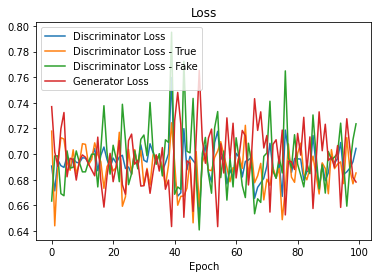

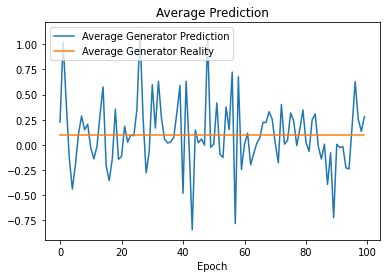

In [14]:
plotting.plots(d_loss_err, d_loss_true, d_loss_fake, g_loss_err, g_pred, g_true, fig_dir, exp_config.run.save_fig)

In [15]:
ypred_mean_gan_test, ypred_std_gan_test, ypred_gan_sample_test = cgan.sample(X_test, exp_config.training.n_samples)

1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 1ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 1ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 1ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 1ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 1ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 1ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 1ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 1ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 1ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 1ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 1ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 1ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 1ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 1ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 1ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 1ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 1ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 1ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 1ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 1ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 1ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 1ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 1ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 1ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 1ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 1ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 1ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 1ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 1ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 1ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 1ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 1ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 1ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 1ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 1ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 1ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 1ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 1ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 1ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 1ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 1ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 1ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 1ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 1ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 1ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 1ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


In [16]:
ypred_mean_gan_train, ypred_std_gan_train, ypred_gan_sample_train = cgan.sample(X_train, exp_config.training.n_samples)

  1/886 [..............................] - ETA: 21s

 41/886 [>.............................] - ETA: 1s 

 82/886 [=>............................] - ETA: 0s

122/886 [===>..........................] - ETA: 0s

163/886 [====>.........................] - ETA: 0s

202/886 [=====>........................] - ETA: 0s

242/886 [=======>......................] - ETA: 0s

284/886 [========>.....................] - ETA: 0s

326/886 [==========>...................] - ETA: 0s

367/886 [===========>..................] - ETA: 0s

409/886 [============>.................] - ETA: 0s

451/886 [==============>...............] - ETA: 0s

492/886 [===============>..............] - ETA: 0s

531/886 [================>.............] - ETA: 0s

572/886 [==================>...........] - ETA: 0s

612/886 [===================>..........] - ETA: 0s

653/886 [=====================>........] - ETA: 0s

696/886 [======================>.......] - ETA: 0s

736/886 [=======================>......] - ETA: 0s

775/886 [=========================>....] - ETA: 0s

815/886 [==========================>...] - ETA: 0s

856/886 [===========================>..] - ETA: 0s

886/886 [==============================] - 1s 1ms/step


  1/886 [..............................] - ETA: 22s

 41/886 [>.............................] - ETA: 1s 

 81/886 [=>............................] - ETA: 1s

122/886 [===>..........................] - ETA: 0s

162/886 [====>.........................] - ETA: 0s

203/886 [=====>........................] - ETA: 0s

243/886 [=======>......................] - ETA: 0s

283/886 [========>.....................] - ETA: 0s

323/886 [=========>....................] - ETA: 0s

363/886 [===========>..................] - ETA: 0s

403/886 [============>.................] - ETA: 0s

444/886 [==============>...............] - ETA: 0s

486/886 [===============>..............] - ETA: 0s

525/886 [================>.............] - ETA: 0s

568/886 [==================>...........] - ETA: 0s

610/886 [===================>..........] - ETA: 0s

652/886 [=====================>........] - ETA: 0s

694/886 [======================>.......] - ETA: 0s

737/886 [=======================>......] - ETA: 0s

778/886 [=========================>....] - ETA: 0s

819/886 [==========================>...] - ETA: 0s

861/886 [============================>.] - ETA: 0s

886/886 [==============================] - 1s 1ms/step


  1/886 [..............................] - ETA: 21s

 42/886 [>.............................] - ETA: 1s 

 84/886 [=>............................] - ETA: 0s

126/886 [===>..........................] - ETA: 0s

169/886 [====>.........................] - ETA: 0s

211/886 [======>.......................] - ETA: 0s

252/886 [=======>......................] - ETA: 0s

293/886 [========>.....................] - ETA: 0s

334/886 [==========>...................] - ETA: 0s

374/886 [===========>..................] - ETA: 0s

416/886 [=============>................] - ETA: 0s

455/886 [==============>...............] - ETA: 0s

497/886 [===============>..............] - ETA: 0s

539/886 [=================>............] - ETA: 0s

582/886 [==================>...........] - ETA: 0s

623/886 [====================>.........] - ETA: 0s

666/886 [=====================>........] - ETA: 0s

707/886 [======================>.......] - ETA: 0s

748/886 [========================>.....] - ETA: 0s

789/886 [=========================>....] - ETA: 0s

831/886 [===========================>..] - ETA: 0s

872/886 [============================>.] - ETA: 0s

886/886 [==============================] - 1s 1ms/step


  1/886 [..............................] - ETA: 22s

 42/886 [>.............................] - ETA: 1s 

 82/886 [=>............................] - ETA: 1s

124/886 [===>..........................] - ETA: 0s

166/886 [====>.........................] - ETA: 0s

208/886 [======>.......................] - ETA: 0s

248/886 [=======>......................] - ETA: 0s

289/886 [========>.....................] - ETA: 0s

329/886 [==========>...................] - ETA: 0s

370/886 [===========>..................] - ETA: 0s

412/886 [============>.................] - ETA: 0s

451/886 [==============>...............] - ETA: 0s

493/886 [===============>..............] - ETA: 0s

533/886 [=================>............] - ETA: 0s

571/886 [==================>...........] - ETA: 0s

611/886 [===================>..........] - ETA: 0s

653/886 [=====================>........] - ETA: 0s

695/886 [======================>.......] - ETA: 0s

735/886 [=======================>......] - ETA: 0s

774/886 [=========================>....] - ETA: 0s

816/886 [==========================>...] - ETA: 0s

853/886 [===========================>..] - ETA: 0s

886/886 [==============================] - 1s 1ms/step


  1/886 [..............................] - ETA: 21s

 40/886 [>.............................] - ETA: 1s 

 81/886 [=>............................] - ETA: 1s

123/886 [===>..........................] - ETA: 0s

164/886 [====>.........................] - ETA: 0s

203/886 [=====>........................] - ETA: 0s

243/886 [=======>......................] - ETA: 0s

282/886 [========>.....................] - ETA: 0s

321/886 [=========>....................] - ETA: 0s

360/886 [===========>..................] - ETA: 0s

398/886 [============>.................] - ETA: 0s

437/886 [=============>................] - ETA: 0s

477/886 [===============>..............] - ETA: 0s

518/886 [================>.............] - ETA: 0s

558/886 [=================>............] - ETA: 0s

599/886 [===================>..........] - ETA: 0s

639/886 [====================>.........] - ETA: 0s

680/886 [======================>.......] - ETA: 0s

722/886 [=======================>......] - ETA: 0s

761/886 [========================>.....] - ETA: 0s

801/886 [==========================>...] - ETA: 0s

842/886 [===========================>..] - ETA: 0s

884/886 [============================>.] - ETA: 0s

886/886 [==============================] - 1s 1ms/step


  1/886 [..............................] - ETA: 22s

 41/886 [>.............................] - ETA: 1s 

 80/886 [=>............................] - ETA: 1s

120/886 [===>..........................] - ETA: 0s

160/886 [====>.........................] - ETA: 0s

202/886 [=====>........................] - ETA: 0s

244/886 [=======>......................] - ETA: 0s

286/886 [========>.....................] - ETA: 0s

327/886 [==========>...................] - ETA: 0s

366/886 [===========>..................] - ETA: 0s

407/886 [============>.................] - ETA: 0s

449/886 [==============>...............] - ETA: 0s

489/886 [===============>..............] - ETA: 0s

531/886 [================>.............] - ETA: 0s

573/886 [==================>...........] - ETA: 0s

613/886 [===================>..........] - ETA: 0s

654/886 [=====================>........] - ETA: 0s

694/886 [======================>.......] - ETA: 0s

736/886 [=======================>......] - ETA: 0s

778/886 [=========================>....] - ETA: 0s

819/886 [==========================>...] - ETA: 0s

858/886 [============================>.] - ETA: 0s

886/886 [==============================] - 1s 1ms/step


  1/886 [..............................] - ETA: 22s

 40/886 [>.............................] - ETA: 1s 

 79/886 [=>............................] - ETA: 1s

119/886 [===>..........................] - ETA: 0s

159/886 [====>.........................] - ETA: 0s

196/886 [=====>........................] - ETA: 0s

235/886 [======>.......................] - ETA: 0s

276/886 [========>.....................] - ETA: 0s

318/886 [=========>....................] - ETA: 0s

360/886 [===========>..................] - ETA: 0s

401/886 [============>.................] - ETA: 0s

441/886 [=============>................] - ETA: 0s

481/886 [===============>..............] - ETA: 0s

522/886 [================>.............] - ETA: 0s

563/886 [==================>...........] - ETA: 0s

602/886 [===================>..........] - ETA: 0s

642/886 [====================>.........] - ETA: 0s

682/886 [======================>.......] - ETA: 0s

721/886 [=======================>......] - ETA: 0s

761/886 [========================>.....] - ETA: 0s

801/886 [==========================>...] - ETA: 0s

838/886 [===========================>..] - ETA: 0s

877/886 [============================>.] - ETA: 0s

886/886 [==============================] - 1s 1ms/step


  1/886 [..............................] - ETA: 22s

 41/886 [>.............................] - ETA: 1s 

 81/886 [=>............................] - ETA: 1s

120/886 [===>..........................] - ETA: 0s

161/886 [====>.........................] - ETA: 0s

201/886 [=====>........................] - ETA: 0s

241/886 [=======>......................] - ETA: 0s

282/886 [========>.....................] - ETA: 0s

323/886 [=========>....................] - ETA: 0s

363/886 [===========>..................] - ETA: 0s

403/886 [============>.................] - ETA: 0s

441/886 [=============>................] - ETA: 0s

480/886 [===============>..............] - ETA: 0s

519/886 [================>.............] - ETA: 0s

561/886 [=================>............] - ETA: 0s

601/886 [===================>..........] - ETA: 0s

642/886 [====================>.........] - ETA: 0s

684/886 [======================>.......] - ETA: 0s

725/886 [=======================>......] - ETA: 0s

767/886 [========================>.....] - ETA: 0s

807/886 [==========================>...] - ETA: 0s

847/886 [===========================>..] - ETA: 0s

886/886 [==============================] - 1s 1ms/step


  1/886 [..............................] - ETA: 22s

 42/886 [>.............................] - ETA: 1s 

 82/886 [=>............................] - ETA: 1s

122/886 [===>..........................] - ETA: 0s

164/886 [====>.........................] - ETA: 0s

207/886 [======>.......................] - ETA: 0s

246/886 [=======>......................] - ETA: 0s

285/886 [========>.....................] - ETA: 0s

326/886 [==========>...................] - ETA: 0s

365/886 [===========>..................] - ETA: 0s

407/886 [============>.................] - ETA: 0s

447/886 [==============>...............] - ETA: 0s

488/886 [===============>..............] - ETA: 0s

529/886 [================>.............] - ETA: 0s

569/886 [==================>...........] - ETA: 0s

608/886 [===================>..........] - ETA: 0s

647/886 [====================>.........] - ETA: 0s

685/886 [======================>.......] - ETA: 0s

723/886 [=======================>......] - ETA: 0s

763/886 [========================>.....] - ETA: 0s

803/886 [==========================>...] - ETA: 0s

843/886 [===========================>..] - ETA: 0s

883/886 [============================>.] - ETA: 0s

886/886 [==============================] - 1s 1ms/step


  1/886 [..............................] - ETA: 23s

 39/886 [>.............................] - ETA: 1s 

 78/886 [=>............................] - ETA: 1s

117/886 [==>...........................] - ETA: 1s

155/886 [====>.........................] - ETA: 0s

194/886 [=====>........................] - ETA: 0s

234/886 [======>.......................] - ETA: 0s

272/886 [========>.....................] - ETA: 0s

313/886 [=========>....................] - ETA: 0s

356/886 [===========>..................] - ETA: 0s

397/886 [============>.................] - ETA: 0s

439/886 [=============>................] - ETA: 0s

480/886 [===============>..............] - ETA: 0s

522/886 [================>.............] - ETA: 0s

564/886 [==================>...........] - ETA: 0s

605/886 [===================>..........] - ETA: 0s

647/886 [====================>.........] - ETA: 0s

689/886 [======================>.......] - ETA: 0s

730/886 [=======================>......] - ETA: 0s

770/886 [=========================>....] - ETA: 0s

810/886 [==========================>...] - ETA: 0s

852/886 [===========================>..] - ETA: 0s

886/886 [==============================] - 1s 1ms/step


  1/886 [..............................] - ETA: 21s

 40/886 [>.............................] - ETA: 1s 

 80/886 [=>............................] - ETA: 1s

121/886 [===>..........................] - ETA: 0s

164/886 [====>.........................] - ETA: 0s

206/886 [=====>........................] - ETA: 0s

246/886 [=======>......................] - ETA: 0s

289/886 [========>.....................] - ETA: 0s

330/886 [==========>...................] - ETA: 0s

372/886 [===========>..................] - ETA: 0s

413/886 [============>.................] - ETA: 0s

454/886 [==============>...............] - ETA: 0s

497/886 [===============>..............] - ETA: 0s

539/886 [=================>............] - ETA: 0s

581/886 [==================>...........] - ETA: 0s

621/886 [====================>.........] - ETA: 0s

661/886 [=====================>........] - ETA: 0s

702/886 [======================>.......] - ETA: 0s

743/886 [========================>.....] - ETA: 0s

785/886 [=========================>....] - ETA: 0s

829/886 [===========================>..] - ETA: 0s

869/886 [============================>.] - ETA: 0s

886/886 [==============================] - 1s 1ms/step


  1/886 [..............................] - ETA: 21s

 42/886 [>.............................] - ETA: 1s 

 84/886 [=>............................] - ETA: 0s

125/886 [===>..........................] - ETA: 0s

167/886 [====>.........................] - ETA: 0s

208/886 [======>.......................] - ETA: 0s

251/886 [=======>......................] - ETA: 0s

293/886 [========>.....................] - ETA: 0s

334/886 [==========>...................] - ETA: 0s

377/886 [===========>..................] - ETA: 0s

418/886 [=============>................] - ETA: 0s

458/886 [==============>...............] - ETA: 0s

497/886 [===============>..............] - ETA: 0s

536/886 [=================>............] - ETA: 0s

579/886 [==================>...........] - ETA: 0s

622/886 [====================>.........] - ETA: 0s

664/886 [=====================>........] - ETA: 0s

706/886 [======================>.......] - ETA: 0s

747/886 [========================>.....] - ETA: 0s

790/886 [=========================>....] - ETA: 0s

833/886 [===========================>..] - ETA: 0s

877/886 [============================>.] - ETA: 0s

886/886 [==============================] - 1s 1ms/step


  1/886 [..............................] - ETA: 22s

 42/886 [>.............................] - ETA: 1s 

 85/886 [=>............................] - ETA: 0s

127/886 [===>..........................] - ETA: 0s

170/886 [====>.........................] - ETA: 0s

211/886 [======>.......................] - ETA: 0s

254/886 [=======>......................] - ETA: 0s

295/886 [========>.....................] - ETA: 0s

336/886 [==========>...................] - ETA: 0s

379/886 [===========>..................] - ETA: 0s

419/886 [=============>................] - ETA: 0s

461/886 [==============>...............] - ETA: 0s

504/886 [================>.............] - ETA: 0s

542/886 [=================>............] - ETA: 0s

583/886 [==================>...........] - ETA: 0s

624/886 [====================>.........] - ETA: 0s

663/886 [=====================>........] - ETA: 0s

704/886 [======================>.......] - ETA: 0s

743/886 [========================>.....] - ETA: 0s

782/886 [=========================>....] - ETA: 0s

820/886 [==========================>...] - ETA: 0s

859/886 [============================>.] - ETA: 0s

886/886 [==============================] - 1s 1ms/step


  1/886 [..............................] - ETA: 21s

 39/886 [>.............................] - ETA: 1s 

 80/886 [=>............................] - ETA: 1s

121/886 [===>..........................] - ETA: 0s

162/886 [====>.........................] - ETA: 0s

204/886 [=====>........................] - ETA: 0s

246/886 [=======>......................] - ETA: 0s

287/886 [========>.....................] - ETA: 0s

327/886 [==========>...................] - ETA: 0s

368/886 [===========>..................] - ETA: 0s

406/886 [============>.................] - ETA: 0s

446/886 [==============>...............] - ETA: 0s

487/886 [===============>..............] - ETA: 0s

527/886 [================>.............] - ETA: 0s

567/886 [==================>...........] - ETA: 0s

609/886 [===================>..........] - ETA: 0s

650/886 [=====================>........] - ETA: 0s

693/886 [======================>.......] - ETA: 0s

735/886 [=======================>......] - ETA: 0s

777/886 [=========================>....] - ETA: 0s

819/886 [==========================>...] - ETA: 0s

861/886 [============================>.] - ETA: 0s

886/886 [==============================] - 1s 1ms/step


  1/886 [..............................] - ETA: 22s

 42/886 [>.............................] - ETA: 1s 

 83/886 [=>............................] - ETA: 0s

124/886 [===>..........................] - ETA: 0s

165/886 [====>.........................] - ETA: 0s

205/886 [=====>........................] - ETA: 0s

246/886 [=======>......................] - ETA: 0s

287/886 [========>.....................] - ETA: 0s

328/886 [==========>...................] - ETA: 0s

369/886 [===========>..................] - ETA: 0s

411/886 [============>.................] - ETA: 0s

452/886 [==============>...............] - ETA: 0s

492/886 [===============>..............] - ETA: 0s

533/886 [=================>............] - ETA: 0s

575/886 [==================>...........] - ETA: 0s

617/886 [===================>..........] - ETA: 0s

657/886 [=====================>........] - ETA: 0s

697/886 [======================>.......] - ETA: 0s

738/886 [=======================>......] - ETA: 0s

778/886 [=========================>....] - ETA: 0s

820/886 [==========================>...] - ETA: 0s

862/886 [============================>.] - ETA: 0s

886/886 [==============================] - 1s 1ms/step


  1/886 [..............................] - ETA: 21s

 41/886 [>.............................] - ETA: 1s 

 82/886 [=>............................] - ETA: 1s

122/886 [===>..........................] - ETA: 0s

163/886 [====>.........................] - ETA: 0s

202/886 [=====>........................] - ETA: 0s

242/886 [=======>......................] - ETA: 0s

283/886 [========>.....................] - ETA: 0s

323/886 [=========>....................] - ETA: 0s

364/886 [===========>..................] - ETA: 0s

405/886 [============>.................] - ETA: 0s

446/886 [==============>...............] - ETA: 0s

486/886 [===============>..............] - ETA: 0s

527/886 [================>.............] - ETA: 0s

570/886 [==================>...........] - ETA: 0s

610/886 [===================>..........] - ETA: 0s

650/886 [=====================>........] - ETA: 0s

692/886 [======================>.......] - ETA: 0s

732/886 [=======================>......] - ETA: 0s

774/886 [=========================>....] - ETA: 0s

815/886 [==========================>...] - ETA: 0s

857/886 [============================>.] - ETA: 0s

886/886 [==============================] - 1s 1ms/step


  1/886 [..............................] - ETA: 21s

 41/886 [>.............................] - ETA: 1s 

 84/886 [=>............................] - ETA: 0s

124/886 [===>..........................] - ETA: 0s

165/886 [====>.........................] - ETA: 0s

206/886 [=====>........................] - ETA: 0s

247/886 [=======>......................] - ETA: 0s

288/886 [========>.....................] - ETA: 0s

328/886 [==========>...................] - ETA: 0s

370/886 [===========>..................] - ETA: 0s

408/886 [============>.................] - ETA: 0s

448/886 [==============>...............] - ETA: 0s

490/886 [===============>..............] - ETA: 0s

530/886 [================>.............] - ETA: 0s

570/886 [==================>...........] - ETA: 0s

609/886 [===================>..........] - ETA: 0s

647/886 [====================>.........] - ETA: 0s

686/886 [======================>.......] - ETA: 0s

727/886 [=======================>......] - ETA: 0s

769/886 [=========================>....] - ETA: 0s

811/886 [==========================>...] - ETA: 0s

853/886 [===========================>..] - ETA: 0s

886/886 [==============================] - 1s 1ms/step


  1/886 [..............................] - ETA: 21s

 39/886 [>.............................] - ETA: 1s 

 79/886 [=>............................] - ETA: 1s

121/886 [===>..........................] - ETA: 0s

162/886 [====>.........................] - ETA: 0s

203/886 [=====>........................] - ETA: 0s

246/886 [=======>......................] - ETA: 0s

288/886 [========>.....................] - ETA: 0s

331/886 [==========>...................] - ETA: 0s

371/886 [===========>..................] - ETA: 0s

413/886 [============>.................] - ETA: 0s

454/886 [==============>...............] - ETA: 0s

494/886 [===============>..............] - ETA: 0s

532/886 [=================>............] - ETA: 0s

571/886 [==================>...........] - ETA: 0s

611/886 [===================>..........] - ETA: 0s

646/886 [====================>.........] - ETA: 0s

684/886 [======================>.......] - ETA: 0s

724/886 [=======================>......] - ETA: 0s

757/886 [========================>.....] - ETA: 0s

797/886 [=========================>....] - ETA: 0s

837/886 [===========================>..] - ETA: 0s

878/886 [============================>.] - ETA: 0s

886/886 [==============================] - 1s 1ms/step


  1/886 [..............................] - ETA: 23s

 39/886 [>.............................] - ETA: 1s 

 79/886 [=>............................] - ETA: 1s

118/886 [==>...........................] - ETA: 1s

159/886 [====>.........................] - ETA: 0s

200/886 [=====>........................] - ETA: 0s

240/886 [=======>......................] - ETA: 0s

281/886 [========>.....................] - ETA: 0s

321/886 [=========>....................] - ETA: 0s

361/886 [===========>..................] - ETA: 0s

402/886 [============>.................] - ETA: 0s

443/886 [==============>...............] - ETA: 0s

483/886 [===============>..............] - ETA: 0s

523/886 [================>.............] - ETA: 0s

565/886 [==================>...........] - ETA: 0s

606/886 [===================>..........] - ETA: 0s

649/886 [====================>.........] - ETA: 0s

689/886 [======================>.......] - ETA: 0s

727/886 [=======================>......] - ETA: 0s

765/886 [========================>.....] - ETA: 0s

806/886 [==========================>...] - ETA: 0s

847/886 [===========================>..] - ETA: 0s

886/886 [==============================] - 1s 1ms/step


  1/886 [..............................] - ETA: 21s

 41/886 [>.............................] - ETA: 1s 

 83/886 [=>............................] - ETA: 0s

123/886 [===>..........................] - ETA: 0s

162/886 [====>.........................] - ETA: 0s

202/886 [=====>........................] - ETA: 0s

241/886 [=======>......................] - ETA: 0s

281/886 [========>.....................] - ETA: 0s

322/886 [=========>....................] - ETA: 0s

362/886 [===========>..................] - ETA: 0s

403/886 [============>.................] - ETA: 0s

444/886 [==============>...............] - ETA: 0s

485/886 [===============>..............] - ETA: 0s

526/886 [================>.............] - ETA: 0s

567/886 [==================>...........] - ETA: 0s

607/886 [===================>..........] - ETA: 0s

647/886 [====================>.........] - ETA: 0s

688/886 [======================>.......] - ETA: 0s

729/886 [=======================>......] - ETA: 0s

770/886 [=========================>....] - ETA: 0s

812/886 [==========================>...] - ETA: 0s

852/886 [===========================>..] - ETA: 0s

886/886 [==============================] - 1s 1ms/step


  1/886 [..............................] - ETA: 21s

 40/886 [>.............................] - ETA: 1s 

 80/886 [=>............................] - ETA: 1s

121/886 [===>..........................] - ETA: 0s

161/886 [====>.........................] - ETA: 0s

200/886 [=====>........................] - ETA: 0s

240/886 [=======>......................] - ETA: 0s

279/886 [========>.....................] - ETA: 0s

319/886 [=========>....................] - ETA: 0s

361/886 [===========>..................] - ETA: 0s

401/886 [============>.................] - ETA: 0s

442/886 [=============>................] - ETA: 0s

483/886 [===============>..............] - ETA: 0s

525/886 [================>.............] - ETA: 0s

565/886 [==================>...........] - ETA: 0s

605/886 [===================>..........] - ETA: 0s

646/886 [====================>.........] - ETA: 0s

686/886 [======================>.......] - ETA: 0s

727/886 [=======================>......] - ETA: 0s

768/886 [=========================>....] - ETA: 0s

808/886 [==========================>...] - ETA: 0s

849/886 [===========================>..] - ETA: 0s

886/886 [==============================] - 1s 1ms/step


  1/886 [..............................] - ETA: 23s

 39/886 [>.............................] - ETA: 1s 

 76/886 [=>............................] - ETA: 1s

114/886 [==>...........................] - ETA: 1s

153/886 [====>.........................] - ETA: 0s

193/886 [=====>........................] - ETA: 0s

231/886 [======>.......................] - ETA: 0s

270/886 [========>.....................] - ETA: 0s

310/886 [=========>....................] - ETA: 0s

349/886 [==========>...................] - ETA: 0s

390/886 [============>.................] - ETA: 0s

430/886 [=============>................] - ETA: 0s

472/886 [==============>...............] - ETA: 0s

511/886 [================>.............] - ETA: 0s

549/886 [=================>............] - ETA: 0s

590/886 [==================>...........] - ETA: 0s

631/886 [====================>.........] - ETA: 0s

671/886 [=====================>........] - ETA: 0s

711/886 [=======================>......] - ETA: 0s

753/886 [========================>.....] - ETA: 0s

793/886 [=========================>....] - ETA: 0s

833/886 [===========================>..] - ETA: 0s

873/886 [============================>.] - ETA: 0s

886/886 [==============================] - 1s 1ms/step


  1/886 [..............................] - ETA: 21s

 41/886 [>.............................] - ETA: 1s 

 83/886 [=>............................] - ETA: 0s

127/886 [===>..........................] - ETA: 0s

167/886 [====>.........................] - ETA: 0s

209/886 [======>.......................] - ETA: 0s

252/886 [=======>......................] - ETA: 0s

296/886 [=========>....................] - ETA: 0s

339/886 [==========>...................] - ETA: 0s

380/886 [===========>..................] - ETA: 0s

423/886 [=============>................] - ETA: 0s

465/886 [==============>...............] - ETA: 0s

509/886 [================>.............] - ETA: 0s

551/886 [=================>............] - ETA: 0s

592/886 [===================>..........] - ETA: 0s

631/886 [====================>.........] - ETA: 0s

670/886 [=====================>........] - ETA: 0s

711/886 [=======================>......] - ETA: 0s

752/886 [========================>.....] - ETA: 0s

793/886 [=========================>....] - ETA: 0s

834/886 [===========================>..] - ETA: 0s

874/886 [============================>.] - ETA: 0s

886/886 [==============================] - 1s 1ms/step


  1/886 [..............................] - ETA: 21s

 42/886 [>.............................] - ETA: 1s 

 84/886 [=>............................] - ETA: 0s

126/886 [===>..........................] - ETA: 0s

167/886 [====>.........................] - ETA: 0s

208/886 [======>.......................] - ETA: 0s

248/886 [=======>......................] - ETA: 0s

289/886 [========>.....................] - ETA: 0s

329/886 [==========>...................] - ETA: 0s

370/886 [===========>..................] - ETA: 0s

411/886 [============>.................] - ETA: 0s

451/886 [==============>...............] - ETA: 0s

490/886 [===============>..............] - ETA: 0s

531/886 [================>.............] - ETA: 0s

573/886 [==================>...........] - ETA: 0s

614/886 [===================>..........] - ETA: 0s

652/886 [=====================>........] - ETA: 0s

690/886 [======================>.......] - ETA: 0s

733/886 [=======================>......] - ETA: 0s

772/886 [=========================>....] - ETA: 0s

811/886 [==========================>...] - ETA: 0s

853/886 [===========================>..] - ETA: 0s

886/886 [==============================] - 1s 1ms/step


  1/886 [..............................] - ETA: 22s

 40/886 [>.............................] - ETA: 1s 

 81/886 [=>............................] - ETA: 1s

123/886 [===>..........................] - ETA: 0s

164/886 [====>.........................] - ETA: 0s

205/886 [=====>........................] - ETA: 0s

244/886 [=======>......................] - ETA: 0s

285/886 [========>.....................] - ETA: 0s

325/886 [==========>...................] - ETA: 0s

366/886 [===========>..................] - ETA: 0s

406/886 [============>.................] - ETA: 0s

447/886 [==============>...............] - ETA: 0s

489/886 [===============>..............] - ETA: 0s

531/886 [================>.............] - ETA: 0s

574/886 [==================>...........] - ETA: 0s

616/886 [===================>..........] - ETA: 0s

657/886 [=====================>........] - ETA: 0s

699/886 [======================>.......] - ETA: 0s

740/886 [========================>.....] - ETA: 0s

781/886 [=========================>....] - ETA: 0s

822/886 [==========================>...] - ETA: 0s

863/886 [============================>.] - ETA: 0s

886/886 [==============================] - 1s 1ms/step


  1/886 [..............................] - ETA: 21s

 41/886 [>.............................] - ETA: 1s 

 83/886 [=>............................] - ETA: 0s

124/886 [===>..........................] - ETA: 0s

166/886 [====>.........................] - ETA: 0s

207/886 [======>.......................] - ETA: 0s

248/886 [=======>......................] - ETA: 0s

291/886 [========>.....................] - ETA: 0s

332/886 [==========>...................] - ETA: 0s

374/886 [===========>..................] - ETA: 0s

416/886 [=============>................] - ETA: 0s

459/886 [==============>...............] - ETA: 0s

499/886 [===============>..............] - ETA: 0s

539/886 [=================>............] - ETA: 0s

579/886 [==================>...........] - ETA: 0s

619/886 [===================>..........] - ETA: 0s

661/886 [=====================>........] - ETA: 0s

703/886 [======================>.......] - ETA: 0s

744/886 [========================>.....] - ETA: 0s

786/886 [=========================>....] - ETA: 0s

826/886 [==========================>...] - ETA: 0s

867/886 [============================>.] - ETA: 0s

886/886 [==============================] - 1s 1ms/step


  1/886 [..............................] - ETA: 22s

 40/886 [>.............................] - ETA: 1s 

 80/886 [=>............................] - ETA: 1s

120/886 [===>..........................] - ETA: 0s

160/886 [====>.........................] - ETA: 0s

201/886 [=====>........................] - ETA: 0s

243/886 [=======>......................] - ETA: 0s

285/886 [========>.....................] - ETA: 0s

326/886 [==========>...................] - ETA: 0s

366/886 [===========>..................] - ETA: 0s

405/886 [============>.................] - ETA: 0s

447/886 [==============>...............] - ETA: 0s

487/886 [===============>..............] - ETA: 0s

528/886 [================>.............] - ETA: 0s

569/886 [==================>...........] - ETA: 0s

611/886 [===================>..........] - ETA: 0s

654/886 [=====================>........] - ETA: 0s

694/886 [======================>.......] - ETA: 0s

735/886 [=======================>......] - ETA: 0s

777/886 [=========================>....] - ETA: 0s

817/886 [==========================>...] - ETA: 0s

856/886 [===========================>..] - ETA: 0s

886/886 [==============================] - 1s 1ms/step


  1/886 [..............................] - ETA: 23s

 39/886 [>.............................] - ETA: 1s 

 78/886 [=>............................] - ETA: 1s

117/886 [==>...........................] - ETA: 1s

157/886 [====>.........................] - ETA: 0s

199/886 [=====>........................] - ETA: 0s

240/886 [=======>......................] - ETA: 0s

280/886 [========>.....................] - ETA: 0s

321/886 [=========>....................] - ETA: 0s

363/886 [===========>..................] - ETA: 0s

403/886 [============>.................] - ETA: 0s

445/886 [==============>...............] - ETA: 0s

487/886 [===============>..............] - ETA: 0s

529/886 [================>.............] - ETA: 0s

570/886 [==================>...........] - ETA: 0s

613/886 [===================>..........] - ETA: 0s

657/886 [=====================>........] - ETA: 0s

698/886 [======================>.......] - ETA: 0s

739/886 [========================>.....] - ETA: 0s

780/886 [=========================>....] - ETA: 0s

820/886 [==========================>...] - ETA: 0s

860/886 [============================>.] - ETA: 0s

886/886 [==============================] - 1s 1ms/step


  1/886 [..............................] - ETA: 21s

 40/886 [>.............................] - ETA: 1s 

 80/886 [=>............................] - ETA: 1s

121/886 [===>..........................] - ETA: 0s

162/886 [====>.........................] - ETA: 0s

202/886 [=====>........................] - ETA: 0s

242/886 [=======>......................] - ETA: 0s

281/886 [========>.....................] - ETA: 0s

321/886 [=========>....................] - ETA: 0s

360/886 [===========>..................] - ETA: 0s

395/886 [============>.................] - ETA: 0s

436/886 [=============>................] - ETA: 0s

478/886 [===============>..............] - ETA: 0s

520/886 [================>.............] - ETA: 0s

560/886 [=================>............] - ETA: 0s

601/886 [===================>..........] - ETA: 0s

642/886 [====================>.........] - ETA: 0s

682/886 [======================>.......] - ETA: 0s

722/886 [=======================>......] - ETA: 0s

763/886 [========================>.....] - ETA: 0s

803/886 [==========================>...] - ETA: 0s

845/886 [===========================>..] - ETA: 0s

885/886 [============================>.] - ETA: 0s

886/886 [==============================] - 1s 1ms/step


  1/886 [..............................] - ETA: 21s

 40/886 [>.............................] - ETA: 1s 

 81/886 [=>............................] - ETA: 1s

123/886 [===>..........................] - ETA: 0s

165/886 [====>.........................] - ETA: 0s

207/886 [======>.......................] - ETA: 0s

247/886 [=======>......................] - ETA: 0s

288/886 [========>.....................] - ETA: 0s

328/886 [==========>...................] - ETA: 0s

369/886 [===========>..................] - ETA: 0s

410/886 [============>.................] - ETA: 0s

451/886 [==============>...............] - ETA: 0s

494/886 [===============>..............] - ETA: 0s

532/886 [=================>............] - ETA: 0s

571/886 [==================>...........] - ETA: 0s

609/886 [===================>..........] - ETA: 0s

649/886 [====================>.........] - ETA: 0s

691/886 [======================>.......] - ETA: 0s

731/886 [=======================>......] - ETA: 0s

773/886 [=========================>....] - ETA: 0s

812/886 [==========================>...] - ETA: 0s

853/886 [===========================>..] - ETA: 0s

886/886 [==============================] - 1s 1ms/step


  1/886 [..............................] - ETA: 22s

 40/886 [>.............................] - ETA: 1s 

 80/886 [=>............................] - ETA: 1s

120/886 [===>..........................] - ETA: 0s

161/886 [====>.........................] - ETA: 0s

203/886 [=====>........................] - ETA: 0s

243/886 [=======>......................] - ETA: 0s

284/886 [========>.....................] - ETA: 0s

324/886 [=========>....................] - ETA: 0s

364/886 [===========>..................] - ETA: 0s

404/886 [============>.................] - ETA: 0s

444/886 [==============>...............] - ETA: 0s

486/886 [===============>..............] - ETA: 0s

529/886 [================>.............] - ETA: 0s

570/886 [==================>...........] - ETA: 0s

613/886 [===================>..........] - ETA: 0s

653/886 [=====================>........] - ETA: 0s

694/886 [======================>.......] - ETA: 0s

735/886 [=======================>......] - ETA: 0s

774/886 [=========================>....] - ETA: 0s

814/886 [==========================>...] - ETA: 0s

856/886 [===========================>..] - ETA: 0s

886/886 [==============================] - 1s 1ms/step


  1/886 [..............................] - ETA: 21s

 40/886 [>.............................] - ETA: 1s 

 81/886 [=>............................] - ETA: 1s

122/886 [===>..........................] - ETA: 0s

162/886 [====>.........................] - ETA: 0s

204/886 [=====>........................] - ETA: 0s

245/886 [=======>......................] - ETA: 0s

285/886 [========>.....................] - ETA: 0s

324/886 [=========>....................] - ETA: 0s

366/886 [===========>..................] - ETA: 0s

408/886 [============>.................] - ETA: 0s

449/886 [==============>...............] - ETA: 0s

492/886 [===============>..............] - ETA: 0s

535/886 [=================>............] - ETA: 0s

575/886 [==================>...........] - ETA: 0s

616/886 [===================>..........] - ETA: 0s

655/886 [=====================>........] - ETA: 0s

694/886 [======================>.......] - ETA: 0s

733/886 [=======================>......] - ETA: 0s

772/886 [=========================>....] - ETA: 0s

811/886 [==========================>...] - ETA: 0s

850/886 [===========================>..] - ETA: 0s

886/886 [==============================] - 1s 1ms/step


  1/886 [..............................] - ETA: 22s

 39/886 [>.............................] - ETA: 1s 

 79/886 [=>............................] - ETA: 1s

120/886 [===>..........................] - ETA: 0s

162/886 [====>.........................] - ETA: 0s

205/886 [=====>........................] - ETA: 0s

245/886 [=======>......................] - ETA: 0s

285/886 [========>.....................] - ETA: 0s

326/886 [==========>...................] - ETA: 0s

368/886 [===========>..................] - ETA: 0s

410/886 [============>.................] - ETA: 0s

452/886 [==============>...............] - ETA: 0s

493/886 [===============>..............] - ETA: 0s

532/886 [=================>............] - ETA: 0s

574/886 [==================>...........] - ETA: 0s

615/886 [===================>..........] - ETA: 0s

656/886 [=====================>........] - ETA: 0s

696/886 [======================>.......] - ETA: 0s

737/886 [=======================>......] - ETA: 0s

778/886 [=========================>....] - ETA: 0s

818/886 [==========================>...] - ETA: 0s

859/886 [============================>.] - ETA: 0s

886/886 [==============================] - 1s 1ms/step


  1/886 [..............................] - ETA: 22s

 41/886 [>.............................] - ETA: 1s 

 81/886 [=>............................] - ETA: 1s

122/886 [===>..........................] - ETA: 0s

163/886 [====>.........................] - ETA: 0s

201/886 [=====>........................] - ETA: 0s

243/886 [=======>......................] - ETA: 0s

283/886 [========>.....................] - ETA: 0s

323/886 [=========>....................] - ETA: 0s

363/886 [===========>..................] - ETA: 0s

404/886 [============>.................] - ETA: 0s

445/886 [==============>...............] - ETA: 0s

488/886 [===============>..............] - ETA: 0s

531/886 [================>.............] - ETA: 0s

572/886 [==================>...........] - ETA: 0s

614/886 [===================>..........] - ETA: 0s

654/886 [=====================>........] - ETA: 0s

695/886 [======================>.......] - ETA: 0s

736/886 [=======================>......] - ETA: 0s

778/886 [=========================>....] - ETA: 0s

819/886 [==========================>...] - ETA: 0s

860/886 [============================>.] - ETA: 0s

886/886 [==============================] - 1s 1ms/step


  1/886 [..............................] - ETA: 20s

 41/886 [>.............................] - ETA: 1s 

 83/886 [=>............................] - ETA: 0s

125/886 [===>..........................] - ETA: 0s

166/886 [====>.........................] - ETA: 0s

206/886 [=====>........................] - ETA: 0s

246/886 [=======>......................] - ETA: 0s

285/886 [========>.....................] - ETA: 0s

326/886 [==========>...................] - ETA: 0s

366/886 [===========>..................] - ETA: 0s

407/886 [============>.................] - ETA: 0s

448/886 [==============>...............] - ETA: 0s

488/886 [===============>..............] - ETA: 0s

530/886 [================>.............] - ETA: 0s

572/886 [==================>...........] - ETA: 0s

614/886 [===================>..........] - ETA: 0s

654/886 [=====================>........] - ETA: 0s

695/886 [======================>.......] - ETA: 0s

736/886 [=======================>......] - ETA: 0s

775/886 [=========================>....] - ETA: 0s

817/886 [==========================>...] - ETA: 0s

859/886 [============================>.] - ETA: 0s

886/886 [==============================] - 1s 1ms/step


  1/886 [..............................] - ETA: 21s

 40/886 [>.............................] - ETA: 1s 

 79/886 [=>............................] - ETA: 1s

117/886 [==>...........................] - ETA: 1s

152/886 [====>.........................] - ETA: 0s

190/886 [=====>........................] - ETA: 0s

231/886 [======>.......................] - ETA: 0s

270/886 [========>.....................] - ETA: 0s

312/886 [=========>....................] - ETA: 0s

354/886 [==========>...................] - ETA: 0s

390/886 [============>.................] - ETA: 0s

431/886 [=============>................] - ETA: 0s

472/886 [==============>...............] - ETA: 0s

512/886 [================>.............] - ETA: 0s

553/886 [=================>............] - ETA: 0s

594/886 [===================>..........] - ETA: 0s

633/886 [====================>.........] - ETA: 0s

674/886 [=====================>........] - ETA: 0s

716/886 [=======================>......] - ETA: 0s

756/886 [========================>.....] - ETA: 0s

798/886 [==========================>...] - ETA: 0s

839/886 [===========================>..] - ETA: 0s

880/886 [============================>.] - ETA: 0s

886/886 [==============================] - 1s 1ms/step


  1/886 [..............................] - ETA: 23s

 39/886 [>.............................] - ETA: 1s 

 78/886 [=>............................] - ETA: 1s

120/886 [===>..........................] - ETA: 0s

161/886 [====>.........................] - ETA: 0s

202/886 [=====>........................] - ETA: 0s

245/886 [=======>......................] - ETA: 0s

287/886 [========>.....................] - ETA: 0s

328/886 [==========>...................] - ETA: 0s

369/886 [===========>..................] - ETA: 0s

407/886 [============>.................] - ETA: 0s

448/886 [==============>...............] - ETA: 0s

490/886 [===============>..............] - ETA: 0s

532/886 [=================>............] - ETA: 0s

573/886 [==================>...........] - ETA: 0s

611/886 [===================>..........] - ETA: 0s

649/886 [====================>.........] - ETA: 0s

687/886 [======================>.......] - ETA: 0s

729/886 [=======================>......] - ETA: 0s

769/886 [=========================>....] - ETA: 0s

810/886 [==========================>...] - ETA: 0s

849/886 [===========================>..] - ETA: 0s

886/886 [==============================] - 1s 1ms/step


  1/886 [..............................] - ETA: 20s

 40/886 [>.............................] - ETA: 1s 

 81/886 [=>............................] - ETA: 1s

122/886 [===>..........................] - ETA: 0s

164/886 [====>.........................] - ETA: 0s

203/886 [=====>........................] - ETA: 0s

244/886 [=======>......................] - ETA: 0s

285/886 [========>.....................] - ETA: 0s

328/886 [==========>...................] - ETA: 0s

368/886 [===========>..................] - ETA: 0s

408/886 [============>.................] - ETA: 0s

451/886 [==============>...............] - ETA: 0s

491/886 [===============>..............] - ETA: 0s

533/886 [=================>............] - ETA: 0s

573/886 [==================>...........] - ETA: 0s

613/886 [===================>..........] - ETA: 0s

653/886 [=====================>........] - ETA: 0s

693/886 [======================>.......] - ETA: 0s

733/886 [=======================>......] - ETA: 0s

774/886 [=========================>....] - ETA: 0s

815/886 [==========================>...] - ETA: 0s

856/886 [===========================>..] - ETA: 0s

886/886 [==============================] - 1s 1ms/step


  1/886 [..............................] - ETA: 23s

 40/886 [>.............................] - ETA: 1s 

 82/886 [=>............................] - ETA: 1s

121/886 [===>..........................] - ETA: 0s

163/886 [====>.........................] - ETA: 0s

205/886 [=====>........................] - ETA: 0s

246/886 [=======>......................] - ETA: 0s

286/886 [========>.....................] - ETA: 0s

329/886 [==========>...................] - ETA: 0s

369/886 [===========>..................] - ETA: 0s

410/886 [============>.................] - ETA: 0s

450/886 [==============>...............] - ETA: 0s

491/886 [===============>..............] - ETA: 0s

532/886 [=================>............] - ETA: 0s

573/886 [==================>...........] - ETA: 0s

614/886 [===================>..........] - ETA: 0s

656/886 [=====================>........] - ETA: 0s

696/886 [======================>.......] - ETA: 0s

736/886 [=======================>......] - ETA: 0s

776/886 [=========================>....] - ETA: 0s

817/886 [==========================>...] - ETA: 0s

858/886 [============================>.] - ETA: 0s

886/886 [==============================] - 1s 1ms/step


  1/886 [..............................] - ETA: 22s

 40/886 [>.............................] - ETA: 1s 

 81/886 [=>............................] - ETA: 1s

121/886 [===>..........................] - ETA: 0s

161/886 [====>.........................] - ETA: 0s

202/886 [=====>........................] - ETA: 0s

244/886 [=======>......................] - ETA: 0s

285/886 [========>.....................] - ETA: 0s

327/886 [==========>...................] - ETA: 0s

367/886 [===========>..................] - ETA: 0s

409/886 [============>.................] - ETA: 0s

449/886 [==============>...............] - ETA: 0s

493/886 [===============>..............] - ETA: 0s

534/886 [=================>............] - ETA: 0s

574/886 [==================>...........] - ETA: 0s

616/886 [===================>..........] - ETA: 0s

656/886 [=====================>........] - ETA: 0s

698/886 [======================>.......] - ETA: 0s

739/886 [========================>.....] - ETA: 0s

779/886 [=========================>....] - ETA: 0s

820/886 [==========================>...] - ETA: 0s

860/886 [============================>.] - ETA: 0s

886/886 [==============================] - 1s 1ms/step


  1/886 [..............................] - ETA: 21s

 41/886 [>.............................] - ETA: 1s 

 84/886 [=>............................] - ETA: 0s

127/886 [===>..........................] - ETA: 0s

168/886 [====>.........................] - ETA: 0s

210/886 [======>.......................] - ETA: 0s

252/886 [=======>......................] - ETA: 0s

293/886 [========>.....................] - ETA: 0s

335/886 [==========>...................] - ETA: 0s

375/886 [===========>..................] - ETA: 0s

416/886 [=============>................] - ETA: 0s

456/886 [==============>...............] - ETA: 0s

499/886 [===============>..............] - ETA: 0s

542/886 [=================>............] - ETA: 0s

585/886 [==================>...........] - ETA: 0s

625/886 [====================>.........] - ETA: 0s

666/886 [=====================>........] - ETA: 0s

706/886 [======================>.......] - ETA: 0s

746/886 [========================>.....] - ETA: 0s

785/886 [=========================>....] - ETA: 0s

825/886 [==========================>...] - ETA: 0s

866/886 [============================>.] - ETA: 0s

886/886 [==============================] - 1s 1ms/step


  1/886 [..............................] - ETA: 21s

 40/886 [>.............................] - ETA: 1s 

 80/886 [=>............................] - ETA: 1s

121/886 [===>..........................] - ETA: 0s

161/886 [====>.........................] - ETA: 0s

200/886 [=====>........................] - ETA: 0s

242/886 [=======>......................] - ETA: 0s

286/886 [========>.....................] - ETA: 0s

328/886 [==========>...................] - ETA: 0s

368/886 [===========>..................] - ETA: 0s

409/886 [============>.................] - ETA: 0s

449/886 [==============>...............] - ETA: 0s

489/886 [===============>..............] - ETA: 0s

530/886 [================>.............] - ETA: 0s

571/886 [==================>...........] - ETA: 0s

612/886 [===================>..........] - ETA: 0s

651/886 [=====================>........] - ETA: 0s

692/886 [======================>.......] - ETA: 0s

733/886 [=======================>......] - ETA: 0s

774/886 [=========================>....] - ETA: 0s

816/886 [==========================>...] - ETA: 0s

855/886 [===========================>..] - ETA: 0s

886/886 [==============================] - 1s 1ms/step


  1/886 [..............................] - ETA: 22s

 38/886 [>.............................] - ETA: 1s 

 79/886 [=>............................] - ETA: 1s

119/886 [===>..........................] - ETA: 0s

159/886 [====>.........................] - ETA: 0s

200/886 [=====>........................] - ETA: 0s

240/886 [=======>......................] - ETA: 0s

279/886 [========>.....................] - ETA: 0s

320/886 [=========>....................] - ETA: 0s

357/886 [===========>..................] - ETA: 0s

397/886 [============>.................] - ETA: 0s

438/886 [=============>................] - ETA: 0s

476/886 [===============>..............] - ETA: 0s

516/886 [================>.............] - ETA: 0s

556/886 [=================>............] - ETA: 0s

594/886 [===================>..........] - ETA: 0s

635/886 [====================>.........] - ETA: 0s

675/886 [=====================>........] - ETA: 0s

715/886 [=======================>......] - ETA: 0s

753/886 [========================>.....] - ETA: 0s

792/886 [=========================>....] - ETA: 0s

832/886 [===========================>..] - ETA: 0s

868/886 [============================>.] - ETA: 0s

886/886 [==============================] - 1s 1ms/step


  1/886 [..............................] - ETA: 22s

 40/886 [>.............................] - ETA: 1s 

 81/886 [=>............................] - ETA: 1s

121/886 [===>..........................] - ETA: 0s

160/886 [====>.........................] - ETA: 0s

201/886 [=====>........................] - ETA: 0s

242/886 [=======>......................] - ETA: 0s

284/886 [========>.....................] - ETA: 0s

323/886 [=========>....................] - ETA: 0s

363/886 [===========>..................] - ETA: 0s

403/886 [============>.................] - ETA: 0s

445/886 [==============>...............] - ETA: 0s

487/886 [===============>..............] - ETA: 0s

528/886 [================>.............] - ETA: 0s

569/886 [==================>...........] - ETA: 0s

611/886 [===================>..........] - ETA: 0s

650/886 [=====================>........] - ETA: 0s

689/886 [======================>.......] - ETA: 0s

730/886 [=======================>......] - ETA: 0s

768/886 [=========================>....] - ETA: 0s

808/886 [==========================>...] - ETA: 0s

849/886 [===========================>..] - ETA: 0s

886/886 [==============================] - 1s 1ms/step


  1/886 [..............................] - ETA: 21s

 41/886 [>.............................] - ETA: 1s 

 81/886 [=>............................] - ETA: 1s

122/886 [===>..........................] - ETA: 0s

163/886 [====>.........................] - ETA: 0s

204/886 [=====>........................] - ETA: 0s

244/886 [=======>......................] - ETA: 0s

284/886 [========>.....................] - ETA: 0s

323/886 [=========>....................] - ETA: 0s

364/886 [===========>..................] - ETA: 0s

405/886 [============>.................] - ETA: 0s

445/886 [==============>...............] - ETA: 0s

486/886 [===============>..............] - ETA: 0s

527/886 [================>.............] - ETA: 0s

567/886 [==================>...........] - ETA: 0s

606/886 [===================>..........] - ETA: 0s

647/886 [====================>.........] - ETA: 0s

689/886 [======================>.......] - ETA: 0s

732/886 [=======================>......] - ETA: 0s

774/886 [=========================>....] - ETA: 0s

815/886 [==========================>...] - ETA: 0s

855/886 [===========================>..] - ETA: 0s

886/886 [==============================] - 1s 1ms/step


  1/886 [..............................] - ETA: 28s

 40/886 [>.............................] - ETA: 1s 

 79/886 [=>............................] - ETA: 1s

118/886 [==>...........................] - ETA: 0s

157/886 [====>.........................] - ETA: 0s

198/886 [=====>........................] - ETA: 0s

235/886 [======>.......................] - ETA: 0s

275/886 [========>.....................] - ETA: 0s

315/886 [=========>....................] - ETA: 0s

355/886 [===========>..................] - ETA: 0s

394/886 [============>.................] - ETA: 0s

433/886 [=============>................] - ETA: 0s

473/886 [===============>..............] - ETA: 0s

512/886 [================>.............] - ETA: 0s

553/886 [=================>............] - ETA: 0s

593/886 [===================>..........] - ETA: 0s

633/886 [====================>.........] - ETA: 0s

673/886 [=====================>........] - ETA: 0s

713/886 [=======================>......] - ETA: 0s

755/886 [========================>.....] - ETA: 0s

794/886 [=========================>....] - ETA: 0s

835/886 [===========================>..] - ETA: 0s

876/886 [============================>.] - ETA: 0s

886/886 [==============================] - 1s 1ms/step


  1/886 [..............................] - ETA: 32s

 39/886 [>.............................] - ETA: 1s 

 78/886 [=>............................] - ETA: 1s

118/886 [==>...........................] - ETA: 0s

158/886 [====>.........................] - ETA: 0s

199/886 [=====>........................] - ETA: 0s

240/886 [=======>......................] - ETA: 0s

280/886 [========>.....................] - ETA: 0s

319/886 [=========>....................] - ETA: 0s

358/886 [===========>..................] - ETA: 0s

397/886 [============>.................] - ETA: 0s

436/886 [=============>................] - ETA: 0s

476/886 [===============>..............] - ETA: 0s

518/886 [================>.............] - ETA: 0s

558/886 [=================>............] - ETA: 0s

597/886 [===================>..........] - ETA: 0s

639/886 [====================>.........] - ETA: 0s

680/886 [======================>.......] - ETA: 0s

717/886 [=======================>......] - ETA: 0s

756/886 [========================>.....] - ETA: 0s

795/886 [=========================>....] - ETA: 0s

834/886 [===========================>..] - ETA: 0s

874/886 [============================>.] - ETA: 0s

886/886 [==============================] - 1s 1ms/step


  1/886 [..............................] - ETA: 30s

 37/886 [>.............................] - ETA: 1s 

 76/886 [=>............................] - ETA: 1s

116/886 [==>...........................] - ETA: 1s

155/886 [====>.........................] - ETA: 0s

194/886 [=====>........................] - ETA: 0s

234/886 [======>.......................] - ETA: 0s

273/886 [========>.....................] - ETA: 0s

313/886 [=========>....................] - ETA: 0s

351/886 [==========>...................] - ETA: 0s

391/886 [============>.................] - ETA: 0s

430/886 [=============>................] - ETA: 0s

469/886 [==============>...............] - ETA: 0s

507/886 [================>.............] - ETA: 0s

546/886 [=================>............] - ETA: 0s

583/886 [==================>...........] - ETA: 0s

622/886 [====================>.........] - ETA: 0s

661/886 [=====================>........] - ETA: 0s

700/886 [======================>.......] - ETA: 0s

740/886 [========================>.....] - ETA: 0s

779/886 [=========================>....] - ETA: 0s

819/886 [==========================>...] - ETA: 0s

860/886 [============================>.] - ETA: 0s

886/886 [==============================] - 1s 1ms/step


  1/886 [..............................] - ETA: 30s

 40/886 [>.............................] - ETA: 1s 

 79/886 [=>............................] - ETA: 1s

118/886 [==>...........................] - ETA: 1s

159/886 [====>.........................] - ETA: 0s

198/886 [=====>........................] - ETA: 0s

239/886 [=======>......................] - ETA: 0s

280/886 [========>.....................] - ETA: 0s

322/886 [=========>....................] - ETA: 0s

363/886 [===========>..................] - ETA: 0s

402/886 [============>.................] - ETA: 0s

438/886 [=============>................] - ETA: 0s

476/886 [===============>..............] - ETA: 0s

515/886 [================>.............] - ETA: 0s

555/886 [=================>............] - ETA: 0s

595/886 [===================>..........] - ETA: 0s

636/886 [====================>.........] - ETA: 0s

677/886 [=====================>........] - ETA: 0s

716/886 [=======================>......] - ETA: 0s

756/886 [========================>.....] - ETA: 0s

797/886 [=========================>....] - ETA: 0s

836/886 [===========================>..] - ETA: 0s

877/886 [============================>.] - ETA: 0s

886/886 [==============================] - 1s 1ms/step


  1/886 [..............................] - ETA: 33s

 40/886 [>.............................] - ETA: 1s 

 81/886 [=>............................] - ETA: 1s

120/886 [===>..........................] - ETA: 0s

160/886 [====>.........................] - ETA: 0s

201/886 [=====>........................] - ETA: 0s

241/886 [=======>......................] - ETA: 0s

282/886 [========>.....................] - ETA: 0s

321/886 [=========>....................] - ETA: 0s

360/886 [===========>..................] - ETA: 0s

400/886 [============>.................] - ETA: 0s

442/886 [=============>................] - ETA: 0s

483/886 [===============>..............] - ETA: 0s

520/886 [================>.............] - ETA: 0s

559/886 [=================>............] - ETA: 0s

601/886 [===================>..........] - ETA: 0s

642/886 [====================>.........] - ETA: 0s

682/886 [======================>.......] - ETA: 0s

722/886 [=======================>......] - ETA: 0s

763/886 [========================>.....] - ETA: 0s

804/886 [==========================>...] - ETA: 0s

844/886 [===========================>..] - ETA: 0s

883/886 [============================>.] - ETA: 0s

886/886 [==============================] - 1s 1ms/step


  1/886 [..............................] - ETA: 29s

 39/886 [>.............................] - ETA: 1s 

 79/886 [=>............................] - ETA: 1s

118/886 [==>...........................] - ETA: 0s

158/886 [====>.........................] - ETA: 0s

199/886 [=====>........................] - ETA: 0s

238/886 [=======>......................] - ETA: 0s

276/886 [========>.....................] - ETA: 0s

316/886 [=========>....................] - ETA: 0s

352/886 [==========>...................] - ETA: 0s

390/886 [============>.................] - ETA: 0s

427/886 [=============>................] - ETA: 0s

466/886 [==============>...............] - ETA: 0s

504/886 [================>.............] - ETA: 0s

543/886 [=================>............] - ETA: 0s

581/886 [==================>...........] - ETA: 0s

620/886 [===================>..........] - ETA: 0s

660/886 [=====================>........] - ETA: 0s

700/886 [======================>.......] - ETA: 0s

741/886 [========================>.....] - ETA: 0s

776/886 [=========================>....] - ETA: 0s

803/886 [==========================>...] - ETA: 0s

843/886 [===========================>..] - ETA: 0s

883/886 [============================>.] - ETA: 0s

886/886 [==============================] - 1s 1ms/step


  1/886 [..............................] - ETA: 31s

 39/886 [>.............................] - ETA: 1s 

 79/886 [=>............................] - ETA: 1s

119/886 [===>..........................] - ETA: 0s

160/886 [====>.........................] - ETA: 0s

200/886 [=====>........................] - ETA: 0s

241/886 [=======>......................] - ETA: 0s

282/886 [========>.....................] - ETA: 0s

322/886 [=========>....................] - ETA: 0s

362/886 [===========>..................] - ETA: 0s

402/886 [============>.................] - ETA: 0s

443/886 [==============>...............] - ETA: 0s

484/886 [===============>..............] - ETA: 0s

526/886 [================>.............] - ETA: 0s

568/886 [==================>...........] - ETA: 0s

609/886 [===================>..........] - ETA: 0s

651/886 [=====================>........] - ETA: 0s

692/886 [======================>.......] - ETA: 0s

730/886 [=======================>......] - ETA: 0s

770/886 [=========================>....] - ETA: 0s

810/886 [==========================>...] - ETA: 0s

849/886 [===========================>..] - ETA: 0s

886/886 [==============================] - 1s 1ms/step


  1/886 [..............................] - ETA: 31s

 38/886 [>.............................] - ETA: 1s 

 80/886 [=>............................] - ETA: 1s

120/886 [===>..........................] - ETA: 0s

161/886 [====>.........................] - ETA: 0s

201/886 [=====>........................] - ETA: 0s

240/886 [=======>......................] - ETA: 0s

279/886 [========>.....................] - ETA: 0s

318/886 [=========>....................] - ETA: 0s

358/886 [===========>..................] - ETA: 0s

399/886 [============>.................] - ETA: 0s

439/886 [=============>................] - ETA: 0s

481/886 [===============>..............] - ETA: 0s

523/886 [================>.............] - ETA: 0s

565/886 [==================>...........] - ETA: 0s

603/886 [===================>..........] - ETA: 0s

643/886 [====================>.........] - ETA: 0s

683/886 [======================>.......] - ETA: 0s

723/886 [=======================>......] - ETA: 0s

765/886 [========================>.....] - ETA: 0s

804/886 [==========================>...] - ETA: 0s

844/886 [===========================>..] - ETA: 0s

886/886 [==============================] - 1s 1ms/step


  1/886 [..............................] - ETA: 32s

 36/886 [>.............................] - ETA: 1s 

 74/886 [=>............................] - ETA: 1s

114/886 [==>...........................] - ETA: 1s

153/886 [====>.........................] - ETA: 0s

194/886 [=====>........................] - ETA: 0s

232/886 [======>.......................] - ETA: 0s

273/886 [========>.....................] - ETA: 0s

315/886 [=========>....................] - ETA: 0s

353/886 [==========>...................] - ETA: 0s

391/886 [============>.................] - ETA: 0s

431/886 [=============>................] - ETA: 0s

472/886 [==============>...............] - ETA: 0s

511/886 [================>.............] - ETA: 0s

552/886 [=================>............] - ETA: 0s

590/886 [==================>...........] - ETA: 0s

627/886 [====================>.........] - ETA: 0s

669/886 [=====================>........] - ETA: 0s

712/886 [=======================>......] - ETA: 0s

749/886 [========================>.....] - ETA: 0s

789/886 [=========================>....] - ETA: 0s

828/886 [===========================>..] - ETA: 0s

869/886 [============================>.] - ETA: 0s

886/886 [==============================] - 1s 1ms/step


  1/886 [..............................] - ETA: 30s

 37/886 [>.............................] - ETA: 1s 

 77/886 [=>............................] - ETA: 1s

115/886 [==>...........................] - ETA: 1s

153/886 [====>.........................] - ETA: 0s

193/886 [=====>........................] - ETA: 0s

233/886 [======>.......................] - ETA: 0s

272/886 [========>.....................] - ETA: 0s

313/886 [=========>....................] - ETA: 0s

354/886 [==========>...................] - ETA: 0s

390/886 [============>.................] - ETA: 0s

429/886 [=============>................] - ETA: 0s

469/886 [==============>...............] - ETA: 0s

508/886 [================>.............] - ETA: 0s

542/886 [=================>............] - ETA: 0s

581/886 [==================>...........] - ETA: 0s

622/886 [====================>.........] - ETA: 0s

663/886 [=====================>........] - ETA: 0s

702/886 [======================>.......] - ETA: 0s

742/886 [========================>.....] - ETA: 0s

782/886 [=========================>....] - ETA: 0s

822/886 [==========================>...] - ETA: 0s

864/886 [============================>.] - ETA: 0s

886/886 [==============================] - 1s 1ms/step


  1/886 [..............................] - ETA: 30s

 41/886 [>.............................] - ETA: 1s 

 82/886 [=>............................] - ETA: 1s

122/886 [===>..........................] - ETA: 0s

162/886 [====>.........................] - ETA: 0s

200/886 [=====>........................] - ETA: 0s

241/886 [=======>......................] - ETA: 0s

282/886 [========>.....................] - ETA: 0s

322/886 [=========>....................] - ETA: 0s

363/886 [===========>..................] - ETA: 0s

405/886 [============>.................] - ETA: 0s

445/886 [==============>...............] - ETA: 0s

485/886 [===============>..............] - ETA: 0s

526/886 [================>.............] - ETA: 0s

566/886 [==================>...........] - ETA: 0s

606/886 [===================>..........] - ETA: 0s

645/886 [====================>.........] - ETA: 0s

679/886 [=====================>........] - ETA: 0s

712/886 [=======================>......] - ETA: 0s

746/886 [========================>.....] - ETA: 0s

781/886 [=========================>....] - ETA: 0s

815/886 [==========================>...] - ETA: 0s

846/886 [===========================>..] - ETA: 0s

881/886 [============================>.] - ETA: 0s

886/886 [==============================] - 1s 1ms/step


  1/886 [..............................] - ETA: 40s

 31/886 [>.............................] - ETA: 1s 

 60/886 [=>............................] - ETA: 1s

 89/886 [==>...........................] - ETA: 1s

120/886 [===>..........................] - ETA: 1s

152/886 [====>.........................] - ETA: 1s

183/886 [=====>........................] - ETA: 1s

215/886 [======>.......................] - ETA: 1s

246/886 [=======>......................] - ETA: 1s

277/886 [========>.....................] - ETA: 1s

308/886 [=========>....................] - ETA: 0s

338/886 [==========>...................] - ETA: 0s

370/886 [===========>..................] - ETA: 0s

402/886 [============>.................] - ETA: 0s

432/886 [=============>................] - ETA: 0s

462/886 [==============>...............] - ETA: 0s

493/886 [===============>..............] - ETA: 0s

525/886 [================>.............] - ETA: 0s

557/886 [=================>............] - ETA: 0s

588/886 [==================>...........] - ETA: 0s

617/886 [===================>..........] - ETA: 0s

645/886 [====================>.........] - ETA: 0s

674/886 [=====================>........] - ETA: 0s

704/886 [======================>.......] - ETA: 0s

736/886 [=======================>......] - ETA: 0s

769/886 [=========================>....] - ETA: 0s

800/886 [==========================>...] - ETA: 0s

830/886 [===========================>..] - ETA: 0s

863/886 [============================>.] - ETA: 0s

886/886 [==============================] - 2s 2ms/step


  1/886 [..............................] - ETA: 36s

 37/886 [>.............................] - ETA: 1s 

 74/886 [=>............................] - ETA: 1s

111/886 [==>...........................] - ETA: 1s

149/886 [====>.........................] - ETA: 1s

188/886 [=====>........................] - ETA: 0s

226/886 [======>.......................] - ETA: 0s

266/886 [========>.....................] - ETA: 0s

306/886 [=========>....................] - ETA: 0s

347/886 [==========>...................] - ETA: 0s

387/886 [============>.................] - ETA: 0s

427/886 [=============>................] - ETA: 0s

467/886 [==============>...............] - ETA: 0s

509/886 [================>.............] - ETA: 0s

550/886 [=================>............] - ETA: 0s

589/886 [==================>...........] - ETA: 0s

629/886 [====================>.........] - ETA: 0s

669/886 [=====================>........] - ETA: 0s

709/886 [=======================>......] - ETA: 0s

749/886 [========================>.....] - ETA: 0s

789/886 [=========================>....] - ETA: 0s

829/886 [===========================>..] - ETA: 0s

870/886 [============================>.] - ETA: 0s

886/886 [==============================] - 1s 1ms/step


  1/886 [..............................] - ETA: 32s

 40/886 [>.............................] - ETA: 1s 

 81/886 [=>............................] - ETA: 1s

122/886 [===>..........................] - ETA: 0s

161/886 [====>.........................] - ETA: 0s

201/886 [=====>........................] - ETA: 0s

240/886 [=======>......................] - ETA: 0s

279/886 [========>.....................] - ETA: 0s

320/886 [=========>....................] - ETA: 0s

361/886 [===========>..................] - ETA: 0s

400/886 [============>.................] - ETA: 0s

440/886 [=============>................] - ETA: 0s

480/886 [===============>..............] - ETA: 0s

516/886 [================>.............] - ETA: 0s

550/886 [=================>............] - ETA: 0s

585/886 [==================>...........] - ETA: 0s

623/886 [====================>.........] - ETA: 0s

661/886 [=====================>........] - ETA: 0s

698/886 [======================>.......] - ETA: 0s

738/886 [=======================>......] - ETA: 0s

778/886 [=========================>....] - ETA: 0s

818/886 [==========================>...] - ETA: 0s

858/886 [============================>.] - ETA: 0s

886/886 [==============================] - 1s 1ms/step


  1/886 [..............................] - ETA: 32s

 39/886 [>.............................] - ETA: 1s 

 81/886 [=>............................] - ETA: 1s

118/886 [==>...........................] - ETA: 1s

156/886 [====>.........................] - ETA: 0s

195/886 [=====>........................] - ETA: 0s

233/886 [======>.......................] - ETA: 0s

272/886 [========>.....................] - ETA: 0s

310/886 [=========>....................] - ETA: 0s

351/886 [==========>...................] - ETA: 0s

390/886 [============>.................] - ETA: 0s

432/886 [=============>................] - ETA: 0s

471/886 [==============>...............] - ETA: 0s

511/886 [================>.............] - ETA: 0s

551/886 [=================>............] - ETA: 0s

591/886 [===================>..........] - ETA: 0s

631/886 [====================>.........] - ETA: 0s

671/886 [=====================>........] - ETA: 0s

711/886 [=======================>......] - ETA: 0s

751/886 [========================>.....] - ETA: 0s

791/886 [=========================>....] - ETA: 0s

831/886 [===========================>..] - ETA: 0s

871/886 [============================>.] - ETA: 0s

886/886 [==============================] - 1s 1ms/step


  1/886 [..............................] - ETA: 31s

 40/886 [>.............................] - ETA: 1s 

 80/886 [=>............................] - ETA: 1s

119/886 [===>..........................] - ETA: 0s

158/886 [====>.........................] - ETA: 0s

198/886 [=====>........................] - ETA: 0s

238/886 [=======>......................] - ETA: 0s

278/886 [========>.....................] - ETA: 0s

318/886 [=========>....................] - ETA: 0s

359/886 [===========>..................] - ETA: 0s

399/886 [============>.................] - ETA: 0s

440/886 [=============>................] - ETA: 0s

481/886 [===============>..............] - ETA: 0s

520/886 [================>.............] - ETA: 0s

559/886 [=================>............] - ETA: 0s

599/886 [===================>..........] - ETA: 0s

638/886 [====================>.........] - ETA: 0s

676/886 [=====================>........] - ETA: 0s

715/886 [=======================>......] - ETA: 0s

753/886 [========================>.....] - ETA: 0s

793/886 [=========================>....] - ETA: 0s

832/886 [===========================>..] - ETA: 0s

872/886 [============================>.] - ETA: 0s

886/886 [==============================] - 1s 1ms/step


  1/886 [..............................] - ETA: 32s

 39/886 [>.............................] - ETA: 1s 

 81/886 [=>............................] - ETA: 1s

120/886 [===>..........................] - ETA: 0s

163/886 [====>.........................] - ETA: 0s

204/886 [=====>........................] - ETA: 0s

244/886 [=======>......................] - ETA: 0s

285/886 [========>.....................] - ETA: 0s

326/886 [==========>...................] - ETA: 0s

365/886 [===========>..................] - ETA: 0s

405/886 [============>.................] - ETA: 0s

444/886 [==============>...............] - ETA: 0s

483/886 [===============>..............] - ETA: 0s

524/886 [================>.............] - ETA: 0s

566/886 [==================>...........] - ETA: 0s

605/886 [===================>..........] - ETA: 0s

644/886 [====================>.........] - ETA: 0s

684/886 [======================>.......] - ETA: 0s

726/886 [=======================>......] - ETA: 0s

767/886 [========================>.....] - ETA: 0s

806/886 [==========================>...] - ETA: 0s

847/886 [===========================>..] - ETA: 0s

886/886 [==============================] - ETA: 0s

886/886 [==============================] - 1s 1ms/step


  1/886 [..............................] - ETA: 30s

 40/886 [>.............................] - ETA: 1s 

 80/886 [=>............................] - ETA: 1s

121/886 [===>..........................] - ETA: 0s

162/886 [====>.........................] - ETA: 0s

203/886 [=====>........................] - ETA: 0s

244/886 [=======>......................] - ETA: 0s

285/886 [========>.....................] - ETA: 0s

325/886 [==========>...................] - ETA: 0s

366/886 [===========>..................] - ETA: 0s

406/886 [============>.................] - ETA: 0s

445/886 [==============>...............] - ETA: 0s

486/886 [===============>..............] - ETA: 0s

527/886 [================>.............] - ETA: 0s

568/886 [==================>...........] - ETA: 0s

610/886 [===================>..........] - ETA: 0s

651/886 [=====================>........] - ETA: 0s

692/886 [======================>.......] - ETA: 0s

732/886 [=======================>......] - ETA: 0s

773/886 [=========================>....] - ETA: 0s

813/886 [==========================>...] - ETA: 0s

855/886 [===========================>..] - ETA: 0s

886/886 [==============================] - 1s 1ms/step


  1/886 [..............................] - ETA: 30s

 41/886 [>.............................] - ETA: 1s 

 81/886 [=>............................] - ETA: 1s

121/886 [===>..........................] - ETA: 0s

162/886 [====>.........................] - ETA: 0s

204/886 [=====>........................] - ETA: 0s

241/886 [=======>......................] - ETA: 0s

285/886 [========>.....................] - ETA: 0s

325/886 [==========>...................] - ETA: 0s

364/886 [===========>..................] - ETA: 0s

404/886 [============>.................] - ETA: 0s

444/886 [==============>...............] - ETA: 0s

484/886 [===============>..............] - ETA: 0s

523/886 [================>.............] - ETA: 0s

563/886 [==================>...........] - ETA: 0s

602/886 [===================>..........] - ETA: 0s

641/886 [====================>.........] - ETA: 0s

683/886 [======================>.......] - ETA: 0s

723/886 [=======================>......] - ETA: 0s

766/886 [========================>.....] - ETA: 0s

804/886 [==========================>...] - ETA: 0s

844/886 [===========================>..] - ETA: 0s

884/886 [============================>.] - ETA: 0s

886/886 [==============================] - 1s 1ms/step


  1/886 [..............................] - ETA: 32s

 39/886 [>.............................] - ETA: 1s 

 79/886 [=>............................] - ETA: 1s

118/886 [==>...........................] - ETA: 1s

155/886 [====>.........................] - ETA: 0s

194/886 [=====>........................] - ETA: 0s

234/886 [======>.......................] - ETA: 0s

272/886 [========>.....................] - ETA: 0s

311/886 [=========>....................] - ETA: 0s

349/886 [==========>...................] - ETA: 0s

388/886 [============>.................] - ETA: 0s

428/886 [=============>................] - ETA: 0s

467/886 [==============>...............] - ETA: 0s

508/886 [================>.............] - ETA: 0s

549/886 [=================>............] - ETA: 0s

589/886 [==================>...........] - ETA: 0s

630/886 [====================>.........] - ETA: 0s

671/886 [=====================>........] - ETA: 0s

711/886 [=======================>......] - ETA: 0s

751/886 [========================>.....] - ETA: 0s

789/886 [=========================>....] - ETA: 0s

828/886 [===========================>..] - ETA: 0s

868/886 [============================>.] - ETA: 0s

886/886 [==============================] - 1s 1ms/step


  1/886 [..............................] - ETA: 30s

 39/886 [>.............................] - ETA: 1s 

 79/886 [=>............................] - ETA: 1s

118/886 [==>...........................] - ETA: 0s

157/886 [====>.........................] - ETA: 0s

197/886 [=====>........................] - ETA: 0s

235/886 [======>.......................] - ETA: 0s

274/886 [========>.....................] - ETA: 0s

314/886 [=========>....................] - ETA: 0s

353/886 [==========>...................] - ETA: 0s

391/886 [============>.................] - ETA: 0s

429/886 [=============>................] - ETA: 0s

470/886 [==============>...............] - ETA: 0s

511/886 [================>.............] - ETA: 0s

552/886 [=================>............] - ETA: 0s

590/886 [==================>...........] - ETA: 0s

628/886 [====================>.........] - ETA: 0s

669/886 [=====================>........] - ETA: 0s

709/886 [=======================>......] - ETA: 0s

751/886 [========================>.....] - ETA: 0s

792/886 [=========================>....] - ETA: 0s

834/886 [===========================>..] - ETA: 0s

874/886 [============================>.] - ETA: 0s

886/886 [==============================] - 1s 1ms/step


  1/886 [..............................] - ETA: 30s

 40/886 [>.............................] - ETA: 1s 

 81/886 [=>............................] - ETA: 1s

121/886 [===>..........................] - ETA: 0s

161/886 [====>.........................] - ETA: 0s

200/886 [=====>........................] - ETA: 0s

240/886 [=======>......................] - ETA: 0s

279/886 [========>.....................] - ETA: 0s

319/886 [=========>....................] - ETA: 0s

359/886 [===========>..................] - ETA: 0s

398/886 [============>.................] - ETA: 0s

438/886 [=============>................] - ETA: 0s

477/886 [===============>..............] - ETA: 0s

518/886 [================>.............] - ETA: 0s

556/886 [=================>............] - ETA: 0s

594/886 [===================>..........] - ETA: 0s

634/886 [====================>.........] - ETA: 0s

673/886 [=====================>........] - ETA: 0s

712/886 [=======================>......] - ETA: 0s

751/886 [========================>.....] - ETA: 0s

790/886 [=========================>....] - ETA: 0s

833/886 [===========================>..] - ETA: 0s

872/886 [============================>.] - ETA: 0s

886/886 [==============================] - 1s 1ms/step


  1/886 [..............................] - ETA: 30s

 40/886 [>.............................] - ETA: 1s 

 81/886 [=>............................] - ETA: 1s

121/886 [===>..........................] - ETA: 0s

160/886 [====>.........................] - ETA: 0s

198/886 [=====>........................] - ETA: 0s

237/886 [=======>......................] - ETA: 0s

276/886 [========>.....................] - ETA: 0s

317/886 [=========>....................] - ETA: 0s

357/886 [===========>..................] - ETA: 0s

399/886 [============>.................] - ETA: 0s

438/886 [=============>................] - ETA: 0s

479/886 [===============>..............] - ETA: 0s

519/886 [================>.............] - ETA: 0s

558/886 [=================>............] - ETA: 0s

598/886 [===================>..........] - ETA: 0s

639/886 [====================>.........] - ETA: 0s

678/886 [=====================>........] - ETA: 0s

718/886 [=======================>......] - ETA: 0s

759/886 [========================>.....] - ETA: 0s

799/886 [==========================>...] - ETA: 0s

837/886 [===========================>..] - ETA: 0s

878/886 [============================>.] - ETA: 0s

886/886 [==============================] - 1s 1ms/step


  1/886 [..............................] - ETA: 31s

 38/886 [>.............................] - ETA: 1s 

 76/886 [=>............................] - ETA: 1s

113/886 [==>...........................] - ETA: 1s

151/886 [====>.........................] - ETA: 0s

189/886 [=====>........................] - ETA: 0s

228/886 [======>.......................] - ETA: 0s

266/886 [========>.....................] - ETA: 0s

304/886 [=========>....................] - ETA: 0s

343/886 [==========>...................] - ETA: 0s

381/886 [===========>..................] - ETA: 0s

420/886 [=============>................] - ETA: 0s

460/886 [==============>...............] - ETA: 0s

500/886 [===============>..............] - ETA: 0s

539/886 [=================>............] - ETA: 0s

577/886 [==================>...........] - ETA: 0s

616/886 [===================>..........] - ETA: 0s

655/886 [=====================>........] - ETA: 0s

694/886 [======================>.......] - ETA: 0s

735/886 [=======================>......] - ETA: 0s

776/886 [=========================>....] - ETA: 0s

815/886 [==========================>...] - ETA: 0s

855/886 [===========================>..] - ETA: 0s

886/886 [==============================] - 1s 1ms/step


  1/886 [..............................] - ETA: 31s

 39/886 [>.............................] - ETA: 1s 

 80/886 [=>............................] - ETA: 1s

121/886 [===>..........................] - ETA: 0s

161/886 [====>.........................] - ETA: 0s

202/886 [=====>........................] - ETA: 0s

243/886 [=======>......................] - ETA: 0s

282/886 [========>.....................] - ETA: 0s

321/886 [=========>....................] - ETA: 0s

361/886 [===========>..................] - ETA: 0s

401/886 [============>.................] - ETA: 0s

441/886 [=============>................] - ETA: 0s

479/886 [===============>..............] - ETA: 0s

518/886 [================>.............] - ETA: 0s

558/886 [=================>............] - ETA: 0s

598/886 [===================>..........] - ETA: 0s

638/886 [====================>.........] - ETA: 0s

675/886 [=====================>........] - ETA: 0s

714/886 [=======================>......] - ETA: 0s

753/886 [========================>.....] - ETA: 0s

792/886 [=========================>....] - ETA: 0s

827/886 [===========================>..] - ETA: 0s

868/886 [============================>.] - ETA: 0s

886/886 [==============================] - 1s 1ms/step


  1/886 [..............................] - ETA: 30s

 36/886 [>.............................] - ETA: 1s 

 69/886 [=>............................] - ETA: 1s

102/886 [==>...........................] - ETA: 1s

142/886 [===>..........................] - ETA: 1s

181/886 [=====>........................] - ETA: 0s

221/886 [======>.......................] - ETA: 0s

258/886 [=======>......................] - ETA: 0s

297/886 [=========>....................] - ETA: 0s

334/886 [==========>...................] - ETA: 0s

374/886 [===========>..................] - ETA: 0s

413/886 [============>.................] - ETA: 0s

453/886 [==============>...............] - ETA: 0s

491/886 [===============>..............] - ETA: 0s

530/886 [================>.............] - ETA: 0s

568/886 [==================>...........] - ETA: 0s

606/886 [===================>..........] - ETA: 0s

644/886 [====================>.........] - ETA: 0s

679/886 [=====================>........] - ETA: 0s

711/886 [=======================>......] - ETA: 0s

750/886 [========================>.....] - ETA: 0s

789/886 [=========================>....] - ETA: 0s

828/886 [===========================>..] - ETA: 0s

867/886 [============================>.] - ETA: 0s

886/886 [==============================] - 1s 1ms/step


  1/886 [..............................] - ETA: 32s

 40/886 [>.............................] - ETA: 1s 

 79/886 [=>............................] - ETA: 1s

119/886 [===>..........................] - ETA: 0s

159/886 [====>.........................] - ETA: 0s

197/886 [=====>........................] - ETA: 0s

237/886 [=======>......................] - ETA: 0s

277/886 [========>.....................] - ETA: 0s

316/886 [=========>....................] - ETA: 0s

356/886 [===========>..................] - ETA: 0s

397/886 [============>.................] - ETA: 0s

433/886 [=============>................] - ETA: 0s

471/886 [==============>...............] - ETA: 0s

511/886 [================>.............] - ETA: 0s

551/886 [=================>............] - ETA: 0s

590/886 [==================>...........] - ETA: 0s

629/886 [====================>.........] - ETA: 0s

670/886 [=====================>........] - ETA: 0s

710/886 [=======================>......] - ETA: 0s

749/886 [========================>.....] - ETA: 0s

789/886 [=========================>....] - ETA: 0s

828/886 [===========================>..] - ETA: 0s

868/886 [============================>.] - ETA: 0s

886/886 [==============================] - 1s 1ms/step


  1/886 [..............................] - ETA: 30s

 41/886 [>.............................] - ETA: 1s 

 81/886 [=>............................] - ETA: 1s

122/886 [===>..........................] - ETA: 0s

162/886 [====>.........................] - ETA: 0s

203/886 [=====>........................] - ETA: 0s

242/886 [=======>......................] - ETA: 0s

282/886 [========>.....................] - ETA: 0s

322/886 [=========>....................] - ETA: 0s

363/886 [===========>..................] - ETA: 0s

403/886 [============>.................] - ETA: 0s

443/886 [==============>...............] - ETA: 0s

483/886 [===============>..............] - ETA: 0s

521/886 [================>.............] - ETA: 0s

559/886 [=================>............] - ETA: 0s

596/886 [===================>..........] - ETA: 0s

636/886 [====================>.........] - ETA: 0s

673/886 [=====================>........] - ETA: 0s

713/886 [=======================>......] - ETA: 0s

753/886 [========================>.....] - ETA: 0s

791/886 [=========================>....] - ETA: 0s

830/886 [===========================>..] - ETA: 0s

870/886 [============================>.] - ETA: 0s

886/886 [==============================] - 1s 1ms/step


  1/886 [..............................] - ETA: 30s

 42/886 [>.............................] - ETA: 1s 

 83/886 [=>............................] - ETA: 0s

120/886 [===>..........................] - ETA: 0s

158/886 [====>.........................] - ETA: 0s

197/886 [=====>........................] - ETA: 0s

237/886 [=======>......................] - ETA: 0s

276/886 [========>.....................] - ETA: 0s

315/886 [=========>....................] - ETA: 0s

355/886 [===========>..................] - ETA: 0s

395/886 [============>.................] - ETA: 0s

436/886 [=============>................] - ETA: 0s

476/886 [===============>..............] - ETA: 0s

515/886 [================>.............] - ETA: 0s

554/886 [=================>............] - ETA: 0s

593/886 [===================>..........] - ETA: 0s

630/886 [====================>.........] - ETA: 0s

668/886 [=====================>........] - ETA: 0s

708/886 [======================>.......] - ETA: 0s

748/886 [========================>.....] - ETA: 0s

787/886 [=========================>....] - ETA: 0s

825/886 [==========================>...] - ETA: 0s

862/886 [============================>.] - ETA: 0s

886/886 [==============================] - 1s 1ms/step


  1/886 [..............................] - ETA: 32s

 39/886 [>.............................] - ETA: 1s 

 78/886 [=>............................] - ETA: 1s

115/886 [==>...........................] - ETA: 1s

155/886 [====>.........................] - ETA: 0s

196/886 [=====>........................] - ETA: 0s

235/886 [======>.......................] - ETA: 0s

274/886 [========>.....................] - ETA: 0s

314/886 [=========>....................] - ETA: 0s

353/886 [==========>...................] - ETA: 0s

389/886 [============>.................] - ETA: 0s

425/886 [=============>................] - ETA: 0s

463/886 [==============>...............] - ETA: 0s

503/886 [================>.............] - ETA: 0s

544/886 [=================>............] - ETA: 0s

585/886 [==================>...........] - ETA: 0s

624/886 [====================>.........] - ETA: 0s

663/886 [=====================>........] - ETA: 0s

701/886 [======================>.......] - ETA: 0s

739/886 [========================>.....] - ETA: 0s

779/886 [=========================>....] - ETA: 0s

816/886 [==========================>...] - ETA: 0s

854/886 [===========================>..] - ETA: 0s

886/886 [==============================] - 1s 1ms/step


  1/886 [..............................] - ETA: 31s

 40/886 [>.............................] - ETA: 1s 

 80/886 [=>............................] - ETA: 1s

121/886 [===>..........................] - ETA: 0s

160/886 [====>.........................] - ETA: 0s

202/886 [=====>........................] - ETA: 0s

242/886 [=======>......................] - ETA: 0s

281/886 [========>.....................] - ETA: 0s

320/886 [=========>....................] - ETA: 0s

361/886 [===========>..................] - ETA: 0s

402/886 [============>.................] - ETA: 0s

445/886 [==============>...............] - ETA: 0s

486/886 [===============>..............] - ETA: 0s

527/886 [================>.............] - ETA: 0s

567/886 [==================>...........] - ETA: 0s

608/886 [===================>..........] - ETA: 0s

648/886 [====================>.........] - ETA: 0s

687/886 [======================>.......] - ETA: 0s

728/886 [=======================>......] - ETA: 0s

768/886 [=========================>....] - ETA: 0s

807/886 [==========================>...] - ETA: 0s

847/886 [===========================>..] - ETA: 0s

886/886 [==============================] - ETA: 0s

886/886 [==============================] - 1s 1ms/step


  1/886 [..............................] - ETA: 29s

 40/886 [>.............................] - ETA: 1s 

 79/886 [=>............................] - ETA: 1s

120/886 [===>..........................] - ETA: 0s

159/886 [====>.........................] - ETA: 0s

200/886 [=====>........................] - ETA: 0s

239/886 [=======>......................] - ETA: 0s

279/886 [========>.....................] - ETA: 0s

320/886 [=========>....................] - ETA: 0s

362/886 [===========>..................] - ETA: 0s

400/886 [============>.................] - ETA: 0s

441/886 [=============>................] - ETA: 0s

480/886 [===============>..............] - ETA: 0s

522/886 [================>.............] - ETA: 0s

561/886 [=================>............] - ETA: 0s

602/886 [===================>..........] - ETA: 0s

643/886 [====================>.........] - ETA: 0s

682/886 [======================>.......] - ETA: 0s

723/886 [=======================>......] - ETA: 0s

764/886 [========================>.....] - ETA: 0s

804/886 [==========================>...] - ETA: 0s

844/886 [===========================>..] - ETA: 0s

885/886 [============================>.] - ETA: 0s

886/886 [==============================] - 1s 1ms/step


  1/886 [..............................] - ETA: 31s

 38/886 [>.............................] - ETA: 1s 

 76/886 [=>............................] - ETA: 1s

115/886 [==>...........................] - ETA: 1s

153/886 [====>.........................] - ETA: 0s

192/886 [=====>........................] - ETA: 0s

231/886 [======>.......................] - ETA: 0s

267/886 [========>.....................] - ETA: 0s

303/886 [=========>....................] - ETA: 0s

341/886 [==========>...................] - ETA: 0s

380/886 [===========>..................] - ETA: 0s

422/886 [=============>................] - ETA: 0s

463/886 [==============>...............] - ETA: 0s

503/886 [================>.............] - ETA: 0s

544/886 [=================>............] - ETA: 0s

584/886 [==================>...........] - ETA: 0s

623/886 [====================>.........] - ETA: 0s

663/886 [=====================>........] - ETA: 0s

703/886 [======================>.......] - ETA: 0s

742/886 [========================>.....] - ETA: 0s

782/886 [=========================>....] - ETA: 0s

823/886 [==========================>...] - ETA: 0s

862/886 [============================>.] - ETA: 0s

886/886 [==============================] - 1s 1ms/step


  1/886 [..............................] - ETA: 33s

 38/886 [>.............................] - ETA: 1s 

 77/886 [=>............................] - ETA: 1s

117/886 [==>...........................] - ETA: 1s

158/886 [====>.........................] - ETA: 0s

197/886 [=====>........................] - ETA: 0s

238/886 [=======>......................] - ETA: 0s

277/886 [========>.....................] - ETA: 0s

316/886 [=========>....................] - ETA: 0s

357/886 [===========>..................] - ETA: 0s

397/886 [============>.................] - ETA: 0s

436/886 [=============>................] - ETA: 0s

476/886 [===============>..............] - ETA: 0s

517/886 [================>.............] - ETA: 0s

556/886 [=================>............] - ETA: 0s

597/886 [===================>..........] - ETA: 0s

637/886 [====================>.........] - ETA: 0s

676/886 [=====================>........] - ETA: 0s

716/886 [=======================>......] - ETA: 0s

757/886 [========================>.....] - ETA: 0s

796/886 [=========================>....] - ETA: 0s

837/886 [===========================>..] - ETA: 0s

877/886 [============================>.] - ETA: 0s

886/886 [==============================] - 1s 1ms/step


  1/886 [..............................] - ETA: 30s

 40/886 [>.............................] - ETA: 1s 

 82/886 [=>............................] - ETA: 1s

120/886 [===>..........................] - ETA: 0s

161/886 [====>.........................] - ETA: 0s

203/886 [=====>........................] - ETA: 0s

245/886 [=======>......................] - ETA: 0s

285/886 [========>.....................] - ETA: 0s

325/886 [==========>...................] - ETA: 0s

364/886 [===========>..................] - ETA: 0s

404/886 [============>.................] - ETA: 0s

445/886 [==============>...............] - ETA: 0s

484/886 [===============>..............] - ETA: 0s

524/886 [================>.............] - ETA: 0s

566/886 [==================>...........] - ETA: 0s

609/886 [===================>..........] - ETA: 0s

651/886 [=====================>........] - ETA: 0s

692/886 [======================>.......] - ETA: 0s

732/886 [=======================>......] - ETA: 0s

773/886 [=========================>....] - ETA: 0s

814/886 [==========================>...] - ETA: 0s

853/886 [===========================>..] - ETA: 0s

886/886 [==============================] - 1s 1ms/step


  1/886 [..............................] - ETA: 31s

 40/886 [>.............................] - ETA: 1s 

 80/886 [=>............................] - ETA: 1s

119/886 [===>..........................] - ETA: 0s

158/886 [====>.........................] - ETA: 0s

196/886 [=====>........................] - ETA: 0s

235/886 [======>.......................] - ETA: 0s

273/886 [========>.....................] - ETA: 0s

312/886 [=========>....................] - ETA: 0s

353/886 [==========>...................] - ETA: 0s

394/886 [============>.................] - ETA: 0s

435/886 [=============>................] - ETA: 0s

475/886 [===============>..............] - ETA: 0s

515/886 [================>.............] - ETA: 0s

554/886 [=================>............] - ETA: 0s

595/886 [===================>..........] - ETA: 0s

636/886 [====================>.........] - ETA: 0s

677/886 [=====================>........] - ETA: 0s

716/886 [=======================>......] - ETA: 0s

757/886 [========================>.....] - ETA: 0s

796/886 [=========================>....] - ETA: 0s

835/886 [===========================>..] - ETA: 0s

877/886 [============================>.] - ETA: 0s

886/886 [==============================] - 1s 1ms/step


  1/886 [..............................] - ETA: 29s

 41/886 [>.............................] - ETA: 1s 

 80/886 [=>............................] - ETA: 1s

117/886 [==>...........................] - ETA: 1s

155/886 [====>.........................] - ETA: 0s

195/886 [=====>........................] - ETA: 0s

235/886 [======>.......................] - ETA: 0s

273/886 [========>.....................] - ETA: 0s

314/886 [=========>....................] - ETA: 0s

355/886 [===========>..................] - ETA: 0s

395/886 [============>.................] - ETA: 0s

435/886 [=============>................] - ETA: 0s

474/886 [===============>..............] - ETA: 0s

514/886 [================>.............] - ETA: 0s

553/886 [=================>............] - ETA: 0s

592/886 [===================>..........] - ETA: 0s

632/886 [====================>.........] - ETA: 0s

673/886 [=====================>........] - ETA: 0s

713/886 [=======================>......] - ETA: 0s

752/886 [========================>.....] - ETA: 0s

792/886 [=========================>....] - ETA: 0s

832/886 [===========================>..] - ETA: 0s

870/886 [============================>.] - ETA: 0s

886/886 [==============================] - 1s 1ms/step


  1/886 [..............................] - ETA: 29s

 42/886 [>.............................] - ETA: 1s 

 83/886 [=>............................] - ETA: 0s

123/886 [===>..........................] - ETA: 0s

163/886 [====>.........................] - ETA: 0s

203/886 [=====>........................] - ETA: 0s

244/886 [=======>......................] - ETA: 0s

284/886 [========>.....................] - ETA: 0s

324/886 [=========>....................] - ETA: 0s

363/886 [===========>..................] - ETA: 0s

404/886 [============>.................] - ETA: 0s

440/886 [=============>................] - ETA: 0s

476/886 [===============>..............] - ETA: 0s

514/886 [================>.............] - ETA: 0s

553/886 [=================>............] - ETA: 0s

593/886 [===================>..........] - ETA: 0s

633/886 [====================>.........] - ETA: 0s

674/886 [=====================>........] - ETA: 0s

713/886 [=======================>......] - ETA: 0s

752/886 [========================>.....] - ETA: 0s

794/886 [=========================>....] - ETA: 0s

833/886 [===========================>..] - ETA: 0s

874/886 [============================>.] - ETA: 0s

886/886 [==============================] - 1s 1ms/step


  1/886 [..............................] - ETA: 29s

 40/886 [>.............................] - ETA: 1s 

 80/886 [=>............................] - ETA: 1s

119/886 [===>..........................] - ETA: 0s

159/886 [====>.........................] - ETA: 0s

198/886 [=====>........................] - ETA: 0s

237/886 [=======>......................] - ETA: 0s

277/886 [========>.....................] - ETA: 0s

315/886 [=========>....................] - ETA: 0s

356/886 [===========>..................] - ETA: 0s

396/886 [============>.................] - ETA: 0s

436/886 [=============>................] - ETA: 0s

475/886 [===============>..............] - ETA: 0s

513/886 [================>.............] - ETA: 0s

553/886 [=================>............] - ETA: 0s

592/886 [===================>..........] - ETA: 0s

632/886 [====================>.........] - ETA: 0s

673/886 [=====================>........] - ETA: 0s

714/886 [=======================>......] - ETA: 0s

753/886 [========================>.....] - ETA: 0s

790/886 [=========================>....] - ETA: 0s

829/886 [===========================>..] - ETA: 0s

868/886 [============================>.] - ETA: 0s

886/886 [==============================] - 1s 1ms/step


  1/886 [..............................] - ETA: 28s

 38/886 [>.............................] - ETA: 1s 

 76/886 [=>............................] - ETA: 1s

114/886 [==>...........................] - ETA: 1s

151/886 [====>.........................] - ETA: 0s

187/886 [=====>........................] - ETA: 0s

223/886 [======>.......................] - ETA: 0s

262/886 [=======>......................] - ETA: 0s

301/886 [=========>....................] - ETA: 0s

339/886 [==========>...................] - ETA: 0s

377/886 [===========>..................] - ETA: 0s

415/886 [=============>................] - ETA: 0s

453/886 [==============>...............] - ETA: 0s

492/886 [===============>..............] - ETA: 0s

533/886 [=================>............] - ETA: 0s

573/886 [==================>...........] - ETA: 0s

612/886 [===================>..........] - ETA: 0s

651/886 [=====================>........] - ETA: 0s

692/886 [======================>.......] - ETA: 0s

732/886 [=======================>......] - ETA: 0s

773/886 [=========================>....] - ETA: 0s

811/886 [==========================>...] - ETA: 0s

850/886 [===========================>..] - ETA: 0s

886/886 [==============================] - 1s 1ms/step


  1/886 [..............................] - ETA: 26s

 40/886 [>.............................] - ETA: 1s 

 81/886 [=>............................] - ETA: 1s

120/886 [===>..........................] - ETA: 0s

160/886 [====>.........................] - ETA: 0s

199/886 [=====>........................] - ETA: 0s

238/886 [=======>......................] - ETA: 0s

277/886 [========>.....................] - ETA: 0s

317/886 [=========>....................] - ETA: 0s

356/886 [===========>..................] - ETA: 0s

395/886 [============>.................] - ETA: 0s

433/886 [=============>................] - ETA: 0s

471/886 [==============>...............] - ETA: 0s

510/886 [================>.............] - ETA: 0s

550/886 [=================>............] - ETA: 0s

589/886 [==================>...........] - ETA: 0s

631/886 [====================>.........] - ETA: 0s

670/886 [=====================>........] - ETA: 0s

712/886 [=======================>......] - ETA: 0s

751/886 [========================>.....] - ETA: 0s

793/886 [=========================>....] - ETA: 0s

834/886 [===========================>..] - ETA: 0s

876/886 [============================>.] - ETA: 0s

886/886 [==============================] - 1s 1ms/step


  1/886 [..............................] - ETA: 29s

 39/886 [>.............................] - ETA: 1s 

 80/886 [=>............................] - ETA: 1s

122/886 [===>..........................] - ETA: 0s

162/886 [====>.........................] - ETA: 0s

202/886 [=====>........................] - ETA: 0s

240/886 [=======>......................] - ETA: 0s

280/886 [========>.....................] - ETA: 0s

319/886 [=========>....................] - ETA: 0s

358/886 [===========>..................] - ETA: 0s

398/886 [============>.................] - ETA: 0s

440/886 [=============>................] - ETA: 0s

479/886 [===============>..............] - ETA: 0s

518/886 [================>.............] - ETA: 0s

556/886 [=================>............] - ETA: 0s

595/886 [===================>..........] - ETA: 0s

634/886 [====================>.........] - ETA: 0s

675/886 [=====================>........] - ETA: 0s

714/886 [=======================>......] - ETA: 0s

754/886 [========================>.....] - ETA: 0s

794/886 [=========================>....] - ETA: 0s

833/886 [===========================>..] - ETA: 0s

874/886 [============================>.] - ETA: 0s

886/886 [==============================] - 1s 1ms/step


  1/886 [..............................] - ETA: 27s

 39/886 [>.............................] - ETA: 1s 

 78/886 [=>............................] - ETA: 1s

118/886 [==>...........................] - ETA: 0s

158/886 [====>.........................] - ETA: 0s

198/886 [=====>........................] - ETA: 0s

238/886 [=======>......................] - ETA: 0s

279/886 [========>.....................] - ETA: 0s

320/886 [=========>....................] - ETA: 0s

361/886 [===========>..................] - ETA: 0s

402/886 [============>.................] - ETA: 0s

444/886 [==============>...............] - ETA: 0s

483/886 [===============>..............] - ETA: 0s

524/886 [================>.............] - ETA: 0s

565/886 [==================>...........] - ETA: 0s

606/886 [===================>..........] - ETA: 0s

645/886 [====================>.........] - ETA: 0s

686/886 [======================>.......] - ETA: 0s

727/886 [=======================>......] - ETA: 0s

766/886 [========================>.....] - ETA: 0s

805/886 [==========================>...] - ETA: 0s

843/886 [===========================>..] - ETA: 0s

880/886 [============================>.] - ETA: 0s

886/886 [==============================] - 1s 1ms/step


  1/886 [..............................] - ETA: 28s

 41/886 [>.............................] - ETA: 1s 

 82/886 [=>............................] - ETA: 1s

124/886 [===>..........................] - ETA: 0s

165/886 [====>.........................] - ETA: 0s

206/886 [=====>........................] - ETA: 0s

246/886 [=======>......................] - ETA: 0s

287/886 [========>.....................] - ETA: 0s

326/886 [==========>...................] - ETA: 0s

365/886 [===========>..................] - ETA: 0s

405/886 [============>.................] - ETA: 0s

447/886 [==============>...............] - ETA: 0s

488/886 [===============>..............] - ETA: 0s

529/886 [================>.............] - ETA: 0s

570/886 [==================>...........] - ETA: 0s

612/886 [===================>..........] - ETA: 0s

653/886 [=====================>........] - ETA: 0s

694/886 [======================>.......] - ETA: 0s

735/886 [=======================>......] - ETA: 0s

776/886 [=========================>....] - ETA: 0s

819/886 [==========================>...] - ETA: 0s

860/886 [============================>.] - ETA: 0s

886/886 [==============================] - 1s 1ms/step


  1/886 [..............................] - ETA: 28s

 40/886 [>.............................] - ETA: 1s 

 82/886 [=>............................] - ETA: 1s

122/886 [===>..........................] - ETA: 0s

157/886 [====>.........................] - ETA: 0s

194/886 [=====>........................] - ETA: 0s

235/886 [======>.......................] - ETA: 0s

273/886 [========>.....................] - ETA: 0s

314/886 [=========>....................] - ETA: 0s

355/886 [===========>..................] - ETA: 0s

397/886 [============>.................] - ETA: 0s

438/886 [=============>................] - ETA: 0s

478/886 [===============>..............] - ETA: 0s

517/886 [================>.............] - ETA: 0s

554/886 [=================>............] - ETA: 0s

594/886 [===================>..........] - ETA: 0s

630/886 [====================>.........] - ETA: 0s

669/886 [=====================>........] - ETA: 0s

709/886 [=======================>......] - ETA: 0s

749/886 [========================>.....] - ETA: 0s

787/886 [=========================>....] - ETA: 0s

828/886 [===========================>..] - ETA: 0s

869/886 [============================>.] - ETA: 0s

886/886 [==============================] - 1s 1ms/step


  1/886 [..............................] - ETA: 29s

 41/886 [>.............................] - ETA: 1s 

 82/886 [=>............................] - ETA: 1s

124/886 [===>..........................] - ETA: 0s

165/886 [====>.........................] - ETA: 0s

207/886 [======>.......................] - ETA: 0s

249/886 [=======>......................] - ETA: 0s

292/886 [========>.....................] - ETA: 0s

334/886 [==========>...................] - ETA: 0s

377/886 [===========>..................] - ETA: 0s

420/886 [=============>................] - ETA: 0s

462/886 [==============>...............] - ETA: 0s

502/886 [===============>..............] - ETA: 0s

543/886 [=================>............] - ETA: 0s

583/886 [==================>...........] - ETA: 0s

624/886 [====================>.........] - ETA: 0s

664/886 [=====================>........] - ETA: 0s

706/886 [======================>.......] - ETA: 0s

746/886 [========================>.....] - ETA: 0s

788/886 [=========================>....] - ETA: 0s

829/886 [===========================>..] - ETA: 0s

870/886 [============================>.] - ETA: 0s

886/886 [==============================] - 1s 1ms/step


  1/886 [..............................] - ETA: 28s

 40/886 [>.............................] - ETA: 1s 

 79/886 [=>............................] - ETA: 1s

118/886 [==>...........................] - ETA: 0s

158/886 [====>.........................] - ETA: 0s

198/886 [=====>........................] - ETA: 0s

238/886 [=======>......................] - ETA: 0s

277/886 [========>.....................] - ETA: 0s

317/886 [=========>....................] - ETA: 0s

356/886 [===========>..................] - ETA: 0s

396/886 [============>.................] - ETA: 0s

438/886 [=============>................] - ETA: 0s

479/886 [===============>..............] - ETA: 0s

520/886 [================>.............] - ETA: 0s

560/886 [=================>............] - ETA: 0s

600/886 [===================>..........] - ETA: 0s

641/886 [====================>.........] - ETA: 0s

681/886 [======================>.......] - ETA: 0s

720/886 [=======================>......] - ETA: 0s

760/886 [========================>.....] - ETA: 0s

801/886 [==========================>...] - ETA: 0s

838/886 [===========================>..] - ETA: 0s

873/886 [============================>.] - ETA: 0s

886/886 [==============================] - 1s 1ms/step


  1/886 [..............................] - ETA: 28s

 39/886 [>.............................] - ETA: 1s 

 79/886 [=>............................] - ETA: 1s

121/886 [===>..........................] - ETA: 0s

162/886 [====>.........................] - ETA: 0s

203/886 [=====>........................] - ETA: 0s

246/886 [=======>......................] - ETA: 0s

288/886 [========>.....................] - ETA: 0s

330/886 [==========>...................] - ETA: 0s

370/886 [===========>..................] - ETA: 0s

413/886 [============>.................] - ETA: 0s

453/886 [==============>...............] - ETA: 0s

494/886 [===============>..............] - ETA: 0s

536/886 [=================>............] - ETA: 0s

577/886 [==================>...........] - ETA: 0s

620/886 [===================>..........] - ETA: 0s

662/886 [=====================>........] - ETA: 0s

704/886 [======================>.......] - ETA: 0s

747/886 [========================>.....] - ETA: 0s

789/886 [=========================>....] - ETA: 0s

830/886 [===========================>..] - ETA: 0s

871/886 [============================>.] - ETA: 0s

886/886 [==============================] - 1s 1ms/step


  1/886 [..............................] - ETA: 28s

 41/886 [>.............................] - ETA: 1s 

 83/886 [=>............................] - ETA: 0s

126/886 [===>..........................] - ETA: 0s

167/886 [====>.........................] - ETA: 0s

210/886 [======>.......................] - ETA: 0s

250/886 [=======>......................] - ETA: 0s

292/886 [========>.....................] - ETA: 0s

332/886 [==========>...................] - ETA: 0s

372/886 [===========>..................] - ETA: 0s

411/886 [============>.................] - ETA: 0s

454/886 [==============>...............] - ETA: 0s

496/886 [===============>..............] - ETA: 0s

536/886 [=================>............] - ETA: 0s

577/886 [==================>...........] - ETA: 0s

619/886 [===================>..........] - ETA: 0s

658/886 [=====================>........] - ETA: 0s

698/886 [======================>.......] - ETA: 0s

738/886 [=======================>......] - ETA: 0s

779/886 [=========================>....] - ETA: 0s

819/886 [==========================>...] - ETA: 0s

859/886 [============================>.] - ETA: 0s

886/886 [==============================] - 1s 1ms/step


  1/886 [..............................] - ETA: 27s

 41/886 [>.............................] - ETA: 1s 

 79/886 [=>............................] - ETA: 1s

120/886 [===>..........................] - ETA: 0s

161/886 [====>.........................] - ETA: 0s

202/886 [=====>........................] - ETA: 0s

244/886 [=======>......................] - ETA: 0s

284/886 [========>.....................] - ETA: 0s

325/886 [==========>...................] - ETA: 0s

368/886 [===========>..................] - ETA: 0s

410/886 [============>.................] - ETA: 0s

453/886 [==============>...............] - ETA: 0s

495/886 [===============>..............] - ETA: 0s

536/886 [=================>............] - ETA: 0s

578/886 [==================>...........] - ETA: 0s

618/886 [===================>..........] - ETA: 0s

661/886 [=====================>........] - ETA: 0s

703/886 [======================>.......] - ETA: 0s

744/886 [========================>.....] - ETA: 0s

786/886 [=========================>....] - ETA: 0s

828/886 [===========================>..] - ETA: 0s

869/886 [============================>.] - ETA: 0s

886/886 [==============================] - 1s 1ms/step


  1/886 [..............................] - ETA: 27s

 40/886 [>.............................] - ETA: 1s 

 82/886 [=>............................] - ETA: 1s

120/886 [===>..........................] - ETA: 0s

161/886 [====>.........................] - ETA: 0s

202/886 [=====>........................] - ETA: 0s

244/886 [=======>......................] - ETA: 0s

282/886 [========>.....................] - ETA: 0s

324/886 [=========>....................] - ETA: 0s

366/886 [===========>..................] - ETA: 0s

408/886 [============>.................] - ETA: 0s

449/886 [==============>...............] - ETA: 0s

489/886 [===============>..............] - ETA: 0s

530/886 [================>.............] - ETA: 0s

572/886 [==================>...........] - ETA: 0s

613/886 [===================>..........] - ETA: 0s

655/886 [=====================>........] - ETA: 0s

695/886 [======================>.......] - ETA: 0s

737/886 [=======================>......] - ETA: 0s

781/886 [=========================>....] - ETA: 0s

823/886 [==========================>...] - ETA: 0s

864/886 [============================>.] - ETA: 0s

886/886 [==============================] - 1s 1ms/step


  1/886 [..............................] - ETA: 29s

 40/886 [>.............................] - ETA: 1s 

 79/886 [=>............................] - ETA: 1s

120/886 [===>..........................] - ETA: 0s

159/886 [====>.........................] - ETA: 0s

202/886 [=====>........................] - ETA: 0s

244/886 [=======>......................] - ETA: 0s

287/886 [========>.....................] - ETA: 0s

329/886 [==========>...................] - ETA: 0s

370/886 [===========>..................] - ETA: 0s

410/886 [============>.................] - ETA: 0s

451/886 [==============>...............] - ETA: 0s

492/886 [===============>..............] - ETA: 0s

532/886 [=================>............] - ETA: 0s

572/886 [==================>...........] - ETA: 0s

615/886 [===================>..........] - ETA: 0s

657/886 [=====================>........] - ETA: 0s

700/886 [======================>.......] - ETA: 0s

740/886 [========================>.....] - ETA: 0s

780/886 [=========================>....] - ETA: 0s

822/886 [==========================>...] - ETA: 0s

862/886 [============================>.] - ETA: 0s

886/886 [==============================] - 1s 1ms/step


  1/886 [..............................] - ETA: 27s

 41/886 [>.............................] - ETA: 1s 

 82/886 [=>............................] - ETA: 1s

123/886 [===>..........................] - ETA: 0s

163/886 [====>.........................] - ETA: 0s

204/886 [=====>........................] - ETA: 0s

243/886 [=======>......................] - ETA: 0s

282/886 [========>.....................] - ETA: 0s

322/886 [=========>....................] - ETA: 0s

363/886 [===========>..................] - ETA: 0s

405/886 [============>.................] - ETA: 0s

446/886 [==============>...............] - ETA: 0s

488/886 [===============>..............] - ETA: 0s

528/886 [================>.............] - ETA: 0s

571/886 [==================>...........] - ETA: 0s

611/886 [===================>..........] - ETA: 0s

654/886 [=====================>........] - ETA: 0s

693/886 [======================>.......] - ETA: 0s

733/886 [=======================>......] - ETA: 0s

774/886 [=========================>....] - ETA: 0s

816/886 [==========================>...] - ETA: 0s

859/886 [============================>.] - ETA: 0s

886/886 [==============================] - 1s 1ms/step


  1/886 [..............................] - ETA: 27s

 42/886 [>.............................] - ETA: 1s 

 84/886 [=>............................] - ETA: 0s

125/886 [===>..........................] - ETA: 0s

167/886 [====>.........................] - ETA: 0s

206/886 [=====>........................] - ETA: 0s

247/886 [=======>......................] - ETA: 0s

288/886 [========>.....................] - ETA: 0s

331/886 [==========>...................] - ETA: 0s

374/886 [===========>..................] - ETA: 0s

415/886 [=============>................] - ETA: 0s

456/886 [==============>...............] - ETA: 0s

498/886 [===============>..............] - ETA: 0s

539/886 [=================>............] - ETA: 0s

580/886 [==================>...........] - ETA: 0s

618/886 [===================>..........] - ETA: 0s

657/886 [=====================>........] - ETA: 0s

692/886 [======================>.......] - ETA: 0s

732/886 [=======================>......] - ETA: 0s

772/886 [=========================>....] - ETA: 0s

812/886 [==========================>...] - ETA: 0s

852/886 [===========================>..] - ETA: 0s

886/886 [==============================] - 1s 1ms/step


  1/886 [..............................] - ETA: 30s

 40/886 [>.............................] - ETA: 1s 

 80/886 [=>............................] - ETA: 1s

122/886 [===>..........................] - ETA: 0s

158/886 [====>.........................] - ETA: 0s

195/886 [=====>........................] - ETA: 0s

233/886 [======>.......................] - ETA: 0s

270/886 [========>.....................] - ETA: 0s

308/886 [=========>....................] - ETA: 0s

349/886 [==========>...................] - ETA: 0s

385/886 [============>.................] - ETA: 0s

424/886 [=============>................] - ETA: 0s

463/886 [==============>...............] - ETA: 0s

504/886 [================>.............] - ETA: 0s

545/886 [=================>............] - ETA: 0s

586/886 [==================>...........] - ETA: 0s

627/886 [====================>.........] - ETA: 0s

669/886 [=====================>........] - ETA: 0s

710/886 [=======================>......] - ETA: 0s

750/886 [========================>.....] - ETA: 0s

787/886 [=========================>....] - ETA: 0s

822/886 [==========================>...] - ETA: 0s

856/886 [===========================>..] - ETA: 0s

886/886 [==============================] - 1s 1ms/step


In [17]:
print(f"Train-RMSE: {mean_squared_error(y_train, ypred_mean_gan_train, squared=False).round(2)}, Train-R2: {r2_score(y_train, ypred_mean_gan_train).round(2)}")
print(f"Test-RMSE: {mean_squared_error(y_test, ypred_mean_gan_test, squared=False).round(2)}, Test-R2: {r2_score(y_test, ypred_mean_gan_test).round(2)}")

Train-RMSE: 0.8, Train-R2: -0.13
Test-RMSE: 0.44, Test-R2: -0.38


### Variance Prediction with CGAN

In [18]:
print('GAN Variance-predicitions')
print(f"Test-RMSE: {mean_squared_error(tt.Y_test.scale, np.exp(0.5 * ypred_std_gan_test), squared=False).round(2)}, Test-R2: {r2_score(tt.Y_test.scale, np.exp(0.5 * ypred_std_gan_test)).round(2)}")

GAN Variance-predicitions
Test-RMSE: 0.97, Test-R2: -59.86


# NN

In [19]:
import keras

# dropout_rate = 0.1
# 16, 32, 128, 32, 16

# Comparable architecture to GAN 
model = keras.models.Sequential([
    keras.layers.Dense(16, activation="relu", input_shape=X_train.shape[1:]),
    # keras.layers.Dropout(dropout_rate), 
    keras.layers.Dense(32, activation="relu"),
    # keras.layers.Dropout(dropout_rate), 
    keras.layers.Dense(128, activation="relu"),
    # keras.layers.Dropout(dropout_rate),
    keras.layers.Dense(32, activation="relu"),
    # keras.layers.Dropout(dropout_rate),
    keras.layers.Dense(16, activation="relu"),
    # keras.layers.Dropout(dropout_rate),
    # keras.layers.Dense(50, activation="relu"),
    # keras.layers.Dropout(dropout_rate),
    # keras.layers.Dense(1, activation="relu"),
    keras.layers.Dense(1, activation="linear"),
])
model.compile(loss="mean_squared_error", optimizer=keras.optimizers.Adam(learning_rate=1e-5, decay=1e-4))

In [20]:
# callbacks = [keras.callbacks.EarlyStopping(patience=10)]
history = model.fit(X_train, y_train,
                    validation_data=(X_test, y_test), epochs=100,)
                    # callbacks=callbacks)

Epoch 1/100


  1/886 [..............................] - ETA: 8:18 - loss: 0.3927

 26/886 [..............................] - ETA: 1s - loss: 0.5751  

 52/886 [>.............................] - ETA: 1s - loss: 0.5797

 76/886 [=>............................] - ETA: 1s - loss: 0.5921

102/886 [==>...........................] - ETA: 1s - loss: 0.5869

128/886 [===>..........................] - ETA: 1s - loss: 0.5873

153/886 [====>.........................] - ETA: 1s - loss: 0.5851

180/886 [=====>........................] - ETA: 1s - loss: 0.5738

205/886 [=====>........................] - ETA: 1s - loss: 0.5766

232/886 [======>.......................] - ETA: 1s - loss: 0.5757

258/886 [=======>......................] - ETA: 1s - loss: 0.5785

284/886 [========>.....................] - ETA: 1s - loss: 0.5771

310/886 [=========>....................] - ETA: 1s - loss: 0.5813

336/886 [==========>...................] - ETA: 1s - loss: 0.5719

362/886 [===========>..................] - ETA: 1s - loss: 0.5778

389/886 [============>.................] - ETA: 0s - loss: 0.5741

417/886 [=============>................] - ETA: 0s - loss: 0.5718

444/886 [==============>...............] - ETA: 0s - loss: 0.5703

471/886 [==============>...............] - ETA: 0s - loss: 0.5706

496/886 [===============>..............] - ETA: 0s - loss: 0.5687

523/886 [================>.............] - ETA: 0s - loss: 0.5665

550/886 [=================>............] - ETA: 0s - loss: 0.5654

577/886 [==================>...........] - ETA: 0s - loss: 0.5642

603/886 [===================>..........] - ETA: 0s - loss: 0.5646

631/886 [====================>.........] - ETA: 0s - loss: 0.5621

659/886 [=====================>........] - ETA: 0s - loss: 0.5620

685/886 [======================>.......] - ETA: 0s - loss: 0.5624

712/886 [=======================>......] - ETA: 0s - loss: 0.5633

739/886 [========================>.....] - ETA: 0s - loss: 0.5645

766/886 [========================>.....] - ETA: 0s - loss: 0.5625

793/886 [=========================>....] - ETA: 0s - loss: 0.5606

820/886 [==========================>...] - ETA: 0s - loss: 0.5612

847/886 [===========================>..] - ETA: 0s - loss: 0.5607

872/886 [============================>.] - ETA: 0s - loss: 0.5608

886/886 [==============================] - 2s 2ms/step - loss: 0.5612 - val_loss: 0.1150


Epoch 2/100


  1/886 [..............................] - ETA: 3s - loss: 0.7706

 29/886 [..............................] - ETA: 1s - loss: 0.5308

 57/886 [>.............................] - ETA: 1s - loss: 0.5564

 85/886 [=>............................] - ETA: 1s - loss: 0.5468

113/886 [==>...........................] - ETA: 1s - loss: 0.5649

140/886 [===>..........................] - ETA: 1s - loss: 0.5695

168/886 [====>.........................] - ETA: 1s - loss: 0.5638

196/886 [=====>........................] - ETA: 1s - loss: 0.5662

224/886 [======>.......................] - ETA: 1s - loss: 0.5608

251/886 [=======>......................] - ETA: 1s - loss: 0.5622

278/886 [========>.....................] - ETA: 1s - loss: 0.5607

304/886 [=========>....................] - ETA: 1s - loss: 0.5603

329/886 [==========>...................] - ETA: 1s - loss: 0.5567

355/886 [===========>..................] - ETA: 0s - loss: 0.5539

381/886 [===========>..................] - ETA: 0s - loss: 0.5540

407/886 [============>.................] - ETA: 0s - loss: 0.5535

433/886 [=============>................] - ETA: 0s - loss: 0.5537

459/886 [==============>...............] - ETA: 0s - loss: 0.5506

485/886 [===============>..............] - ETA: 0s - loss: 0.5481

511/886 [================>.............] - ETA: 0s - loss: 0.5500

536/886 [=================>............] - ETA: 0s - loss: 0.5519

563/886 [==================>...........] - ETA: 0s - loss: 0.5508

590/886 [==================>...........] - ETA: 0s - loss: 0.5513

616/886 [===================>..........] - ETA: 0s - loss: 0.5507

642/886 [====================>.........] - ETA: 0s - loss: 0.5494

668/886 [=====================>........] - ETA: 0s - loss: 0.5498

695/886 [======================>.......] - ETA: 0s - loss: 0.5483

722/886 [=======================>......] - ETA: 0s - loss: 0.5482

749/886 [========================>.....] - ETA: 0s - loss: 0.5472

776/886 [=========================>....] - ETA: 0s - loss: 0.5466

803/886 [==========================>...] - ETA: 0s - loss: 0.5452

830/886 [===========================>..] - ETA: 0s - loss: 0.5459

857/886 [============================>.] - ETA: 0s - loss: 0.5468

882/886 [============================>.] - ETA: 0s - loss: 0.5453

886/886 [==============================] - 2s 2ms/step - loss: 0.5452 - val_loss: 0.1010


Epoch 3/100


  1/886 [..............................] - ETA: 3s - loss: 0.4629

 28/886 [..............................] - ETA: 1s - loss: 0.5145

 53/886 [>.............................] - ETA: 1s - loss: 0.5283

 79/886 [=>............................] - ETA: 1s - loss: 0.5264

106/886 [==>...........................] - ETA: 1s - loss: 0.5297

132/886 [===>..........................] - ETA: 1s - loss: 0.5311

158/886 [====>.........................] - ETA: 1s - loss: 0.5298

184/886 [=====>........................] - ETA: 1s - loss: 0.5273

211/886 [======>.......................] - ETA: 1s - loss: 0.5272

237/886 [=======>......................] - ETA: 1s - loss: 0.5314

263/886 [=======>......................] - ETA: 1s - loss: 0.5323

290/886 [========>.....................] - ETA: 1s - loss: 0.5300

317/886 [=========>....................] - ETA: 1s - loss: 0.5294

344/886 [==========>...................] - ETA: 1s - loss: 0.5272

371/886 [===========>..................] - ETA: 0s - loss: 0.5260

397/886 [============>.................] - ETA: 0s - loss: 0.5315

424/886 [=============>................] - ETA: 0s - loss: 0.5314

451/886 [==============>...............] - ETA: 0s - loss: 0.5344

479/886 [===============>..............] - ETA: 0s - loss: 0.5354

506/886 [================>.............] - ETA: 0s - loss: 0.5337

533/886 [=================>............] - ETA: 0s - loss: 0.5340

559/886 [=================>............] - ETA: 0s - loss: 0.5338

585/886 [==================>...........] - ETA: 0s - loss: 0.5332

610/886 [===================>..........] - ETA: 0s - loss: 0.5328

634/886 [====================>.........] - ETA: 0s - loss: 0.5340

660/886 [=====================>........] - ETA: 0s - loss: 0.5342

685/886 [======================>.......] - ETA: 0s - loss: 0.5382

710/886 [=======================>......] - ETA: 0s - loss: 0.5388

735/886 [=======================>......] - ETA: 0s - loss: 0.5394

760/886 [========================>.....] - ETA: 0s - loss: 0.5397

785/886 [=========================>....] - ETA: 0s - loss: 0.5389

809/886 [==========================>...] - ETA: 0s - loss: 0.5383

833/886 [===========================>..] - ETA: 0s - loss: 0.5378

859/886 [============================>.] - ETA: 0s - loss: 0.5372

882/886 [============================>.] - ETA: 0s - loss: 0.5367

886/886 [==============================] - 2s 2ms/step - loss: 0.5369 - val_loss: 0.0926


Epoch 4/100


  1/886 [..............................] - ETA: 3s - loss: 0.5337

 28/886 [..............................] - ETA: 1s - loss: 0.5437

 55/886 [>.............................] - ETA: 1s - loss: 0.5201

 81/886 [=>............................] - ETA: 1s - loss: 0.5231

108/886 [==>...........................] - ETA: 1s - loss: 0.5322

133/886 [===>..........................] - ETA: 1s - loss: 0.5385

158/886 [====>.........................] - ETA: 1s - loss: 0.5308

184/886 [=====>........................] - ETA: 1s - loss: 0.5236

210/886 [======>.......................] - ETA: 1s - loss: 0.5266

236/886 [======>.......................] - ETA: 1s - loss: 0.5245

262/886 [=======>......................] - ETA: 1s - loss: 0.5238

288/886 [========>.....................] - ETA: 1s - loss: 0.5271

315/886 [=========>....................] - ETA: 1s - loss: 0.5313

343/886 [==========>...................] - ETA: 1s - loss: 0.5366

371/886 [===========>..................] - ETA: 0s - loss: 0.5404

397/886 [============>.................] - ETA: 0s - loss: 0.5397

423/886 [=============>................] - ETA: 0s - loss: 0.5379

450/886 [==============>...............] - ETA: 0s - loss: 0.5379

477/886 [===============>..............] - ETA: 0s - loss: 0.5362

504/886 [================>.............] - ETA: 0s - loss: 0.5338

531/886 [================>.............] - ETA: 0s - loss: 0.5322

558/886 [=================>............] - ETA: 0s - loss: 0.5299

586/886 [==================>...........] - ETA: 0s - loss: 0.5283

611/886 [===================>..........] - ETA: 0s - loss: 0.5277

637/886 [====================>.........] - ETA: 0s - loss: 0.5265

664/886 [=====================>........] - ETA: 0s - loss: 0.5265

691/886 [======================>.......] - ETA: 0s - loss: 0.5269

717/886 [=======================>......] - ETA: 0s - loss: 0.5286

744/886 [========================>.....] - ETA: 0s - loss: 0.5289

771/886 [=========================>....] - ETA: 0s - loss: 0.5295

798/886 [==========================>...] - ETA: 0s - loss: 0.5298

826/886 [==========================>...] - ETA: 0s - loss: 0.5292

854/886 [===========================>..] - ETA: 0s - loss: 0.5292

881/886 [============================>.] - ETA: 0s - loss: 0.5309

886/886 [==============================] - 2s 2ms/step - loss: 0.5306 - val_loss: 0.0860


Epoch 5/100


  1/886 [..............................] - ETA: 3s - loss: 0.5298

 28/886 [..............................] - ETA: 1s - loss: 0.5484

 54/886 [>.............................] - ETA: 1s - loss: 0.5453

 80/886 [=>............................] - ETA: 1s - loss: 0.5319

106/886 [==>...........................] - ETA: 1s - loss: 0.5292

132/886 [===>..........................] - ETA: 1s - loss: 0.5312

159/886 [====>.........................] - ETA: 1s - loss: 0.5328

186/886 [=====>........................] - ETA: 1s - loss: 0.5319

214/886 [======>.......................] - ETA: 1s - loss: 0.5320

238/886 [=======>......................] - ETA: 1s - loss: 0.5364

264/886 [=======>......................] - ETA: 1s - loss: 0.5323

290/886 [========>.....................] - ETA: 1s - loss: 0.5312

317/886 [=========>....................] - ETA: 1s - loss: 0.5302

345/886 [==========>...................] - ETA: 1s - loss: 0.5292

371/886 [===========>..................] - ETA: 0s - loss: 0.5266

398/886 [============>.................] - ETA: 0s - loss: 0.5284

425/886 [=============>................] - ETA: 0s - loss: 0.5292

452/886 [==============>...............] - ETA: 0s - loss: 0.5279

479/886 [===============>..............] - ETA: 0s - loss: 0.5248

504/886 [================>.............] - ETA: 0s - loss: 0.5243

530/886 [================>.............] - ETA: 0s - loss: 0.5233

557/886 [=================>............] - ETA: 0s - loss: 0.5221

583/886 [==================>...........] - ETA: 0s - loss: 0.5217

610/886 [===================>..........] - ETA: 0s - loss: 0.5230

636/886 [====================>.........] - ETA: 0s - loss: 0.5238

662/886 [=====================>........] - ETA: 0s - loss: 0.5245

687/886 [======================>.......] - ETA: 0s - loss: 0.5255

711/886 [=======================>......] - ETA: 0s - loss: 0.5269

735/886 [=======================>......] - ETA: 0s - loss: 0.5249

760/886 [========================>.....] - ETA: 0s - loss: 0.5248

787/886 [=========================>....] - ETA: 0s - loss: 0.5259

812/886 [==========================>...] - ETA: 0s - loss: 0.5247

839/886 [===========================>..] - ETA: 0s - loss: 0.5254

863/886 [============================>.] - ETA: 0s - loss: 0.5257

886/886 [==============================] - 2s 2ms/step - loss: 0.5256 - val_loss: 0.0818


Epoch 6/100


  1/886 [..............................] - ETA: 3s - loss: 0.3384

 29/886 [..............................] - ETA: 1s - loss: 0.4570

 55/886 [>.............................] - ETA: 1s - loss: 0.4952

 81/886 [=>............................] - ETA: 1s - loss: 0.5159

107/886 [==>...........................] - ETA: 1s - loss: 0.5180

135/886 [===>..........................] - ETA: 1s - loss: 0.5190

162/886 [====>.........................] - ETA: 1s - loss: 0.5220

188/886 [=====>........................] - ETA: 1s - loss: 0.5277

215/886 [======>.......................] - ETA: 1s - loss: 0.5269

242/886 [=======>......................] - ETA: 1s - loss: 0.5286

268/886 [========>.....................] - ETA: 1s - loss: 0.5308

294/886 [========>.....................] - ETA: 1s - loss: 0.5301

320/886 [=========>....................] - ETA: 1s - loss: 0.5289

344/886 [==========>...................] - ETA: 1s - loss: 0.5300

367/886 [===========>..................] - ETA: 1s - loss: 0.5276

393/886 [============>.................] - ETA: 0s - loss: 0.5225

416/886 [=============>................] - ETA: 0s - loss: 0.5223

437/886 [=============>................] - ETA: 0s - loss: 0.5216

457/886 [==============>...............] - ETA: 0s - loss: 0.5191

480/886 [===============>..............] - ETA: 0s - loss: 0.5202

503/886 [================>.............] - ETA: 0s - loss: 0.5197

527/886 [================>.............] - ETA: 0s - loss: 0.5195

551/886 [=================>............] - ETA: 0s - loss: 0.5201

575/886 [==================>...........] - ETA: 0s - loss: 0.5219

599/886 [===================>..........] - ETA: 0s - loss: 0.5204

624/886 [====================>.........] - ETA: 0s - loss: 0.5194

648/886 [====================>.........] - ETA: 0s - loss: 0.5196

674/886 [=====================>........] - ETA: 0s - loss: 0.5197

698/886 [======================>.......] - ETA: 0s - loss: 0.5208

721/886 [=======================>......] - ETA: 0s - loss: 0.5201

744/886 [========================>.....] - ETA: 0s - loss: 0.5204

767/886 [========================>.....] - ETA: 0s - loss: 0.5199

792/886 [=========================>....] - ETA: 0s - loss: 0.5207

815/886 [==========================>...] - ETA: 0s - loss: 0.5205

839/886 [===========================>..] - ETA: 0s - loss: 0.5215

864/886 [============================>.] - ETA: 0s - loss: 0.5220

886/886 [==============================] - 2s 2ms/step - loss: 0.5216 - val_loss: 0.0785


Epoch 7/100


  1/886 [..............................] - ETA: 3s - loss: 0.4690

 24/886 [..............................] - ETA: 1s - loss: 0.4727

 47/886 [>.............................] - ETA: 1s - loss: 0.5105

 69/886 [=>............................] - ETA: 1s - loss: 0.5091

 93/886 [==>...........................] - ETA: 1s - loss: 0.5029

119/886 [===>..........................] - ETA: 1s - loss: 0.5055

144/886 [===>..........................] - ETA: 1s - loss: 0.5107

170/886 [====>.........................] - ETA: 1s - loss: 0.5146

196/886 [=====>........................] - ETA: 1s - loss: 0.5131

222/886 [======>.......................] - ETA: 1s - loss: 0.5149

248/886 [=======>......................] - ETA: 1s - loss: 0.5161

273/886 [========>.....................] - ETA: 1s - loss: 0.5177

299/886 [=========>....................] - ETA: 1s - loss: 0.5179

325/886 [==========>...................] - ETA: 1s - loss: 0.5158

350/886 [==========>...................] - ETA: 1s - loss: 0.5183

375/886 [===========>..................] - ETA: 1s - loss: 0.5180

400/886 [============>.................] - ETA: 0s - loss: 0.5198

425/886 [=============>................] - ETA: 0s - loss: 0.5188

451/886 [==============>...............] - ETA: 0s - loss: 0.5178

477/886 [===============>..............] - ETA: 0s - loss: 0.5176

503/886 [================>.............] - ETA: 0s - loss: 0.5173

530/886 [================>.............] - ETA: 0s - loss: 0.5190

556/886 [=================>............] - ETA: 0s - loss: 0.5196

582/886 [==================>...........] - ETA: 0s - loss: 0.5204

608/886 [===================>..........] - ETA: 0s - loss: 0.5221

633/886 [====================>.........] - ETA: 0s - loss: 0.5214

660/886 [=====================>........] - ETA: 0s - loss: 0.5204

688/886 [======================>.......] - ETA: 0s - loss: 0.5187

715/886 [=======================>......] - ETA: 0s - loss: 0.5169

741/886 [========================>.....] - ETA: 0s - loss: 0.5189

767/886 [========================>.....] - ETA: 0s - loss: 0.5199

793/886 [=========================>....] - ETA: 0s - loss: 0.5210

820/886 [==========================>...] - ETA: 0s - loss: 0.5197

845/886 [===========================>..] - ETA: 0s - loss: 0.5195

870/886 [============================>.] - ETA: 0s - loss: 0.5185

886/886 [==============================] - 2s 2ms/step - loss: 0.5182 - val_loss: 0.0759


Epoch 8/100


  1/886 [..............................] - ETA: 3s - loss: 0.6377

 27/886 [..............................] - ETA: 1s - loss: 0.5139

 51/886 [>.............................] - ETA: 1s - loss: 0.5253

 77/886 [=>............................] - ETA: 1s - loss: 0.5422

103/886 [==>...........................] - ETA: 1s - loss: 0.5362

127/886 [===>..........................] - ETA: 1s - loss: 0.5282

151/886 [====>.........................] - ETA: 1s - loss: 0.5233

175/886 [====>.........................] - ETA: 1s - loss: 0.5232

200/886 [=====>........................] - ETA: 1s - loss: 0.5236

227/886 [======>.......................] - ETA: 1s - loss: 0.5210

251/886 [=======>......................] - ETA: 1s - loss: 0.5178

276/886 [========>.....................] - ETA: 1s - loss: 0.5178

301/886 [=========>....................] - ETA: 1s - loss: 0.5170

325/886 [==========>...................] - ETA: 1s - loss: 0.5156

349/886 [==========>...................] - ETA: 1s - loss: 0.5189

374/886 [===========>..................] - ETA: 1s - loss: 0.5179

398/886 [============>.................] - ETA: 1s - loss: 0.5164

420/886 [=============>................] - ETA: 0s - loss: 0.5178

443/886 [==============>...............] - ETA: 0s - loss: 0.5175

467/886 [==============>...............] - ETA: 0s - loss: 0.5141

490/886 [===============>..............] - ETA: 0s - loss: 0.5163

513/886 [================>.............] - ETA: 0s - loss: 0.5139

537/886 [=================>............] - ETA: 0s - loss: 0.5137

560/886 [=================>............] - ETA: 0s - loss: 0.5158

583/886 [==================>...........] - ETA: 0s - loss: 0.5149

606/886 [===================>..........] - ETA: 0s - loss: 0.5144

628/886 [====================>.........] - ETA: 0s - loss: 0.5121

650/886 [=====================>........] - ETA: 0s - loss: 0.5128

672/886 [=====================>........] - ETA: 0s - loss: 0.5135

693/886 [======================>.......] - ETA: 0s - loss: 0.5162

716/886 [=======================>......] - ETA: 0s - loss: 0.5167

740/886 [========================>.....] - ETA: 0s - loss: 0.5167

764/886 [========================>.....] - ETA: 0s - loss: 0.5164

789/886 [=========================>....] - ETA: 0s - loss: 0.5162

815/886 [==========================>...] - ETA: 0s - loss: 0.5163

841/886 [===========================>..] - ETA: 0s - loss: 0.5161

866/886 [============================>.] - ETA: 0s - loss: 0.5161

886/886 [==============================] - 2s 2ms/step - loss: 0.5153 - val_loss: 0.0728


Epoch 9/100


  1/886 [..............................] - ETA: 3s - loss: 0.3684

 23/886 [..............................] - ETA: 1s - loss: 0.4984

 48/886 [>.............................] - ETA: 1s - loss: 0.4868

 74/886 [=>............................] - ETA: 1s - loss: 0.5186

 98/886 [==>...........................] - ETA: 1s - loss: 0.5088

123/886 [===>..........................] - ETA: 1s - loss: 0.5157

148/886 [====>.........................] - ETA: 1s - loss: 0.5153

171/886 [====>.........................] - ETA: 1s - loss: 0.5141

193/886 [=====>........................] - ETA: 1s - loss: 0.5113

216/886 [======>.......................] - ETA: 1s - loss: 0.5139

241/886 [=======>......................] - ETA: 1s - loss: 0.5107

267/886 [========>.....................] - ETA: 1s - loss: 0.5080

293/886 [========>.....................] - ETA: 1s - loss: 0.5096

318/886 [=========>....................] - ETA: 1s - loss: 0.5093

343/886 [==========>...................] - ETA: 1s - loss: 0.5070

368/886 [===========>..................] - ETA: 1s - loss: 0.5101

394/886 [============>.................] - ETA: 1s - loss: 0.5137

419/886 [=============>................] - ETA: 0s - loss: 0.5115

442/886 [=============>................] - ETA: 0s - loss: 0.5098

467/886 [==============>...............] - ETA: 0s - loss: 0.5090

492/886 [===============>..............] - ETA: 0s - loss: 0.5093

518/886 [================>.............] - ETA: 0s - loss: 0.5080

543/886 [=================>............] - ETA: 0s - loss: 0.5081

567/886 [==================>...........] - ETA: 0s - loss: 0.5100

591/886 [===================>..........] - ETA: 0s - loss: 0.5102

615/886 [===================>..........] - ETA: 0s - loss: 0.5103

639/886 [====================>.........] - ETA: 0s - loss: 0.5096

665/886 [=====================>........] - ETA: 0s - loss: 0.5091

691/886 [======================>.......] - ETA: 0s - loss: 0.5103

717/886 [=======================>......] - ETA: 0s - loss: 0.5112

743/886 [========================>.....] - ETA: 0s - loss: 0.5112

769/886 [=========================>....] - ETA: 0s - loss: 0.5112

795/886 [=========================>....] - ETA: 0s - loss: 0.5110

820/886 [==========================>...] - ETA: 0s - loss: 0.5114

844/886 [===========================>..] - ETA: 0s - loss: 0.5110

868/886 [============================>.] - ETA: 0s - loss: 0.5121

886/886 [==============================] - 2s 2ms/step - loss: 0.5126 - val_loss: 0.0708


Epoch 10/100


  1/886 [..............................] - ETA: 3s - loss: 0.5072

 26/886 [..............................] - ETA: 1s - loss: 0.5175

 49/886 [>.............................] - ETA: 1s - loss: 0.5091

 74/886 [=>............................] - ETA: 1s - loss: 0.5118

 98/886 [==>...........................] - ETA: 1s - loss: 0.5126

124/886 [===>..........................] - ETA: 1s - loss: 0.5152

149/886 [====>.........................] - ETA: 1s - loss: 0.5144

172/886 [====>.........................] - ETA: 1s - loss: 0.5142

194/886 [=====>........................] - ETA: 1s - loss: 0.5133

219/886 [======>.......................] - ETA: 1s - loss: 0.5139

244/886 [=======>......................] - ETA: 1s - loss: 0.5104

268/886 [========>.....................] - ETA: 1s - loss: 0.5056

292/886 [========>.....................] - ETA: 1s - loss: 0.5095

317/886 [=========>....................] - ETA: 1s - loss: 0.5104

344/886 [==========>...................] - ETA: 1s - loss: 0.5109

370/886 [===========>..................] - ETA: 1s - loss: 0.5117

396/886 [============>.................] - ETA: 1s - loss: 0.5082

421/886 [=============>................] - ETA: 0s - loss: 0.5091

447/886 [==============>...............] - ETA: 0s - loss: 0.5101

472/886 [==============>...............] - ETA: 0s - loss: 0.5101

496/886 [===============>..............] - ETA: 0s - loss: 0.5095

520/886 [================>.............] - ETA: 0s - loss: 0.5088

543/886 [=================>............] - ETA: 0s - loss: 0.5080

565/886 [==================>...........] - ETA: 0s - loss: 0.5077

589/886 [==================>...........] - ETA: 0s - loss: 0.5085

613/886 [===================>..........] - ETA: 0s - loss: 0.5079

637/886 [====================>.........] - ETA: 0s - loss: 0.5077

661/886 [=====================>........] - ETA: 0s - loss: 0.5073

686/886 [======================>.......] - ETA: 0s - loss: 0.5077

710/886 [=======================>......] - ETA: 0s - loss: 0.5063

730/886 [=======================>......] - ETA: 0s - loss: 0.5051

752/886 [========================>.....] - ETA: 0s - loss: 0.5059

772/886 [=========================>....] - ETA: 0s - loss: 0.5079

794/886 [=========================>....] - ETA: 0s - loss: 0.5075

815/886 [==========================>...] - ETA: 0s - loss: 0.5095

834/886 [===========================>..] - ETA: 0s - loss: 0.5099

853/886 [===========================>..] - ETA: 0s - loss: 0.5089

875/886 [============================>.] - ETA: 0s - loss: 0.5094

886/886 [==============================] - 2s 2ms/step - loss: 0.5102 - val_loss: 0.0686


Epoch 11/100


  1/886 [..............................] - ETA: 3s - loss: 0.5252

 25/886 [..............................] - ETA: 1s - loss: 0.4724

 49/886 [>.............................] - ETA: 1s - loss: 0.4786

 73/886 [=>............................] - ETA: 1s - loss: 0.4800

 96/886 [==>...........................] - ETA: 1s - loss: 0.4976

120/886 [===>..........................] - ETA: 1s - loss: 0.4988

144/886 [===>..........................] - ETA: 1s - loss: 0.5123

168/886 [====>.........................] - ETA: 1s - loss: 0.5116

194/886 [=====>........................] - ETA: 1s - loss: 0.5126

220/886 [======>.......................] - ETA: 1s - loss: 0.5085

244/886 [=======>......................] - ETA: 1s - loss: 0.5126

269/886 [========>.....................] - ETA: 1s - loss: 0.5094

294/886 [========>.....................] - ETA: 1s - loss: 0.5091

319/886 [=========>....................] - ETA: 1s - loss: 0.5073

344/886 [==========>...................] - ETA: 1s - loss: 0.5068

369/886 [===========>..................] - ETA: 1s - loss: 0.5055

394/886 [============>.................] - ETA: 1s - loss: 0.5091

420/886 [=============>................] - ETA: 0s - loss: 0.5115

444/886 [==============>...............] - ETA: 0s - loss: 0.5128

470/886 [==============>...............] - ETA: 0s - loss: 0.5112

493/886 [===============>..............] - ETA: 0s - loss: 0.5106

517/886 [================>.............] - ETA: 0s - loss: 0.5090

540/886 [=================>............] - ETA: 0s - loss: 0.5087

563/886 [==================>...........] - ETA: 0s - loss: 0.5080

584/886 [==================>...........] - ETA: 0s - loss: 0.5086

605/886 [===================>..........] - ETA: 0s - loss: 0.5080

625/886 [====================>.........] - ETA: 0s - loss: 0.5085

645/886 [====================>.........] - ETA: 0s - loss: 0.5080

666/886 [=====================>........] - ETA: 0s - loss: 0.5088

690/886 [======================>.......] - ETA: 0s - loss: 0.5083

712/886 [=======================>......] - ETA: 0s - loss: 0.5087

735/886 [=======================>......] - ETA: 0s - loss: 0.5083

759/886 [========================>.....] - ETA: 0s - loss: 0.5111

784/886 [=========================>....] - ETA: 0s - loss: 0.5098

808/886 [==========================>...] - ETA: 0s - loss: 0.5100

832/886 [===========================>..] - ETA: 0s - loss: 0.5101

857/886 [============================>.] - ETA: 0s - loss: 0.5084

881/886 [============================>.] - ETA: 0s - loss: 0.5082

886/886 [==============================] - 2s 2ms/step - loss: 0.5081 - val_loss: 0.0676


Epoch 12/100


  1/886 [..............................] - ETA: 3s - loss: 0.5649

 23/886 [..............................] - ETA: 1s - loss: 0.5347

 47/886 [>.............................] - ETA: 1s - loss: 0.5117

 71/886 [=>............................] - ETA: 1s - loss: 0.5025

 95/886 [==>...........................] - ETA: 1s - loss: 0.5006

119/886 [===>..........................] - ETA: 1s - loss: 0.5022

143/886 [===>..........................] - ETA: 1s - loss: 0.5065

166/886 [====>.........................] - ETA: 1s - loss: 0.5056

192/886 [=====>........................] - ETA: 1s - loss: 0.5018

219/886 [======>.......................] - ETA: 1s - loss: 0.4997

246/886 [=======>......................] - ETA: 1s - loss: 0.5008

272/886 [========>.....................] - ETA: 1s - loss: 0.5015

298/886 [=========>....................] - ETA: 1s - loss: 0.5032

325/886 [==========>...................] - ETA: 1s - loss: 0.5012

353/886 [==========>...................] - ETA: 1s - loss: 0.5024

380/886 [===========>..................] - ETA: 1s - loss: 0.4999

404/886 [============>.................] - ETA: 0s - loss: 0.5027

432/886 [=============>................] - ETA: 0s - loss: 0.5029

459/886 [==============>...............] - ETA: 0s - loss: 0.5034

486/886 [===============>..............] - ETA: 0s - loss: 0.5042

512/886 [================>.............] - ETA: 0s - loss: 0.5028

539/886 [=================>............] - ETA: 0s - loss: 0.5037

566/886 [==================>...........] - ETA: 0s - loss: 0.5051

593/886 [===================>..........] - ETA: 0s - loss: 0.5061

619/886 [===================>..........] - ETA: 0s - loss: 0.5066

645/886 [====================>.........] - ETA: 0s - loss: 0.5068

672/886 [=====================>........] - ETA: 0s - loss: 0.5078

697/886 [======================>.......] - ETA: 0s - loss: 0.5081

723/886 [=======================>......] - ETA: 0s - loss: 0.5058

748/886 [========================>.....] - ETA: 0s - loss: 0.5068

774/886 [=========================>....] - ETA: 0s - loss: 0.5081

799/886 [==========================>...] - ETA: 0s - loss: 0.5089

824/886 [==========================>...] - ETA: 0s - loss: 0.5089

850/886 [===========================>..] - ETA: 0s - loss: 0.5080

876/886 [============================>.] - ETA: 0s - loss: 0.5067

886/886 [==============================] - 2s 2ms/step - loss: 0.5064 - val_loss: 0.0658


Epoch 13/100


  1/886 [..............................] - ETA: 3s - loss: 0.3919

 29/886 [..............................] - ETA: 1s - loss: 0.5523

 55/886 [>.............................] - ETA: 1s - loss: 0.5185

 81/886 [=>............................] - ETA: 1s - loss: 0.5152

108/886 [==>...........................] - ETA: 1s - loss: 0.5160

135/886 [===>..........................] - ETA: 1s - loss: 0.5164

162/886 [====>.........................] - ETA: 1s - loss: 0.5149

188/886 [=====>........................] - ETA: 1s - loss: 0.5167

213/886 [======>.......................] - ETA: 1s - loss: 0.5154

239/886 [=======>......................] - ETA: 1s - loss: 0.5117

266/886 [========>.....................] - ETA: 1s - loss: 0.5093

294/886 [========>.....................] - ETA: 1s - loss: 0.5092

322/886 [=========>....................] - ETA: 1s - loss: 0.5075

349/886 [==========>...................] - ETA: 1s - loss: 0.5105

375/886 [===========>..................] - ETA: 0s - loss: 0.5101

398/886 [============>.................] - ETA: 0s - loss: 0.5124

424/886 [=============>................] - ETA: 0s - loss: 0.5138

450/886 [==============>...............] - ETA: 0s - loss: 0.5161

477/886 [===============>..............] - ETA: 0s - loss: 0.5146

504/886 [================>.............] - ETA: 0s - loss: 0.5139

531/886 [================>.............] - ETA: 0s - loss: 0.5143

559/886 [=================>............] - ETA: 0s - loss: 0.5123

586/886 [==================>...........] - ETA: 0s - loss: 0.5127

612/886 [===================>..........] - ETA: 0s - loss: 0.5120

636/886 [====================>.........] - ETA: 0s - loss: 0.5119

662/886 [=====================>........] - ETA: 0s - loss: 0.5105

688/886 [======================>.......] - ETA: 0s - loss: 0.5090

715/886 [=======================>......] - ETA: 0s - loss: 0.5057

742/886 [========================>.....] - ETA: 0s - loss: 0.5035

768/886 [=========================>....] - ETA: 0s - loss: 0.5039

795/886 [=========================>....] - ETA: 0s - loss: 0.5032

822/886 [==========================>...] - ETA: 0s - loss: 0.5038

849/886 [===========================>..] - ETA: 0s - loss: 0.5041

876/886 [============================>.] - ETA: 0s - loss: 0.5050

886/886 [==============================] - 2s 2ms/step - loss: 0.5048 - val_loss: 0.0649


Epoch 14/100


  1/886 [..............................] - ETA: 3s - loss: 0.4592

 27/886 [..............................] - ETA: 1s - loss: 0.4698

 54/886 [>.............................] - ETA: 1s - loss: 0.5025

 80/886 [=>............................] - ETA: 1s - loss: 0.5155

105/886 [==>...........................] - ETA: 1s - loss: 0.5254

131/886 [===>..........................] - ETA: 1s - loss: 0.5161

158/886 [====>.........................] - ETA: 1s - loss: 0.5217

185/886 [=====>........................] - ETA: 1s - loss: 0.5159

211/886 [======>.......................] - ETA: 1s - loss: 0.5068

237/886 [=======>......................] - ETA: 1s - loss: 0.5082

262/886 [=======>......................] - ETA: 1s - loss: 0.5080

288/886 [========>.....................] - ETA: 1s - loss: 0.5078

314/886 [=========>....................] - ETA: 1s - loss: 0.5047

340/886 [==========>...................] - ETA: 1s - loss: 0.5055

366/886 [===========>..................] - ETA: 1s - loss: 0.5072

392/886 [============>.................] - ETA: 0s - loss: 0.5045

418/886 [=============>................] - ETA: 0s - loss: 0.5068

446/886 [==============>...............] - ETA: 0s - loss: 0.5097

473/886 [===============>..............] - ETA: 0s - loss: 0.5081

501/886 [===============>..............] - ETA: 0s - loss: 0.5088

528/886 [================>.............] - ETA: 0s - loss: 0.5081

555/886 [=================>............] - ETA: 0s - loss: 0.5072

581/886 [==================>...........] - ETA: 0s - loss: 0.5061

606/886 [===================>..........] - ETA: 0s - loss: 0.5066

633/886 [====================>.........] - ETA: 0s - loss: 0.5076

656/886 [=====================>........] - ETA: 0s - loss: 0.5079

682/886 [======================>.......] - ETA: 0s - loss: 0.5065

709/886 [=======================>......] - ETA: 0s - loss: 0.5060

735/886 [=======================>......] - ETA: 0s - loss: 0.5040

760/886 [========================>.....] - ETA: 0s - loss: 0.5036

785/886 [=========================>....] - ETA: 0s - loss: 0.5033

811/886 [==========================>...] - ETA: 0s - loss: 0.5031

836/886 [===========================>..] - ETA: 0s - loss: 0.5028

862/886 [============================>.] - ETA: 0s - loss: 0.5031

886/886 [==============================] - 2s 2ms/step - loss: 0.5034 - val_loss: 0.0640


Epoch 15/100


  1/886 [..............................] - ETA: 3s - loss: 0.7602

 28/886 [..............................] - ETA: 1s - loss: 0.4818

 54/886 [>.............................] - ETA: 1s - loss: 0.4834

 78/886 [=>............................] - ETA: 1s - loss: 0.5002

103/886 [==>...........................] - ETA: 1s - loss: 0.4996

126/886 [===>..........................] - ETA: 1s - loss: 0.4956

150/886 [====>.........................] - ETA: 1s - loss: 0.4931

175/886 [====>.........................] - ETA: 1s - loss: 0.4933

200/886 [=====>........................] - ETA: 1s - loss: 0.4935

226/886 [======>.......................] - ETA: 1s - loss: 0.4955

251/886 [=======>......................] - ETA: 1s - loss: 0.4941

278/886 [========>.....................] - ETA: 1s - loss: 0.4926

305/886 [=========>....................] - ETA: 1s - loss: 0.4931

332/886 [==========>...................] - ETA: 1s - loss: 0.4895

359/886 [===========>..................] - ETA: 1s - loss: 0.4911

385/886 [============>.................] - ETA: 1s - loss: 0.4907

410/886 [============>.................] - ETA: 0s - loss: 0.4899

436/886 [=============>................] - ETA: 0s - loss: 0.4898

461/886 [==============>...............] - ETA: 0s - loss: 0.4924

487/886 [===============>..............] - ETA: 0s - loss: 0.4943

514/886 [================>.............] - ETA: 0s - loss: 0.4979

542/886 [=================>............] - ETA: 0s - loss: 0.4995

569/886 [==================>...........] - ETA: 0s - loss: 0.5009

597/886 [===================>..........] - ETA: 0s - loss: 0.5006

625/886 [====================>.........] - ETA: 0s - loss: 0.5006

652/886 [=====================>........] - ETA: 0s - loss: 0.4999

679/886 [=====================>........] - ETA: 0s - loss: 0.5006

706/886 [======================>.......] - ETA: 0s - loss: 0.5010

734/886 [=======================>......] - ETA: 0s - loss: 0.5021

761/886 [========================>.....] - ETA: 0s - loss: 0.5009

787/886 [=========================>....] - ETA: 0s - loss: 0.5005

814/886 [==========================>...] - ETA: 0s - loss: 0.5011

841/886 [===========================>..] - ETA: 0s - loss: 0.5007

867/886 [============================>.] - ETA: 0s - loss: 0.5011

886/886 [==============================] - 2s 2ms/step - loss: 0.5022 - val_loss: 0.0634


Epoch 16/100


  1/886 [..............................] - ETA: 2s - loss: 0.5489

 28/886 [..............................] - ETA: 1s - loss: 0.4702

 56/886 [>.............................] - ETA: 1s - loss: 0.4955

 78/886 [=>............................] - ETA: 1s - loss: 0.4977

104/886 [==>...........................] - ETA: 1s - loss: 0.4887

130/886 [===>..........................] - ETA: 1s - loss: 0.4887

155/886 [====>.........................] - ETA: 1s - loss: 0.4883

179/886 [=====>........................] - ETA: 1s - loss: 0.4917

204/886 [=====>........................] - ETA: 1s - loss: 0.4957

228/886 [======>.......................] - ETA: 1s - loss: 0.5001

252/886 [=======>......................] - ETA: 1s - loss: 0.5025

277/886 [========>.....................] - ETA: 1s - loss: 0.5003

303/886 [=========>....................] - ETA: 1s - loss: 0.5010

329/886 [==========>...................] - ETA: 1s - loss: 0.5008

351/886 [==========>...................] - ETA: 1s - loss: 0.4986

375/886 [===========>..................] - ETA: 1s - loss: 0.5008

399/886 [============>.................] - ETA: 0s - loss: 0.5008

422/886 [=============>................] - ETA: 0s - loss: 0.5007

446/886 [==============>...............] - ETA: 0s - loss: 0.5035

468/886 [==============>...............] - ETA: 0s - loss: 0.5026

492/886 [===============>..............] - ETA: 0s - loss: 0.5034

517/886 [================>.............] - ETA: 0s - loss: 0.5028

540/886 [=================>............] - ETA: 0s - loss: 0.5032

564/886 [==================>...........] - ETA: 0s - loss: 0.5016

590/886 [==================>...........] - ETA: 0s - loss: 0.5020

615/886 [===================>..........] - ETA: 0s - loss: 0.5023

641/886 [====================>.........] - ETA: 0s - loss: 0.5024

668/886 [=====================>........] - ETA: 0s - loss: 0.5026

693/886 [======================>.......] - ETA: 0s - loss: 0.5023

717/886 [=======================>......] - ETA: 0s - loss: 0.5015

743/886 [========================>.....] - ETA: 0s - loss: 0.5010

768/886 [=========================>....] - ETA: 0s - loss: 0.5003

793/886 [=========================>....] - ETA: 0s - loss: 0.5006

816/886 [==========================>...] - ETA: 0s - loss: 0.5001

838/886 [===========================>..] - ETA: 0s - loss: 0.4997

861/886 [============================>.] - ETA: 0s - loss: 0.4988

881/886 [============================>.] - ETA: 0s - loss: 0.5007

886/886 [==============================] - 2s 2ms/step - loss: 0.5011 - val_loss: 0.0630


Epoch 17/100


  1/886 [..............................] - ETA: 4s - loss: 0.6556

 20/886 [..............................] - ETA: 2s - loss: 0.4832

 38/886 [>.............................] - ETA: 2s - loss: 0.5150

 57/886 [>.............................] - ETA: 2s - loss: 0.5141

 77/886 [=>............................] - ETA: 2s - loss: 0.5207

 98/886 [==>...........................] - ETA: 2s - loss: 0.5134

121/886 [===>..........................] - ETA: 1s - loss: 0.5101

141/886 [===>..........................] - ETA: 1s - loss: 0.5072

162/886 [====>.........................] - ETA: 1s - loss: 0.5055

185/886 [=====>........................] - ETA: 1s - loss: 0.5003

208/886 [======>.......................] - ETA: 1s - loss: 0.5011

228/886 [======>.......................] - ETA: 1s - loss: 0.5034

247/886 [=======>......................] - ETA: 1s - loss: 0.5012

270/886 [========>.....................] - ETA: 1s - loss: 0.5040

292/886 [========>.....................] - ETA: 1s - loss: 0.5043

314/886 [=========>....................] - ETA: 1s - loss: 0.5020

335/886 [==========>...................] - ETA: 1s - loss: 0.5021

357/886 [===========>..................] - ETA: 1s - loss: 0.5023

379/886 [===========>..................] - ETA: 1s - loss: 0.5013

403/886 [============>.................] - ETA: 1s - loss: 0.5009

425/886 [=============>................] - ETA: 1s - loss: 0.5007

446/886 [==============>...............] - ETA: 1s - loss: 0.4992

469/886 [==============>...............] - ETA: 1s - loss: 0.4996

491/886 [===============>..............] - ETA: 0s - loss: 0.4993

511/886 [================>.............] - ETA: 0s - loss: 0.5010

527/886 [================>.............] - ETA: 0s - loss: 0.5015

542/886 [=================>............] - ETA: 0s - loss: 0.4997

565/886 [==================>...........] - ETA: 0s - loss: 0.4986

587/886 [==================>...........] - ETA: 0s - loss: 0.4990

610/886 [===================>..........] - ETA: 0s - loss: 0.4986

632/886 [====================>.........] - ETA: 0s - loss: 0.5004

649/886 [====================>.........] - ETA: 0s - loss: 0.4989

668/886 [=====================>........] - ETA: 0s - loss: 0.4998

690/886 [======================>.......] - ETA: 0s - loss: 0.4993

714/886 [=======================>......] - ETA: 0s - loss: 0.4990

739/886 [========================>.....] - ETA: 0s - loss: 0.4970

764/886 [========================>.....] - ETA: 0s - loss: 0.4975

790/886 [=========================>....] - ETA: 0s - loss: 0.4982

814/886 [==========================>...] - ETA: 0s - loss: 0.4993

839/886 [===========================>..] - ETA: 0s - loss: 0.4988

862/886 [============================>.] - ETA: 0s - loss: 0.4998

886/886 [==============================] - ETA: 0s - loss: 0.5000

886/886 [==============================] - 2s 2ms/step - loss: 0.5000 - val_loss: 0.0622


Epoch 18/100


  1/886 [..............................] - ETA: 3s - loss: 1.2018

 26/886 [..............................] - ETA: 1s - loss: 0.5180

 50/886 [>.............................] - ETA: 1s - loss: 0.5312

 75/886 [=>............................] - ETA: 1s - loss: 0.5036

100/886 [==>...........................] - ETA: 1s - loss: 0.5040

125/886 [===>..........................] - ETA: 1s - loss: 0.5127

151/886 [====>.........................] - ETA: 1s - loss: 0.5080

177/886 [====>.........................] - ETA: 1s - loss: 0.5082

203/886 [=====>........................] - ETA: 1s - loss: 0.5058

230/886 [======>.......................] - ETA: 1s - loss: 0.5026

257/886 [=======>......................] - ETA: 1s - loss: 0.5038

285/886 [========>.....................] - ETA: 1s - loss: 0.5038

312/886 [=========>....................] - ETA: 1s - loss: 0.5041

339/886 [==========>...................] - ETA: 1s - loss: 0.5017

367/886 [===========>..................] - ETA: 1s - loss: 0.5016

394/886 [============>.................] - ETA: 0s - loss: 0.5006

422/886 [=============>................] - ETA: 0s - loss: 0.5030

449/886 [==============>...............] - ETA: 0s - loss: 0.5021

476/886 [===============>..............] - ETA: 0s - loss: 0.5018

503/886 [================>.............] - ETA: 0s - loss: 0.5031

530/886 [================>.............] - ETA: 0s - loss: 0.5005

556/886 [=================>............] - ETA: 0s - loss: 0.5008

582/886 [==================>...........] - ETA: 0s - loss: 0.5025

609/886 [===================>..........] - ETA: 0s - loss: 0.5013

634/886 [====================>.........] - ETA: 0s - loss: 0.4987

660/886 [=====================>........] - ETA: 0s - loss: 0.4971

685/886 [======================>.......] - ETA: 0s - loss: 0.4970

712/886 [=======================>......] - ETA: 0s - loss: 0.4988

739/886 [========================>.....] - ETA: 0s - loss: 0.5000

765/886 [========================>.....] - ETA: 0s - loss: 0.5002

791/886 [=========================>....] - ETA: 0s - loss: 0.5003

817/886 [==========================>...] - ETA: 0s - loss: 0.4994

843/886 [===========================>..] - ETA: 0s - loss: 0.5003

868/886 [============================>.] - ETA: 0s - loss: 0.5008

886/886 [==============================] - 2s 2ms/step - loss: 0.4991 - val_loss: 0.0617


Epoch 19/100


  1/886 [..............................] - ETA: 2s - loss: 0.5686

 26/886 [..............................] - ETA: 1s - loss: 0.5175

 52/886 [>.............................] - ETA: 1s - loss: 0.4917

 77/886 [=>............................] - ETA: 1s - loss: 0.4840

103/886 [==>...........................] - ETA: 1s - loss: 0.4744

130/886 [===>..........................] - ETA: 1s - loss: 0.4838

156/886 [====>.........................] - ETA: 1s - loss: 0.4851

181/886 [=====>........................] - ETA: 1s - loss: 0.4866

206/886 [=====>........................] - ETA: 1s - loss: 0.4858

232/886 [======>.......................] - ETA: 1s - loss: 0.4823

258/886 [=======>......................] - ETA: 1s - loss: 0.4878

284/886 [========>.....................] - ETA: 1s - loss: 0.4961

308/886 [=========>....................] - ETA: 1s - loss: 0.4994

333/886 [==========>...................] - ETA: 1s - loss: 0.4983

359/886 [===========>..................] - ETA: 1s - loss: 0.4975

386/886 [============>.................] - ETA: 0s - loss: 0.4978

414/886 [=============>................] - ETA: 0s - loss: 0.4949

441/886 [=============>................] - ETA: 0s - loss: 0.4977

468/886 [==============>...............] - ETA: 0s - loss: 0.4979

494/886 [===============>..............] - ETA: 0s - loss: 0.4981

518/886 [================>.............] - ETA: 0s - loss: 0.4987

543/886 [=================>............] - ETA: 0s - loss: 0.5008

568/886 [==================>...........] - ETA: 0s - loss: 0.5009

588/886 [==================>...........] - ETA: 0s - loss: 0.5010

609/886 [===================>..........] - ETA: 0s - loss: 0.5013

632/886 [====================>.........] - ETA: 0s - loss: 0.5012

653/886 [=====================>........] - ETA: 0s - loss: 0.5001

677/886 [=====================>........] - ETA: 0s - loss: 0.4988

702/886 [======================>.......] - ETA: 0s - loss: 0.4975

729/886 [=======================>......] - ETA: 0s - loss: 0.4994

754/886 [========================>.....] - ETA: 0s - loss: 0.4981

780/886 [=========================>....] - ETA: 0s - loss: 0.4987

806/886 [==========================>...] - ETA: 0s - loss: 0.4981

831/886 [===========================>..] - ETA: 0s - loss: 0.4988

855/886 [===========================>..] - ETA: 0s - loss: 0.4991

882/886 [============================>.] - ETA: 0s - loss: 0.4984

886/886 [==============================] - 2s 2ms/step - loss: 0.4983 - val_loss: 0.0612


Epoch 20/100


  1/886 [..............................] - ETA: 3s - loss: 0.2841

 27/886 [..............................] - ETA: 1s - loss: 0.4662

 51/886 [>.............................] - ETA: 1s - loss: 0.4977

 74/886 [=>............................] - ETA: 1s - loss: 0.5004

 96/886 [==>...........................] - ETA: 1s - loss: 0.5024

117/886 [==>...........................] - ETA: 1s - loss: 0.5059

139/886 [===>..........................] - ETA: 1s - loss: 0.5062

162/886 [====>.........................] - ETA: 1s - loss: 0.5026

187/886 [=====>........................] - ETA: 1s - loss: 0.5026

213/886 [======>.......................] - ETA: 1s - loss: 0.4966

239/886 [=======>......................] - ETA: 1s - loss: 0.4986

265/886 [=======>......................] - ETA: 1s - loss: 0.4971

291/886 [========>.....................] - ETA: 1s - loss: 0.4992

317/886 [=========>....................] - ETA: 1s - loss: 0.4982

344/886 [==========>...................] - ETA: 1s - loss: 0.4992

370/886 [===========>..................] - ETA: 1s - loss: 0.5001

396/886 [============>.................] - ETA: 1s - loss: 0.4974

421/886 [=============>................] - ETA: 0s - loss: 0.4983

446/886 [==============>...............] - ETA: 0s - loss: 0.4993

472/886 [==============>...............] - ETA: 0s - loss: 0.5008

499/886 [===============>..............] - ETA: 0s - loss: 0.4996

526/886 [================>.............] - ETA: 0s - loss: 0.4979

552/886 [=================>............] - ETA: 0s - loss: 0.4987

578/886 [==================>...........] - ETA: 0s - loss: 0.4976

604/886 [===================>..........] - ETA: 0s - loss: 0.4971

631/886 [====================>.........] - ETA: 0s - loss: 0.4962

658/886 [=====================>........] - ETA: 0s - loss: 0.4961

685/886 [======================>.......] - ETA: 0s - loss: 0.4967

713/886 [=======================>......] - ETA: 0s - loss: 0.4970

738/886 [=======================>......] - ETA: 0s - loss: 0.4985

764/886 [========================>.....] - ETA: 0s - loss: 0.4992

792/886 [=========================>....] - ETA: 0s - loss: 0.4998

819/886 [==========================>...] - ETA: 0s - loss: 0.4989

844/886 [===========================>..] - ETA: 0s - loss: 0.4983

871/886 [============================>.] - ETA: 0s - loss: 0.4979

886/886 [==============================] - 2s 2ms/step - loss: 0.4975 - val_loss: 0.0609


Epoch 21/100


  1/886 [..............................] - ETA: 3s - loss: 0.5514

 28/886 [..............................] - ETA: 1s - loss: 0.4703

 55/886 [>.............................] - ETA: 1s - loss: 0.4678

 81/886 [=>............................] - ETA: 1s - loss: 0.4867

108/886 [==>...........................] - ETA: 1s - loss: 0.4909

134/886 [===>..........................] - ETA: 1s - loss: 0.4932

160/886 [====>.........................] - ETA: 1s - loss: 0.4951

187/886 [=====>........................] - ETA: 1s - loss: 0.4950

212/886 [======>.......................] - ETA: 1s - loss: 0.4925

239/886 [=======>......................] - ETA: 1s - loss: 0.4931

264/886 [=======>......................] - ETA: 1s - loss: 0.4900

292/886 [========>.....................] - ETA: 1s - loss: 0.4910

318/886 [=========>....................] - ETA: 1s - loss: 0.4927

341/886 [==========>...................] - ETA: 1s - loss: 0.4916

364/886 [===========>..................] - ETA: 1s - loss: 0.4934

390/886 [============>.................] - ETA: 0s - loss: 0.4934

414/886 [=============>................] - ETA: 0s - loss: 0.4950

438/886 [=============>................] - ETA: 0s - loss: 0.4945

464/886 [==============>...............] - ETA: 0s - loss: 0.4957

488/886 [===============>..............] - ETA: 0s - loss: 0.4929

510/886 [================>.............] - ETA: 0s - loss: 0.4978

532/886 [=================>............] - ETA: 0s - loss: 0.4969

557/886 [=================>............] - ETA: 0s - loss: 0.4978

583/886 [==================>...........] - ETA: 0s - loss: 0.4976

608/886 [===================>..........] - ETA: 0s - loss: 0.4952

632/886 [====================>.........] - ETA: 0s - loss: 0.4980

657/886 [=====================>........] - ETA: 0s - loss: 0.4969

683/886 [======================>.......] - ETA: 0s - loss: 0.4956

708/886 [======================>.......] - ETA: 0s - loss: 0.4950

732/886 [=======================>......] - ETA: 0s - loss: 0.4948

757/886 [========================>.....] - ETA: 0s - loss: 0.4954

782/886 [=========================>....] - ETA: 0s - loss: 0.4966

806/886 [==========================>...] - ETA: 0s - loss: 0.4959

827/886 [===========================>..] - ETA: 0s - loss: 0.4966

852/886 [===========================>..] - ETA: 0s - loss: 0.4970

878/886 [============================>.] - ETA: 0s - loss: 0.4978

886/886 [==============================] - 2s 2ms/step - loss: 0.4968 - val_loss: 0.0605


Epoch 22/100


  1/886 [..............................] - ETA: 3s - loss: 0.4238

 27/886 [..............................] - ETA: 1s - loss: 0.5093

 52/886 [>.............................] - ETA: 1s - loss: 0.5091

 75/886 [=>............................] - ETA: 1s - loss: 0.4999

101/886 [==>...........................] - ETA: 1s - loss: 0.5023

127/886 [===>..........................] - ETA: 1s - loss: 0.5122

153/886 [====>.........................] - ETA: 1s - loss: 0.5075

179/886 [=====>........................] - ETA: 1s - loss: 0.5013

205/886 [=====>........................] - ETA: 1s - loss: 0.5024

230/886 [======>.......................] - ETA: 1s - loss: 0.4957

257/886 [=======>......................] - ETA: 1s - loss: 0.4900

282/886 [========>.....................] - ETA: 1s - loss: 0.4954

305/886 [=========>....................] - ETA: 1s - loss: 0.4962

328/886 [==========>...................] - ETA: 1s - loss: 0.4974

353/886 [==========>...................] - ETA: 1s - loss: 0.4962

380/886 [===========>..................] - ETA: 1s - loss: 0.4952

408/886 [============>.................] - ETA: 0s - loss: 0.4910

435/886 [=============>................] - ETA: 0s - loss: 0.4895

463/886 [==============>...............] - ETA: 0s - loss: 0.4889

490/886 [===============>..............] - ETA: 0s - loss: 0.4891

517/886 [================>.............] - ETA: 0s - loss: 0.4919

543/886 [=================>............] - ETA: 0s - loss: 0.4930

569/886 [==================>...........] - ETA: 0s - loss: 0.4935

594/886 [===================>..........] - ETA: 0s - loss: 0.4946

621/886 [====================>.........] - ETA: 0s - loss: 0.4950

648/886 [====================>.........] - ETA: 0s - loss: 0.4941

675/886 [=====================>........] - ETA: 0s - loss: 0.4943

702/886 [======================>.......] - ETA: 0s - loss: 0.4950

727/886 [=======================>......] - ETA: 0s - loss: 0.4967

752/886 [========================>.....] - ETA: 0s - loss: 0.4962

778/886 [=========================>....] - ETA: 0s - loss: 0.4956

805/886 [==========================>...] - ETA: 0s - loss: 0.4963

830/886 [===========================>..] - ETA: 0s - loss: 0.4970

856/886 [===========================>..] - ETA: 0s - loss: 0.4975

882/886 [============================>.] - ETA: 0s - loss: 0.4962

886/886 [==============================] - 2s 2ms/step - loss: 0.4961 - val_loss: 0.0599


Epoch 23/100


  1/886 [..............................] - ETA: 3s - loss: 0.4768

 25/886 [..............................] - ETA: 1s - loss: 0.5179

 51/886 [>.............................] - ETA: 1s - loss: 0.5029

 77/886 [=>............................] - ETA: 1s - loss: 0.5046

102/886 [==>...........................] - ETA: 1s - loss: 0.4983

126/886 [===>..........................] - ETA: 1s - loss: 0.4952

149/886 [====>.........................] - ETA: 1s - loss: 0.4955

173/886 [====>.........................] - ETA: 1s - loss: 0.5020

199/886 [=====>........................] - ETA: 1s - loss: 0.5070

224/886 [======>.......................] - ETA: 1s - loss: 0.5113

252/886 [=======>......................] - ETA: 1s - loss: 0.5097

278/886 [========>.....................] - ETA: 1s - loss: 0.5113

304/886 [=========>....................] - ETA: 1s - loss: 0.5084

331/886 [==========>...................] - ETA: 1s - loss: 0.5100

358/886 [===========>..................] - ETA: 1s - loss: 0.5107

385/886 [============>.................] - ETA: 0s - loss: 0.5090

411/886 [============>.................] - ETA: 0s - loss: 0.5064

437/886 [=============>................] - ETA: 0s - loss: 0.5049

464/886 [==============>...............] - ETA: 0s - loss: 0.5048

491/886 [===============>..............] - ETA: 0s - loss: 0.5059

517/886 [================>.............] - ETA: 0s - loss: 0.5055

543/886 [=================>............] - ETA: 0s - loss: 0.5049

570/886 [==================>...........] - ETA: 0s - loss: 0.5044

596/886 [===================>..........] - ETA: 0s - loss: 0.5036

622/886 [====================>.........] - ETA: 0s - loss: 0.5035

648/886 [====================>.........] - ETA: 0s - loss: 0.5027

673/886 [=====================>........] - ETA: 0s - loss: 0.5019

696/886 [======================>.......] - ETA: 0s - loss: 0.5018

721/886 [=======================>......] - ETA: 0s - loss: 0.5008

747/886 [========================>.....] - ETA: 0s - loss: 0.5004

772/886 [=========================>....] - ETA: 0s - loss: 0.4993

797/886 [=========================>....] - ETA: 0s - loss: 0.4981

822/886 [==========================>...] - ETA: 0s - loss: 0.4976

848/886 [===========================>..] - ETA: 0s - loss: 0.4963

872/886 [============================>.] - ETA: 0s - loss: 0.4961

886/886 [==============================] - 2s 2ms/step - loss: 0.4956 - val_loss: 0.0596


Epoch 24/100


  1/886 [..............................] - ETA: 4s - loss: 0.4556

 26/886 [..............................] - ETA: 1s - loss: 0.5096

 51/886 [>.............................] - ETA: 1s - loss: 0.5013

 76/886 [=>............................] - ETA: 1s - loss: 0.5055

100/886 [==>...........................] - ETA: 1s - loss: 0.5067

124/886 [===>..........................] - ETA: 1s - loss: 0.5036

150/886 [====>.........................] - ETA: 1s - loss: 0.4919

174/886 [====>.........................] - ETA: 1s - loss: 0.4920

198/886 [=====>........................] - ETA: 1s - loss: 0.4924

223/886 [======>.......................] - ETA: 1s - loss: 0.4923

246/886 [=======>......................] - ETA: 1s - loss: 0.4931

270/886 [========>.....................] - ETA: 1s - loss: 0.4912

294/886 [========>.....................] - ETA: 1s - loss: 0.4929

319/886 [=========>....................] - ETA: 1s - loss: 0.4915

343/886 [==========>...................] - ETA: 1s - loss: 0.4913

367/886 [===========>..................] - ETA: 1s - loss: 0.4885

392/886 [============>.................] - ETA: 1s - loss: 0.4912

419/886 [=============>................] - ETA: 0s - loss: 0.4941

444/886 [==============>...............] - ETA: 0s - loss: 0.4940

470/886 [==============>...............] - ETA: 0s - loss: 0.4950

496/886 [===============>..............] - ETA: 0s - loss: 0.4935

523/886 [================>.............] - ETA: 0s - loss: 0.4939

549/886 [=================>............] - ETA: 0s - loss: 0.4936

576/886 [==================>...........] - ETA: 0s - loss: 0.4948

602/886 [===================>..........] - ETA: 0s - loss: 0.4970

627/886 [====================>.........] - ETA: 0s - loss: 0.4990

653/886 [=====================>........] - ETA: 0s - loss: 0.4993

679/886 [=====================>........] - ETA: 0s - loss: 0.4981

706/886 [======================>.......] - ETA: 0s - loss: 0.5001

732/886 [=======================>......] - ETA: 0s - loss: 0.4987

757/886 [========================>.....] - ETA: 0s - loss: 0.4980

781/886 [=========================>....] - ETA: 0s - loss: 0.4965

808/886 [==========================>...] - ETA: 0s - loss: 0.4959

835/886 [===========================>..] - ETA: 0s - loss: 0.4965

861/886 [============================>.] - ETA: 0s - loss: 0.4957

886/886 [==============================] - 2s 2ms/step - loss: 0.4951 - val_loss: 0.0595


Epoch 25/100


  1/886 [..............................] - ETA: 2s - loss: 0.3963

 28/886 [..............................] - ETA: 1s - loss: 0.5319

 55/886 [>.............................] - ETA: 1s - loss: 0.4970

 81/886 [=>............................] - ETA: 1s - loss: 0.4925

107/886 [==>...........................] - ETA: 1s - loss: 0.4937

134/886 [===>..........................] - ETA: 1s - loss: 0.4876

160/886 [====>.........................] - ETA: 1s - loss: 0.4950

186/886 [=====>........................] - ETA: 1s - loss: 0.4964

211/886 [======>.......................] - ETA: 1s - loss: 0.4893

237/886 [=======>......................] - ETA: 1s - loss: 0.4883

264/886 [=======>......................] - ETA: 1s - loss: 0.4941

289/886 [========>.....................] - ETA: 1s - loss: 0.4923

316/886 [=========>....................] - ETA: 1s - loss: 0.4938

341/886 [==========>...................] - ETA: 1s - loss: 0.4936

367/886 [===========>..................] - ETA: 1s - loss: 0.4929

393/886 [============>.................] - ETA: 0s - loss: 0.4923

420/886 [=============>................] - ETA: 0s - loss: 0.4964

445/886 [==============>...............] - ETA: 0s - loss: 0.4985

471/886 [==============>...............] - ETA: 0s - loss: 0.4989

494/886 [===============>..............] - ETA: 0s - loss: 0.4969

521/886 [================>.............] - ETA: 0s - loss: 0.4936

547/886 [=================>............] - ETA: 0s - loss: 0.4964

573/886 [==================>...........] - ETA: 0s - loss: 0.4964

600/886 [===================>..........] - ETA: 0s - loss: 0.4961

626/886 [====================>.........] - ETA: 0s - loss: 0.4950

651/886 [=====================>........] - ETA: 0s - loss: 0.4944

675/886 [=====================>........] - ETA: 0s - loss: 0.4944

698/886 [======================>.......] - ETA: 0s - loss: 0.4947

723/886 [=======================>......] - ETA: 0s - loss: 0.4941

749/886 [========================>.....] - ETA: 0s - loss: 0.4923

775/886 [=========================>....] - ETA: 0s - loss: 0.4920

800/886 [==========================>...] - ETA: 0s - loss: 0.4927

825/886 [==========================>...] - ETA: 0s - loss: 0.4939

851/886 [===========================>..] - ETA: 0s - loss: 0.4939

877/886 [============================>.] - ETA: 0s - loss: 0.4941

886/886 [==============================] - 2s 2ms/step - loss: 0.4945 - val_loss: 0.0594


Epoch 26/100


  1/886 [..............................] - ETA: 3s - loss: 0.5510

 28/886 [..............................] - ETA: 1s - loss: 0.5074

 55/886 [>.............................] - ETA: 1s - loss: 0.4978

 82/886 [=>............................] - ETA: 1s - loss: 0.4913

109/886 [==>...........................] - ETA: 1s - loss: 0.4898

135/886 [===>..........................] - ETA: 1s - loss: 0.5000

161/886 [====>.........................] - ETA: 1s - loss: 0.4966

187/886 [=====>........................] - ETA: 1s - loss: 0.4938

213/886 [======>.......................] - ETA: 1s - loss: 0.4968

241/886 [=======>......................] - ETA: 1s - loss: 0.4998

267/886 [========>.....................] - ETA: 1s - loss: 0.4991

295/886 [========>.....................] - ETA: 1s - loss: 0.4953

321/886 [=========>....................] - ETA: 1s - loss: 0.4989

347/886 [==========>...................] - ETA: 1s - loss: 0.4995

373/886 [===========>..................] - ETA: 0s - loss: 0.5007

400/886 [============>.................] - ETA: 0s - loss: 0.4991

425/886 [=============>................] - ETA: 0s - loss: 0.4982

451/886 [==============>...............] - ETA: 0s - loss: 0.4965

477/886 [===============>..............] - ETA: 0s - loss: 0.4957

504/886 [================>.............] - ETA: 0s - loss: 0.4969

528/886 [================>.............] - ETA: 0s - loss: 0.4979

555/886 [=================>............] - ETA: 0s - loss: 0.4984

581/886 [==================>...........] - ETA: 0s - loss: 0.4980

607/886 [===================>..........] - ETA: 0s - loss: 0.4976

633/886 [====================>.........] - ETA: 0s - loss: 0.4973

654/886 [=====================>........] - ETA: 0s - loss: 0.4965

674/886 [=====================>........] - ETA: 0s - loss: 0.4947

694/886 [======================>.......] - ETA: 0s - loss: 0.4940

717/886 [=======================>......] - ETA: 0s - loss: 0.4950

740/886 [========================>.....] - ETA: 0s - loss: 0.4962

763/886 [========================>.....] - ETA: 0s - loss: 0.4969

783/886 [=========================>....] - ETA: 0s - loss: 0.4959

808/886 [==========================>...] - ETA: 0s - loss: 0.4965

834/886 [===========================>..] - ETA: 0s - loss: 0.4947

860/886 [============================>.] - ETA: 0s - loss: 0.4941

886/886 [==============================] - 2s 2ms/step - loss: 0.4941 - val_loss: 0.0591


Epoch 27/100


  1/886 [..............................] - ETA: 3s - loss: 0.4813

 29/886 [..............................] - ETA: 1s - loss: 0.4926

 55/886 [>.............................] - ETA: 1s - loss: 0.4985

 81/886 [=>............................] - ETA: 1s - loss: 0.4975

107/886 [==>...........................] - ETA: 1s - loss: 0.4949

130/886 [===>..........................] - ETA: 1s - loss: 0.4940

155/886 [====>.........................] - ETA: 1s - loss: 0.5014

180/886 [=====>........................] - ETA: 1s - loss: 0.4917

204/886 [=====>........................] - ETA: 1s - loss: 0.4946

229/886 [======>.......................] - ETA: 1s - loss: 0.4942

252/886 [=======>......................] - ETA: 1s - loss: 0.4930

276/886 [========>.....................] - ETA: 1s - loss: 0.4930

301/886 [=========>....................] - ETA: 1s - loss: 0.4889

326/886 [==========>...................] - ETA: 1s - loss: 0.4893

350/886 [==========>...................] - ETA: 1s - loss: 0.4917

375/886 [===========>..................] - ETA: 1s - loss: 0.4931

400/886 [============>.................] - ETA: 0s - loss: 0.4930

426/886 [=============>................] - ETA: 0s - loss: 0.4939

450/886 [==============>...............] - ETA: 0s - loss: 0.4940

471/886 [==============>...............] - ETA: 0s - loss: 0.4969

491/886 [===============>..............] - ETA: 0s - loss: 0.4976

511/886 [================>.............] - ETA: 0s - loss: 0.4982

530/886 [================>.............] - ETA: 0s - loss: 0.4974

549/886 [=================>............] - ETA: 0s - loss: 0.4972

570/886 [==================>...........] - ETA: 0s - loss: 0.4964

592/886 [===================>..........] - ETA: 0s - loss: 0.4978

613/886 [===================>..........] - ETA: 0s - loss: 0.4980

633/886 [====================>.........] - ETA: 0s - loss: 0.4982

655/886 [=====================>........] - ETA: 0s - loss: 0.4954

674/886 [=====================>........] - ETA: 0s - loss: 0.4961

693/886 [======================>.......] - ETA: 0s - loss: 0.4952

712/886 [=======================>......] - ETA: 0s - loss: 0.4960

731/886 [=======================>......] - ETA: 0s - loss: 0.4955

749/886 [========================>.....] - ETA: 0s - loss: 0.4952

767/886 [========================>.....] - ETA: 0s - loss: 0.4945

785/886 [=========================>....] - ETA: 0s - loss: 0.4947

801/886 [==========================>...] - ETA: 0s - loss: 0.4945

819/886 [==========================>...] - ETA: 0s - loss: 0.4952

837/886 [===========================>..] - ETA: 0s - loss: 0.4955

855/886 [===========================>..] - ETA: 0s - loss: 0.4946

873/886 [============================>.] - ETA: 0s - loss: 0.4939

886/886 [==============================] - 2s 2ms/step - loss: 0.4937 - val_loss: 0.0589


Epoch 28/100


  1/886 [..............................] - ETA: 3s - loss: 0.7239

 18/886 [..............................] - ETA: 2s - loss: 0.4535

 36/886 [>.............................] - ETA: 2s - loss: 0.4714

 55/886 [>.............................] - ETA: 2s - loss: 0.4959

 73/886 [=>............................] - ETA: 2s - loss: 0.5133

 92/886 [==>...........................] - ETA: 2s - loss: 0.5136

112/886 [==>...........................] - ETA: 2s - loss: 0.5065

132/886 [===>..........................] - ETA: 2s - loss: 0.4989

152/886 [====>.........................] - ETA: 2s - loss: 0.4909

171/886 [====>.........................] - ETA: 1s - loss: 0.4941

190/886 [=====>........................] - ETA: 1s - loss: 0.4944

208/886 [======>.......................] - ETA: 1s - loss: 0.4927

224/886 [======>.......................] - ETA: 1s - loss: 0.4909

239/886 [=======>......................] - ETA: 1s - loss: 0.4910

256/886 [=======>......................] - ETA: 1s - loss: 0.4897

274/886 [========>.....................] - ETA: 1s - loss: 0.4921

292/886 [========>.....................] - ETA: 1s - loss: 0.4939

310/886 [=========>....................] - ETA: 1s - loss: 0.4934

328/886 [==========>...................] - ETA: 1s - loss: 0.4944

346/886 [==========>...................] - ETA: 1s - loss: 0.4978

364/886 [===========>..................] - ETA: 1s - loss: 0.4968

383/886 [===========>..................] - ETA: 1s - loss: 0.4960

402/886 [============>.................] - ETA: 1s - loss: 0.4933

421/886 [=============>................] - ETA: 1s - loss: 0.4937

440/886 [=============>................] - ETA: 1s - loss: 0.4944

458/886 [==============>...............] - ETA: 1s - loss: 0.4952

477/886 [===============>..............] - ETA: 1s - loss: 0.4949

496/886 [===============>..............] - ETA: 1s - loss: 0.4941

515/886 [================>.............] - ETA: 1s - loss: 0.4944

535/886 [=================>............] - ETA: 0s - loss: 0.4955

553/886 [=================>............] - ETA: 0s - loss: 0.4968

571/886 [==================>...........] - ETA: 0s - loss: 0.4949

590/886 [==================>...........] - ETA: 0s - loss: 0.4953

608/886 [===================>..........] - ETA: 0s - loss: 0.4956

627/886 [====================>.........] - ETA: 0s - loss: 0.4981

647/886 [====================>.........] - ETA: 0s - loss: 0.4970

666/886 [=====================>........] - ETA: 0s - loss: 0.4966

687/886 [======================>.......] - ETA: 0s - loss: 0.4972

708/886 [======================>.......] - ETA: 0s - loss: 0.4968

729/886 [=======================>......] - ETA: 0s - loss: 0.4963

749/886 [========================>.....] - ETA: 0s - loss: 0.4965

771/886 [=========================>....] - ETA: 0s - loss: 0.4956

795/886 [=========================>....] - ETA: 0s - loss: 0.4959

820/886 [==========================>...] - ETA: 0s - loss: 0.4954

844/886 [===========================>..] - ETA: 0s - loss: 0.4938

867/886 [============================>.] - ETA: 0s - loss: 0.4934

886/886 [==============================] - 2s 3ms/step - loss: 0.4933 - val_loss: 0.0586


Epoch 29/100


  1/886 [..............................] - ETA: 2s - loss: 0.4405

 26/886 [..............................] - ETA: 1s - loss: 0.4897

 48/886 [>.............................] - ETA: 1s - loss: 0.4797

 69/886 [=>............................] - ETA: 1s - loss: 0.4618

 90/886 [==>...........................] - ETA: 1s - loss: 0.4732

113/886 [==>...........................] - ETA: 1s - loss: 0.4751

136/886 [===>..........................] - ETA: 1s - loss: 0.4782

162/886 [====>.........................] - ETA: 1s - loss: 0.4860

188/886 [=====>........................] - ETA: 1s - loss: 0.4872

213/886 [======>.......................] - ETA: 1s - loss: 0.4913

239/886 [=======>......................] - ETA: 1s - loss: 0.4941

263/886 [=======>......................] - ETA: 1s - loss: 0.4955

286/886 [========>.....................] - ETA: 1s - loss: 0.4958

310/886 [=========>....................] - ETA: 1s - loss: 0.4995

334/886 [==========>...................] - ETA: 1s - loss: 0.4978

358/886 [===========>..................] - ETA: 1s - loss: 0.4938

382/886 [===========>..................] - ETA: 1s - loss: 0.4937

406/886 [============>.................] - ETA: 1s - loss: 0.4916

428/886 [=============>................] - ETA: 0s - loss: 0.4895

451/886 [==============>...............] - ETA: 0s - loss: 0.4906

474/886 [===============>..............] - ETA: 0s - loss: 0.4910

497/886 [===============>..............] - ETA: 0s - loss: 0.4931

521/886 [================>.............] - ETA: 0s - loss: 0.4928

544/886 [=================>............] - ETA: 0s - loss: 0.4916

567/886 [==================>...........] - ETA: 0s - loss: 0.4924

591/886 [===================>..........] - ETA: 0s - loss: 0.4937

616/886 [===================>..........] - ETA: 0s - loss: 0.4934

641/886 [====================>.........] - ETA: 0s - loss: 0.4938

666/886 [=====================>........] - ETA: 0s - loss: 0.4948

691/886 [======================>.......] - ETA: 0s - loss: 0.4943

716/886 [=======================>......] - ETA: 0s - loss: 0.4938

740/886 [========================>.....] - ETA: 0s - loss: 0.4957

766/886 [========================>.....] - ETA: 0s - loss: 0.4953

792/886 [=========================>....] - ETA: 0s - loss: 0.4957

816/886 [==========================>...] - ETA: 0s - loss: 0.4944

842/886 [===========================>..] - ETA: 0s - loss: 0.4943

869/886 [============================>.] - ETA: 0s - loss: 0.4933

886/886 [==============================] - 2s 2ms/step - loss: 0.4929 - val_loss: 0.0584


Epoch 30/100


  1/886 [..............................] - ETA: 3s - loss: 0.2833

 27/886 [..............................] - ETA: 1s - loss: 0.4765

 53/886 [>.............................] - ETA: 1s - loss: 0.5002

 79/886 [=>............................] - ETA: 1s - loss: 0.4808

105/886 [==>...........................] - ETA: 1s - loss: 0.4854

131/886 [===>..........................] - ETA: 1s - loss: 0.5000

154/886 [====>.........................] - ETA: 1s - loss: 0.5093

179/886 [=====>........................] - ETA: 1s - loss: 0.5191

203/886 [=====>........................] - ETA: 1s - loss: 0.5154

228/886 [======>.......................] - ETA: 1s - loss: 0.5148

252/886 [=======>......................] - ETA: 1s - loss: 0.5113

277/886 [========>.....................] - ETA: 1s - loss: 0.5037

303/886 [=========>....................] - ETA: 1s - loss: 0.5065

328/886 [==========>...................] - ETA: 1s - loss: 0.5064

352/886 [==========>...................] - ETA: 1s - loss: 0.5074

377/886 [===========>..................] - ETA: 1s - loss: 0.5042

403/886 [============>.................] - ETA: 0s - loss: 0.5041

429/886 [=============>................] - ETA: 0s - loss: 0.5041

455/886 [==============>...............] - ETA: 0s - loss: 0.5021

480/886 [===============>..............] - ETA: 0s - loss: 0.5003

505/886 [================>.............] - ETA: 0s - loss: 0.4994

530/886 [================>.............] - ETA: 0s - loss: 0.4980

554/886 [=================>............] - ETA: 0s - loss: 0.4967

577/886 [==================>...........] - ETA: 0s - loss: 0.4970

599/886 [===================>..........] - ETA: 0s - loss: 0.4953

617/886 [===================>..........] - ETA: 0s - loss: 0.4937

634/886 [====================>.........] - ETA: 0s - loss: 0.4949

653/886 [=====================>........] - ETA: 0s - loss: 0.4952

672/886 [=====================>........] - ETA: 0s - loss: 0.4946

689/886 [======================>.......] - ETA: 0s - loss: 0.4947

705/886 [======================>.......] - ETA: 0s - loss: 0.4941

723/886 [=======================>......] - ETA: 0s - loss: 0.4925

742/886 [========================>.....] - ETA: 0s - loss: 0.4916

761/886 [========================>.....] - ETA: 0s - loss: 0.4915

781/886 [=========================>....] - ETA: 0s - loss: 0.4911

800/886 [==========================>...] - ETA: 0s - loss: 0.4910

819/886 [==========================>...] - ETA: 0s - loss: 0.4925

837/886 [===========================>..] - ETA: 0s - loss: 0.4922

856/886 [===========================>..] - ETA: 0s - loss: 0.4933

873/886 [============================>.] - ETA: 0s - loss: 0.4935

886/886 [==============================] - 2s 2ms/step - loss: 0.4925 - val_loss: 0.0583


Epoch 31/100


  1/886 [..............................] - ETA: 3s - loss: 0.3615

 19/886 [..............................] - ETA: 2s - loss: 0.5350

 38/886 [>.............................] - ETA: 2s - loss: 0.5472

 56/886 [>.............................] - ETA: 2s - loss: 0.5510

 74/886 [=>............................] - ETA: 2s - loss: 0.5313

 93/886 [==>...........................] - ETA: 2s - loss: 0.5213

111/886 [==>...........................] - ETA: 2s - loss: 0.5189

131/886 [===>..........................] - ETA: 2s - loss: 0.5169

152/886 [====>.........................] - ETA: 1s - loss: 0.5144

171/886 [====>.........................] - ETA: 1s - loss: 0.5144

191/886 [=====>........................] - ETA: 1s - loss: 0.5133

212/886 [======>.......................] - ETA: 1s - loss: 0.5066

233/886 [======>.......................] - ETA: 1s - loss: 0.5062

254/886 [=======>......................] - ETA: 1s - loss: 0.5067

277/886 [========>.....................] - ETA: 1s - loss: 0.5036

298/886 [=========>....................] - ETA: 1s - loss: 0.5032

320/886 [=========>....................] - ETA: 1s - loss: 0.5050

341/886 [==========>...................] - ETA: 1s - loss: 0.5066

363/886 [===========>..................] - ETA: 1s - loss: 0.5054

384/886 [============>.................] - ETA: 1s - loss: 0.5049

406/886 [============>.................] - ETA: 1s - loss: 0.5050

428/886 [=============>................] - ETA: 1s - loss: 0.5028

450/886 [==============>...............] - ETA: 1s - loss: 0.5011

472/886 [==============>...............] - ETA: 1s - loss: 0.5013

492/886 [===============>..............] - ETA: 0s - loss: 0.5019

513/886 [================>.............] - ETA: 0s - loss: 0.5016

536/886 [=================>............] - ETA: 0s - loss: 0.5024

558/886 [=================>............] - ETA: 0s - loss: 0.5003

579/886 [==================>...........] - ETA: 0s - loss: 0.4987

599/886 [===================>..........] - ETA: 0s - loss: 0.4982

621/886 [====================>.........] - ETA: 0s - loss: 0.4979

642/886 [====================>.........] - ETA: 0s - loss: 0.4967

664/886 [=====================>........] - ETA: 0s - loss: 0.4977

686/886 [======================>.......] - ETA: 0s - loss: 0.4969

710/886 [=======================>......] - ETA: 0s - loss: 0.4961

734/886 [=======================>......] - ETA: 0s - loss: 0.4956

758/886 [========================>.....] - ETA: 0s - loss: 0.4950

781/886 [=========================>....] - ETA: 0s - loss: 0.4942

802/886 [==========================>...] - ETA: 0s - loss: 0.4932

824/886 [==========================>...] - ETA: 0s - loss: 0.4918

848/886 [===========================>..] - ETA: 0s - loss: 0.4932

872/886 [============================>.] - ETA: 0s - loss: 0.4936

886/886 [==============================] - 2s 2ms/step - loss: 0.4922 - val_loss: 0.0582


Epoch 32/100


  1/886 [..............................] - ETA: 3s - loss: 0.3476

 25/886 [..............................] - ETA: 1s - loss: 0.5247

 48/886 [>.............................] - ETA: 1s - loss: 0.5090

 71/886 [=>............................] - ETA: 1s - loss: 0.4969

 95/886 [==>...........................] - ETA: 1s - loss: 0.5024

121/886 [===>..........................] - ETA: 1s - loss: 0.4999

146/886 [===>..........................] - ETA: 1s - loss: 0.4920

172/886 [====>.........................] - ETA: 1s - loss: 0.4928

197/886 [=====>........................] - ETA: 1s - loss: 0.4874

224/886 [======>.......................] - ETA: 1s - loss: 0.4841

252/886 [=======>......................] - ETA: 1s - loss: 0.4859

280/886 [========>.....................] - ETA: 1s - loss: 0.4849

307/886 [=========>....................] - ETA: 1s - loss: 0.4822

335/886 [==========>...................] - ETA: 1s - loss: 0.4803

362/886 [===========>..................] - ETA: 1s - loss: 0.4830

388/886 [============>.................] - ETA: 0s - loss: 0.4824

414/886 [=============>................] - ETA: 0s - loss: 0.4817

440/886 [=============>................] - ETA: 0s - loss: 0.4839

465/886 [==============>...............] - ETA: 0s - loss: 0.4851

491/886 [===============>..............] - ETA: 0s - loss: 0.4852

517/886 [================>.............] - ETA: 0s - loss: 0.4848

542/886 [=================>............] - ETA: 0s - loss: 0.4843

568/886 [==================>...........] - ETA: 0s - loss: 0.4838

595/886 [===================>..........] - ETA: 0s - loss: 0.4848

619/886 [===================>..........] - ETA: 0s - loss: 0.4835

643/886 [====================>.........] - ETA: 0s - loss: 0.4836

668/886 [=====================>........] - ETA: 0s - loss: 0.4858

692/886 [======================>.......] - ETA: 0s - loss: 0.4873

717/886 [=======================>......] - ETA: 0s - loss: 0.4879

743/886 [========================>.....] - ETA: 0s - loss: 0.4872

769/886 [=========================>....] - ETA: 0s - loss: 0.4881

796/886 [=========================>....] - ETA: 0s - loss: 0.4882

822/886 [==========================>...] - ETA: 0s - loss: 0.4879

849/886 [===========================>..] - ETA: 0s - loss: 0.4902

875/886 [============================>.] - ETA: 0s - loss: 0.4917

886/886 [==============================] - 2s 2ms/step - loss: 0.4919 - val_loss: 0.0581


Epoch 33/100


  1/886 [..............................] - ETA: 3s - loss: 0.5429

 27/886 [..............................] - ETA: 1s - loss: 0.5766

 52/886 [>.............................] - ETA: 1s - loss: 0.5314

 75/886 [=>............................] - ETA: 1s - loss: 0.5285

 99/886 [==>...........................] - ETA: 1s - loss: 0.5143

124/886 [===>..........................] - ETA: 1s - loss: 0.5008

148/886 [====>.........................] - ETA: 1s - loss: 0.5001

172/886 [====>.........................] - ETA: 1s - loss: 0.5008

198/886 [=====>........................] - ETA: 1s - loss: 0.4996

223/886 [======>.......................] - ETA: 1s - loss: 0.4944

248/886 [=======>......................] - ETA: 1s - loss: 0.4954

274/886 [========>.....................] - ETA: 1s - loss: 0.4960

300/886 [=========>....................] - ETA: 1s - loss: 0.4978

328/886 [==========>...................] - ETA: 1s - loss: 0.4958

355/886 [===========>..................] - ETA: 1s - loss: 0.4954

384/886 [============>.................] - ETA: 1s - loss: 0.4960

412/886 [============>.................] - ETA: 0s - loss: 0.4945

438/886 [=============>................] - ETA: 0s - loss: 0.4928

465/886 [==============>...............] - ETA: 0s - loss: 0.4922

491/886 [===============>..............] - ETA: 0s - loss: 0.4914

517/886 [================>.............] - ETA: 0s - loss: 0.4917

544/886 [=================>............] - ETA: 0s - loss: 0.4903

571/886 [==================>...........] - ETA: 0s - loss: 0.4917

597/886 [===================>..........] - ETA: 0s - loss: 0.4916

623/886 [====================>.........] - ETA: 0s - loss: 0.4915

648/886 [====================>.........] - ETA: 0s - loss: 0.4914

673/886 [=====================>........] - ETA: 0s - loss: 0.4912

698/886 [======================>.......] - ETA: 0s - loss: 0.4918

722/886 [=======================>......] - ETA: 0s - loss: 0.4914

745/886 [========================>.....] - ETA: 0s - loss: 0.4921

769/886 [=========================>....] - ETA: 0s - loss: 0.4923

791/886 [=========================>....] - ETA: 0s - loss: 0.4918

815/886 [==========================>...] - ETA: 0s - loss: 0.4913

839/886 [===========================>..] - ETA: 0s - loss: 0.4910

864/886 [============================>.] - ETA: 0s - loss: 0.4914

886/886 [==============================] - 2s 2ms/step - loss: 0.4915 - val_loss: 0.0580


Epoch 34/100


  1/886 [..............................] - ETA: 3s - loss: 0.3667

 26/886 [..............................] - ETA: 1s - loss: 0.5424

 51/886 [>.............................] - ETA: 1s - loss: 0.5097

 76/886 [=>............................] - ETA: 1s - loss: 0.5021

101/886 [==>...........................] - ETA: 1s - loss: 0.5057

124/886 [===>..........................] - ETA: 1s - loss: 0.4959

146/886 [===>..........................] - ETA: 1s - loss: 0.5035

169/886 [====>.........................] - ETA: 1s - loss: 0.4928

191/886 [=====>........................] - ETA: 1s - loss: 0.4948

213/886 [======>.......................] - ETA: 1s - loss: 0.4970

237/886 [=======>......................] - ETA: 1s - loss: 0.4928

262/886 [=======>......................] - ETA: 1s - loss: 0.4930

287/886 [========>.....................] - ETA: 1s - loss: 0.4934

313/886 [=========>....................] - ETA: 1s - loss: 0.4918

338/886 [==========>...................] - ETA: 1s - loss: 0.4929

364/886 [===========>..................] - ETA: 1s - loss: 0.4907

391/886 [============>.................] - ETA: 1s - loss: 0.4925

416/886 [=============>................] - ETA: 0s - loss: 0.4930

442/886 [=============>................] - ETA: 0s - loss: 0.4921

467/886 [==============>...............] - ETA: 0s - loss: 0.4927

493/886 [===============>..............] - ETA: 0s - loss: 0.4966

519/886 [================>.............] - ETA: 0s - loss: 0.4965

546/886 [=================>............] - ETA: 0s - loss: 0.4945

572/886 [==================>...........] - ETA: 0s - loss: 0.4947

597/886 [===================>..........] - ETA: 0s - loss: 0.4955

623/886 [====================>.........] - ETA: 0s - loss: 0.4953

649/886 [====================>.........] - ETA: 0s - loss: 0.4943

672/886 [=====================>........] - ETA: 0s - loss: 0.4968

694/886 [======================>.......] - ETA: 0s - loss: 0.4958

718/886 [=======================>......] - ETA: 0s - loss: 0.4957

744/886 [========================>.....] - ETA: 0s - loss: 0.4951

768/886 [=========================>....] - ETA: 0s - loss: 0.4960

793/886 [=========================>....] - ETA: 0s - loss: 0.4952

817/886 [==========================>...] - ETA: 0s - loss: 0.4945

843/886 [===========================>..] - ETA: 0s - loss: 0.4926

868/886 [============================>.] - ETA: 0s - loss: 0.4919

886/886 [==============================] - 2s 2ms/step - loss: 0.4913 - val_loss: 0.0578


Epoch 35/100


  1/886 [..............................] - ETA: 3s - loss: 0.5932

 27/886 [..............................] - ETA: 1s - loss: 0.5057

 54/886 [>.............................] - ETA: 1s - loss: 0.4841

 81/886 [=>............................] - ETA: 1s - loss: 0.4803

107/886 [==>...........................] - ETA: 1s - loss: 0.4835

133/886 [===>..........................] - ETA: 1s - loss: 0.4787

158/886 [====>.........................] - ETA: 1s - loss: 0.4835

184/886 [=====>........................] - ETA: 1s - loss: 0.4824

209/886 [======>.......................] - ETA: 1s - loss: 0.4824

233/886 [======>.......................] - ETA: 1s - loss: 0.4837

258/886 [=======>......................] - ETA: 1s - loss: 0.4868

283/886 [========>.....................] - ETA: 1s - loss: 0.4875

308/886 [=========>....................] - ETA: 1s - loss: 0.4876

333/886 [==========>...................] - ETA: 1s - loss: 0.4876

359/886 [===========>..................] - ETA: 1s - loss: 0.4841

384/886 [============>.................] - ETA: 1s - loss: 0.4831

410/886 [============>.................] - ETA: 0s - loss: 0.4859

436/886 [=============>................] - ETA: 0s - loss: 0.4885

463/886 [==============>...............] - ETA: 0s - loss: 0.4868

489/886 [===============>..............] - ETA: 0s - loss: 0.4876

516/886 [================>.............] - ETA: 0s - loss: 0.4896

544/886 [=================>............] - ETA: 0s - loss: 0.4900

571/886 [==================>...........] - ETA: 0s - loss: 0.4889

595/886 [===================>..........] - ETA: 0s - loss: 0.4883

621/886 [====================>.........] - ETA: 0s - loss: 0.4889

648/886 [====================>.........] - ETA: 0s - loss: 0.4878

675/886 [=====================>........] - ETA: 0s - loss: 0.4875

700/886 [======================>.......] - ETA: 0s - loss: 0.4864

726/886 [=======================>......] - ETA: 0s - loss: 0.4873

752/886 [========================>.....] - ETA: 0s - loss: 0.4873

778/886 [=========================>....] - ETA: 0s - loss: 0.4876

804/886 [==========================>...] - ETA: 0s - loss: 0.4881

832/886 [===========================>..] - ETA: 0s - loss: 0.4892

857/886 [============================>.] - ETA: 0s - loss: 0.4899

884/886 [============================>.] - ETA: 0s - loss: 0.4912

886/886 [==============================] - 2s 2ms/step - loss: 0.4910 - val_loss: 0.0577


Epoch 36/100


  1/886 [..............................] - ETA: 2s - loss: 0.7347

 28/886 [..............................] - ETA: 1s - loss: 0.4896

 55/886 [>.............................] - ETA: 1s - loss: 0.4639

 81/886 [=>............................] - ETA: 1s - loss: 0.4808

107/886 [==>...........................] - ETA: 1s - loss: 0.4828

134/886 [===>..........................] - ETA: 1s - loss: 0.4802

161/886 [====>.........................] - ETA: 1s - loss: 0.4789

187/886 [=====>........................] - ETA: 1s - loss: 0.4775

213/886 [======>.......................] - ETA: 1s - loss: 0.4778

238/886 [=======>......................] - ETA: 1s - loss: 0.4836

265/886 [=======>......................] - ETA: 1s - loss: 0.4848

290/886 [========>.....................] - ETA: 1s - loss: 0.4868

317/886 [=========>....................] - ETA: 1s - loss: 0.4846

343/886 [==========>...................] - ETA: 1s - loss: 0.4842

369/886 [===========>..................] - ETA: 1s - loss: 0.4852

394/886 [============>.................] - ETA: 0s - loss: 0.4857

421/886 [=============>................] - ETA: 0s - loss: 0.4865

448/886 [==============>...............] - ETA: 0s - loss: 0.4889

475/886 [===============>..............] - ETA: 0s - loss: 0.4888

501/886 [===============>..............] - ETA: 0s - loss: 0.4888

528/886 [================>.............] - ETA: 0s - loss: 0.4868

554/886 [=================>............] - ETA: 0s - loss: 0.4881

580/886 [==================>...........] - ETA: 0s - loss: 0.4869

607/886 [===================>..........] - ETA: 0s - loss: 0.4858

633/886 [====================>.........] - ETA: 0s - loss: 0.4878

660/886 [=====================>........] - ETA: 0s - loss: 0.4886

687/886 [======================>.......] - ETA: 0s - loss: 0.4882

715/886 [=======================>......] - ETA: 0s - loss: 0.4884

743/886 [========================>.....] - ETA: 0s - loss: 0.4881

768/886 [=========================>....] - ETA: 0s - loss: 0.4890

794/886 [=========================>....] - ETA: 0s - loss: 0.4889

820/886 [==========================>...] - ETA: 0s - loss: 0.4889

848/886 [===========================>..] - ETA: 0s - loss: 0.4915

874/886 [============================>.] - ETA: 0s - loss: 0.4910

886/886 [==============================] - 2s 2ms/step - loss: 0.4907 - val_loss: 0.0575


Epoch 37/100


  1/886 [..............................] - ETA: 3s - loss: 0.3573

 26/886 [..............................] - ETA: 1s - loss: 0.4704

 52/886 [>.............................] - ETA: 1s - loss: 0.5107

 79/886 [=>............................] - ETA: 1s - loss: 0.4861

106/886 [==>...........................] - ETA: 1s - loss: 0.4854

132/886 [===>..........................] - ETA: 1s - loss: 0.4753

159/886 [====>.........................] - ETA: 1s - loss: 0.4775

186/886 [=====>........................] - ETA: 1s - loss: 0.4796

212/886 [======>.......................] - ETA: 1s - loss: 0.4778

237/886 [=======>......................] - ETA: 1s - loss: 0.4822

264/886 [=======>......................] - ETA: 1s - loss: 0.4788

291/886 [========>.....................] - ETA: 1s - loss: 0.4863

317/886 [=========>....................] - ETA: 1s - loss: 0.4838

343/886 [==========>...................] - ETA: 1s - loss: 0.4816

369/886 [===========>..................] - ETA: 1s - loss: 0.4799

395/886 [============>.................] - ETA: 0s - loss: 0.4821

421/886 [=============>................] - ETA: 0s - loss: 0.4818

447/886 [==============>...............] - ETA: 0s - loss: 0.4821

473/886 [===============>..............] - ETA: 0s - loss: 0.4842

501/886 [===============>..............] - ETA: 0s - loss: 0.4846

527/886 [================>.............] - ETA: 0s - loss: 0.4860

552/886 [=================>............] - ETA: 0s - loss: 0.4881

579/886 [==================>...........] - ETA: 0s - loss: 0.4882

606/886 [===================>..........] - ETA: 0s - loss: 0.4874

631/886 [====================>.........] - ETA: 0s - loss: 0.4863

657/886 [=====================>........] - ETA: 0s - loss: 0.4856

681/886 [======================>.......] - ETA: 0s - loss: 0.4845

707/886 [======================>.......] - ETA: 0s - loss: 0.4861

732/886 [=======================>......] - ETA: 0s - loss: 0.4854

757/886 [========================>.....] - ETA: 0s - loss: 0.4887

783/886 [=========================>....] - ETA: 0s - loss: 0.4881

810/886 [==========================>...] - ETA: 0s - loss: 0.4897

836/886 [===========================>..] - ETA: 0s - loss: 0.4906

863/886 [============================>.] - ETA: 0s - loss: 0.4904

886/886 [==============================] - 2s 2ms/step - loss: 0.4905 - val_loss: 0.0574


Epoch 38/100


  1/886 [..............................] - ETA: 3s - loss: 0.3446

 27/886 [..............................] - ETA: 1s - loss: 0.5071

 54/886 [>.............................] - ETA: 1s - loss: 0.4926

 79/886 [=>............................] - ETA: 1s - loss: 0.4814

104/886 [==>...........................] - ETA: 1s - loss: 0.4958

131/886 [===>..........................] - ETA: 1s - loss: 0.5059

158/886 [====>.........................] - ETA: 1s - loss: 0.4998

183/886 [=====>........................] - ETA: 1s - loss: 0.4962

210/886 [======>.......................] - ETA: 1s - loss: 0.4967

237/886 [=======>......................] - ETA: 1s - loss: 0.4946

263/886 [=======>......................] - ETA: 1s - loss: 0.4935

290/886 [========>.....................] - ETA: 1s - loss: 0.4931

316/886 [=========>....................] - ETA: 1s - loss: 0.4935

343/886 [==========>...................] - ETA: 1s - loss: 0.4938

369/886 [===========>..................] - ETA: 1s - loss: 0.4930

396/886 [============>.................] - ETA: 0s - loss: 0.4957

422/886 [=============>................] - ETA: 0s - loss: 0.4970

449/886 [==============>...............] - ETA: 0s - loss: 0.4982

476/886 [===============>..............] - ETA: 0s - loss: 0.4967

504/886 [================>.............] - ETA: 0s - loss: 0.4950

530/886 [================>.............] - ETA: 0s - loss: 0.4941

557/886 [=================>............] - ETA: 0s - loss: 0.4914

583/886 [==================>...........] - ETA: 0s - loss: 0.4916

611/886 [===================>..........] - ETA: 0s - loss: 0.4912

637/886 [====================>.........] - ETA: 0s - loss: 0.4921

663/886 [=====================>........] - ETA: 0s - loss: 0.4920

690/886 [======================>.......] - ETA: 0s - loss: 0.4929

717/886 [=======================>......] - ETA: 0s - loss: 0.4926

744/886 [========================>.....] - ETA: 0s - loss: 0.4915

770/886 [=========================>....] - ETA: 0s - loss: 0.4908

796/886 [=========================>....] - ETA: 0s - loss: 0.4899

822/886 [==========================>...] - ETA: 0s - loss: 0.4889

850/886 [===========================>..] - ETA: 0s - loss: 0.4897

877/886 [============================>.] - ETA: 0s - loss: 0.4908

886/886 [==============================] - 2s 2ms/step - loss: 0.4902 - val_loss: 0.0575


Epoch 39/100


  1/886 [..............................] - ETA: 3s - loss: 0.2776

 29/886 [..............................] - ETA: 1s - loss: 0.4573

 57/886 [>.............................] - ETA: 1s - loss: 0.4644

 84/886 [=>............................] - ETA: 1s - loss: 0.4659

111/886 [==>...........................] - ETA: 1s - loss: 0.4656

137/886 [===>..........................] - ETA: 1s - loss: 0.4757

163/886 [====>.........................] - ETA: 1s - loss: 0.4822

189/886 [=====>........................] - ETA: 1s - loss: 0.4806

215/886 [======>.......................] - ETA: 1s - loss: 0.4853

242/886 [=======>......................] - ETA: 1s - loss: 0.4902

269/886 [========>.....................] - ETA: 1s - loss: 0.4919

295/886 [========>.....................] - ETA: 1s - loss: 0.4966

322/886 [=========>....................] - ETA: 1s - loss: 0.4938

348/886 [==========>...................] - ETA: 1s - loss: 0.4921

375/886 [===========>..................] - ETA: 0s - loss: 0.4920

402/886 [============>.................] - ETA: 0s - loss: 0.4894

429/886 [=============>................] - ETA: 0s - loss: 0.4884

457/886 [==============>...............] - ETA: 0s - loss: 0.4869

484/886 [===============>..............] - ETA: 0s - loss: 0.4845

511/886 [================>.............] - ETA: 0s - loss: 0.4835

538/886 [=================>............] - ETA: 0s - loss: 0.4851

565/886 [==================>...........] - ETA: 0s - loss: 0.4837

592/886 [===================>..........] - ETA: 0s - loss: 0.4860

619/886 [===================>..........] - ETA: 0s - loss: 0.4871

646/886 [====================>.........] - ETA: 0s - loss: 0.4870

673/886 [=====================>........] - ETA: 0s - loss: 0.4877

699/886 [======================>.......] - ETA: 0s - loss: 0.4868

725/886 [=======================>......] - ETA: 0s - loss: 0.4864

751/886 [========================>.....] - ETA: 0s - loss: 0.4871

777/886 [=========================>....] - ETA: 0s - loss: 0.4880

804/886 [==========================>...] - ETA: 0s - loss: 0.4885

829/886 [===========================>..] - ETA: 0s - loss: 0.4906

854/886 [===========================>..] - ETA: 0s - loss: 0.4906

880/886 [============================>.] - ETA: 0s - loss: 0.4898

886/886 [==============================] - 2s 2ms/step - loss: 0.4900 - val_loss: 0.0573


Epoch 40/100


  1/886 [..............................] - ETA: 3s - loss: 0.5578

 27/886 [..............................] - ETA: 1s - loss: 0.4817

 53/886 [>.............................] - ETA: 1s - loss: 0.4832

 79/886 [=>............................] - ETA: 1s - loss: 0.4790

105/886 [==>...........................] - ETA: 1s - loss: 0.4827

131/886 [===>..........................] - ETA: 1s - loss: 0.4909

157/886 [====>.........................] - ETA: 1s - loss: 0.4901

183/886 [=====>........................] - ETA: 1s - loss: 0.4935

210/886 [======>.......................] - ETA: 1s - loss: 0.4867

236/886 [======>.......................] - ETA: 1s - loss: 0.4885

261/886 [=======>......................] - ETA: 1s - loss: 0.4937

286/886 [========>.....................] - ETA: 1s - loss: 0.4914

312/886 [=========>....................] - ETA: 1s - loss: 0.4908

338/886 [==========>...................] - ETA: 1s - loss: 0.4892

364/886 [===========>..................] - ETA: 1s - loss: 0.4898

388/886 [============>.................] - ETA: 0s - loss: 0.4899

413/886 [============>.................] - ETA: 0s - loss: 0.4911

439/886 [=============>................] - ETA: 0s - loss: 0.4899

464/886 [==============>...............] - ETA: 0s - loss: 0.4907

489/886 [===============>..............] - ETA: 0s - loss: 0.4907

514/886 [================>.............] - ETA: 0s - loss: 0.4898

538/886 [=================>............] - ETA: 0s - loss: 0.4905

564/886 [==================>...........] - ETA: 0s - loss: 0.4888

591/886 [===================>..........] - ETA: 0s - loss: 0.4905

617/886 [===================>..........] - ETA: 0s - loss: 0.4910

643/886 [====================>.........] - ETA: 0s - loss: 0.4901

668/886 [=====================>........] - ETA: 0s - loss: 0.4885

694/886 [======================>.......] - ETA: 0s - loss: 0.4883

721/886 [=======================>......] - ETA: 0s - loss: 0.4885

747/886 [========================>.....] - ETA: 0s - loss: 0.4885

774/886 [=========================>....] - ETA: 0s - loss: 0.4878

800/886 [==========================>...] - ETA: 0s - loss: 0.4880

827/886 [===========================>..] - ETA: 0s - loss: 0.4891

852/886 [===========================>..] - ETA: 0s - loss: 0.4886

877/886 [============================>.] - ETA: 0s - loss: 0.4898

886/886 [==============================] - 2s 2ms/step - loss: 0.4898 - val_loss: 0.0572


Epoch 41/100


  1/886 [..............................] - ETA: 3s - loss: 0.3645

 28/886 [..............................] - ETA: 1s - loss: 0.4967

 54/886 [>.............................] - ETA: 1s - loss: 0.5110

 80/886 [=>............................] - ETA: 1s - loss: 0.4927

107/886 [==>...........................] - ETA: 1s - loss: 0.4902

133/886 [===>..........................] - ETA: 1s - loss: 0.4847

159/886 [====>.........................] - ETA: 1s - loss: 0.4824

185/886 [=====>........................] - ETA: 1s - loss: 0.4832

211/886 [======>.......................] - ETA: 1s - loss: 0.4886

237/886 [=======>......................] - ETA: 1s - loss: 0.4883

263/886 [=======>......................] - ETA: 1s - loss: 0.4881

290/886 [========>.....................] - ETA: 1s - loss: 0.4882

315/886 [=========>....................] - ETA: 1s - loss: 0.4949

339/886 [==========>...................] - ETA: 1s - loss: 0.4921

365/886 [===========>..................] - ETA: 1s - loss: 0.4918

391/886 [============>.................] - ETA: 0s - loss: 0.4913

418/886 [=============>................] - ETA: 0s - loss: 0.4918

444/886 [==============>...............] - ETA: 0s - loss: 0.4922

471/886 [==============>...............] - ETA: 0s - loss: 0.4921

498/886 [===============>..............] - ETA: 0s - loss: 0.4891

526/886 [================>.............] - ETA: 0s - loss: 0.4891

553/886 [=================>............] - ETA: 0s - loss: 0.4877

580/886 [==================>...........] - ETA: 0s - loss: 0.4881

607/886 [===================>..........] - ETA: 0s - loss: 0.4895

635/886 [====================>.........] - ETA: 0s - loss: 0.4898

662/886 [=====================>........] - ETA: 0s - loss: 0.4915

689/886 [======================>.......] - ETA: 0s - loss: 0.4904

716/886 [=======================>......] - ETA: 0s - loss: 0.4903

743/886 [========================>.....] - ETA: 0s - loss: 0.4905

769/886 [=========================>....] - ETA: 0s - loss: 0.4919

796/886 [=========================>....] - ETA: 0s - loss: 0.4918

824/886 [==========================>...] - ETA: 0s - loss: 0.4929

849/886 [===========================>..] - ETA: 0s - loss: 0.4915

875/886 [============================>.] - ETA: 0s - loss: 0.4899

886/886 [==============================] - 2s 2ms/step - loss: 0.4896 - val_loss: 0.0571


Epoch 42/100


  1/886 [..............................] - ETA: 3s - loss: 0.5254

 27/886 [..............................] - ETA: 1s - loss: 0.4824

 54/886 [>.............................] - ETA: 1s - loss: 0.4909

 79/886 [=>............................] - ETA: 1s - loss: 0.5030

105/886 [==>...........................] - ETA: 1s - loss: 0.4982

132/886 [===>..........................] - ETA: 1s - loss: 0.4979

159/886 [====>.........................] - ETA: 1s - loss: 0.4947

186/886 [=====>........................] - ETA: 1s - loss: 0.4914

212/886 [======>.......................] - ETA: 1s - loss: 0.4939

239/886 [=======>......................] - ETA: 1s - loss: 0.4916

265/886 [=======>......................] - ETA: 1s - loss: 0.4939

292/886 [========>.....................] - ETA: 1s - loss: 0.4906

319/886 [=========>....................] - ETA: 1s - loss: 0.4923

347/886 [==========>...................] - ETA: 1s - loss: 0.4939

373/886 [===========>..................] - ETA: 0s - loss: 0.4964

400/886 [============>.................] - ETA: 0s - loss: 0.4915

428/886 [=============>................] - ETA: 0s - loss: 0.4866

454/886 [==============>...............] - ETA: 0s - loss: 0.4860

480/886 [===============>..............] - ETA: 0s - loss: 0.4857

506/886 [================>.............] - ETA: 0s - loss: 0.4847

532/886 [=================>............] - ETA: 0s - loss: 0.4852

557/886 [=================>............] - ETA: 0s - loss: 0.4863

584/886 [==================>...........] - ETA: 0s - loss: 0.4877

608/886 [===================>..........] - ETA: 0s - loss: 0.4869

633/886 [====================>.........] - ETA: 0s - loss: 0.4854

660/886 [=====================>........] - ETA: 0s - loss: 0.4864

687/886 [======================>.......] - ETA: 0s - loss: 0.4868

714/886 [=======================>......] - ETA: 0s - loss: 0.4895

741/886 [========================>.....] - ETA: 0s - loss: 0.4879

767/886 [========================>.....] - ETA: 0s - loss: 0.4870

792/886 [=========================>....] - ETA: 0s - loss: 0.4876

818/886 [==========================>...] - ETA: 0s - loss: 0.4875

845/886 [===========================>..] - ETA: 0s - loss: 0.4895

870/886 [============================>.] - ETA: 0s - loss: 0.4899

886/886 [==============================] - 2s 2ms/step - loss: 0.4894 - val_loss: 0.0571


Epoch 43/100


  1/886 [..............................] - ETA: 4s - loss: 0.5898

 27/886 [..............................] - ETA: 1s - loss: 0.5139

 54/886 [>.............................] - ETA: 1s - loss: 0.4944

 78/886 [=>............................] - ETA: 1s - loss: 0.4978

104/886 [==>...........................] - ETA: 1s - loss: 0.5085

131/886 [===>..........................] - ETA: 1s - loss: 0.5017

157/886 [====>.........................] - ETA: 1s - loss: 0.5020

184/886 [=====>........................] - ETA: 1s - loss: 0.4980

212/886 [======>.......................] - ETA: 1s - loss: 0.5010

239/886 [=======>......................] - ETA: 1s - loss: 0.4968

266/886 [========>.....................] - ETA: 1s - loss: 0.4961

292/886 [========>.....................] - ETA: 1s - loss: 0.4963

319/886 [=========>....................] - ETA: 1s - loss: 0.4958

347/886 [==========>...................] - ETA: 1s - loss: 0.4965

374/886 [===========>..................] - ETA: 0s - loss: 0.4944

400/886 [============>.................] - ETA: 0s - loss: 0.4940

426/886 [=============>................] - ETA: 0s - loss: 0.4930

452/886 [==============>...............] - ETA: 0s - loss: 0.4917

478/886 [===============>..............] - ETA: 0s - loss: 0.4913

504/886 [================>.............] - ETA: 0s - loss: 0.4922

529/886 [================>.............] - ETA: 0s - loss: 0.4897

556/886 [=================>............] - ETA: 0s - loss: 0.4897

583/886 [==================>...........] - ETA: 0s - loss: 0.4898

610/886 [===================>..........] - ETA: 0s - loss: 0.4875

636/886 [====================>.........] - ETA: 0s - loss: 0.4888

661/886 [=====================>........] - ETA: 0s - loss: 0.4889

688/886 [======================>.......] - ETA: 0s - loss: 0.4903

715/886 [=======================>......] - ETA: 0s - loss: 0.4900

741/886 [========================>.....] - ETA: 0s - loss: 0.4905

768/886 [=========================>....] - ETA: 0s - loss: 0.4902

795/886 [=========================>....] - ETA: 0s - loss: 0.4894

822/886 [==========================>...] - ETA: 0s - loss: 0.4889

848/886 [===========================>..] - ETA: 0s - loss: 0.4889

875/886 [============================>.] - ETA: 0s - loss: 0.4889

886/886 [==============================] - 2s 2ms/step - loss: 0.4892 - val_loss: 0.0571


Epoch 44/100


  1/886 [..............................] - ETA: 3s - loss: 0.4387

 26/886 [..............................] - ETA: 1s - loss: 0.4448

 54/886 [>.............................] - ETA: 1s - loss: 0.4634

 81/886 [=>............................] - ETA: 1s - loss: 0.4550

109/886 [==>...........................] - ETA: 1s - loss: 0.4634

136/886 [===>..........................] - ETA: 1s - loss: 0.4666

163/886 [====>.........................] - ETA: 1s - loss: 0.4758

190/886 [=====>........................] - ETA: 1s - loss: 0.4687

217/886 [======>.......................] - ETA: 1s - loss: 0.4707

244/886 [=======>......................] - ETA: 1s - loss: 0.4669

270/886 [========>.....................] - ETA: 1s - loss: 0.4715

297/886 [=========>....................] - ETA: 1s - loss: 0.4826

323/886 [=========>....................] - ETA: 1s - loss: 0.4858

349/886 [==========>...................] - ETA: 1s - loss: 0.4862

376/886 [===========>..................] - ETA: 0s - loss: 0.4878

403/886 [============>.................] - ETA: 0s - loss: 0.4909

428/886 [=============>................] - ETA: 0s - loss: 0.4927

455/886 [==============>...............] - ETA: 0s - loss: 0.4920

482/886 [===============>..............] - ETA: 0s - loss: 0.4903

509/886 [================>.............] - ETA: 0s - loss: 0.4896

535/886 [=================>............] - ETA: 0s - loss: 0.4890

562/886 [==================>...........] - ETA: 0s - loss: 0.4901

589/886 [==================>...........] - ETA: 0s - loss: 0.4892

615/886 [===================>..........] - ETA: 0s - loss: 0.4874

642/886 [====================>.........] - ETA: 0s - loss: 0.4884

668/886 [=====================>........] - ETA: 0s - loss: 0.4869

695/886 [======================>.......] - ETA: 0s - loss: 0.4876

721/886 [=======================>......] - ETA: 0s - loss: 0.4876

748/886 [========================>.....] - ETA: 0s - loss: 0.4901

774/886 [=========================>....] - ETA: 0s - loss: 0.4907

800/886 [==========================>...] - ETA: 0s - loss: 0.4901

825/886 [==========================>...] - ETA: 0s - loss: 0.4894

852/886 [===========================>..] - ETA: 0s - loss: 0.4889

877/886 [============================>.] - ETA: 0s - loss: 0.4886

886/886 [==============================] - 2s 2ms/step - loss: 0.4890 - val_loss: 0.0571


Epoch 45/100


  1/886 [..............................] - ETA: 2s - loss: 0.2937

 28/886 [..............................] - ETA: 1s - loss: 0.5057

 55/886 [>.............................] - ETA: 1s - loss: 0.4896

 82/886 [=>............................] - ETA: 1s - loss: 0.4901

109/886 [==>...........................] - ETA: 1s - loss: 0.4937

135/886 [===>..........................] - ETA: 1s - loss: 0.4864

161/886 [====>.........................] - ETA: 1s - loss: 0.4898

187/886 [=====>........................] - ETA: 1s - loss: 0.4857

213/886 [======>.......................] - ETA: 1s - loss: 0.4904

239/886 [=======>......................] - ETA: 1s - loss: 0.4878

266/886 [========>.....................] - ETA: 1s - loss: 0.4873

293/886 [========>.....................] - ETA: 1s - loss: 0.4825

320/886 [=========>....................] - ETA: 1s - loss: 0.4802

348/886 [==========>...................] - ETA: 1s - loss: 0.4874

375/886 [===========>..................] - ETA: 0s - loss: 0.4880

402/886 [============>.................] - ETA: 0s - loss: 0.4885

429/886 [=============>................] - ETA: 0s - loss: 0.4886

456/886 [==============>...............] - ETA: 0s - loss: 0.4897

483/886 [===============>..............] - ETA: 0s - loss: 0.4921

510/886 [================>.............] - ETA: 0s - loss: 0.4910

536/886 [=================>............] - ETA: 0s - loss: 0.4922

561/886 [=================>............] - ETA: 0s - loss: 0.4930

588/886 [==================>...........] - ETA: 0s - loss: 0.4931

616/886 [===================>..........] - ETA: 0s - loss: 0.4942

643/886 [====================>.........] - ETA: 0s - loss: 0.4923

670/886 [=====================>........] - ETA: 0s - loss: 0.4922

697/886 [======================>.......] - ETA: 0s - loss: 0.4908

724/886 [=======================>......] - ETA: 0s - loss: 0.4909

749/886 [========================>.....] - ETA: 0s - loss: 0.4925

776/886 [=========================>....] - ETA: 0s - loss: 0.4909

803/886 [==========================>...] - ETA: 0s - loss: 0.4904

830/886 [===========================>..] - ETA: 0s - loss: 0.4899

858/886 [============================>.] - ETA: 0s - loss: 0.4894

884/886 [============================>.] - ETA: 0s - loss: 0.4889

886/886 [==============================] - 2s 2ms/step - loss: 0.4888 - val_loss: 0.0570


Epoch 46/100


  1/886 [..............................] - ETA: 3s - loss: 0.3813

 28/886 [..............................] - ETA: 1s - loss: 0.4456

 55/886 [>.............................] - ETA: 1s - loss: 0.4696

 80/886 [=>............................] - ETA: 1s - loss: 0.4811

105/886 [==>...........................] - ETA: 1s - loss: 0.4813

131/886 [===>..........................] - ETA: 1s - loss: 0.4859

158/886 [====>.........................] - ETA: 1s - loss: 0.4794

184/886 [=====>........................] - ETA: 1s - loss: 0.4807

209/886 [======>.......................] - ETA: 1s - loss: 0.4779

235/886 [======>.......................] - ETA: 1s - loss: 0.4777

260/886 [=======>......................] - ETA: 1s - loss: 0.4824

286/886 [========>.....................] - ETA: 1s - loss: 0.4836

313/886 [=========>....................] - ETA: 1s - loss: 0.4887

339/886 [==========>...................] - ETA: 1s - loss: 0.4866

366/886 [===========>..................] - ETA: 1s - loss: 0.4867

393/886 [============>.................] - ETA: 0s - loss: 0.4881

421/886 [=============>................] - ETA: 0s - loss: 0.4871

449/886 [==============>...............] - ETA: 0s - loss: 0.4875

477/886 [===============>..............] - ETA: 0s - loss: 0.4859

503/886 [================>.............] - ETA: 0s - loss: 0.4854

530/886 [================>.............] - ETA: 0s - loss: 0.4884

557/886 [=================>............] - ETA: 0s - loss: 0.4897

581/886 [==================>...........] - ETA: 0s - loss: 0.4907

605/886 [===================>..........] - ETA: 0s - loss: 0.4927

630/886 [====================>.........] - ETA: 0s - loss: 0.4931

657/886 [=====================>........] - ETA: 0s - loss: 0.4919

683/886 [======================>.......] - ETA: 0s - loss: 0.4911

709/886 [=======================>......] - ETA: 0s - loss: 0.4925

736/886 [=======================>......] - ETA: 0s - loss: 0.4918

763/886 [========================>.....] - ETA: 0s - loss: 0.4909

790/886 [=========================>....] - ETA: 0s - loss: 0.4895

817/886 [==========================>...] - ETA: 0s - loss: 0.4901

845/886 [===========================>..] - ETA: 0s - loss: 0.4898

872/886 [============================>.] - ETA: 0s - loss: 0.4889

886/886 [==============================] - 2s 2ms/step - loss: 0.4886 - val_loss: 0.0571


Epoch 47/100


  1/886 [..............................] - ETA: 3s - loss: 0.4700

 28/886 [..............................] - ETA: 1s - loss: 0.4774

 55/886 [>.............................] - ETA: 1s - loss: 0.4965

 82/886 [=>............................] - ETA: 1s - loss: 0.4960

109/886 [==>...........................] - ETA: 1s - loss: 0.4901

135/886 [===>..........................] - ETA: 1s - loss: 0.4896

161/886 [====>.........................] - ETA: 1s - loss: 0.5004

187/886 [=====>........................] - ETA: 1s - loss: 0.5014

214/886 [======>.......................] - ETA: 1s - loss: 0.5037

240/886 [=======>......................] - ETA: 1s - loss: 0.5026

266/886 [========>.....................] - ETA: 1s - loss: 0.5038

291/886 [========>.....................] - ETA: 1s - loss: 0.4979

316/886 [=========>....................] - ETA: 1s - loss: 0.4949

342/886 [==========>...................] - ETA: 1s - loss: 0.4971

369/886 [===========>..................] - ETA: 1s - loss: 0.4975

395/886 [============>.................] - ETA: 0s - loss: 0.4945

421/886 [=============>................] - ETA: 0s - loss: 0.4947

448/886 [==============>...............] - ETA: 0s - loss: 0.4953

475/886 [===============>..............] - ETA: 0s - loss: 0.4955

502/886 [===============>..............] - ETA: 0s - loss: 0.4950

529/886 [================>.............] - ETA: 0s - loss: 0.4953

557/886 [=================>............] - ETA: 0s - loss: 0.4941

584/886 [==================>...........] - ETA: 0s - loss: 0.4931

611/886 [===================>..........] - ETA: 0s - loss: 0.4923

637/886 [====================>.........] - ETA: 0s - loss: 0.4919

662/886 [=====================>........] - ETA: 0s - loss: 0.4920

688/886 [======================>.......] - ETA: 0s - loss: 0.4908

715/886 [=======================>......] - ETA: 0s - loss: 0.4909

741/886 [========================>.....] - ETA: 0s - loss: 0.4900

767/886 [========================>.....] - ETA: 0s - loss: 0.4882

794/886 [=========================>....] - ETA: 0s - loss: 0.4879

820/886 [==========================>...] - ETA: 0s - loss: 0.4882

846/886 [===========================>..] - ETA: 0s - loss: 0.4890

874/886 [============================>.] - ETA: 0s - loss: 0.4892

886/886 [==============================] - 2s 2ms/step - loss: 0.4885 - val_loss: 0.0568


Epoch 48/100


  1/886 [..............................] - ETA: 3s - loss: 0.5709

 29/886 [..............................] - ETA: 1s - loss: 0.4467

 56/886 [>.............................] - ETA: 1s - loss: 0.4888

 83/886 [=>............................] - ETA: 1s - loss: 0.5075

111/886 [==>...........................] - ETA: 1s - loss: 0.5042

138/886 [===>..........................] - ETA: 1s - loss: 0.5008

166/886 [====>.........................] - ETA: 1s - loss: 0.4908

193/886 [=====>........................] - ETA: 1s - loss: 0.4915

220/886 [======>.......................] - ETA: 1s - loss: 0.4927

248/886 [=======>......................] - ETA: 1s - loss: 0.4924

275/886 [========>.....................] - ETA: 1s - loss: 0.4921

302/886 [=========>....................] - ETA: 1s - loss: 0.4904

329/886 [==========>...................] - ETA: 1s - loss: 0.4912

354/886 [==========>...................] - ETA: 0s - loss: 0.4901

381/886 [===========>..................] - ETA: 0s - loss: 0.4888

410/886 [============>.................] - ETA: 0s - loss: 0.4850

437/886 [=============>................] - ETA: 0s - loss: 0.4841

464/886 [==============>...............] - ETA: 0s - loss: 0.4826

490/886 [===============>..............] - ETA: 0s - loss: 0.4817

515/886 [================>.............] - ETA: 0s - loss: 0.4846

540/886 [=================>............] - ETA: 0s - loss: 0.4857

567/886 [==================>...........] - ETA: 0s - loss: 0.4878

595/886 [===================>..........] - ETA: 0s - loss: 0.4869

622/886 [====================>.........] - ETA: 0s - loss: 0.4860

649/886 [====================>.........] - ETA: 0s - loss: 0.4842

677/886 [=====================>........] - ETA: 0s - loss: 0.4838

704/886 [======================>.......] - ETA: 0s - loss: 0.4875

731/886 [=======================>......] - ETA: 0s - loss: 0.4871

756/886 [========================>.....] - ETA: 0s - loss: 0.4869

782/886 [=========================>....] - ETA: 0s - loss: 0.4869

808/886 [==========================>...] - ETA: 0s - loss: 0.4876

835/886 [===========================>..] - ETA: 0s - loss: 0.4872

862/886 [============================>.] - ETA: 0s - loss: 0.4879

886/886 [==============================] - 2s 2ms/step - loss: 0.4883 - val_loss: 0.0568


Epoch 49/100


  1/886 [..............................] - ETA: 2s - loss: 0.6710

 26/886 [..............................] - ETA: 1s - loss: 0.4532

 51/886 [>.............................] - ETA: 1s - loss: 0.4718

 77/886 [=>............................] - ETA: 1s - loss: 0.4842

103/886 [==>...........................] - ETA: 1s - loss: 0.4726

129/886 [===>..........................] - ETA: 1s - loss: 0.4798

155/886 [====>.........................] - ETA: 1s - loss: 0.4807

182/886 [=====>........................] - ETA: 1s - loss: 0.4827

209/886 [======>.......................] - ETA: 1s - loss: 0.4794

236/886 [======>.......................] - ETA: 1s - loss: 0.4767

263/886 [=======>......................] - ETA: 1s - loss: 0.4778

289/886 [========>.....................] - ETA: 1s - loss: 0.4819

316/886 [=========>....................] - ETA: 1s - loss: 0.4839

345/886 [==========>...................] - ETA: 1s - loss: 0.4835

373/886 [===========>..................] - ETA: 0s - loss: 0.4817

399/886 [============>.................] - ETA: 0s - loss: 0.4803

425/886 [=============>................] - ETA: 0s - loss: 0.4820

451/886 [==============>...............] - ETA: 0s - loss: 0.4822

478/886 [===============>..............] - ETA: 0s - loss: 0.4820

503/886 [================>.............] - ETA: 0s - loss: 0.4823

530/886 [================>.............] - ETA: 0s - loss: 0.4858

557/886 [=================>............] - ETA: 0s - loss: 0.4840

584/886 [==================>...........] - ETA: 0s - loss: 0.4840

612/886 [===================>..........] - ETA: 0s - loss: 0.4844

639/886 [====================>.........] - ETA: 0s - loss: 0.4845

666/886 [=====================>........] - ETA: 0s - loss: 0.4848

692/886 [======================>.......] - ETA: 0s - loss: 0.4873

720/886 [=======================>......] - ETA: 0s - loss: 0.4859

748/886 [========================>.....] - ETA: 0s - loss: 0.4861

775/886 [=========================>....] - ETA: 0s - loss: 0.4878

803/886 [==========================>...] - ETA: 0s - loss: 0.4877

831/886 [===========================>..] - ETA: 0s - loss: 0.4888

858/886 [============================>.] - ETA: 0s - loss: 0.4884

884/886 [============================>.] - ETA: 0s - loss: 0.4880

886/886 [==============================] - 2s 2ms/step - loss: 0.4882 - val_loss: 0.0567


Epoch 50/100


  1/886 [..............................] - ETA: 2s - loss: 0.3818

 29/886 [..............................] - ETA: 1s - loss: 0.5409

 56/886 [>.............................] - ETA: 1s - loss: 0.4991

 82/886 [=>............................] - ETA: 1s - loss: 0.5218

108/886 [==>...........................] - ETA: 1s - loss: 0.5213

134/886 [===>..........................] - ETA: 1s - loss: 0.5186

162/886 [====>.........................] - ETA: 1s - loss: 0.5188

189/886 [=====>........................] - ETA: 1s - loss: 0.5109

214/886 [======>.......................] - ETA: 1s - loss: 0.5037

240/886 [=======>......................] - ETA: 1s - loss: 0.4995

266/886 [========>.....................] - ETA: 1s - loss: 0.4943

293/886 [========>.....................] - ETA: 1s - loss: 0.4945

319/886 [=========>....................] - ETA: 1s - loss: 0.4934

347/886 [==========>...................] - ETA: 1s - loss: 0.4939

375/886 [===========>..................] - ETA: 0s - loss: 0.4925

403/886 [============>.................] - ETA: 0s - loss: 0.4924

430/886 [=============>................] - ETA: 0s - loss: 0.4928

457/886 [==============>...............] - ETA: 0s - loss: 0.4939

483/886 [===============>..............] - ETA: 0s - loss: 0.4918

510/886 [================>.............] - ETA: 0s - loss: 0.4930

537/886 [=================>............] - ETA: 0s - loss: 0.4917

564/886 [==================>...........] - ETA: 0s - loss: 0.4928

592/886 [===================>..........] - ETA: 0s - loss: 0.4926

620/886 [===================>..........] - ETA: 0s - loss: 0.4922

646/886 [====================>.........] - ETA: 0s - loss: 0.4917

672/886 [=====================>........] - ETA: 0s - loss: 0.4898

699/886 [======================>.......] - ETA: 0s - loss: 0.4899

725/886 [=======================>......] - ETA: 0s - loss: 0.4906

752/886 [========================>.....] - ETA: 0s - loss: 0.4908

779/886 [=========================>....] - ETA: 0s - loss: 0.4905

805/886 [==========================>...] - ETA: 0s - loss: 0.4896

831/886 [===========================>..] - ETA: 0s - loss: 0.4875

859/886 [============================>.] - ETA: 0s - loss: 0.4879

886/886 [==============================] - ETA: 0s - loss: 0.4880

886/886 [==============================] - 2s 2ms/step - loss: 0.4880 - val_loss: 0.0568


Epoch 51/100


  1/886 [..............................] - ETA: 2s - loss: 0.4269

 29/886 [..............................] - ETA: 1s - loss: 0.5121

 56/886 [>.............................] - ETA: 1s - loss: 0.4809

 81/886 [=>............................] - ETA: 1s - loss: 0.4893

105/886 [==>...........................] - ETA: 1s - loss: 0.4837

127/886 [===>..........................] - ETA: 1s - loss: 0.4777

149/886 [====>.........................] - ETA: 1s - loss: 0.4770

168/886 [====>.........................] - ETA: 1s - loss: 0.4753

187/886 [=====>........................] - ETA: 1s - loss: 0.4779

207/886 [======>.......................] - ETA: 1s - loss: 0.4821

228/886 [======>.......................] - ETA: 1s - loss: 0.4873

249/886 [=======>......................] - ETA: 1s - loss: 0.4894

270/886 [========>.....................] - ETA: 1s - loss: 0.4897

291/886 [========>.....................] - ETA: 1s - loss: 0.4903

312/886 [=========>....................] - ETA: 1s - loss: 0.4916

334/886 [==========>...................] - ETA: 1s - loss: 0.4913

356/886 [===========>..................] - ETA: 1s - loss: 0.4904

378/886 [===========>..................] - ETA: 1s - loss: 0.4926

399/886 [============>.................] - ETA: 1s - loss: 0.4922

418/886 [=============>................] - ETA: 1s - loss: 0.4915

439/886 [=============>................] - ETA: 1s - loss: 0.4904

460/886 [==============>...............] - ETA: 1s - loss: 0.4878

480/886 [===============>..............] - ETA: 0s - loss: 0.4902

501/886 [===============>..............] - ETA: 0s - loss: 0.4893

522/886 [================>.............] - ETA: 0s - loss: 0.4892

540/886 [=================>............] - ETA: 0s - loss: 0.4887

560/886 [=================>............] - ETA: 0s - loss: 0.4880

582/886 [==================>...........] - ETA: 0s - loss: 0.4891

604/886 [===================>..........] - ETA: 0s - loss: 0.4898

624/886 [====================>.........] - ETA: 0s - loss: 0.4898

642/886 [====================>.........] - ETA: 0s - loss: 0.4895

662/886 [=====================>........] - ETA: 0s - loss: 0.4894

681/886 [======================>.......] - ETA: 0s - loss: 0.4918

701/886 [======================>.......] - ETA: 0s - loss: 0.4907

718/886 [=======================>......] - ETA: 0s - loss: 0.4904

736/886 [=======================>......] - ETA: 0s - loss: 0.4895

754/886 [========================>.....] - ETA: 0s - loss: 0.4874

772/886 [=========================>....] - ETA: 0s - loss: 0.4874

792/886 [=========================>....] - ETA: 0s - loss: 0.4878

812/886 [==========================>...] - ETA: 0s - loss: 0.4883

832/886 [===========================>..] - ETA: 0s - loss: 0.4887

852/886 [===========================>..] - ETA: 0s - loss: 0.4888

870/886 [============================>.] - ETA: 0s - loss: 0.4887

886/886 [==============================] - 2s 3ms/step - loss: 0.4879 - val_loss: 0.0569


Epoch 52/100


  1/886 [..............................] - ETA: 4s - loss: 0.6582

 19/886 [..............................] - ETA: 2s - loss: 0.4708

 37/886 [>.............................] - ETA: 2s - loss: 0.4913

 56/886 [>.............................] - ETA: 2s - loss: 0.5037

 74/886 [=>............................] - ETA: 2s - loss: 0.4966

 91/886 [==>...........................] - ETA: 2s - loss: 0.4894

108/886 [==>...........................] - ETA: 2s - loss: 0.4840

126/886 [===>..........................] - ETA: 2s - loss: 0.4829

144/886 [===>..........................] - ETA: 2s - loss: 0.4791

164/886 [====>.........................] - ETA: 2s - loss: 0.4774

183/886 [=====>........................] - ETA: 1s - loss: 0.4694

201/886 [=====>........................] - ETA: 1s - loss: 0.4694

220/886 [======>.......................] - ETA: 1s - loss: 0.4699

241/886 [=======>......................] - ETA: 1s - loss: 0.4736

259/886 [=======>......................] - ETA: 1s - loss: 0.4737

278/886 [========>.....................] - ETA: 1s - loss: 0.4741

298/886 [=========>....................] - ETA: 1s - loss: 0.4737

319/886 [=========>....................] - ETA: 1s - loss: 0.4790

338/886 [==========>...................] - ETA: 1s - loss: 0.4792

360/886 [===========>..................] - ETA: 1s - loss: 0.4806

380/886 [===========>..................] - ETA: 1s - loss: 0.4820

401/886 [============>.................] - ETA: 1s - loss: 0.4833

421/886 [=============>................] - ETA: 1s - loss: 0.4833

439/886 [=============>................] - ETA: 1s - loss: 0.4847

457/886 [==============>...............] - ETA: 1s - loss: 0.4838

474/886 [===============>..............] - ETA: 1s - loss: 0.4847

494/886 [===============>..............] - ETA: 1s - loss: 0.4862

515/886 [================>.............] - ETA: 0s - loss: 0.4833

535/886 [=================>............] - ETA: 0s - loss: 0.4850

555/886 [=================>............] - ETA: 0s - loss: 0.4849

574/886 [==================>...........] - ETA: 0s - loss: 0.4857

591/886 [===================>..........] - ETA: 0s - loss: 0.4860

608/886 [===================>..........] - ETA: 0s - loss: 0.4866

629/886 [====================>.........] - ETA: 0s - loss: 0.4849

649/886 [====================>.........] - ETA: 0s - loss: 0.4869

672/886 [=====================>........] - ETA: 0s - loss: 0.4873

692/886 [======================>.......] - ETA: 0s - loss: 0.4890

715/886 [=======================>......] - ETA: 0s - loss: 0.4887

739/886 [========================>.....] - ETA: 0s - loss: 0.4895

762/886 [========================>.....] - ETA: 0s - loss: 0.4884

784/886 [=========================>....] - ETA: 0s - loss: 0.4884

806/886 [==========================>...] - ETA: 0s - loss: 0.4881

829/886 [===========================>..] - ETA: 0s - loss: 0.4879

852/886 [===========================>..] - ETA: 0s - loss: 0.4868

874/886 [============================>.] - ETA: 0s - loss: 0.4875

886/886 [==============================] - 2s 3ms/step - loss: 0.4877 - val_loss: 0.0567


Epoch 53/100


  1/886 [..............................] - ETA: 3s - loss: 0.3610

 26/886 [..............................] - ETA: 1s - loss: 0.5184

 49/886 [>.............................] - ETA: 1s - loss: 0.4802

 73/886 [=>............................] - ETA: 1s - loss: 0.4887

 97/886 [==>...........................] - ETA: 1s - loss: 0.5016

119/886 [===>..........................] - ETA: 1s - loss: 0.4991

141/886 [===>..........................] - ETA: 1s - loss: 0.5045

165/886 [====>.........................] - ETA: 1s - loss: 0.4956

189/886 [=====>........................] - ETA: 1s - loss: 0.4901

212/886 [======>.......................] - ETA: 1s - loss: 0.4935

235/886 [======>.......................] - ETA: 1s - loss: 0.4878

257/886 [=======>......................] - ETA: 1s - loss: 0.4878

281/886 [========>.....................] - ETA: 1s - loss: 0.4889

303/886 [=========>....................] - ETA: 1s - loss: 0.4892

325/886 [==========>...................] - ETA: 1s - loss: 0.4879

348/886 [==========>...................] - ETA: 1s - loss: 0.4875

369/886 [===========>..................] - ETA: 1s - loss: 0.4836

390/886 [============>.................] - ETA: 1s - loss: 0.4833

410/886 [============>.................] - ETA: 1s - loss: 0.4844

433/886 [=============>................] - ETA: 1s - loss: 0.4856

454/886 [==============>...............] - ETA: 0s - loss: 0.4861

475/886 [===============>..............] - ETA: 0s - loss: 0.4847

497/886 [===============>..............] - ETA: 0s - loss: 0.4869

518/886 [================>.............] - ETA: 0s - loss: 0.4875

538/886 [=================>............] - ETA: 0s - loss: 0.4890

556/886 [=================>............] - ETA: 0s - loss: 0.4879

576/886 [==================>...........] - ETA: 0s - loss: 0.4865

596/886 [===================>..........] - ETA: 0s - loss: 0.4885

615/886 [===================>..........] - ETA: 0s - loss: 0.4873

637/886 [====================>.........] - ETA: 0s - loss: 0.4881

658/886 [=====================>........] - ETA: 0s - loss: 0.4893

679/886 [=====================>........] - ETA: 0s - loss: 0.4884

700/886 [======================>.......] - ETA: 0s - loss: 0.4885

720/886 [=======================>......] - ETA: 0s - loss: 0.4891

739/886 [========================>.....] - ETA: 0s - loss: 0.4886

759/886 [========================>.....] - ETA: 0s - loss: 0.4877

778/886 [=========================>....] - ETA: 0s - loss: 0.4888

796/886 [=========================>....] - ETA: 0s - loss: 0.4889

815/886 [==========================>...] - ETA: 0s - loss: 0.4880

835/886 [===========================>..] - ETA: 0s - loss: 0.4876

855/886 [===========================>..] - ETA: 0s - loss: 0.4879

874/886 [============================>.] - ETA: 0s - loss: 0.4879

886/886 [==============================] - 2s 2ms/step - loss: 0.4876 - val_loss: 0.0567


Epoch 54/100


  1/886 [..............................] - ETA: 4s - loss: 0.8104

 20/886 [..............................] - ETA: 2s - loss: 0.4799

 38/886 [>.............................] - ETA: 2s - loss: 0.4872

 54/886 [>.............................] - ETA: 2s - loss: 0.4887

 72/886 [=>............................] - ETA: 2s - loss: 0.4938

 90/886 [==>...........................] - ETA: 2s - loss: 0.4902

109/886 [==>...........................] - ETA: 2s - loss: 0.4874

127/886 [===>..........................] - ETA: 2s - loss: 0.4882

146/886 [===>..........................] - ETA: 2s - loss: 0.4863

164/886 [====>.........................] - ETA: 2s - loss: 0.4813

182/886 [=====>........................] - ETA: 1s - loss: 0.4836

200/886 [=====>........................] - ETA: 1s - loss: 0.4852

219/886 [======>.......................] - ETA: 1s - loss: 0.4845

238/886 [=======>......................] - ETA: 1s - loss: 0.4858

257/886 [=======>......................] - ETA: 1s - loss: 0.4812

276/886 [========>.....................] - ETA: 1s - loss: 0.4827

295/886 [========>.....................] - ETA: 1s - loss: 0.4830

314/886 [=========>....................] - ETA: 1s - loss: 0.4806

332/886 [==========>...................] - ETA: 1s - loss: 0.4790

351/886 [==========>...................] - ETA: 1s - loss: 0.4793

370/886 [===========>..................] - ETA: 1s - loss: 0.4807

386/886 [============>.................] - ETA: 1s - loss: 0.4815

405/886 [============>.................] - ETA: 1s - loss: 0.4813

425/886 [=============>................] - ETA: 1s - loss: 0.4802

446/886 [==============>...............] - ETA: 1s - loss: 0.4792

466/886 [==============>...............] - ETA: 1s - loss: 0.4822

486/886 [===============>..............] - ETA: 1s - loss: 0.4827

504/886 [================>.............] - ETA: 1s - loss: 0.4837

523/886 [================>.............] - ETA: 1s - loss: 0.4859

540/886 [=================>............] - ETA: 0s - loss: 0.4870

558/886 [=================>............] - ETA: 0s - loss: 0.4867

576/886 [==================>...........] - ETA: 0s - loss: 0.4849

594/886 [===================>..........] - ETA: 0s - loss: 0.4867

612/886 [===================>..........] - ETA: 0s - loss: 0.4881

630/886 [====================>.........] - ETA: 0s - loss: 0.4875

648/886 [====================>.........] - ETA: 0s - loss: 0.4867

665/886 [=====================>........] - ETA: 0s - loss: 0.4875

683/886 [======================>.......] - ETA: 0s - loss: 0.4864

701/886 [======================>.......] - ETA: 0s - loss: 0.4862

719/886 [=======================>......] - ETA: 0s - loss: 0.4861

737/886 [=======================>......] - ETA: 0s - loss: 0.4852

753/886 [========================>.....] - ETA: 0s - loss: 0.4870

771/886 [=========================>....] - ETA: 0s - loss: 0.4871

792/886 [=========================>....] - ETA: 0s - loss: 0.4889

812/886 [==========================>...] - ETA: 0s - loss: 0.4894

832/886 [===========================>..] - ETA: 0s - loss: 0.4890

851/886 [===========================>..] - ETA: 0s - loss: 0.4888

869/886 [============================>.] - ETA: 0s - loss: 0.4879

886/886 [==============================] - 3s 3ms/step - loss: 0.4875 - val_loss: 0.0566


Epoch 55/100


  1/886 [..............................] - ETA: 4s - loss: 0.4129

 22/886 [..............................] - ETA: 2s - loss: 0.4594

 41/886 [>.............................] - ETA: 2s - loss: 0.4754

 61/886 [=>............................] - ETA: 2s - loss: 0.4922

 79/886 [=>............................] - ETA: 2s - loss: 0.4874

 98/886 [==>...........................] - ETA: 2s - loss: 0.4912

118/886 [==>...........................] - ETA: 2s - loss: 0.4903

136/886 [===>..........................] - ETA: 1s - loss: 0.4898

156/886 [====>.........................] - ETA: 1s - loss: 0.4978

175/886 [====>.........................] - ETA: 1s - loss: 0.4958

195/886 [=====>........................] - ETA: 1s - loss: 0.4901

214/886 [======>.......................] - ETA: 1s - loss: 0.4839

235/886 [======>.......................] - ETA: 1s - loss: 0.4875

256/886 [=======>......................] - ETA: 1s - loss: 0.4885

279/886 [========>.....................] - ETA: 1s - loss: 0.4896

299/886 [=========>....................] - ETA: 1s - loss: 0.4913

320/886 [=========>....................] - ETA: 1s - loss: 0.4921

342/886 [==========>...................] - ETA: 1s - loss: 0.4881

364/886 [===========>..................] - ETA: 1s - loss: 0.4882

385/886 [============>.................] - ETA: 1s - loss: 0.4898

404/886 [============>.................] - ETA: 1s - loss: 0.4869

422/886 [=============>................] - ETA: 1s - loss: 0.4866

440/886 [=============>................] - ETA: 1s - loss: 0.4869

458/886 [==============>...............] - ETA: 1s - loss: 0.4858

477/886 [===============>..............] - ETA: 1s - loss: 0.4854

496/886 [===============>..............] - ETA: 1s - loss: 0.4859

516/886 [================>.............] - ETA: 0s - loss: 0.4855

535/886 [=================>............] - ETA: 0s - loss: 0.4851

553/886 [=================>............] - ETA: 0s - loss: 0.4856

571/886 [==================>...........] - ETA: 0s - loss: 0.4848

589/886 [==================>...........] - ETA: 0s - loss: 0.4847

608/886 [===================>..........] - ETA: 0s - loss: 0.4840

627/886 [====================>.........] - ETA: 0s - loss: 0.4852

647/886 [====================>.........] - ETA: 0s - loss: 0.4854

666/886 [=====================>........] - ETA: 0s - loss: 0.4853

686/886 [======================>.......] - ETA: 0s - loss: 0.4857

705/886 [======================>.......] - ETA: 0s - loss: 0.4848

721/886 [=======================>......] - ETA: 0s - loss: 0.4849

738/886 [=======================>......] - ETA: 0s - loss: 0.4862

755/886 [========================>.....] - ETA: 0s - loss: 0.4866

773/886 [=========================>....] - ETA: 0s - loss: 0.4854

792/886 [=========================>....] - ETA: 0s - loss: 0.4860

810/886 [==========================>...] - ETA: 0s - loss: 0.4860

826/886 [==========================>...] - ETA: 0s - loss: 0.4860

845/886 [===========================>..] - ETA: 0s - loss: 0.4868

864/886 [============================>.] - ETA: 0s - loss: 0.4881

882/886 [============================>.] - ETA: 0s - loss: 0.4876

886/886 [==============================] - 2s 3ms/step - loss: 0.4873 - val_loss: 0.0566


Epoch 56/100


  1/886 [..............................] - ETA: 4s - loss: 0.6493

 20/886 [..............................] - ETA: 2s - loss: 0.4641

 38/886 [>.............................] - ETA: 2s - loss: 0.4690

 54/886 [>.............................] - ETA: 2s - loss: 0.4739

 73/886 [=>............................] - ETA: 2s - loss: 0.4833

 92/886 [==>...........................] - ETA: 2s - loss: 0.4863

111/886 [==>...........................] - ETA: 2s - loss: 0.4935

128/886 [===>..........................] - ETA: 2s - loss: 0.4922

147/886 [===>..........................] - ETA: 2s - loss: 0.4868

167/886 [====>.........................] - ETA: 2s - loss: 0.4866

186/886 [=====>........................] - ETA: 1s - loss: 0.4906

205/886 [=====>........................] - ETA: 1s - loss: 0.4911

223/886 [======>.......................] - ETA: 1s - loss: 0.4934

240/886 [=======>......................] - ETA: 1s - loss: 0.4918

257/886 [=======>......................] - ETA: 1s - loss: 0.4903

274/886 [========>.....................] - ETA: 1s - loss: 0.4875

292/886 [========>.....................] - ETA: 1s - loss: 0.4882

311/886 [=========>....................] - ETA: 1s - loss: 0.4856

331/886 [==========>...................] - ETA: 1s - loss: 0.4847

349/886 [==========>...................] - ETA: 1s - loss: 0.4851

367/886 [===========>..................] - ETA: 1s - loss: 0.4870

385/886 [============>.................] - ETA: 1s - loss: 0.4914

405/886 [============>.................] - ETA: 1s - loss: 0.4915

425/886 [=============>................] - ETA: 1s - loss: 0.4921

445/886 [==============>...............] - ETA: 1s - loss: 0.4938

464/886 [==============>...............] - ETA: 1s - loss: 0.4942

482/886 [===============>..............] - ETA: 1s - loss: 0.4936

501/886 [===============>..............] - ETA: 1s - loss: 0.4921

520/886 [================>.............] - ETA: 1s - loss: 0.4904

537/886 [=================>............] - ETA: 0s - loss: 0.4898

555/886 [=================>............] - ETA: 0s - loss: 0.4887

572/886 [==================>...........] - ETA: 0s - loss: 0.4902

589/886 [==================>...........] - ETA: 0s - loss: 0.4901

608/886 [===================>..........] - ETA: 0s - loss: 0.4918

626/886 [====================>.........] - ETA: 0s - loss: 0.4911

644/886 [====================>.........] - ETA: 0s - loss: 0.4898

662/886 [=====================>........] - ETA: 0s - loss: 0.4895

680/886 [======================>.......] - ETA: 0s - loss: 0.4901

698/886 [======================>.......] - ETA: 0s - loss: 0.4895

717/886 [=======================>......] - ETA: 0s - loss: 0.4889

735/886 [=======================>......] - ETA: 0s - loss: 0.4886

753/886 [========================>.....] - ETA: 0s - loss: 0.4883

771/886 [=========================>....] - ETA: 0s - loss: 0.4875

789/886 [=========================>....] - ETA: 0s - loss: 0.4863

807/886 [==========================>...] - ETA: 0s - loss: 0.4863

826/886 [==========================>...] - ETA: 0s - loss: 0.4859

844/886 [===========================>..] - ETA: 0s - loss: 0.4868

861/886 [============================>.] - ETA: 0s - loss: 0.4864

881/886 [============================>.] - ETA: 0s - loss: 0.4868

886/886 [==============================] - 3s 3ms/step - loss: 0.4872 - val_loss: 0.0566


Epoch 57/100


  1/886 [..............................] - ETA: 3s - loss: 0.5348

 21/886 [..............................] - ETA: 2s - loss: 0.5125

 40/886 [>.............................] - ETA: 2s - loss: 0.5070

 61/886 [=>............................] - ETA: 2s - loss: 0.5016

 79/886 [=>............................] - ETA: 2s - loss: 0.5018

 99/886 [==>...........................] - ETA: 2s - loss: 0.4926

118/886 [==>...........................] - ETA: 2s - loss: 0.4871

137/886 [===>..........................] - ETA: 1s - loss: 0.4948

156/886 [====>.........................] - ETA: 1s - loss: 0.4877

176/886 [====>.........................] - ETA: 1s - loss: 0.4796

197/886 [=====>........................] - ETA: 1s - loss: 0.4854

216/886 [======>.......................] - ETA: 1s - loss: 0.4862

235/886 [======>.......................] - ETA: 1s - loss: 0.4871

254/886 [=======>......................] - ETA: 1s - loss: 0.4854

274/886 [========>.....................] - ETA: 1s - loss: 0.4844

294/886 [========>.....................] - ETA: 1s - loss: 0.4824

314/886 [=========>....................] - ETA: 1s - loss: 0.4832

334/886 [==========>...................] - ETA: 1s - loss: 0.4827

353/886 [==========>...................] - ETA: 1s - loss: 0.4837

370/886 [===========>..................] - ETA: 1s - loss: 0.4849

390/886 [============>.................] - ETA: 1s - loss: 0.4859

409/886 [============>.................] - ETA: 1s - loss: 0.4869

428/886 [=============>................] - ETA: 1s - loss: 0.4862

447/886 [==============>...............] - ETA: 1s - loss: 0.4868

465/886 [==============>...............] - ETA: 1s - loss: 0.4849

485/886 [===============>..............] - ETA: 1s - loss: 0.4842

505/886 [================>.............] - ETA: 1s - loss: 0.4836

525/886 [================>.............] - ETA: 0s - loss: 0.4853

545/886 [=================>............] - ETA: 0s - loss: 0.4848

565/886 [==================>...........] - ETA: 0s - loss: 0.4856

583/886 [==================>...........] - ETA: 0s - loss: 0.4861

602/886 [===================>..........] - ETA: 0s - loss: 0.4854

621/886 [====================>.........] - ETA: 0s - loss: 0.4842

639/886 [====================>.........] - ETA: 0s - loss: 0.4834

655/886 [=====================>........] - ETA: 0s - loss: 0.4825

674/886 [=====================>........] - ETA: 0s - loss: 0.4822

690/886 [======================>.......] - ETA: 0s - loss: 0.4826

708/886 [======================>.......] - ETA: 0s - loss: 0.4843

729/886 [=======================>......] - ETA: 0s - loss: 0.4842

749/886 [========================>.....] - ETA: 0s - loss: 0.4830

769/886 [=========================>....] - ETA: 0s - loss: 0.4842

788/886 [=========================>....] - ETA: 0s - loss: 0.4850

807/886 [==========================>...] - ETA: 0s - loss: 0.4853

827/886 [===========================>..] - ETA: 0s - loss: 0.4852

846/886 [===========================>..] - ETA: 0s - loss: 0.4850

868/886 [============================>.] - ETA: 0s - loss: 0.4864

886/886 [==============================] - 2s 3ms/step - loss: 0.4871 - val_loss: 0.0565


Epoch 58/100


  1/886 [..............................] - ETA: 3s - loss: 0.6510

 20/886 [..............................] - ETA: 2s - loss: 0.4618

 39/886 [>.............................] - ETA: 2s - loss: 0.4710

 56/886 [>.............................] - ETA: 2s - loss: 0.4566

 75/886 [=>............................] - ETA: 2s - loss: 0.4500

 93/886 [==>...........................] - ETA: 2s - loss: 0.4560

111/886 [==>...........................] - ETA: 2s - loss: 0.4679

131/886 [===>..........................] - ETA: 2s - loss: 0.4762

150/886 [====>.........................] - ETA: 2s - loss: 0.4772

170/886 [====>.........................] - ETA: 1s - loss: 0.4769

190/886 [=====>........................] - ETA: 1s - loss: 0.4838

209/886 [======>.......................] - ETA: 1s - loss: 0.4842

228/886 [======>.......................] - ETA: 1s - loss: 0.4813

245/886 [=======>......................] - ETA: 1s - loss: 0.4840

264/886 [=======>......................] - ETA: 1s - loss: 0.4890

284/886 [========>.....................] - ETA: 1s - loss: 0.4886

302/886 [=========>....................] - ETA: 1s - loss: 0.4879

320/886 [=========>....................] - ETA: 1s - loss: 0.4876

338/886 [==========>...................] - ETA: 1s - loss: 0.4847

356/886 [===========>..................] - ETA: 1s - loss: 0.4850

379/886 [===========>..................] - ETA: 1s - loss: 0.4862

400/886 [============>.................] - ETA: 1s - loss: 0.4872

418/886 [=============>................] - ETA: 1s - loss: 0.4859

436/886 [=============>................] - ETA: 1s - loss: 0.4864

454/886 [==============>...............] - ETA: 1s - loss: 0.4846

472/886 [==============>...............] - ETA: 1s - loss: 0.4842

493/886 [===============>..............] - ETA: 1s - loss: 0.4837

513/886 [================>.............] - ETA: 1s - loss: 0.4844

532/886 [=================>............] - ETA: 0s - loss: 0.4845

550/886 [=================>............] - ETA: 0s - loss: 0.4862

569/886 [==================>...........] - ETA: 0s - loss: 0.4864

588/886 [==================>...........] - ETA: 0s - loss: 0.4851

607/886 [===================>..........] - ETA: 0s - loss: 0.4843

625/886 [====================>.........] - ETA: 0s - loss: 0.4851

643/886 [====================>.........] - ETA: 0s - loss: 0.4855

659/886 [=====================>........] - ETA: 0s - loss: 0.4869

676/886 [=====================>........] - ETA: 0s - loss: 0.4862

695/886 [======================>.......] - ETA: 0s - loss: 0.4859

714/886 [=======================>......] - ETA: 0s - loss: 0.4848

731/886 [=======================>......] - ETA: 0s - loss: 0.4867

748/886 [========================>.....] - ETA: 0s - loss: 0.4864

765/886 [========================>.....] - ETA: 0s - loss: 0.4873

784/886 [=========================>....] - ETA: 0s - loss: 0.4877

802/886 [==========================>...] - ETA: 0s - loss: 0.4865

820/886 [==========================>...] - ETA: 0s - loss: 0.4871

838/886 [===========================>..] - ETA: 0s - loss: 0.4870

858/886 [============================>.] - ETA: 0s - loss: 0.4867

877/886 [============================>.] - ETA: 0s - loss: 0.4871

886/886 [==============================] - 2s 3ms/step - loss: 0.4869 - val_loss: 0.0564


Epoch 59/100


  1/886 [..............................] - ETA: 4s - loss: 0.3854

 21/886 [..............................] - ETA: 2s - loss: 0.4965

 39/886 [>.............................] - ETA: 2s - loss: 0.5041

 59/886 [>.............................] - ETA: 2s - loss: 0.4819

 78/886 [=>............................] - ETA: 2s - loss: 0.4843

 97/886 [==>...........................] - ETA: 2s - loss: 0.4755

116/886 [==>...........................] - ETA: 2s - loss: 0.4854

136/886 [===>..........................] - ETA: 1s - loss: 0.4861

155/886 [====>.........................] - ETA: 1s - loss: 0.4848

175/886 [====>.........................] - ETA: 1s - loss: 0.4771

193/886 [=====>........................] - ETA: 1s - loss: 0.4796

213/886 [======>.......................] - ETA: 1s - loss: 0.4872

231/886 [======>.......................] - ETA: 1s - loss: 0.4883

249/886 [=======>......................] - ETA: 1s - loss: 0.4894

269/886 [========>.....................] - ETA: 1s - loss: 0.4883

290/886 [========>.....................] - ETA: 1s - loss: 0.4854

310/886 [=========>....................] - ETA: 1s - loss: 0.4888

330/886 [==========>...................] - ETA: 1s - loss: 0.4873

350/886 [==========>...................] - ETA: 1s - loss: 0.4862

372/886 [===========>..................] - ETA: 1s - loss: 0.4854

394/886 [============>.................] - ETA: 1s - loss: 0.4835

414/886 [=============>................] - ETA: 1s - loss: 0.4823

432/886 [=============>................] - ETA: 1s - loss: 0.4805

452/886 [==============>...............] - ETA: 1s - loss: 0.4809

472/886 [==============>...............] - ETA: 1s - loss: 0.4828

491/886 [===============>..............] - ETA: 1s - loss: 0.4826

509/886 [================>.............] - ETA: 0s - loss: 0.4808

526/886 [================>.............] - ETA: 0s - loss: 0.4802

545/886 [=================>............] - ETA: 0s - loss: 0.4821

566/886 [==================>...........] - ETA: 0s - loss: 0.4803

586/886 [==================>...........] - ETA: 0s - loss: 0.4808

605/886 [===================>..........] - ETA: 0s - loss: 0.4805

623/886 [====================>.........] - ETA: 0s - loss: 0.4820

641/886 [====================>.........] - ETA: 0s - loss: 0.4819

660/886 [=====================>........] - ETA: 0s - loss: 0.4819

680/886 [======================>.......] - ETA: 0s - loss: 0.4807

700/886 [======================>.......] - ETA: 0s - loss: 0.4826

720/886 [=======================>......] - ETA: 0s - loss: 0.4840

740/886 [========================>.....] - ETA: 0s - loss: 0.4819

761/886 [========================>.....] - ETA: 0s - loss: 0.4834

780/886 [=========================>....] - ETA: 0s - loss: 0.4844

799/886 [==========================>...] - ETA: 0s - loss: 0.4856

818/886 [==========================>...] - ETA: 0s - loss: 0.4859

837/886 [===========================>..] - ETA: 0s - loss: 0.4860

857/886 [============================>.] - ETA: 0s - loss: 0.4868

875/886 [============================>.] - ETA: 0s - loss: 0.4873

886/886 [==============================] - 2s 3ms/step - loss: 0.4868 - val_loss: 0.0566


Epoch 60/100


  1/886 [..............................] - ETA: 4s - loss: 0.3755

 20/886 [..............................] - ETA: 2s - loss: 0.4922

 40/886 [>.............................] - ETA: 2s - loss: 0.4998

 59/886 [>.............................] - ETA: 2s - loss: 0.5190

 76/886 [=>............................] - ETA: 2s - loss: 0.5238

 93/886 [==>...........................] - ETA: 2s - loss: 0.5178

113/886 [==>...........................] - ETA: 2s - loss: 0.5131

132/886 [===>..........................] - ETA: 2s - loss: 0.5066

149/886 [====>.........................] - ETA: 2s - loss: 0.4996

168/886 [====>.........................] - ETA: 1s - loss: 0.4999

188/886 [=====>........................] - ETA: 1s - loss: 0.5008

207/886 [======>.......................] - ETA: 1s - loss: 0.4976

227/886 [======>.......................] - ETA: 1s - loss: 0.4971

245/886 [=======>......................] - ETA: 1s - loss: 0.4957

263/886 [=======>......................] - ETA: 1s - loss: 0.4925

281/886 [========>.....................] - ETA: 1s - loss: 0.4921

300/886 [=========>....................] - ETA: 1s - loss: 0.4906

317/886 [=========>....................] - ETA: 1s - loss: 0.4920

334/886 [==========>...................] - ETA: 1s - loss: 0.4892

354/886 [==========>...................] - ETA: 1s - loss: 0.4876

371/886 [===========>..................] - ETA: 1s - loss: 0.4881

391/886 [============>.................] - ETA: 1s - loss: 0.4888

409/886 [============>.................] - ETA: 1s - loss: 0.4882

427/886 [=============>................] - ETA: 1s - loss: 0.4870

446/886 [==============>...............] - ETA: 1s - loss: 0.4865

465/886 [==============>...............] - ETA: 1s - loss: 0.4867

484/886 [===============>..............] - ETA: 1s - loss: 0.4847

503/886 [================>.............] - ETA: 1s - loss: 0.4847

521/886 [================>.............] - ETA: 1s - loss: 0.4836

540/886 [=================>............] - ETA: 0s - loss: 0.4835

560/886 [=================>............] - ETA: 0s - loss: 0.4833

579/886 [==================>...........] - ETA: 0s - loss: 0.4848

596/886 [===================>..........] - ETA: 0s - loss: 0.4850

617/886 [===================>..........] - ETA: 0s - loss: 0.4867

636/886 [====================>.........] - ETA: 0s - loss: 0.4878

655/886 [=====================>........] - ETA: 0s - loss: 0.4872

675/886 [=====================>........] - ETA: 0s - loss: 0.4868

692/886 [======================>.......] - ETA: 0s - loss: 0.4863

712/886 [=======================>......] - ETA: 0s - loss: 0.4877

732/886 [=======================>......] - ETA: 0s - loss: 0.4872

751/886 [========================>.....] - ETA: 0s - loss: 0.4881

769/886 [=========================>....] - ETA: 0s - loss: 0.4884

786/886 [=========================>....] - ETA: 0s - loss: 0.4887

805/886 [==========================>...] - ETA: 0s - loss: 0.4890

824/886 [==========================>...] - ETA: 0s - loss: 0.4877

842/886 [===========================>..] - ETA: 0s - loss: 0.4874

860/886 [============================>.] - ETA: 0s - loss: 0.4871

877/886 [============================>.] - ETA: 0s - loss: 0.4869

886/886 [==============================] - 2s 3ms/step - loss: 0.4867 - val_loss: 0.0564


Epoch 61/100


  1/886 [..............................] - ETA: 3s - loss: 0.3539

 19/886 [..............................] - ETA: 2s - loss: 0.4934

 37/886 [>.............................] - ETA: 2s - loss: 0.5524

 55/886 [>.............................] - ETA: 2s - loss: 0.5248

 73/886 [=>............................] - ETA: 2s - loss: 0.5017

 91/886 [==>...........................] - ETA: 2s - loss: 0.5043

109/886 [==>...........................] - ETA: 2s - loss: 0.5146

126/886 [===>..........................] - ETA: 2s - loss: 0.5095

143/886 [===>..........................] - ETA: 2s - loss: 0.5063

160/886 [====>.........................] - ETA: 2s - loss: 0.4984

177/886 [====>.........................] - ETA: 2s - loss: 0.4956

194/886 [=====>........................] - ETA: 2s - loss: 0.4900

213/886 [======>.......................] - ETA: 1s - loss: 0.4867

232/886 [======>.......................] - ETA: 1s - loss: 0.4875

250/886 [=======>......................] - ETA: 1s - loss: 0.4839

269/886 [========>.....................] - ETA: 1s - loss: 0.4856

288/886 [========>.....................] - ETA: 1s - loss: 0.4857

306/886 [=========>....................] - ETA: 1s - loss: 0.4877

325/886 [==========>...................] - ETA: 1s - loss: 0.4871

343/886 [==========>...................] - ETA: 1s - loss: 0.4883

363/886 [===========>..................] - ETA: 1s - loss: 0.4897

383/886 [===========>..................] - ETA: 1s - loss: 0.4910

402/886 [============>.................] - ETA: 1s - loss: 0.4902

420/886 [=============>................] - ETA: 1s - loss: 0.4896

439/886 [=============>................] - ETA: 1s - loss: 0.4896

458/886 [==============>...............] - ETA: 1s - loss: 0.4884

476/886 [===============>..............] - ETA: 1s - loss: 0.4877

492/886 [===============>..............] - ETA: 1s - loss: 0.4872

512/886 [================>.............] - ETA: 1s - loss: 0.4858

532/886 [=================>............] - ETA: 0s - loss: 0.4854

549/886 [=================>............] - ETA: 0s - loss: 0.4856

567/886 [==================>...........] - ETA: 0s - loss: 0.4855

584/886 [==================>...........] - ETA: 0s - loss: 0.4856

602/886 [===================>..........] - ETA: 0s - loss: 0.4864

618/886 [===================>..........] - ETA: 0s - loss: 0.4867

636/886 [====================>.........] - ETA: 0s - loss: 0.4850

655/886 [=====================>........] - ETA: 0s - loss: 0.4845

674/886 [=====================>........] - ETA: 0s - loss: 0.4850

692/886 [======================>.......] - ETA: 0s - loss: 0.4858

712/886 [=======================>......] - ETA: 0s - loss: 0.4862

731/886 [=======================>......] - ETA: 0s - loss: 0.4856

748/886 [========================>.....] - ETA: 0s - loss: 0.4851

766/886 [========================>.....] - ETA: 0s - loss: 0.4851

784/886 [=========================>....] - ETA: 0s - loss: 0.4839

803/886 [==========================>...] - ETA: 0s - loss: 0.4843

822/886 [==========================>...] - ETA: 0s - loss: 0.4848

841/886 [===========================>..] - ETA: 0s - loss: 0.4855

857/886 [============================>.] - ETA: 0s - loss: 0.4868

874/886 [============================>.] - ETA: 0s - loss: 0.4871

886/886 [==============================] - 3s 3ms/step - loss: 0.4866 - val_loss: 0.0565


Epoch 62/100


  1/886 [..............................] - ETA: 3s - loss: 0.4454

 20/886 [..............................] - ETA: 2s - loss: 0.4807

 38/886 [>.............................] - ETA: 2s - loss: 0.4866

 54/886 [>.............................] - ETA: 2s - loss: 0.5013

 72/886 [=>............................] - ETA: 2s - loss: 0.4991

 91/886 [==>...........................] - ETA: 2s - loss: 0.4847

109/886 [==>...........................] - ETA: 2s - loss: 0.4864

127/886 [===>..........................] - ETA: 2s - loss: 0.4794

146/886 [===>..........................] - ETA: 2s - loss: 0.4792

167/886 [====>.........................] - ETA: 1s - loss: 0.4771

187/886 [=====>........................] - ETA: 1s - loss: 0.4831

207/886 [======>.......................] - ETA: 1s - loss: 0.4812

227/886 [======>.......................] - ETA: 1s - loss: 0.4863

246/886 [=======>......................] - ETA: 1s - loss: 0.4871

264/886 [=======>......................] - ETA: 1s - loss: 0.4878

283/886 [========>.....................] - ETA: 1s - loss: 0.4882

301/886 [=========>....................] - ETA: 1s - loss: 0.4904

319/886 [=========>....................] - ETA: 1s - loss: 0.4910

336/886 [==========>...................] - ETA: 1s - loss: 0.4939

355/886 [===========>..................] - ETA: 1s - loss: 0.4898

371/886 [===========>..................] - ETA: 1s - loss: 0.4869

388/886 [============>.................] - ETA: 1s - loss: 0.4854

406/886 [============>.................] - ETA: 1s - loss: 0.4848

422/886 [=============>................] - ETA: 1s - loss: 0.4858

439/886 [=============>................] - ETA: 1s - loss: 0.4839

457/886 [==============>...............] - ETA: 1s - loss: 0.4855

476/886 [===============>..............] - ETA: 1s - loss: 0.4861

492/886 [===============>..............] - ETA: 1s - loss: 0.4870

510/886 [================>.............] - ETA: 1s - loss: 0.4860

527/886 [================>.............] - ETA: 1s - loss: 0.4840

545/886 [=================>............] - ETA: 0s - loss: 0.4838

563/886 [==================>...........] - ETA: 0s - loss: 0.4838

579/886 [==================>...........] - ETA: 0s - loss: 0.4822

596/886 [===================>..........] - ETA: 0s - loss: 0.4828

613/886 [===================>..........] - ETA: 0s - loss: 0.4805

629/886 [====================>.........] - ETA: 0s - loss: 0.4829

646/886 [====================>.........] - ETA: 0s - loss: 0.4833

664/886 [=====================>........] - ETA: 0s - loss: 0.4850

681/886 [======================>.......] - ETA: 0s - loss: 0.4835

697/886 [======================>.......] - ETA: 0s - loss: 0.4833

713/886 [=======================>......] - ETA: 0s - loss: 0.4837

727/886 [=======================>......] - ETA: 0s - loss: 0.4851

744/886 [========================>.....] - ETA: 0s - loss: 0.4866

761/886 [========================>.....] - ETA: 0s - loss: 0.4872

778/886 [=========================>....] - ETA: 0s - loss: 0.4875

797/886 [=========================>....] - ETA: 0s - loss: 0.4870

816/886 [==========================>...] - ETA: 0s - loss: 0.4872

835/886 [===========================>..] - ETA: 0s - loss: 0.4871

854/886 [===========================>..] - ETA: 0s - loss: 0.4868

871/886 [============================>.] - ETA: 0s - loss: 0.4865

886/886 [==============================] - 3s 3ms/step - loss: 0.4865 - val_loss: 0.0564


Epoch 63/100


  1/886 [..............................] - ETA: 4s - loss: 0.6013

 19/886 [..............................] - ETA: 2s - loss: 0.4826

 37/886 [>.............................] - ETA: 2s - loss: 0.4715

 54/886 [>.............................] - ETA: 2s - loss: 0.4644

 72/886 [=>............................] - ETA: 2s - loss: 0.4709

 91/886 [==>...........................] - ETA: 2s - loss: 0.4919

109/886 [==>...........................] - ETA: 2s - loss: 0.4973

128/886 [===>..........................] - ETA: 2s - loss: 0.4946

144/886 [===>..........................] - ETA: 2s - loss: 0.4949

162/886 [====>.........................] - ETA: 2s - loss: 0.4867

181/886 [=====>........................] - ETA: 2s - loss: 0.4841

199/886 [=====>........................] - ETA: 1s - loss: 0.4838

216/886 [======>.......................] - ETA: 1s - loss: 0.4845

234/886 [======>.......................] - ETA: 1s - loss: 0.4846

251/886 [=======>......................] - ETA: 1s - loss: 0.4850

268/886 [========>.....................] - ETA: 1s - loss: 0.4835

287/886 [========>.....................] - ETA: 1s - loss: 0.4842

308/886 [=========>....................] - ETA: 1s - loss: 0.4802

327/886 [==========>...................] - ETA: 1s - loss: 0.4816

347/886 [==========>...................] - ETA: 1s - loss: 0.4809

367/886 [===========>..................] - ETA: 1s - loss: 0.4822

385/886 [============>.................] - ETA: 1s - loss: 0.4809

404/886 [============>.................] - ETA: 1s - loss: 0.4826

422/886 [=============>................] - ETA: 1s - loss: 0.4842

439/886 [=============>................] - ETA: 1s - loss: 0.4837

456/886 [==============>...............] - ETA: 1s - loss: 0.4855

474/886 [===============>..............] - ETA: 1s - loss: 0.4868

493/886 [===============>..............] - ETA: 1s - loss: 0.4876

512/886 [================>.............] - ETA: 1s - loss: 0.4874

529/886 [================>.............] - ETA: 1s - loss: 0.4882

547/886 [=================>............] - ETA: 0s - loss: 0.4885

564/886 [==================>...........] - ETA: 0s - loss: 0.4895

582/886 [==================>...........] - ETA: 0s - loss: 0.4883

600/886 [===================>..........] - ETA: 0s - loss: 0.4886

617/886 [===================>..........] - ETA: 0s - loss: 0.4890

634/886 [====================>.........] - ETA: 0s - loss: 0.4886

650/886 [=====================>........] - ETA: 0s - loss: 0.4881

669/886 [=====================>........] - ETA: 0s - loss: 0.4874

687/886 [======================>.......] - ETA: 0s - loss: 0.4873

704/886 [======================>.......] - ETA: 0s - loss: 0.4865

723/886 [=======================>......] - ETA: 0s - loss: 0.4856

741/886 [========================>.....] - ETA: 0s - loss: 0.4862

759/886 [========================>.....] - ETA: 0s - loss: 0.4859

776/886 [=========================>....] - ETA: 0s - loss: 0.4855

794/886 [=========================>....] - ETA: 0s - loss: 0.4852

810/886 [==========================>...] - ETA: 0s - loss: 0.4862

828/886 [===========================>..] - ETA: 0s - loss: 0.4861

846/886 [===========================>..] - ETA: 0s - loss: 0.4856

863/886 [============================>.] - ETA: 0s - loss: 0.4855

879/886 [============================>.] - ETA: 0s - loss: 0.4863

886/886 [==============================] - 3s 3ms/step - loss: 0.4864 - val_loss: 0.0564


Epoch 64/100


  1/886 [..............................] - ETA: 5s - loss: 0.5695

 19/886 [..............................] - ETA: 2s - loss: 0.4561

 37/886 [>.............................] - ETA: 2s - loss: 0.4955

 55/886 [>.............................] - ETA: 2s - loss: 0.4878

 76/886 [=>............................] - ETA: 2s - loss: 0.4872

 96/886 [==>...........................] - ETA: 2s - loss: 0.4898

114/886 [==>...........................] - ETA: 2s - loss: 0.4987

131/886 [===>..........................] - ETA: 2s - loss: 0.5028

148/886 [====>.........................] - ETA: 2s - loss: 0.5047

166/886 [====>.........................] - ETA: 2s - loss: 0.5043

183/886 [=====>........................] - ETA: 1s - loss: 0.5027

200/886 [=====>........................] - ETA: 1s - loss: 0.5003

218/886 [======>.......................] - ETA: 1s - loss: 0.4995

235/886 [======>.......................] - ETA: 1s - loss: 0.4934

252/886 [=======>......................] - ETA: 1s - loss: 0.4912

269/886 [========>.....................] - ETA: 1s - loss: 0.4890

285/886 [========>.....................] - ETA: 1s - loss: 0.4888

302/886 [=========>....................] - ETA: 1s - loss: 0.4859

319/886 [=========>....................] - ETA: 1s - loss: 0.4905

335/886 [==========>...................] - ETA: 1s - loss: 0.4910

350/886 [==========>...................] - ETA: 1s - loss: 0.4919

368/886 [===========>..................] - ETA: 1s - loss: 0.4912

387/886 [============>.................] - ETA: 1s - loss: 0.4902

404/886 [============>.................] - ETA: 1s - loss: 0.4904

421/886 [=============>................] - ETA: 1s - loss: 0.4886

440/886 [=============>................] - ETA: 1s - loss: 0.4863

457/886 [==============>...............] - ETA: 1s - loss: 0.4862

475/886 [===============>..............] - ETA: 1s - loss: 0.4880

494/886 [===============>..............] - ETA: 1s - loss: 0.4880

513/886 [================>.............] - ETA: 1s - loss: 0.4866

531/886 [================>.............] - ETA: 1s - loss: 0.4892

549/886 [=================>............] - ETA: 0s - loss: 0.4880

567/886 [==================>...........] - ETA: 0s - loss: 0.4878

584/886 [==================>...........] - ETA: 0s - loss: 0.4863

602/886 [===================>..........] - ETA: 0s - loss: 0.4856

622/886 [====================>.........] - ETA: 0s - loss: 0.4848

640/886 [====================>.........] - ETA: 0s - loss: 0.4855

658/886 [=====================>........] - ETA: 0s - loss: 0.4860

674/886 [=====================>........] - ETA: 0s - loss: 0.4857

692/886 [======================>.......] - ETA: 0s - loss: 0.4866

710/886 [=======================>......] - ETA: 0s - loss: 0.4869

728/886 [=======================>......] - ETA: 0s - loss: 0.4875

746/886 [========================>.....] - ETA: 0s - loss: 0.4867

764/886 [========================>.....] - ETA: 0s - loss: 0.4855

783/886 [=========================>....] - ETA: 0s - loss: 0.4859

801/886 [==========================>...] - ETA: 0s - loss: 0.4863

820/886 [==========================>...] - ETA: 0s - loss: 0.4861

839/886 [===========================>..] - ETA: 0s - loss: 0.4869

858/886 [============================>.] - ETA: 0s - loss: 0.4870

876/886 [============================>.] - ETA: 0s - loss: 0.4865

886/886 [==============================] - 3s 3ms/step - loss: 0.4863 - val_loss: 0.0563


Epoch 65/100


  1/886 [..............................] - ETA: 5s - loss: 0.3971

 18/886 [..............................] - ETA: 2s - loss: 0.5076

 36/886 [>.............................] - ETA: 2s - loss: 0.4932

 55/886 [>.............................] - ETA: 2s - loss: 0.5109

 73/886 [=>............................] - ETA: 2s - loss: 0.4932

 91/886 [==>...........................] - ETA: 2s - loss: 0.4896

109/886 [==>...........................] - ETA: 2s - loss: 0.4958

126/886 [===>..........................] - ETA: 2s - loss: 0.4921

143/886 [===>..........................] - ETA: 2s - loss: 0.4948

161/886 [====>.........................] - ETA: 2s - loss: 0.4948

177/886 [====>.........................] - ETA: 2s - loss: 0.4912

196/886 [=====>........................] - ETA: 1s - loss: 0.4881

215/886 [======>.......................] - ETA: 1s - loss: 0.4839

234/886 [======>.......................] - ETA: 1s - loss: 0.4809

253/886 [=======>......................] - ETA: 1s - loss: 0.4820

273/886 [========>.....................] - ETA: 1s - loss: 0.4821

292/886 [========>.....................] - ETA: 1s - loss: 0.4801

310/886 [=========>....................] - ETA: 1s - loss: 0.4816

329/886 [==========>...................] - ETA: 1s - loss: 0.4828

347/886 [==========>...................] - ETA: 1s - loss: 0.4823

362/886 [===========>..................] - ETA: 1s - loss: 0.4845

379/886 [===========>..................] - ETA: 1s - loss: 0.4851

395/886 [============>.................] - ETA: 1s - loss: 0.4874

412/886 [============>.................] - ETA: 1s - loss: 0.4856

428/886 [=============>................] - ETA: 1s - loss: 0.4874

444/886 [==============>...............] - ETA: 1s - loss: 0.4856

460/886 [==============>...............] - ETA: 1s - loss: 0.4877

477/886 [===============>..............] - ETA: 1s - loss: 0.4850

494/886 [===============>..............] - ETA: 1s - loss: 0.4841

511/886 [================>.............] - ETA: 1s - loss: 0.4846

529/886 [================>.............] - ETA: 1s - loss: 0.4848

546/886 [=================>............] - ETA: 0s - loss: 0.4838

562/886 [==================>...........] - ETA: 0s - loss: 0.4852

579/886 [==================>...........] - ETA: 0s - loss: 0.4860

600/886 [===================>..........] - ETA: 0s - loss: 0.4864

617/886 [===================>..........] - ETA: 0s - loss: 0.4852

632/886 [====================>.........] - ETA: 0s - loss: 0.4866

648/886 [====================>.........] - ETA: 0s - loss: 0.4870

665/886 [=====================>........] - ETA: 0s - loss: 0.4861

680/886 [======================>.......] - ETA: 0s - loss: 0.4865

695/886 [======================>.......] - ETA: 0s - loss: 0.4852

712/886 [=======================>......] - ETA: 0s - loss: 0.4853

729/886 [=======================>......] - ETA: 0s - loss: 0.4860

747/886 [========================>.....] - ETA: 0s - loss: 0.4862

764/886 [========================>.....] - ETA: 0s - loss: 0.4859

779/886 [=========================>....] - ETA: 0s - loss: 0.4863

794/886 [=========================>....] - ETA: 0s - loss: 0.4867

810/886 [==========================>...] - ETA: 0s - loss: 0.4865

827/886 [===========================>..] - ETA: 0s - loss: 0.4859

845/886 [===========================>..] - ETA: 0s - loss: 0.4855

863/886 [============================>.] - ETA: 0s - loss: 0.4851

882/886 [============================>.] - ETA: 0s - loss: 0.4868

886/886 [==============================] - 3s 3ms/step - loss: 0.4862 - val_loss: 0.0564


Epoch 66/100


  1/886 [..............................] - ETA: 4s - loss: 0.5035

 18/886 [..............................] - ETA: 2s - loss: 0.5270

 34/886 [>.............................] - ETA: 2s - loss: 0.5181

 51/886 [>.............................] - ETA: 2s - loss: 0.5142

 66/886 [=>............................] - ETA: 2s - loss: 0.5118

 82/886 [=>............................] - ETA: 2s - loss: 0.5093

 99/886 [==>...........................] - ETA: 2s - loss: 0.5096

118/886 [==>...........................] - ETA: 2s - loss: 0.5127

137/886 [===>..........................] - ETA: 2s - loss: 0.5042

154/886 [====>.........................] - ETA: 2s - loss: 0.5016

172/886 [====>.........................] - ETA: 2s - loss: 0.4999

192/886 [=====>........................] - ETA: 2s - loss: 0.4938

211/886 [======>.......................] - ETA: 1s - loss: 0.4933

232/886 [======>.......................] - ETA: 1s - loss: 0.4883

254/886 [=======>......................] - ETA: 1s - loss: 0.4907

277/886 [========>.....................] - ETA: 1s - loss: 0.4942

302/886 [=========>....................] - ETA: 1s - loss: 0.4941

326/886 [==========>...................] - ETA: 1s - loss: 0.4920

350/886 [==========>...................] - ETA: 1s - loss: 0.4917

372/886 [===========>..................] - ETA: 1s - loss: 0.4938

394/886 [============>.................] - ETA: 1s - loss: 0.4955

417/886 [=============>................] - ETA: 1s - loss: 0.4953

441/886 [=============>................] - ETA: 1s - loss: 0.4932

464/886 [==============>...............] - ETA: 1s - loss: 0.4941

488/886 [===============>..............] - ETA: 1s - loss: 0.4936

513/886 [================>.............] - ETA: 0s - loss: 0.4895

539/886 [=================>............] - ETA: 0s - loss: 0.4881

563/886 [==================>...........] - ETA: 0s - loss: 0.4880

587/886 [==================>...........] - ETA: 0s - loss: 0.4860

613/886 [===================>..........] - ETA: 0s - loss: 0.4850

638/886 [====================>.........] - ETA: 0s - loss: 0.4846

664/886 [=====================>........] - ETA: 0s - loss: 0.4848

689/886 [======================>.......] - ETA: 0s - loss: 0.4847

716/886 [=======================>......] - ETA: 0s - loss: 0.4846

742/886 [========================>.....] - ETA: 0s - loss: 0.4838

767/886 [========================>.....] - ETA: 0s - loss: 0.4840

794/886 [=========================>....] - ETA: 0s - loss: 0.4856

820/886 [==========================>...] - ETA: 0s - loss: 0.4861

846/886 [===========================>..] - ETA: 0s - loss: 0.4866

872/886 [============================>.] - ETA: 0s - loss: 0.4866

886/886 [==============================] - 2s 2ms/step - loss: 0.4861 - val_loss: 0.0564


Epoch 67/100


  1/886 [..............................] - ETA: 3s - loss: 0.5223

 27/886 [..............................] - ETA: 1s - loss: 0.4697

 53/886 [>.............................] - ETA: 1s - loss: 0.4871

 79/886 [=>............................] - ETA: 1s - loss: 0.4817

104/886 [==>...........................] - ETA: 1s - loss: 0.4722

130/886 [===>..........................] - ETA: 1s - loss: 0.4685

156/886 [====>.........................] - ETA: 1s - loss: 0.4662

183/886 [=====>........................] - ETA: 1s - loss: 0.4663

210/886 [======>.......................] - ETA: 1s - loss: 0.4638

234/886 [======>.......................] - ETA: 1s - loss: 0.4595

260/886 [=======>......................] - ETA: 1s - loss: 0.4636

286/886 [========>.....................] - ETA: 1s - loss: 0.4629

312/886 [=========>....................] - ETA: 1s - loss: 0.4680

338/886 [==========>...................] - ETA: 1s - loss: 0.4731

364/886 [===========>..................] - ETA: 1s - loss: 0.4769

389/886 [============>.................] - ETA: 0s - loss: 0.4768

415/886 [=============>................] - ETA: 0s - loss: 0.4805

439/886 [=============>................] - ETA: 0s - loss: 0.4815

463/886 [==============>...............] - ETA: 0s - loss: 0.4833

488/886 [===============>..............] - ETA: 0s - loss: 0.4838

513/886 [================>.............] - ETA: 0s - loss: 0.4834

539/886 [=================>............] - ETA: 0s - loss: 0.4823

565/886 [==================>...........] - ETA: 0s - loss: 0.4814

591/886 [===================>..........] - ETA: 0s - loss: 0.4796

617/886 [===================>..........] - ETA: 0s - loss: 0.4799

643/886 [====================>.........] - ETA: 0s - loss: 0.4806

669/886 [=====================>........] - ETA: 0s - loss: 0.4819

695/886 [======================>.......] - ETA: 0s - loss: 0.4822

720/886 [=======================>......] - ETA: 0s - loss: 0.4821

741/886 [========================>.....] - ETA: 0s - loss: 0.4824

763/886 [========================>.....] - ETA: 0s - loss: 0.4826

785/886 [=========================>....] - ETA: 0s - loss: 0.4837

809/886 [==========================>...] - ETA: 0s - loss: 0.4835

833/886 [===========================>..] - ETA: 0s - loss: 0.4846

858/886 [============================>.] - ETA: 0s - loss: 0.4853

883/886 [============================>.] - ETA: 0s - loss: 0.4856

886/886 [==============================] - 2s 2ms/step - loss: 0.4860 - val_loss: 0.0564


Epoch 68/100


  1/886 [..............................] - ETA: 3s - loss: 0.7111

 28/886 [..............................] - ETA: 1s - loss: 0.5433

 53/886 [>.............................] - ETA: 1s - loss: 0.5275

 77/886 [=>............................] - ETA: 1s - loss: 0.5146

102/886 [==>...........................] - ETA: 1s - loss: 0.5048

127/886 [===>..........................] - ETA: 1s - loss: 0.4976

153/886 [====>.........................] - ETA: 1s - loss: 0.4976

179/886 [=====>........................] - ETA: 1s - loss: 0.4925

203/886 [=====>........................] - ETA: 1s - loss: 0.4892

227/886 [======>.......................] - ETA: 1s - loss: 0.4845

249/886 [=======>......................] - ETA: 1s - loss: 0.4867

273/886 [========>.....................] - ETA: 1s - loss: 0.4921

298/886 [=========>....................] - ETA: 1s - loss: 0.4927

323/886 [=========>....................] - ETA: 1s - loss: 0.4935

349/886 [==========>...................] - ETA: 1s - loss: 0.4934

374/886 [===========>..................] - ETA: 1s - loss: 0.4914

400/886 [============>.................] - ETA: 0s - loss: 0.4905

426/886 [=============>................] - ETA: 0s - loss: 0.4879

452/886 [==============>...............] - ETA: 0s - loss: 0.4886

479/886 [===============>..............] - ETA: 0s - loss: 0.4894

505/886 [================>.............] - ETA: 0s - loss: 0.4916

532/886 [=================>............] - ETA: 0s - loss: 0.4906

556/886 [=================>............] - ETA: 0s - loss: 0.4892

581/886 [==================>...........] - ETA: 0s - loss: 0.4905

605/886 [===================>..........] - ETA: 0s - loss: 0.4900

631/886 [====================>.........] - ETA: 0s - loss: 0.4885

654/886 [=====================>........] - ETA: 0s - loss: 0.4897

678/886 [=====================>........] - ETA: 0s - loss: 0.4887

703/886 [======================>.......] - ETA: 0s - loss: 0.4886

728/886 [=======================>......] - ETA: 0s - loss: 0.4891

752/886 [========================>.....] - ETA: 0s - loss: 0.4887

778/886 [=========================>....] - ETA: 0s - loss: 0.4875

803/886 [==========================>...] - ETA: 0s - loss: 0.4873

829/886 [===========================>..] - ETA: 0s - loss: 0.4873

854/886 [===========================>..] - ETA: 0s - loss: 0.4873

879/886 [============================>.] - ETA: 0s - loss: 0.4864

886/886 [==============================] - 2s 2ms/step - loss: 0.4859 - val_loss: 0.0564


Epoch 69/100


  1/886 [..............................] - ETA: 3s - loss: 0.4348

 26/886 [..............................] - ETA: 1s - loss: 0.4948

 51/886 [>.............................] - ETA: 1s - loss: 0.5071

 76/886 [=>............................] - ETA: 1s - loss: 0.5068

101/886 [==>...........................] - ETA: 1s - loss: 0.4877

127/886 [===>..........................] - ETA: 1s - loss: 0.4843

151/886 [====>.........................] - ETA: 1s - loss: 0.4856

176/886 [====>.........................] - ETA: 1s - loss: 0.4919

201/886 [=====>........................] - ETA: 1s - loss: 0.4905

225/886 [======>.......................] - ETA: 1s - loss: 0.4897

251/886 [=======>......................] - ETA: 1s - loss: 0.4893

277/886 [========>.....................] - ETA: 1s - loss: 0.4918

303/886 [=========>....................] - ETA: 1s - loss: 0.4912

329/886 [==========>...................] - ETA: 1s - loss: 0.4880

355/886 [===========>..................] - ETA: 1s - loss: 0.4879

379/886 [===========>..................] - ETA: 1s - loss: 0.4877

405/886 [============>.................] - ETA: 0s - loss: 0.4877

431/886 [=============>................] - ETA: 0s - loss: 0.4892

456/886 [==============>...............] - ETA: 0s - loss: 0.4900

483/886 [===============>..............] - ETA: 0s - loss: 0.4915

509/886 [================>.............] - ETA: 0s - loss: 0.4906

535/886 [=================>............] - ETA: 0s - loss: 0.4898

561/886 [=================>............] - ETA: 0s - loss: 0.4900

587/886 [==================>...........] - ETA: 0s - loss: 0.4912

613/886 [===================>..........] - ETA: 0s - loss: 0.4904

638/886 [====================>.........] - ETA: 0s - loss: 0.4896

664/886 [=====================>........] - ETA: 0s - loss: 0.4876

689/886 [======================>.......] - ETA: 0s - loss: 0.4861

714/886 [=======================>......] - ETA: 0s - loss: 0.4864

740/886 [========================>.....] - ETA: 0s - loss: 0.4862

766/886 [========================>.....] - ETA: 0s - loss: 0.4867

792/886 [=========================>....] - ETA: 0s - loss: 0.4880

819/886 [==========================>...] - ETA: 0s - loss: 0.4882

846/886 [===========================>..] - ETA: 0s - loss: 0.4863

873/886 [============================>.] - ETA: 0s - loss: 0.4860

886/886 [==============================] - 2s 2ms/step - loss: 0.4858 - val_loss: 0.0565


Epoch 70/100


  1/886 [..............................] - ETA: 4s - loss: 0.4309

 28/886 [..............................] - ETA: 1s - loss: 0.4933

 54/886 [>.............................] - ETA: 1s - loss: 0.4973

 79/886 [=>............................] - ETA: 1s - loss: 0.5074

105/886 [==>...........................] - ETA: 1s - loss: 0.4963

131/886 [===>..........................] - ETA: 1s - loss: 0.4881

157/886 [====>.........................] - ETA: 1s - loss: 0.4919

184/886 [=====>........................] - ETA: 1s - loss: 0.4874

211/886 [======>.......................] - ETA: 1s - loss: 0.4850

237/886 [=======>......................] - ETA: 1s - loss: 0.4911

264/886 [=======>......................] - ETA: 1s - loss: 0.4873

291/886 [========>.....................] - ETA: 1s - loss: 0.4905

317/886 [=========>....................] - ETA: 1s - loss: 0.4934

343/886 [==========>...................] - ETA: 1s - loss: 0.4908

366/886 [===========>..................] - ETA: 1s - loss: 0.4895

391/886 [============>.................] - ETA: 0s - loss: 0.4871

418/886 [=============>................] - ETA: 0s - loss: 0.4871

444/886 [==============>...............] - ETA: 0s - loss: 0.4903

471/886 [==============>...............] - ETA: 0s - loss: 0.4894

498/886 [===============>..............] - ETA: 0s - loss: 0.4880

524/886 [================>.............] - ETA: 0s - loss: 0.4866

550/886 [=================>............] - ETA: 0s - loss: 0.4870

577/886 [==================>...........] - ETA: 0s - loss: 0.4859

603/886 [===================>..........] - ETA: 0s - loss: 0.4855

629/886 [====================>.........] - ETA: 0s - loss: 0.4861

654/886 [=====================>........] - ETA: 0s - loss: 0.4865

679/886 [=====================>........] - ETA: 0s - loss: 0.4859

704/886 [======================>.......] - ETA: 0s - loss: 0.4845

730/886 [=======================>......] - ETA: 0s - loss: 0.4847

755/886 [========================>.....] - ETA: 0s - loss: 0.4850

781/886 [=========================>....] - ETA: 0s - loss: 0.4840

806/886 [==========================>...] - ETA: 0s - loss: 0.4853

832/886 [===========================>..] - ETA: 0s - loss: 0.4853

857/886 [============================>.] - ETA: 0s - loss: 0.4851

883/886 [============================>.] - ETA: 0s - loss: 0.4857

886/886 [==============================] - 2s 2ms/step - loss: 0.4857 - val_loss: 0.0563


Epoch 71/100


  1/886 [..............................] - ETA: 3s - loss: 0.7677

 28/886 [..............................] - ETA: 1s - loss: 0.4890

 54/886 [>.............................] - ETA: 1s - loss: 0.4725

 79/886 [=>............................] - ETA: 1s - loss: 0.4653

104/886 [==>...........................] - ETA: 1s - loss: 0.4688

130/886 [===>..........................] - ETA: 1s - loss: 0.4738

155/886 [====>.........................] - ETA: 1s - loss: 0.4772

181/886 [=====>........................] - ETA: 1s - loss: 0.4773

207/886 [======>.......................] - ETA: 1s - loss: 0.4787

233/886 [======>.......................] - ETA: 1s - loss: 0.4797

259/886 [=======>......................] - ETA: 1s - loss: 0.4762

285/886 [========>.....................] - ETA: 1s - loss: 0.4730

312/886 [=========>....................] - ETA: 1s - loss: 0.4746

339/886 [==========>...................] - ETA: 1s - loss: 0.4763

365/886 [===========>..................] - ETA: 1s - loss: 0.4762

392/886 [============>.................] - ETA: 0s - loss: 0.4753

417/886 [=============>................] - ETA: 0s - loss: 0.4750

443/886 [==============>...............] - ETA: 0s - loss: 0.4775

467/886 [==============>...............] - ETA: 0s - loss: 0.4770

490/886 [===============>..............] - ETA: 0s - loss: 0.4751

517/886 [================>.............] - ETA: 0s - loss: 0.4786

544/886 [=================>............] - ETA: 0s - loss: 0.4788

571/886 [==================>...........] - ETA: 0s - loss: 0.4785

598/886 [===================>..........] - ETA: 0s - loss: 0.4795

625/886 [====================>.........] - ETA: 0s - loss: 0.4810

651/886 [=====================>........] - ETA: 0s - loss: 0.4820

676/886 [=====================>........] - ETA: 0s - loss: 0.4824

702/886 [======================>.......] - ETA: 0s - loss: 0.4817

729/886 [=======================>......] - ETA: 0s - loss: 0.4826

756/886 [========================>.....] - ETA: 0s - loss: 0.4825

784/886 [=========================>....] - ETA: 0s - loss: 0.4835

811/886 [==========================>...] - ETA: 0s - loss: 0.4835

837/886 [===========================>..] - ETA: 0s - loss: 0.4844

865/886 [============================>.] - ETA: 0s - loss: 0.4856

886/886 [==============================] - 2s 2ms/step - loss: 0.4856 - val_loss: 0.0562


Epoch 72/100


  1/886 [..............................] - ETA: 3s - loss: 0.5317

 27/886 [..............................] - ETA: 1s - loss: 0.4234

 54/886 [>.............................] - ETA: 1s - loss: 0.4602

 79/886 [=>............................] - ETA: 1s - loss: 0.4644

105/886 [==>...........................] - ETA: 1s - loss: 0.4689

131/886 [===>..........................] - ETA: 1s - loss: 0.4836

157/886 [====>.........................] - ETA: 1s - loss: 0.4871

182/886 [=====>........................] - ETA: 1s - loss: 0.4849

207/886 [======>.......................] - ETA: 1s - loss: 0.4882

233/886 [======>.......................] - ETA: 1s - loss: 0.4804

259/886 [=======>......................] - ETA: 1s - loss: 0.4797

285/886 [========>.....................] - ETA: 1s - loss: 0.4841

311/886 [=========>....................] - ETA: 1s - loss: 0.4864

336/886 [==========>...................] - ETA: 1s - loss: 0.4913

361/886 [===========>..................] - ETA: 1s - loss: 0.4889

388/886 [============>.................] - ETA: 0s - loss: 0.4892

412/886 [============>.................] - ETA: 0s - loss: 0.4880

438/886 [=============>................] - ETA: 0s - loss: 0.4870

464/886 [==============>...............] - ETA: 0s - loss: 0.4894

490/886 [===============>..............] - ETA: 0s - loss: 0.4870

517/886 [================>.............] - ETA: 0s - loss: 0.4873

543/886 [=================>............] - ETA: 0s - loss: 0.4863

569/886 [==================>...........] - ETA: 0s - loss: 0.4862

596/886 [===================>..........] - ETA: 0s - loss: 0.4864

622/886 [====================>.........] - ETA: 0s - loss: 0.4873

648/886 [====================>.........] - ETA: 0s - loss: 0.4877

674/886 [=====================>........] - ETA: 0s - loss: 0.4885

699/886 [======================>.......] - ETA: 0s - loss: 0.4894

725/886 [=======================>......] - ETA: 0s - loss: 0.4886

751/886 [========================>.....] - ETA: 0s - loss: 0.4895

776/886 [=========================>....] - ETA: 0s - loss: 0.4888

802/886 [==========================>...] - ETA: 0s - loss: 0.4887

827/886 [===========================>..] - ETA: 0s - loss: 0.4873

854/886 [===========================>..] - ETA: 0s - loss: 0.4873

881/886 [============================>.] - ETA: 0s - loss: 0.4863

886/886 [==============================] - 2s 2ms/step - loss: 0.4855 - val_loss: 0.0563


Epoch 73/100


  1/886 [..............................] - ETA: 3s - loss: 1.0315

 27/886 [..............................] - ETA: 1s - loss: 0.4932

 53/886 [>.............................] - ETA: 1s - loss: 0.4691

 79/886 [=>............................] - ETA: 1s - loss: 0.4900

105/886 [==>...........................] - ETA: 1s - loss: 0.4912

131/886 [===>..........................] - ETA: 1s - loss: 0.4884

156/886 [====>.........................] - ETA: 1s - loss: 0.4936

181/886 [=====>........................] - ETA: 1s - loss: 0.4935

207/886 [======>.......................] - ETA: 1s - loss: 0.4934

233/886 [======>.......................] - ETA: 1s - loss: 0.4914

260/886 [=======>......................] - ETA: 1s - loss: 0.4894

287/886 [========>.....................] - ETA: 1s - loss: 0.4910

311/886 [=========>....................] - ETA: 1s - loss: 0.4896

337/886 [==========>...................] - ETA: 1s - loss: 0.4878

362/886 [===========>..................] - ETA: 1s - loss: 0.4887

388/886 [============>.................] - ETA: 0s - loss: 0.4864

414/886 [=============>................] - ETA: 0s - loss: 0.4868

441/886 [=============>................] - ETA: 0s - loss: 0.4869

468/886 [==============>...............] - ETA: 0s - loss: 0.4879

494/886 [===============>..............] - ETA: 0s - loss: 0.4860

520/886 [================>.............] - ETA: 0s - loss: 0.4844

547/886 [=================>............] - ETA: 0s - loss: 0.4830

574/886 [==================>...........] - ETA: 0s - loss: 0.4825

602/886 [===================>..........] - ETA: 0s - loss: 0.4825

628/886 [====================>.........] - ETA: 0s - loss: 0.4826

654/886 [=====================>........] - ETA: 0s - loss: 0.4834

680/886 [======================>.......] - ETA: 0s - loss: 0.4839

706/886 [======================>.......] - ETA: 0s - loss: 0.4839

733/886 [=======================>......] - ETA: 0s - loss: 0.4841

760/886 [========================>.....] - ETA: 0s - loss: 0.4825

786/886 [=========================>....] - ETA: 0s - loss: 0.4831

811/886 [==========================>...] - ETA: 0s - loss: 0.4845

837/886 [===========================>..] - ETA: 0s - loss: 0.4847

862/886 [============================>.] - ETA: 0s - loss: 0.4854

886/886 [==============================] - 2s 2ms/step - loss: 0.4854 - val_loss: 0.0562


Epoch 74/100


  1/886 [..............................] - ETA: 2s - loss: 0.5248

 29/886 [..............................] - ETA: 1s - loss: 0.4867

 54/886 [>.............................] - ETA: 1s - loss: 0.4995

 81/886 [=>............................] - ETA: 1s - loss: 0.4977

108/886 [==>...........................] - ETA: 1s - loss: 0.4984

134/886 [===>..........................] - ETA: 1s - loss: 0.4958

161/886 [====>.........................] - ETA: 1s - loss: 0.4935

187/886 [=====>........................] - ETA: 1s - loss: 0.4891

213/886 [======>.......................] - ETA: 1s - loss: 0.4860

239/886 [=======>......................] - ETA: 1s - loss: 0.4865

266/886 [========>.....................] - ETA: 1s - loss: 0.4826

293/886 [========>.....................] - ETA: 1s - loss: 0.4793

319/886 [=========>....................] - ETA: 1s - loss: 0.4782

344/886 [==========>...................] - ETA: 1s - loss: 0.4775

370/886 [===========>..................] - ETA: 0s - loss: 0.4775

398/886 [============>.................] - ETA: 0s - loss: 0.4791

423/886 [=============>................] - ETA: 0s - loss: 0.4776

448/886 [==============>...............] - ETA: 0s - loss: 0.4802

474/886 [===============>..............] - ETA: 0s - loss: 0.4801

500/886 [===============>..............] - ETA: 0s - loss: 0.4804

527/886 [================>.............] - ETA: 0s - loss: 0.4806

554/886 [=================>............] - ETA: 0s - loss: 0.4811

581/886 [==================>...........] - ETA: 0s - loss: 0.4807

607/886 [===================>..........] - ETA: 0s - loss: 0.4793

634/886 [====================>.........] - ETA: 0s - loss: 0.4813

660/886 [=====================>........] - ETA: 0s - loss: 0.4822

686/886 [======================>.......] - ETA: 0s - loss: 0.4837

712/886 [=======================>......] - ETA: 0s - loss: 0.4840

737/886 [=======================>......] - ETA: 0s - loss: 0.4840

763/886 [========================>.....] - ETA: 0s - loss: 0.4858

789/886 [=========================>....] - ETA: 0s - loss: 0.4860

814/886 [==========================>...] - ETA: 0s - loss: 0.4863

838/886 [===========================>..] - ETA: 0s - loss: 0.4854

863/886 [============================>.] - ETA: 0s - loss: 0.4864

886/886 [==============================] - 2s 2ms/step - loss: 0.4853 - val_loss: 0.0562


Epoch 75/100


  1/886 [..............................] - ETA: 2s - loss: 0.3944

 27/886 [..............................] - ETA: 1s - loss: 0.4832

 53/886 [>.............................] - ETA: 1s - loss: 0.4735

 79/886 [=>............................] - ETA: 1s - loss: 0.4715

106/886 [==>...........................] - ETA: 1s - loss: 0.4780

133/886 [===>..........................] - ETA: 1s - loss: 0.4840

160/886 [====>.........................] - ETA: 1s - loss: 0.4899

186/886 [=====>........................] - ETA: 1s - loss: 0.4927

213/886 [======>.......................] - ETA: 1s - loss: 0.4899

240/886 [=======>......................] - ETA: 1s - loss: 0.4890

264/886 [=======>......................] - ETA: 1s - loss: 0.4899

290/886 [========>.....................] - ETA: 1s - loss: 0.4893

316/886 [=========>....................] - ETA: 1s - loss: 0.4855

341/886 [==========>...................] - ETA: 1s - loss: 0.4886

367/886 [===========>..................] - ETA: 1s - loss: 0.4870

394/886 [============>.................] - ETA: 0s - loss: 0.4876

419/886 [=============>................] - ETA: 0s - loss: 0.4835

445/886 [==============>...............] - ETA: 0s - loss: 0.4834

470/886 [==============>...............] - ETA: 0s - loss: 0.4825

496/886 [===============>..............] - ETA: 0s - loss: 0.4807

521/886 [================>.............] - ETA: 0s - loss: 0.4813

546/886 [=================>............] - ETA: 0s - loss: 0.4814

573/886 [==================>...........] - ETA: 0s - loss: 0.4826

599/886 [===================>..........] - ETA: 0s - loss: 0.4836

625/886 [====================>.........] - ETA: 0s - loss: 0.4839

651/886 [=====================>........] - ETA: 0s - loss: 0.4833

678/886 [=====================>........] - ETA: 0s - loss: 0.4836

705/886 [======================>.......] - ETA: 0s - loss: 0.4835

732/886 [=======================>......] - ETA: 0s - loss: 0.4832

759/886 [========================>.....] - ETA: 0s - loss: 0.4810

787/886 [=========================>....] - ETA: 0s - loss: 0.4821

814/886 [==========================>...] - ETA: 0s - loss: 0.4838

841/886 [===========================>..] - ETA: 0s - loss: 0.4847

867/886 [============================>.] - ETA: 0s - loss: 0.4835

886/886 [==============================] - 2s 2ms/step - loss: 0.4853 - val_loss: 0.0562


Epoch 76/100


  1/886 [..............................] - ETA: 3s - loss: 0.4368

 24/886 [..............................] - ETA: 1s - loss: 0.4898

 51/886 [>.............................] - ETA: 1s - loss: 0.4995

 78/886 [=>............................] - ETA: 1s - loss: 0.4902

105/886 [==>...........................] - ETA: 1s - loss: 0.4922

132/886 [===>..........................] - ETA: 1s - loss: 0.4902

158/886 [====>.........................] - ETA: 1s - loss: 0.4872

184/886 [=====>........................] - ETA: 1s - loss: 0.4859

211/886 [======>.......................] - ETA: 1s - loss: 0.4990

238/886 [=======>......................] - ETA: 1s - loss: 0.4951

265/886 [=======>......................] - ETA: 1s - loss: 0.4897

291/886 [========>.....................] - ETA: 1s - loss: 0.4895

318/886 [=========>....................] - ETA: 1s - loss: 0.4903

345/886 [==========>...................] - ETA: 1s - loss: 0.4899

371/886 [===========>..................] - ETA: 0s - loss: 0.4877

396/886 [============>.................] - ETA: 0s - loss: 0.4891

421/886 [=============>................] - ETA: 0s - loss: 0.4860

446/886 [==============>...............] - ETA: 0s - loss: 0.4873

473/886 [===============>..............] - ETA: 0s - loss: 0.4864

499/886 [===============>..............] - ETA: 0s - loss: 0.4856

523/886 [================>.............] - ETA: 0s - loss: 0.4849

549/886 [=================>............] - ETA: 0s - loss: 0.4832

574/886 [==================>...........] - ETA: 0s - loss: 0.4823

599/886 [===================>..........] - ETA: 0s - loss: 0.4811

625/886 [====================>.........] - ETA: 0s - loss: 0.4816

649/886 [====================>.........] - ETA: 0s - loss: 0.4808

673/886 [=====================>........] - ETA: 0s - loss: 0.4815

698/886 [======================>.......] - ETA: 0s - loss: 0.4813

723/886 [=======================>......] - ETA: 0s - loss: 0.4831

748/886 [========================>.....] - ETA: 0s - loss: 0.4824

774/886 [=========================>....] - ETA: 0s - loss: 0.4814

800/886 [==========================>...] - ETA: 0s - loss: 0.4815

827/886 [===========================>..] - ETA: 0s - loss: 0.4826

854/886 [===========================>..] - ETA: 0s - loss: 0.4832

879/886 [============================>.] - ETA: 0s - loss: 0.4851

886/886 [==============================] - 2s 2ms/step - loss: 0.4852 - val_loss: 0.0562


Epoch 77/100


  1/886 [..............................] - ETA: 3s - loss: 0.7792

 27/886 [..............................] - ETA: 1s - loss: 0.4709

 54/886 [>.............................] - ETA: 1s - loss: 0.4946

 79/886 [=>............................] - ETA: 1s - loss: 0.4940

104/886 [==>...........................] - ETA: 1s - loss: 0.4940

129/886 [===>..........................] - ETA: 1s - loss: 0.4912

154/886 [====>.........................] - ETA: 1s - loss: 0.4880

180/886 [=====>........................] - ETA: 1s - loss: 0.4900

206/886 [=====>........................] - ETA: 1s - loss: 0.4891

232/886 [======>.......................] - ETA: 1s - loss: 0.4914

258/886 [=======>......................] - ETA: 1s - loss: 0.4868

284/886 [========>.....................] - ETA: 1s - loss: 0.4858

310/886 [=========>....................] - ETA: 1s - loss: 0.4853

335/886 [==========>...................] - ETA: 1s - loss: 0.4826

363/886 [===========>..................] - ETA: 1s - loss: 0.4841

390/886 [============>.................] - ETA: 0s - loss: 0.4865

417/886 [=============>................] - ETA: 0s - loss: 0.4899

443/886 [==============>...............] - ETA: 0s - loss: 0.4883

470/886 [==============>...............] - ETA: 0s - loss: 0.4837

497/886 [===============>..............] - ETA: 0s - loss: 0.4835

523/886 [================>.............] - ETA: 0s - loss: 0.4799

548/886 [=================>............] - ETA: 0s - loss: 0.4796

573/886 [==================>...........] - ETA: 0s - loss: 0.4797

600/886 [===================>..........] - ETA: 0s - loss: 0.4819

628/886 [====================>.........] - ETA: 0s - loss: 0.4809

654/886 [=====================>........] - ETA: 0s - loss: 0.4822

680/886 [======================>.......] - ETA: 0s - loss: 0.4819

707/886 [======================>.......] - ETA: 0s - loss: 0.4817

734/886 [=======================>......] - ETA: 0s - loss: 0.4815

761/886 [========================>.....] - ETA: 0s - loss: 0.4815

787/886 [=========================>....] - ETA: 0s - loss: 0.4820

814/886 [==========================>...] - ETA: 0s - loss: 0.4817

841/886 [===========================>..] - ETA: 0s - loss: 0.4837

868/886 [============================>.] - ETA: 0s - loss: 0.4849

886/886 [==============================] - 2s 2ms/step - loss: 0.4851 - val_loss: 0.0562


Epoch 78/100


  1/886 [..............................] - ETA: 3s - loss: 0.4621

 29/886 [..............................] - ETA: 1s - loss: 0.5089

 57/886 [>.............................] - ETA: 1s - loss: 0.5132

 83/886 [=>............................] - ETA: 1s - loss: 0.4987

109/886 [==>...........................] - ETA: 1s - loss: 0.5065

136/886 [===>..........................] - ETA: 1s - loss: 0.4990

162/886 [====>.........................] - ETA: 1s - loss: 0.4979

188/886 [=====>........................] - ETA: 1s - loss: 0.4980

215/886 [======>.......................] - ETA: 1s - loss: 0.5005

241/886 [=======>......................] - ETA: 1s - loss: 0.4976

267/886 [========>.....................] - ETA: 1s - loss: 0.4952

294/886 [========>.....................] - ETA: 1s - loss: 0.4999

322/886 [=========>....................] - ETA: 1s - loss: 0.4955

350/886 [==========>...................] - ETA: 1s - loss: 0.4944

377/886 [===========>..................] - ETA: 0s - loss: 0.4946

405/886 [============>.................] - ETA: 0s - loss: 0.4919

433/886 [=============>................] - ETA: 0s - loss: 0.4927

460/886 [==============>...............] - ETA: 0s - loss: 0.4939

487/886 [===============>..............] - ETA: 0s - loss: 0.4918

514/886 [================>.............] - ETA: 0s - loss: 0.4893

541/886 [=================>............] - ETA: 0s - loss: 0.4899

568/886 [==================>...........] - ETA: 0s - loss: 0.4914

595/886 [===================>..........] - ETA: 0s - loss: 0.4914

622/886 [====================>.........] - ETA: 0s - loss: 0.4915

647/886 [====================>.........] - ETA: 0s - loss: 0.4903

674/886 [=====================>........] - ETA: 0s - loss: 0.4903

701/886 [======================>.......] - ETA: 0s - loss: 0.4902

727/886 [=======================>......] - ETA: 0s - loss: 0.4901

753/886 [========================>.....] - ETA: 0s - loss: 0.4890

779/886 [=========================>....] - ETA: 0s - loss: 0.4884

805/886 [==========================>...] - ETA: 0s - loss: 0.4863

832/886 [===========================>..] - ETA: 0s - loss: 0.4858

859/886 [============================>.] - ETA: 0s - loss: 0.4858

885/886 [============================>.] - ETA: 0s - loss: 0.4850

886/886 [==============================] - 2s 2ms/step - loss: 0.4850 - val_loss: 0.0563


Epoch 79/100


  1/886 [..............................] - ETA: 3s - loss: 0.4764

 27/886 [..............................] - ETA: 1s - loss: 0.4889

 54/886 [>.............................] - ETA: 1s - loss: 0.4809

 81/886 [=>............................] - ETA: 1s - loss: 0.4747

108/886 [==>...........................] - ETA: 1s - loss: 0.4878

135/886 [===>..........................] - ETA: 1s - loss: 0.4849

162/886 [====>.........................] - ETA: 1s - loss: 0.4867

188/886 [=====>........................] - ETA: 1s - loss: 0.4888

214/886 [======>.......................] - ETA: 1s - loss: 0.4901

240/886 [=======>......................] - ETA: 1s - loss: 0.4911

265/886 [=======>......................] - ETA: 1s - loss: 0.4880

291/886 [========>.....................] - ETA: 1s - loss: 0.4875

317/886 [=========>....................] - ETA: 1s - loss: 0.4898

344/886 [==========>...................] - ETA: 1s - loss: 0.4876

371/886 [===========>..................] - ETA: 0s - loss: 0.4886

398/886 [============>.................] - ETA: 0s - loss: 0.4878

424/886 [=============>................] - ETA: 0s - loss: 0.4866

452/886 [==============>...............] - ETA: 0s - loss: 0.4869

479/886 [===============>..............] - ETA: 0s - loss: 0.4848

506/886 [================>.............] - ETA: 0s - loss: 0.4820

532/886 [=================>............] - ETA: 0s - loss: 0.4844

557/886 [=================>............] - ETA: 0s - loss: 0.4846

583/886 [==================>...........] - ETA: 0s - loss: 0.4848

607/886 [===================>..........] - ETA: 0s - loss: 0.4850

632/886 [====================>.........] - ETA: 0s - loss: 0.4850

658/886 [=====================>........] - ETA: 0s - loss: 0.4868

685/886 [======================>.......] - ETA: 0s - loss: 0.4885

712/886 [=======================>......] - ETA: 0s - loss: 0.4875

738/886 [=======================>......] - ETA: 0s - loss: 0.4857

766/886 [========================>.....] - ETA: 0s - loss: 0.4856

792/886 [=========================>....] - ETA: 0s - loss: 0.4863

819/886 [==========================>...] - ETA: 0s - loss: 0.4868

846/886 [===========================>..] - ETA: 0s - loss: 0.4859

872/886 [============================>.] - ETA: 0s - loss: 0.4859

886/886 [==============================] - 2s 2ms/step - loss: 0.4849 - val_loss: 0.0563


Epoch 80/100


  1/886 [..............................] - ETA: 2s - loss: 0.4111

 28/886 [..............................] - ETA: 1s - loss: 0.4828

 55/886 [>.............................] - ETA: 1s - loss: 0.4780

 80/886 [=>............................] - ETA: 1s - loss: 0.4674

105/886 [==>...........................] - ETA: 1s - loss: 0.4601

131/886 [===>..........................] - ETA: 1s - loss: 0.4700

157/886 [====>.........................] - ETA: 1s - loss: 0.4708

182/886 [=====>........................] - ETA: 1s - loss: 0.4676

207/886 [======>.......................] - ETA: 1s - loss: 0.4684

233/886 [======>.......................] - ETA: 1s - loss: 0.4688

260/886 [=======>......................] - ETA: 1s - loss: 0.4748

287/886 [========>.....................] - ETA: 1s - loss: 0.4697

313/886 [=========>....................] - ETA: 1s - loss: 0.4737

339/886 [==========>...................] - ETA: 1s - loss: 0.4723

366/886 [===========>..................] - ETA: 1s - loss: 0.4726

393/886 [============>.................] - ETA: 0s - loss: 0.4764

419/886 [=============>................] - ETA: 0s - loss: 0.4752

445/886 [==============>...............] - ETA: 0s - loss: 0.4758

472/886 [==============>...............] - ETA: 0s - loss: 0.4757

499/886 [===============>..............] - ETA: 0s - loss: 0.4759

524/886 [================>.............] - ETA: 0s - loss: 0.4755

551/886 [=================>............] - ETA: 0s - loss: 0.4766

578/886 [==================>...........] - ETA: 0s - loss: 0.4793

605/886 [===================>..........] - ETA: 0s - loss: 0.4810

632/886 [====================>.........] - ETA: 0s - loss: 0.4810

658/886 [=====================>........] - ETA: 0s - loss: 0.4813

683/886 [======================>.......] - ETA: 0s - loss: 0.4819

709/886 [=======================>......] - ETA: 0s - loss: 0.4814

736/886 [=======================>......] - ETA: 0s - loss: 0.4806

761/886 [========================>.....] - ETA: 0s - loss: 0.4824

787/886 [=========================>....] - ETA: 0s - loss: 0.4837

814/886 [==========================>...] - ETA: 0s - loss: 0.4840

840/886 [===========================>..] - ETA: 0s - loss: 0.4840

866/886 [============================>.] - ETA: 0s - loss: 0.4842

886/886 [==============================] - 2s 2ms/step - loss: 0.4849 - val_loss: 0.0561


Epoch 81/100


  1/886 [..............................] - ETA: 3s - loss: 0.3206

 28/886 [..............................] - ETA: 1s - loss: 0.4258

 55/886 [>.............................] - ETA: 1s - loss: 0.4483

 81/886 [=>............................] - ETA: 1s - loss: 0.4622

108/886 [==>...........................] - ETA: 1s - loss: 0.4741

134/886 [===>..........................] - ETA: 1s - loss: 0.4860

161/886 [====>.........................] - ETA: 1s - loss: 0.4820

189/886 [=====>........................] - ETA: 1s - loss: 0.4822

215/886 [======>.......................] - ETA: 1s - loss: 0.4850

242/886 [=======>......................] - ETA: 1s - loss: 0.4844

268/886 [========>.....................] - ETA: 1s - loss: 0.4849

295/886 [========>.....................] - ETA: 1s - loss: 0.4806

321/886 [=========>....................] - ETA: 1s - loss: 0.4797

348/886 [==========>...................] - ETA: 1s - loss: 0.4806

375/886 [===========>..................] - ETA: 0s - loss: 0.4809

401/886 [============>.................] - ETA: 0s - loss: 0.4811

428/886 [=============>................] - ETA: 0s - loss: 0.4785

455/886 [==============>...............] - ETA: 0s - loss: 0.4825

481/886 [===============>..............] - ETA: 0s - loss: 0.4790

506/886 [================>.............] - ETA: 0s - loss: 0.4830

532/886 [=================>............] - ETA: 0s - loss: 0.4843

558/886 [=================>............] - ETA: 0s - loss: 0.4839

583/886 [==================>...........] - ETA: 0s - loss: 0.4849

610/886 [===================>..........] - ETA: 0s - loss: 0.4845

635/886 [====================>.........] - ETA: 0s - loss: 0.4852

661/886 [=====================>........] - ETA: 0s - loss: 0.4853

688/886 [======================>.......] - ETA: 0s - loss: 0.4853

715/886 [=======================>......] - ETA: 0s - loss: 0.4846

741/886 [========================>.....] - ETA: 0s - loss: 0.4862

767/886 [========================>.....] - ETA: 0s - loss: 0.4859

793/886 [=========================>....] - ETA: 0s - loss: 0.4859

818/886 [==========================>...] - ETA: 0s - loss: 0.4860

844/886 [===========================>..] - ETA: 0s - loss: 0.4864

870/886 [============================>.] - ETA: 0s - loss: 0.4852

886/886 [==============================] - 2s 2ms/step - loss: 0.4848 - val_loss: 0.0562


Epoch 82/100


  1/886 [..............................] - ETA: 3s - loss: 0.5670

 28/886 [..............................] - ETA: 1s - loss: 0.4274

 55/886 [>.............................] - ETA: 1s - loss: 0.4428

 81/886 [=>............................] - ETA: 1s - loss: 0.4639

106/886 [==>...........................] - ETA: 1s - loss: 0.4720

132/886 [===>..........................] - ETA: 1s - loss: 0.4740

159/886 [====>.........................] - ETA: 1s - loss: 0.4685

186/886 [=====>........................] - ETA: 1s - loss: 0.4656

212/886 [======>.......................] - ETA: 1s - loss: 0.4681

238/886 [=======>......................] - ETA: 1s - loss: 0.4705

264/886 [=======>......................] - ETA: 1s - loss: 0.4823

290/886 [========>.....................] - ETA: 1s - loss: 0.4848

316/886 [=========>....................] - ETA: 1s - loss: 0.4887

341/886 [==========>...................] - ETA: 1s - loss: 0.4899

366/886 [===========>..................] - ETA: 1s - loss: 0.4898

393/886 [============>.................] - ETA: 0s - loss: 0.4871

418/886 [=============>................] - ETA: 0s - loss: 0.4854

443/886 [==============>...............] - ETA: 0s - loss: 0.4858

468/886 [==============>...............] - ETA: 0s - loss: 0.4877

493/886 [===============>..............] - ETA: 0s - loss: 0.4890

519/886 [================>.............] - ETA: 0s - loss: 0.4877

545/886 [=================>............] - ETA: 0s - loss: 0.4882

570/886 [==================>...........] - ETA: 0s - loss: 0.4906

597/886 [===================>..........] - ETA: 0s - loss: 0.4876

623/886 [====================>.........] - ETA: 0s - loss: 0.4869

648/886 [====================>.........] - ETA: 0s - loss: 0.4861

676/886 [=====================>........] - ETA: 0s - loss: 0.4877

701/886 [======================>.......] - ETA: 0s - loss: 0.4863

725/886 [=======================>......] - ETA: 0s - loss: 0.4849

751/886 [========================>.....] - ETA: 0s - loss: 0.4849

778/886 [=========================>....] - ETA: 0s - loss: 0.4856

804/886 [==========================>...] - ETA: 0s - loss: 0.4843

831/886 [===========================>..] - ETA: 0s - loss: 0.4840

857/886 [============================>.] - ETA: 0s - loss: 0.4844

884/886 [============================>.] - ETA: 0s - loss: 0.4848

886/886 [==============================] - 2s 2ms/step - loss: 0.4847 - val_loss: 0.0562


Epoch 83/100


  1/886 [..............................] - ETA: 3s - loss: 0.3789

 27/886 [..............................] - ETA: 1s - loss: 0.5031

 51/886 [>.............................] - ETA: 1s - loss: 0.4897

 78/886 [=>............................] - ETA: 1s - loss: 0.4924

102/886 [==>...........................] - ETA: 1s - loss: 0.4932

129/886 [===>..........................] - ETA: 1s - loss: 0.4901

155/886 [====>.........................] - ETA: 1s - loss: 0.4815

182/886 [=====>........................] - ETA: 1s - loss: 0.4856

209/886 [======>.......................] - ETA: 1s - loss: 0.4831

235/886 [======>.......................] - ETA: 1s - loss: 0.4835

261/886 [=======>......................] - ETA: 1s - loss: 0.4852

288/886 [========>.....................] - ETA: 1s - loss: 0.4848

315/886 [=========>....................] - ETA: 1s - loss: 0.4909

340/886 [==========>...................] - ETA: 1s - loss: 0.4884

364/886 [===========>..................] - ETA: 1s - loss: 0.4869

389/886 [============>.................] - ETA: 0s - loss: 0.4892

413/886 [============>.................] - ETA: 0s - loss: 0.4864

438/886 [=============>................] - ETA: 0s - loss: 0.4860

463/886 [==============>...............] - ETA: 0s - loss: 0.4870

487/886 [===============>..............] - ETA: 0s - loss: 0.4862

512/886 [================>.............] - ETA: 0s - loss: 0.4851

536/886 [=================>............] - ETA: 0s - loss: 0.4829

560/886 [=================>............] - ETA: 0s - loss: 0.4826

585/886 [==================>...........] - ETA: 0s - loss: 0.4843

612/886 [===================>..........] - ETA: 0s - loss: 0.4842

636/886 [====================>.........] - ETA: 0s - loss: 0.4830

661/886 [=====================>........] - ETA: 0s - loss: 0.4835

685/886 [======================>.......] - ETA: 0s - loss: 0.4864

710/886 [=======================>......] - ETA: 0s - loss: 0.4865

735/886 [=======================>......] - ETA: 0s - loss: 0.4858

760/886 [========================>.....] - ETA: 0s - loss: 0.4855

784/886 [=========================>....] - ETA: 0s - loss: 0.4854

809/886 [==========================>...] - ETA: 0s - loss: 0.4843

835/886 [===========================>..] - ETA: 0s - loss: 0.4845

862/886 [============================>.] - ETA: 0s - loss: 0.4849

886/886 [==============================] - 2s 2ms/step - loss: 0.4847 - val_loss: 0.0561


Epoch 84/100


  1/886 [..............................] - ETA: 3s - loss: 0.5660

 28/886 [..............................] - ETA: 1s - loss: 0.5017

 53/886 [>.............................] - ETA: 1s - loss: 0.4972

 79/886 [=>............................] - ETA: 1s - loss: 0.5050

105/886 [==>...........................] - ETA: 1s - loss: 0.4887

130/886 [===>..........................] - ETA: 1s - loss: 0.4923

156/886 [====>.........................] - ETA: 1s - loss: 0.4828

183/886 [=====>........................] - ETA: 1s - loss: 0.4807

208/886 [======>.......................] - ETA: 1s - loss: 0.4824

234/886 [======>.......................] - ETA: 1s - loss: 0.4835

260/886 [=======>......................] - ETA: 1s - loss: 0.4841

287/886 [========>.....................] - ETA: 1s - loss: 0.4863

313/886 [=========>....................] - ETA: 1s - loss: 0.4859

339/886 [==========>...................] - ETA: 1s - loss: 0.4853

365/886 [===========>..................] - ETA: 1s - loss: 0.4849

390/886 [============>.................] - ETA: 0s - loss: 0.4867

415/886 [=============>................] - ETA: 0s - loss: 0.4849

441/886 [=============>................] - ETA: 0s - loss: 0.4831

464/886 [==============>...............] - ETA: 0s - loss: 0.4826

489/886 [===============>..............] - ETA: 0s - loss: 0.4828

514/886 [================>.............] - ETA: 0s - loss: 0.4848

539/886 [=================>............] - ETA: 0s - loss: 0.4841

564/886 [==================>...........] - ETA: 0s - loss: 0.4829

589/886 [==================>...........] - ETA: 0s - loss: 0.4841

613/886 [===================>..........] - ETA: 0s - loss: 0.4855

638/886 [====================>.........] - ETA: 0s - loss: 0.4839

663/886 [=====================>........] - ETA: 0s - loss: 0.4843

688/886 [======================>.......] - ETA: 0s - loss: 0.4853

714/886 [=======================>......] - ETA: 0s - loss: 0.4841

739/886 [========================>.....] - ETA: 0s - loss: 0.4832

763/886 [========================>.....] - ETA: 0s - loss: 0.4841

785/886 [=========================>....] - ETA: 0s - loss: 0.4852

808/886 [==========================>...] - ETA: 0s - loss: 0.4856

830/886 [===========================>..] - ETA: 0s - loss: 0.4849

857/886 [============================>.] - ETA: 0s - loss: 0.4846

883/886 [============================>.] - ETA: 0s - loss: 0.4845

886/886 [==============================] - 2s 2ms/step - loss: 0.4846 - val_loss: 0.0561


Epoch 85/100


  1/886 [..............................] - ETA: 3s - loss: 0.3171

 26/886 [..............................] - ETA: 1s - loss: 0.4607

 52/886 [>.............................] - ETA: 1s - loss: 0.4600

 78/886 [=>............................] - ETA: 1s - loss: 0.4692

101/886 [==>...........................] - ETA: 1s - loss: 0.4914

125/886 [===>..........................] - ETA: 1s - loss: 0.4944

151/886 [====>.........................] - ETA: 1s - loss: 0.4973

177/886 [====>.........................] - ETA: 1s - loss: 0.4983

202/886 [=====>........................] - ETA: 1s - loss: 0.4971

229/886 [======>.......................] - ETA: 1s - loss: 0.4988

255/886 [=======>......................] - ETA: 1s - loss: 0.4981

280/886 [========>.....................] - ETA: 1s - loss: 0.4915

307/886 [=========>....................] - ETA: 1s - loss: 0.4865

334/886 [==========>...................] - ETA: 1s - loss: 0.4837

361/886 [===========>..................] - ETA: 1s - loss: 0.4854

386/886 [============>.................] - ETA: 0s - loss: 0.4856

412/886 [============>.................] - ETA: 0s - loss: 0.4842

438/886 [=============>................] - ETA: 0s - loss: 0.4888

465/886 [==============>...............] - ETA: 0s - loss: 0.4872

492/886 [===============>..............] - ETA: 0s - loss: 0.4896

517/886 [================>.............] - ETA: 0s - loss: 0.4877

542/886 [=================>............] - ETA: 0s - loss: 0.4887

567/886 [==================>...........] - ETA: 0s - loss: 0.4871

593/886 [===================>..........] - ETA: 0s - loss: 0.4864

619/886 [===================>..........] - ETA: 0s - loss: 0.4841

644/886 [====================>.........] - ETA: 0s - loss: 0.4854

671/886 [=====================>........] - ETA: 0s - loss: 0.4856

696/886 [======================>.......] - ETA: 0s - loss: 0.4863

722/886 [=======================>......] - ETA: 0s - loss: 0.4849

748/886 [========================>.....] - ETA: 0s - loss: 0.4844

773/886 [=========================>....] - ETA: 0s - loss: 0.4847

800/886 [==========================>...] - ETA: 0s - loss: 0.4848

826/886 [==========================>...] - ETA: 0s - loss: 0.4851

852/886 [===========================>..] - ETA: 0s - loss: 0.4858

877/886 [============================>.] - ETA: 0s - loss: 0.4851

886/886 [==============================] - 2s 2ms/step - loss: 0.4845 - val_loss: 0.0560


Epoch 86/100


  1/886 [..............................] - ETA: 2s - loss: 0.6619

 28/886 [..............................] - ETA: 1s - loss: 0.4919

 55/886 [>.............................] - ETA: 1s - loss: 0.4728

 81/886 [=>............................] - ETA: 1s - loss: 0.4807

107/886 [==>...........................] - ETA: 1s - loss: 0.4932

133/886 [===>..........................] - ETA: 1s - loss: 0.4920

159/886 [====>.........................] - ETA: 1s - loss: 0.4978

185/886 [=====>........................] - ETA: 1s - loss: 0.4916

211/886 [======>.......................] - ETA: 1s - loss: 0.4898

234/886 [======>.......................] - ETA: 1s - loss: 0.4895

261/886 [=======>......................] - ETA: 1s - loss: 0.4888

287/886 [========>.....................] - ETA: 1s - loss: 0.4870

314/886 [=========>....................] - ETA: 1s - loss: 0.4832

339/886 [==========>...................] - ETA: 1s - loss: 0.4854

365/886 [===========>..................] - ETA: 1s - loss: 0.4823

391/886 [============>.................] - ETA: 0s - loss: 0.4825

418/886 [=============>................] - ETA: 0s - loss: 0.4795

443/886 [==============>...............] - ETA: 0s - loss: 0.4780

470/886 [==============>...............] - ETA: 0s - loss: 0.4770

496/886 [===============>..............] - ETA: 0s - loss: 0.4768

523/886 [================>.............] - ETA: 0s - loss: 0.4782

549/886 [=================>............] - ETA: 0s - loss: 0.4789

575/886 [==================>...........] - ETA: 0s - loss: 0.4780

602/886 [===================>..........] - ETA: 0s - loss: 0.4766

627/886 [====================>.........] - ETA: 0s - loss: 0.4777

651/886 [=====================>........] - ETA: 0s - loss: 0.4784

678/886 [=====================>........] - ETA: 0s - loss: 0.4793

704/886 [======================>.......] - ETA: 0s - loss: 0.4792

730/886 [=======================>......] - ETA: 0s - loss: 0.4816

755/886 [========================>.....] - ETA: 0s - loss: 0.4821

782/886 [=========================>....] - ETA: 0s - loss: 0.4834

807/886 [==========================>...] - ETA: 0s - loss: 0.4835

833/886 [===========================>..] - ETA: 0s - loss: 0.4826

858/886 [============================>.] - ETA: 0s - loss: 0.4835

885/886 [============================>.] - ETA: 0s - loss: 0.4841

886/886 [==============================] - 2s 2ms/step - loss: 0.4845 - val_loss: 0.0560


Epoch 87/100


  1/886 [..............................] - ETA: 3s - loss: 0.7587

 28/886 [..............................] - ETA: 1s - loss: 0.4976

 55/886 [>.............................] - ETA: 1s - loss: 0.4803

 81/886 [=>............................] - ETA: 1s - loss: 0.4790

106/886 [==>...........................] - ETA: 1s - loss: 0.4949

133/886 [===>..........................] - ETA: 1s - loss: 0.4837

160/886 [====>.........................] - ETA: 1s - loss: 0.4850

186/886 [=====>........................] - ETA: 1s - loss: 0.4876

211/886 [======>.......................] - ETA: 1s - loss: 0.4853

234/886 [======>.......................] - ETA: 1s - loss: 0.4835

259/886 [=======>......................] - ETA: 1s - loss: 0.4797

285/886 [========>.....................] - ETA: 1s - loss: 0.4814

311/886 [=========>....................] - ETA: 1s - loss: 0.4797

337/886 [==========>...................] - ETA: 1s - loss: 0.4782

362/886 [===========>..................] - ETA: 1s - loss: 0.4784

388/886 [============>.................] - ETA: 0s - loss: 0.4771

414/886 [=============>................] - ETA: 0s - loss: 0.4796

441/886 [=============>................] - ETA: 0s - loss: 0.4808

467/886 [==============>...............] - ETA: 0s - loss: 0.4817

492/886 [===============>..............] - ETA: 0s - loss: 0.4839

518/886 [================>.............] - ETA: 0s - loss: 0.4831

544/886 [=================>............] - ETA: 0s - loss: 0.4831

571/886 [==================>...........] - ETA: 0s - loss: 0.4827

597/886 [===================>..........] - ETA: 0s - loss: 0.4820

623/886 [====================>.........] - ETA: 0s - loss: 0.4810

648/886 [====================>.........] - ETA: 0s - loss: 0.4812

673/886 [=====================>........] - ETA: 0s - loss: 0.4823

700/886 [======================>.......] - ETA: 0s - loss: 0.4821

726/886 [=======================>......] - ETA: 0s - loss: 0.4836

752/886 [========================>.....] - ETA: 0s - loss: 0.4843

778/886 [=========================>....] - ETA: 0s - loss: 0.4836

803/886 [==========================>...] - ETA: 0s - loss: 0.4841

828/886 [===========================>..] - ETA: 0s - loss: 0.4844

854/886 [===========================>..] - ETA: 0s - loss: 0.4844

881/886 [============================>.] - ETA: 0s - loss: 0.4842

886/886 [==============================] - 2s 2ms/step - loss: 0.4844 - val_loss: 0.0560


Epoch 88/100


  1/886 [..............................] - ETA: 3s - loss: 0.3991

 27/886 [..............................] - ETA: 1s - loss: 0.4509

 53/886 [>.............................] - ETA: 1s - loss: 0.4561

 78/886 [=>............................] - ETA: 1s - loss: 0.4661

104/886 [==>...........................] - ETA: 1s - loss: 0.4713

130/886 [===>..........................] - ETA: 1s - loss: 0.4738

156/886 [====>.........................] - ETA: 1s - loss: 0.4759

181/886 [=====>........................] - ETA: 1s - loss: 0.4713

205/886 [=====>........................] - ETA: 1s - loss: 0.4729

231/886 [======>.......................] - ETA: 1s - loss: 0.4788

257/886 [=======>......................] - ETA: 1s - loss: 0.4829

283/886 [========>.....................] - ETA: 1s - loss: 0.4815

309/886 [=========>....................] - ETA: 1s - loss: 0.4806

333/886 [==========>...................] - ETA: 1s - loss: 0.4814

358/886 [===========>..................] - ETA: 1s - loss: 0.4819

382/886 [===========>..................] - ETA: 1s - loss: 0.4822

408/886 [============>.................] - ETA: 0s - loss: 0.4809

433/886 [=============>................] - ETA: 0s - loss: 0.4808

458/886 [==============>...............] - ETA: 0s - loss: 0.4820

484/886 [===============>..............] - ETA: 0s - loss: 0.4844

508/886 [================>.............] - ETA: 0s - loss: 0.4829

534/886 [=================>............] - ETA: 0s - loss: 0.4817

560/886 [=================>............] - ETA: 0s - loss: 0.4801

587/886 [==================>...........] - ETA: 0s - loss: 0.4802

615/886 [===================>..........] - ETA: 0s - loss: 0.4808

642/886 [====================>.........] - ETA: 0s - loss: 0.4820

670/886 [=====================>........] - ETA: 0s - loss: 0.4810

696/886 [======================>.......] - ETA: 0s - loss: 0.4823

722/886 [=======================>......] - ETA: 0s - loss: 0.4840

748/886 [========================>.....] - ETA: 0s - loss: 0.4837

775/886 [=========================>....] - ETA: 0s - loss: 0.4828

800/886 [==========================>...] - ETA: 0s - loss: 0.4835

827/886 [===========================>..] - ETA: 0s - loss: 0.4843

853/886 [===========================>..] - ETA: 0s - loss: 0.4844

879/886 [============================>.] - ETA: 0s - loss: 0.4845

886/886 [==============================] - 2s 2ms/step - loss: 0.4843 - val_loss: 0.0560


Epoch 89/100


  1/886 [..............................] - ETA: 3s - loss: 0.4576

 29/886 [..............................] - ETA: 1s - loss: 0.4930

 54/886 [>.............................] - ETA: 1s - loss: 0.5060

 80/886 [=>............................] - ETA: 1s - loss: 0.4967

105/886 [==>...........................] - ETA: 1s - loss: 0.4777

131/886 [===>..........................] - ETA: 1s - loss: 0.4724

156/886 [====>.........................] - ETA: 1s - loss: 0.4660

182/886 [=====>........................] - ETA: 1s - loss: 0.4683

208/886 [======>.......................] - ETA: 1s - loss: 0.4679

234/886 [======>.......................] - ETA: 1s - loss: 0.4709

260/886 [=======>......................] - ETA: 1s - loss: 0.4737

285/886 [========>.....................] - ETA: 1s - loss: 0.4704

308/886 [=========>....................] - ETA: 1s - loss: 0.4722

333/886 [==========>...................] - ETA: 1s - loss: 0.4710

358/886 [===========>..................] - ETA: 1s - loss: 0.4720

381/886 [===========>..................] - ETA: 1s - loss: 0.4742

406/886 [============>.................] - ETA: 0s - loss: 0.4771

428/886 [=============>................] - ETA: 0s - loss: 0.4785

452/886 [==============>...............] - ETA: 0s - loss: 0.4807

479/886 [===============>..............] - ETA: 0s - loss: 0.4795

506/886 [================>.............] - ETA: 0s - loss: 0.4793

532/886 [=================>............] - ETA: 0s - loss: 0.4780

556/886 [=================>............] - ETA: 0s - loss: 0.4763

582/886 [==================>...........] - ETA: 0s - loss: 0.4786

606/886 [===================>..........] - ETA: 0s - loss: 0.4785

633/886 [====================>.........] - ETA: 0s - loss: 0.4775

658/886 [=====================>........] - ETA: 0s - loss: 0.4797

684/886 [======================>.......] - ETA: 0s - loss: 0.4784

711/886 [=======================>......] - ETA: 0s - loss: 0.4787

738/886 [=======================>......] - ETA: 0s - loss: 0.4792

764/886 [========================>.....] - ETA: 0s - loss: 0.4803

790/886 [=========================>....] - ETA: 0s - loss: 0.4810

816/886 [==========================>...] - ETA: 0s - loss: 0.4814

840/886 [===========================>..] - ETA: 0s - loss: 0.4828

867/886 [============================>.] - ETA: 0s - loss: 0.4841

886/886 [==============================] - 2s 2ms/step - loss: 0.4843 - val_loss: 0.0561


Epoch 90/100


  1/886 [..............................] - ETA: 2s - loss: 0.5808

 28/886 [..............................] - ETA: 1s - loss: 0.5362

 54/886 [>.............................] - ETA: 1s - loss: 0.5340

 80/886 [=>............................] - ETA: 1s - loss: 0.5089

107/886 [==>...........................] - ETA: 1s - loss: 0.5046

133/886 [===>..........................] - ETA: 1s - loss: 0.5026

159/886 [====>.........................] - ETA: 1s - loss: 0.4967

184/886 [=====>........................] - ETA: 1s - loss: 0.4991

210/886 [======>.......................] - ETA: 1s - loss: 0.4978

237/886 [=======>......................] - ETA: 1s - loss: 0.4912

264/886 [=======>......................] - ETA: 1s - loss: 0.4891

291/886 [========>.....................] - ETA: 1s - loss: 0.4893

318/886 [=========>....................] - ETA: 1s - loss: 0.4880

344/886 [==========>...................] - ETA: 1s - loss: 0.4869

371/886 [===========>..................] - ETA: 0s - loss: 0.4862

398/886 [============>.................] - ETA: 0s - loss: 0.4845

423/886 [=============>................] - ETA: 0s - loss: 0.4831

447/886 [==============>...............] - ETA: 0s - loss: 0.4849

474/886 [===============>..............] - ETA: 0s - loss: 0.4848

500/886 [===============>..............] - ETA: 0s - loss: 0.4856

526/886 [================>.............] - ETA: 0s - loss: 0.4860

552/886 [=================>............] - ETA: 0s - loss: 0.4859

577/886 [==================>...........] - ETA: 0s - loss: 0.4849

604/886 [===================>..........] - ETA: 0s - loss: 0.4835

630/886 [====================>.........] - ETA: 0s - loss: 0.4847

655/886 [=====================>........] - ETA: 0s - loss: 0.4859

680/886 [======================>.......] - ETA: 0s - loss: 0.4854

704/886 [======================>.......] - ETA: 0s - loss: 0.4862

728/886 [=======================>......] - ETA: 0s - loss: 0.4869

752/886 [========================>.....] - ETA: 0s - loss: 0.4855

777/886 [=========================>....] - ETA: 0s - loss: 0.4858

803/886 [==========================>...] - ETA: 0s - loss: 0.4852

830/886 [===========================>..] - ETA: 0s - loss: 0.4846

856/886 [===========================>..] - ETA: 0s - loss: 0.4851

883/886 [============================>.] - ETA: 0s - loss: 0.4843

886/886 [==============================] - 2s 2ms/step - loss: 0.4842 - val_loss: 0.0561


Epoch 91/100


  1/886 [..............................] - ETA: 3s - loss: 0.4967

 26/886 [..............................] - ETA: 1s - loss: 0.4866

 52/886 [>.............................] - ETA: 1s - loss: 0.4814

 76/886 [=>............................] - ETA: 1s - loss: 0.4884

102/886 [==>...........................] - ETA: 1s - loss: 0.4958

128/886 [===>..........................] - ETA: 1s - loss: 0.5028

153/886 [====>.........................] - ETA: 1s - loss: 0.4949

178/886 [=====>........................] - ETA: 1s - loss: 0.4878

205/886 [=====>........................] - ETA: 1s - loss: 0.4841

230/886 [======>.......................] - ETA: 1s - loss: 0.4818

256/886 [=======>......................] - ETA: 1s - loss: 0.4823

280/886 [========>.....................] - ETA: 1s - loss: 0.4880

306/886 [=========>....................] - ETA: 1s - loss: 0.4887

330/886 [==========>...................] - ETA: 1s - loss: 0.4895

353/886 [==========>...................] - ETA: 1s - loss: 0.4873

379/886 [===========>..................] - ETA: 1s - loss: 0.4857

404/886 [============>.................] - ETA: 0s - loss: 0.4890

431/886 [=============>................] - ETA: 0s - loss: 0.4871

457/886 [==============>...............] - ETA: 0s - loss: 0.4885

483/886 [===============>..............] - ETA: 0s - loss: 0.4847

509/886 [================>.............] - ETA: 0s - loss: 0.4850

535/886 [=================>............] - ETA: 0s - loss: 0.4857

558/886 [=================>............] - ETA: 0s - loss: 0.4861

584/886 [==================>...........] - ETA: 0s - loss: 0.4856

609/886 [===================>..........] - ETA: 0s - loss: 0.4858

636/886 [====================>.........] - ETA: 0s - loss: 0.4849

661/886 [=====================>........] - ETA: 0s - loss: 0.4842

685/886 [======================>.......] - ETA: 0s - loss: 0.4842

711/886 [=======================>......] - ETA: 0s - loss: 0.4841

738/886 [=======================>......] - ETA: 0s - loss: 0.4844

764/886 [========================>.....] - ETA: 0s - loss: 0.4840

790/886 [=========================>....] - ETA: 0s - loss: 0.4829

817/886 [==========================>...] - ETA: 0s - loss: 0.4823

844/886 [===========================>..] - ETA: 0s - loss: 0.4833

871/886 [============================>.] - ETA: 0s - loss: 0.4829

886/886 [==============================] - 2s 2ms/step - loss: 0.4841 - val_loss: 0.0559


Epoch 92/100


  1/886 [..............................] - ETA: 3s - loss: 0.5668

 27/886 [..............................] - ETA: 1s - loss: 0.4935

 51/886 [>.............................] - ETA: 1s - loss: 0.5042

 77/886 [=>............................] - ETA: 1s - loss: 0.5037

103/886 [==>...........................] - ETA: 1s - loss: 0.4915

129/886 [===>..........................] - ETA: 1s - loss: 0.4894

154/886 [====>.........................] - ETA: 1s - loss: 0.4894

179/886 [=====>........................] - ETA: 1s - loss: 0.4862

204/886 [=====>........................] - ETA: 1s - loss: 0.4834

230/886 [======>.......................] - ETA: 1s - loss: 0.4848

255/886 [=======>......................] - ETA: 1s - loss: 0.4826

281/886 [========>.....................] - ETA: 1s - loss: 0.4844

309/886 [=========>....................] - ETA: 1s - loss: 0.4828

335/886 [==========>...................] - ETA: 1s - loss: 0.4837

361/886 [===========>..................] - ETA: 1s - loss: 0.4857

388/886 [============>.................] - ETA: 0s - loss: 0.4848

415/886 [=============>................] - ETA: 0s - loss: 0.4823

441/886 [=============>................] - ETA: 0s - loss: 0.4807

467/886 [==============>...............] - ETA: 0s - loss: 0.4816

494/886 [===============>..............] - ETA: 0s - loss: 0.4842

521/886 [================>.............] - ETA: 0s - loss: 0.4856

548/886 [=================>............] - ETA: 0s - loss: 0.4872

575/886 [==================>...........] - ETA: 0s - loss: 0.4868

601/886 [===================>..........] - ETA: 0s - loss: 0.4867

627/886 [====================>.........] - ETA: 0s - loss: 0.4868

653/886 [=====================>........] - ETA: 0s - loss: 0.4861

679/886 [=====================>........] - ETA: 0s - loss: 0.4858

705/886 [======================>.......] - ETA: 0s - loss: 0.4865

727/886 [=======================>......] - ETA: 0s - loss: 0.4875

752/886 [========================>.....] - ETA: 0s - loss: 0.4881

777/886 [=========================>....] - ETA: 0s - loss: 0.4869

804/886 [==========================>...] - ETA: 0s - loss: 0.4865

828/886 [===========================>..] - ETA: 0s - loss: 0.4839

853/886 [===========================>..] - ETA: 0s - loss: 0.4844

878/886 [============================>.] - ETA: 0s - loss: 0.4846

886/886 [==============================] - 2s 2ms/step - loss: 0.4841 - val_loss: 0.0561


Epoch 93/100


  1/886 [..............................] - ETA: 3s - loss: 0.5839

 27/886 [..............................] - ETA: 1s - loss: 0.4932

 53/886 [>.............................] - ETA: 1s - loss: 0.4729

 78/886 [=>............................] - ETA: 1s - loss: 0.4738

104/886 [==>...........................] - ETA: 1s - loss: 0.4778

130/886 [===>..........................] - ETA: 1s - loss: 0.4841

156/886 [====>.........................] - ETA: 1s - loss: 0.4831

181/886 [=====>........................] - ETA: 1s - loss: 0.4859

206/886 [=====>........................] - ETA: 1s - loss: 0.4841

230/886 [======>.......................] - ETA: 1s - loss: 0.4870

255/886 [=======>......................] - ETA: 1s - loss: 0.4905

281/886 [========>.....................] - ETA: 1s - loss: 0.4906

306/886 [=========>....................] - ETA: 1s - loss: 0.4916

331/886 [==========>...................] - ETA: 1s - loss: 0.4905

357/886 [===========>..................] - ETA: 1s - loss: 0.4870

382/886 [===========>..................] - ETA: 1s - loss: 0.4876

408/886 [============>.................] - ETA: 0s - loss: 0.4857

434/886 [=============>................] - ETA: 0s - loss: 0.4851

461/886 [==============>...............] - ETA: 0s - loss: 0.4856

487/886 [===============>..............] - ETA: 0s - loss: 0.4852

514/886 [================>.............] - ETA: 0s - loss: 0.4857

541/886 [=================>............] - ETA: 0s - loss: 0.4869

566/886 [==================>...........] - ETA: 0s - loss: 0.4862

593/886 [===================>..........] - ETA: 0s - loss: 0.4837

619/886 [===================>..........] - ETA: 0s - loss: 0.4855

646/886 [====================>.........] - ETA: 0s - loss: 0.4839

672/886 [=====================>........] - ETA: 0s - loss: 0.4858

699/886 [======================>.......] - ETA: 0s - loss: 0.4850

725/886 [=======================>......] - ETA: 0s - loss: 0.4855

751/886 [========================>.....] - ETA: 0s - loss: 0.4860

776/886 [=========================>....] - ETA: 0s - loss: 0.4848

801/886 [==========================>...] - ETA: 0s - loss: 0.4845

827/886 [===========================>..] - ETA: 0s - loss: 0.4830

851/886 [===========================>..] - ETA: 0s - loss: 0.4840

876/886 [============================>.] - ETA: 0s - loss: 0.4845

886/886 [==============================] - 2s 2ms/step - loss: 0.4840 - val_loss: 0.0560


Epoch 94/100


  1/886 [..............................] - ETA: 3s - loss: 0.6504

 27/886 [..............................] - ETA: 1s - loss: 0.4683

 52/886 [>.............................] - ETA: 1s - loss: 0.4792

 76/886 [=>............................] - ETA: 1s - loss: 0.4949

101/886 [==>...........................] - ETA: 1s - loss: 0.4958

128/886 [===>..........................] - ETA: 1s - loss: 0.4977

154/886 [====>.........................] - ETA: 1s - loss: 0.4911

180/886 [=====>........................] - ETA: 1s - loss: 0.4962

207/886 [======>.......................] - ETA: 1s - loss: 0.4953

233/886 [======>.......................] - ETA: 1s - loss: 0.4952

259/886 [=======>......................] - ETA: 1s - loss: 0.4920

286/886 [========>.....................] - ETA: 1s - loss: 0.4886

313/886 [=========>....................] - ETA: 1s - loss: 0.4872

340/886 [==========>...................] - ETA: 1s - loss: 0.4889

367/886 [===========>..................] - ETA: 1s - loss: 0.4902

394/886 [============>.................] - ETA: 0s - loss: 0.4906

419/886 [=============>................] - ETA: 0s - loss: 0.4904

444/886 [==============>...............] - ETA: 0s - loss: 0.4880

470/886 [==============>...............] - ETA: 0s - loss: 0.4867

495/886 [===============>..............] - ETA: 0s - loss: 0.4858

521/886 [================>.............] - ETA: 0s - loss: 0.4831

547/886 [=================>............] - ETA: 0s - loss: 0.4831

573/886 [==================>...........] - ETA: 0s - loss: 0.4845

599/886 [===================>..........] - ETA: 0s - loss: 0.4836

625/886 [====================>.........] - ETA: 0s - loss: 0.4838

650/886 [=====================>........] - ETA: 0s - loss: 0.4831

675/886 [=====================>........] - ETA: 0s - loss: 0.4830

700/886 [======================>.......] - ETA: 0s - loss: 0.4846

725/886 [=======================>......] - ETA: 0s - loss: 0.4847

752/886 [========================>.....] - ETA: 0s - loss: 0.4854

777/886 [=========================>....] - ETA: 0s - loss: 0.4851

804/886 [==========================>...] - ETA: 0s - loss: 0.4866

831/886 [===========================>..] - ETA: 0s - loss: 0.4857

856/886 [===========================>..] - ETA: 0s - loss: 0.4849

882/886 [============================>.] - ETA: 0s - loss: 0.4843

886/886 [==============================] - 2s 2ms/step - loss: 0.4839 - val_loss: 0.0559


Epoch 95/100


  1/886 [..............................] - ETA: 3s - loss: 0.4907

 26/886 [..............................] - ETA: 1s - loss: 0.4789

 51/886 [>.............................] - ETA: 1s - loss: 0.4719

 75/886 [=>............................] - ETA: 1s - loss: 0.4741

101/886 [==>...........................] - ETA: 1s - loss: 0.4786

127/886 [===>..........................] - ETA: 1s - loss: 0.4813

153/886 [====>.........................] - ETA: 1s - loss: 0.4764

178/886 [=====>........................] - ETA: 1s - loss: 0.4799

204/886 [=====>........................] - ETA: 1s - loss: 0.4817

230/886 [======>.......................] - ETA: 1s - loss: 0.4820

258/886 [=======>......................] - ETA: 1s - loss: 0.4828

284/886 [========>.....................] - ETA: 1s - loss: 0.4848

310/886 [=========>....................] - ETA: 1s - loss: 0.4822

337/886 [==========>...................] - ETA: 1s - loss: 0.4815

363/886 [===========>..................] - ETA: 1s - loss: 0.4839

389/886 [============>.................] - ETA: 0s - loss: 0.4850

415/886 [=============>................] - ETA: 0s - loss: 0.4845

440/886 [=============>................] - ETA: 0s - loss: 0.4868

465/886 [==============>...............] - ETA: 0s - loss: 0.4868

491/886 [===============>..............] - ETA: 0s - loss: 0.4870

515/886 [================>.............] - ETA: 0s - loss: 0.4857

538/886 [=================>............] - ETA: 0s - loss: 0.4861

562/886 [==================>...........] - ETA: 0s - loss: 0.4879

586/886 [==================>...........] - ETA: 0s - loss: 0.4870

611/886 [===================>..........] - ETA: 0s - loss: 0.4852

637/886 [====================>.........] - ETA: 0s - loss: 0.4837

663/886 [=====================>........] - ETA: 0s - loss: 0.4832

687/886 [======================>.......] - ETA: 0s - loss: 0.4818

710/886 [=======================>......] - ETA: 0s - loss: 0.4826

736/886 [=======================>......] - ETA: 0s - loss: 0.4828

761/886 [========================>.....] - ETA: 0s - loss: 0.4816

786/886 [=========================>....] - ETA: 0s - loss: 0.4819

813/886 [==========================>...] - ETA: 0s - loss: 0.4833

838/886 [===========================>..] - ETA: 0s - loss: 0.4840

863/886 [============================>.] - ETA: 0s - loss: 0.4841

886/886 [==============================] - 2s 2ms/step - loss: 0.4839 - val_loss: 0.0560


Epoch 96/100


  1/886 [..............................] - ETA: 3s - loss: 0.4022

 28/886 [..............................] - ETA: 1s - loss: 0.4301

 53/886 [>.............................] - ETA: 1s - loss: 0.4712

 78/886 [=>............................] - ETA: 1s - loss: 0.4644

103/886 [==>...........................] - ETA: 1s - loss: 0.4708

128/886 [===>..........................] - ETA: 1s - loss: 0.4755

154/886 [====>.........................] - ETA: 1s - loss: 0.4755

181/886 [=====>........................] - ETA: 1s - loss: 0.4784

206/886 [=====>........................] - ETA: 1s - loss: 0.4718

232/886 [======>.......................] - ETA: 1s - loss: 0.4705

259/886 [=======>......................] - ETA: 1s - loss: 0.4734

285/886 [========>.....................] - ETA: 1s - loss: 0.4717

311/886 [=========>....................] - ETA: 1s - loss: 0.4729

337/886 [==========>...................] - ETA: 1s - loss: 0.4708

363/886 [===========>..................] - ETA: 1s - loss: 0.4723

390/886 [============>.................] - ETA: 0s - loss: 0.4712

417/886 [=============>................] - ETA: 0s - loss: 0.4709

442/886 [=============>................] - ETA: 0s - loss: 0.4760

468/886 [==============>...............] - ETA: 0s - loss: 0.4778

493/886 [===============>..............] - ETA: 0s - loss: 0.4788

519/886 [================>.............] - ETA: 0s - loss: 0.4782

544/886 [=================>............] - ETA: 0s - loss: 0.4787

570/886 [==================>...........] - ETA: 0s - loss: 0.4811

595/886 [===================>..........] - ETA: 0s - loss: 0.4800

620/886 [===================>..........] - ETA: 0s - loss: 0.4798

645/886 [====================>.........] - ETA: 0s - loss: 0.4802

671/886 [=====================>........] - ETA: 0s - loss: 0.4797

697/886 [======================>.......] - ETA: 0s - loss: 0.4799

722/886 [=======================>......] - ETA: 0s - loss: 0.4805

749/886 [========================>.....] - ETA: 0s - loss: 0.4798

775/886 [=========================>....] - ETA: 0s - loss: 0.4804

802/886 [==========================>...] - ETA: 0s - loss: 0.4817

827/886 [===========================>..] - ETA: 0s - loss: 0.4845

852/886 [===========================>..] - ETA: 0s - loss: 0.4845

877/886 [============================>.] - ETA: 0s - loss: 0.4836

886/886 [==============================] - 2s 2ms/step - loss: 0.4838 - val_loss: 0.0560


Epoch 97/100


  1/886 [..............................] - ETA: 3s - loss: 1.3308

 27/886 [..............................] - ETA: 1s - loss: 0.5085

 53/886 [>.............................] - ETA: 1s - loss: 0.4997

 78/886 [=>............................] - ETA: 1s - loss: 0.4939

104/886 [==>...........................] - ETA: 1s - loss: 0.4836

128/886 [===>..........................] - ETA: 1s - loss: 0.4813

152/886 [====>.........................] - ETA: 1s - loss: 0.4767

178/886 [=====>........................] - ETA: 1s - loss: 0.4817

204/886 [=====>........................] - ETA: 1s - loss: 0.4804

230/886 [======>.......................] - ETA: 1s - loss: 0.4782

256/886 [=======>......................] - ETA: 1s - loss: 0.4791

282/886 [========>.....................] - ETA: 1s - loss: 0.4790

309/886 [=========>....................] - ETA: 1s - loss: 0.4837

336/886 [==========>...................] - ETA: 1s - loss: 0.4811

363/886 [===========>..................] - ETA: 1s - loss: 0.4793

389/886 [============>.................] - ETA: 0s - loss: 0.4787

415/886 [=============>................] - ETA: 0s - loss: 0.4778

442/886 [=============>................] - ETA: 0s - loss: 0.4778

468/886 [==============>...............] - ETA: 0s - loss: 0.4772

494/886 [===============>..............] - ETA: 0s - loss: 0.4791

521/886 [================>.............] - ETA: 0s - loss: 0.4792

547/886 [=================>............] - ETA: 0s - loss: 0.4808

574/886 [==================>...........] - ETA: 0s - loss: 0.4814

602/886 [===================>..........] - ETA: 0s - loss: 0.4796

628/886 [====================>.........] - ETA: 0s - loss: 0.4798

654/886 [=====================>........] - ETA: 0s - loss: 0.4799

680/886 [======================>.......] - ETA: 0s - loss: 0.4796

706/886 [======================>.......] - ETA: 0s - loss: 0.4806

732/886 [=======================>......] - ETA: 0s - loss: 0.4807

756/886 [========================>.....] - ETA: 0s - loss: 0.4793

781/886 [=========================>....] - ETA: 0s - loss: 0.4801

807/886 [==========================>...] - ETA: 0s - loss: 0.4814

833/886 [===========================>..] - ETA: 0s - loss: 0.4816

860/886 [============================>.] - ETA: 0s - loss: 0.4826

886/886 [==============================] - ETA: 0s - loss: 0.4838

886/886 [==============================] - 2s 2ms/step - loss: 0.4838 - val_loss: 0.0559


Epoch 98/100


  1/886 [..............................] - ETA: 3s - loss: 0.3577

 28/886 [..............................] - ETA: 1s - loss: 0.4450

 55/886 [>.............................] - ETA: 1s - loss: 0.4610

 82/886 [=>............................] - ETA: 1s - loss: 0.4635

109/886 [==>...........................] - ETA: 1s - loss: 0.4651

134/886 [===>..........................] - ETA: 1s - loss: 0.4761

160/886 [====>.........................] - ETA: 1s - loss: 0.4705

186/886 [=====>........................] - ETA: 1s - loss: 0.4706

213/886 [======>.......................] - ETA: 1s - loss: 0.4751

239/886 [=======>......................] - ETA: 1s - loss: 0.4705

265/886 [=======>......................] - ETA: 1s - loss: 0.4740

292/886 [========>.....................] - ETA: 1s - loss: 0.4746

316/886 [=========>....................] - ETA: 1s - loss: 0.4759

342/886 [==========>...................] - ETA: 1s - loss: 0.4749

367/886 [===========>..................] - ETA: 1s - loss: 0.4769

393/886 [============>.................] - ETA: 0s - loss: 0.4798

419/886 [=============>................] - ETA: 0s - loss: 0.4804

445/886 [==============>...............] - ETA: 0s - loss: 0.4851

470/886 [==============>...............] - ETA: 0s - loss: 0.4851

495/886 [===============>..............] - ETA: 0s - loss: 0.4854

522/886 [================>.............] - ETA: 0s - loss: 0.4836

549/886 [=================>............] - ETA: 0s - loss: 0.4850

577/886 [==================>...........] - ETA: 0s - loss: 0.4849

605/886 [===================>..........] - ETA: 0s - loss: 0.4863

631/886 [====================>.........] - ETA: 0s - loss: 0.4843

656/886 [=====================>........] - ETA: 0s - loss: 0.4839

683/886 [======================>.......] - ETA: 0s - loss: 0.4828

710/886 [=======================>......] - ETA: 0s - loss: 0.4837

736/886 [=======================>......] - ETA: 0s - loss: 0.4837

762/886 [========================>.....] - ETA: 0s - loss: 0.4834

788/886 [=========================>....] - ETA: 0s - loss: 0.4846

814/886 [==========================>...] - ETA: 0s - loss: 0.4849

838/886 [===========================>..] - ETA: 0s - loss: 0.4847

865/886 [============================>.] - ETA: 0s - loss: 0.4841

886/886 [==============================] - 2s 2ms/step - loss: 0.4837 - val_loss: 0.0560


Epoch 99/100


  1/886 [..............................] - ETA: 3s - loss: 0.5242

 26/886 [..............................] - ETA: 1s - loss: 0.4846

 51/886 [>.............................] - ETA: 1s - loss: 0.4975

 77/886 [=>............................] - ETA: 1s - loss: 0.4914

103/886 [==>...........................] - ETA: 1s - loss: 0.4902

129/886 [===>..........................] - ETA: 1s - loss: 0.4854

156/886 [====>.........................] - ETA: 1s - loss: 0.4778

182/886 [=====>........................] - ETA: 1s - loss: 0.4788

208/886 [======>.......................] - ETA: 1s - loss: 0.4693

235/886 [======>.......................] - ETA: 1s - loss: 0.4734

262/886 [=======>......................] - ETA: 1s - loss: 0.4765

289/886 [========>.....................] - ETA: 1s - loss: 0.4790

314/886 [=========>....................] - ETA: 1s - loss: 0.4766

340/886 [==========>...................] - ETA: 1s - loss: 0.4779

366/886 [===========>..................] - ETA: 1s - loss: 0.4790

392/886 [============>.................] - ETA: 0s - loss: 0.4768

419/886 [=============>................] - ETA: 0s - loss: 0.4774

445/886 [==============>...............] - ETA: 0s - loss: 0.4767

472/886 [==============>...............] - ETA: 0s - loss: 0.4780

498/886 [===============>..............] - ETA: 0s - loss: 0.4791

525/886 [================>.............] - ETA: 0s - loss: 0.4781

552/886 [=================>............] - ETA: 0s - loss: 0.4774

579/886 [==================>...........] - ETA: 0s - loss: 0.4775

605/886 [===================>..........] - ETA: 0s - loss: 0.4781

631/886 [====================>.........] - ETA: 0s - loss: 0.4797

658/886 [=====================>........] - ETA: 0s - loss: 0.4796

684/886 [======================>.......] - ETA: 0s - loss: 0.4802

710/886 [=======================>......] - ETA: 0s - loss: 0.4811

735/886 [=======================>......] - ETA: 0s - loss: 0.4808

759/886 [========================>.....] - ETA: 0s - loss: 0.4812

784/886 [=========================>....] - ETA: 0s - loss: 0.4819

810/886 [==========================>...] - ETA: 0s - loss: 0.4824

835/886 [===========================>..] - ETA: 0s - loss: 0.4829

862/886 [============================>.] - ETA: 0s - loss: 0.4833

886/886 [==============================] - 2s 2ms/step - loss: 0.4837 - val_loss: 0.0559


Epoch 100/100


  1/886 [..............................] - ETA: 3s - loss: 0.3320

 28/886 [..............................] - ETA: 1s - loss: 0.5014

 54/886 [>.............................] - ETA: 1s - loss: 0.4979

 80/886 [=>............................] - ETA: 1s - loss: 0.4982

107/886 [==>...........................] - ETA: 1s - loss: 0.4890

133/886 [===>..........................] - ETA: 1s - loss: 0.4946

158/886 [====>.........................] - ETA: 1s - loss: 0.4958

185/886 [=====>........................] - ETA: 1s - loss: 0.4865

211/886 [======>.......................] - ETA: 1s - loss: 0.4852

239/886 [=======>......................] - ETA: 1s - loss: 0.4866

264/886 [=======>......................] - ETA: 1s - loss: 0.4836

289/886 [========>.....................] - ETA: 1s - loss: 0.4882

315/886 [=========>....................] - ETA: 1s - loss: 0.4851

342/886 [==========>...................] - ETA: 1s - loss: 0.4811

368/886 [===========>..................] - ETA: 1s - loss: 0.4824

394/886 [============>.................] - ETA: 0s - loss: 0.4837

420/886 [=============>................] - ETA: 0s - loss: 0.4854

447/886 [==============>...............] - ETA: 0s - loss: 0.4845

474/886 [===============>..............] - ETA: 0s - loss: 0.4853

499/886 [===============>..............] - ETA: 0s - loss: 0.4830

527/886 [================>.............] - ETA: 0s - loss: 0.4829

553/886 [=================>............] - ETA: 0s - loss: 0.4834

580/886 [==================>...........] - ETA: 0s - loss: 0.4825

607/886 [===================>..........] - ETA: 0s - loss: 0.4818

634/886 [====================>.........] - ETA: 0s - loss: 0.4821

660/886 [=====================>........] - ETA: 0s - loss: 0.4821

686/886 [======================>.......] - ETA: 0s - loss: 0.4847

711/886 [=======================>......] - ETA: 0s - loss: 0.4848

738/886 [=======================>......] - ETA: 0s - loss: 0.4839

765/886 [========================>.....] - ETA: 0s - loss: 0.4834

792/886 [=========================>....] - ETA: 0s - loss: 0.4828

819/886 [==========================>...] - ETA: 0s - loss: 0.4836

847/886 [===========================>..] - ETA: 0s - loss: 0.4835

874/886 [============================>.] - ETA: 0s - loss: 0.4832

886/886 [==============================] - 2s 2ms/step - loss: 0.4836 - val_loss: 0.0559


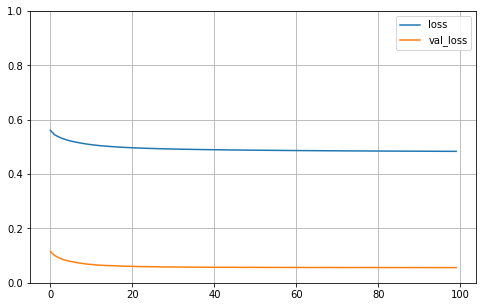

In [21]:
plotting.plot_learning_curves(history)

In [22]:
ypred_nn_train = model.predict(X_train)
ypred_nn_test = model.predict(X_test)

  1/886 [..............................] - ETA: 1:24

 41/886 [>.............................] - ETA: 1s  

 81/886 [=>............................] - ETA: 1s

125/886 [===>..........................] - ETA: 0s

168/886 [====>.........................] - ETA: 0s

211/886 [======>.......................] - ETA: 0s

255/886 [=======>......................] - ETA: 0s

300/886 [=========>....................] - ETA: 0s

345/886 [==========>...................] - ETA: 0s

389/886 [============>.................] - ETA: 0s

432/886 [=============>................] - ETA: 0s

476/886 [===============>..............] - ETA: 0s

520/886 [================>.............] - ETA: 0s

562/886 [==================>...........] - ETA: 0s

606/886 [===================>..........] - ETA: 0s

649/886 [====================>.........] - ETA: 0s

695/886 [======================>.......] - ETA: 0s

737/886 [=======================>......] - ETA: 0s

779/886 [=========================>....] - ETA: 0s

821/886 [==========================>...] - ETA: 0s

863/886 [============================>.] - ETA: 0s

886/886 [==============================] - 1s 1ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 1ms/step


In [23]:
print(f"Train-RMSE: {mean_squared_error(y_train, ypred_nn_train, squared=False).round(2)}, Train-R2: {r2_score(y_train, ypred_nn_train).round(2)}")
print(f"Test-RMSE: {mean_squared_error(y_test, ypred_nn_test, squared=False).round(2)}, Test-R2: {r2_score(y_test, ypred_nn_test).round(2)}")

Train-RMSE: 0.7, Train-R2: 0.15
Test-RMSE: 0.24, Test-R2: 0.6


# GP

In [24]:
# !pip install gpytorch
# from torch.utils.data import TensorDataset, DataLoader
# train_dataset = TensorDataset(torch.Tensor(X_train), torch.Tensor(y_train))
# train_loader = DataLoader(train_dataset, batch_size=1024, shuffle=True)

# test_dataset = TensorDataset(torch.Tensor(X_test), torch.Tensor(y_test))
# test_loader = DataLoader(test_dataset, batch_size=1024, shuffle=False)

In [25]:
import math
import torch
import gpytorch


#  R2 =0.25, VAR = -.14
# We will use the simplest form of GP model, exact inference
class ExactGPModel(gpytorch.models.ExactGP):
    def __init__(self, train_x, train_y, likelihood):
        super(ExactGPModel, self).__init__(train_x, train_y, likelihood)
        self.mean_module = gpytorch.means.ConstantMean()
        self.covar_module = gpytorch.kernels.ScaleKernel(gpytorch.kernels.RBFKernel())

    def forward(self, x):
        mean_x = self.mean_module(x)
        covar_x = self.covar_module(x)
        return gpytorch.distributions.MultivariateNormal(mean_x, covar_x)

# initialize likelihood and model
likelihood = gpytorch.likelihoods.GaussianLikelihood()
model = ExactGPModel(torch.Tensor(X_train), torch.Tensor(y_train), likelihood)

In [26]:
# this is for running the notebook in our testing framework
import os
smoke_test = ('CI' in os.environ)
training_iter = 2 if smoke_test else 50


# Find optimal model hyperparameters
model.train()
likelihood.train()

# Use the adam optimizer
optimizer = torch.optim.Adam(model.parameters(), lr=1e-2)  # Includes GaussianLikelihood parameters

# "Loss" for GPs - the marginal log likelihood
mll = gpytorch.mlls.ExactMarginalLogLikelihood(likelihood, model)

for i in range(training_iter):
    # Zero gradients from previous iteration
    optimizer.zero_grad()
    # Output from model
    output = model(torch.Tensor(X_train))
    # Calc loss and backprop gradients
    loss = -mll(output, torch.Tensor(y_train))
    loss.backward()
    print('Iter %d/%d - Loss: %.3f   lengthscale: %.3f   noise: %.3f' % (
        i + 1, training_iter, loss.item(),
        model.covar_module.base_kernel.lengthscale.item(),
        model.likelihood.noise.item()
    ))
    optimizer.step()

Iter 1/50 - Loss: 1.115   lengthscale: 0.693   noise: 0.693


Iter 2/50 - Loss: 1.114   lengthscale: 0.698   noise: 0.688


Iter 3/50 - Loss: 1.113   lengthscale: 0.703   noise: 0.683


Iter 4/50 - Loss: 1.109   lengthscale: 0.708   noise: 0.678


Iter 5/50 - Loss: 1.110   lengthscale: 0.713   noise: 0.673


Iter 6/50 - Loss: 1.109   lengthscale: 0.718   noise: 0.669


Iter 7/50 - Loss: 1.107   lengthscale: 0.723   noise: 0.664


Iter 8/50 - Loss: 1.106   lengthscale: 0.728   noise: 0.659


Iter 9/50 - Loss: 1.107   lengthscale: 0.734   noise: 0.654


Iter 10/50 - Loss: 1.103   lengthscale: 0.739   noise: 0.649


Iter 11/50 - Loss: 1.102   lengthscale: 0.744   noise: 0.645


Iter 12/50 - Loss: 1.102   lengthscale: 0.749   noise: 0.640


Iter 13/50 - Loss: 1.101   lengthscale: 0.755   noise: 0.635


Iter 14/50 - Loss: 1.101   lengthscale: 0.760   noise: 0.631


Iter 15/50 - Loss: 1.100   lengthscale: 0.766   noise: 0.626


Iter 16/50 - Loss: 1.097   lengthscale: 0.771   noise: 0.622


Iter 17/50 - Loss: 1.097   lengthscale: 0.777   noise: 0.617


Iter 18/50 - Loss: 1.094   lengthscale: 0.782   noise: 0.613


Iter 19/50 - Loss: 1.096   lengthscale: 0.788   noise: 0.609


Iter 20/50 - Loss: 1.094   lengthscale: 0.794   noise: 0.604


Iter 21/50 - Loss: 1.092   lengthscale: 0.800   noise: 0.600


Iter 22/50 - Loss: 1.091   lengthscale: 0.805   noise: 0.596


Iter 23/50 - Loss: 1.090   lengthscale: 0.811   noise: 0.592


Iter 24/50 - Loss: 1.090   lengthscale: 0.817   noise: 0.587


Iter 25/50 - Loss: 1.090   lengthscale: 0.823   noise: 0.583


Iter 26/50 - Loss: 1.088   lengthscale: 0.829   noise: 0.579


Iter 27/50 - Loss: 1.089   lengthscale: 0.835   noise: 0.575


Iter 28/50 - Loss: 1.085   lengthscale: 0.841   noise: 0.571


Iter 29/50 - Loss: 1.086   lengthscale: 0.847   noise: 0.568


Iter 30/50 - Loss: 1.085   lengthscale: 0.853   noise: 0.564


Iter 31/50 - Loss: 1.084   lengthscale: 0.859   noise: 0.560


Iter 32/50 - Loss: 1.084   lengthscale: 0.866   noise: 0.556


Iter 33/50 - Loss: 1.083   lengthscale: 0.872   noise: 0.553


Iter 34/50 - Loss: 1.083   lengthscale: 0.878   noise: 0.549


Iter 35/50 - Loss: 1.083   lengthscale: 0.884   noise: 0.546


Iter 36/50 - Loss: 1.081   lengthscale: 0.891   noise: 0.542


Iter 37/50 - Loss: 1.082   lengthscale: 0.897   noise: 0.539


Iter 38/50 - Loss: 1.081   lengthscale: 0.904   noise: 0.536


Iter 39/50 - Loss: 1.081   lengthscale: 0.910   noise: 0.533


Iter 40/50 - Loss: 1.079   lengthscale: 0.917   noise: 0.529


Iter 41/50 - Loss: 1.080   lengthscale: 0.924   noise: 0.526


Iter 42/50 - Loss: 1.077   lengthscale: 0.930   noise: 0.523


Iter 43/50 - Loss: 1.078   lengthscale: 0.937   noise: 0.520


Iter 44/50 - Loss: 1.077   lengthscale: 0.944   noise: 0.518


Iter 45/50 - Loss: 1.077   lengthscale: 0.951   noise: 0.515


Iter 46/50 - Loss: 1.076   lengthscale: 0.958   noise: 0.512


Iter 47/50 - Loss: 1.076   lengthscale: 0.965   noise: 0.509


Iter 48/50 - Loss: 1.075   lengthscale: 0.972   noise: 0.507


Iter 49/50 - Loss: 1.074   lengthscale: 0.979   noise: 0.504


Iter 50/50 - Loss: 1.075   lengthscale: 0.986   noise: 0.502


In [27]:
f_preds = model(torch.Tensor(X_train))
y_preds = likelihood(model(torch.Tensor(X_train)))

f_mean = f_preds.mean
f_var = f_preds.variance
f_covar = f_preds.covariance_matrix
# f_samples = f_preds.sample(sample_shape=torch.Size(1000,))

In [28]:

# Get into evaluation (predictive posterior) mode
model.eval()
likelihood.eval()

# Test points are regularly spaced along [0,1]
# Make predictions by feeding model through likelihood
with torch.no_grad(), gpytorch.settings.fast_pred_var():
    observed_pred = likelihood(model(torch.Tensor(X_test)))

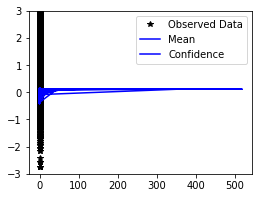

In [29]:
with torch.no_grad():
    # Initialize plot
    f, ax = plt.subplots(1, 1, figsize=(4, 3))

    # Get upper and lower confidence bounds
    lower, upper = observed_pred.confidence_region()
    # Plot training data as black stars
    ax.plot(X_train[:,5], y_train, 'k*')
    # Plot predictive means as blue line
    ax.plot(X_test, observed_pred.mean.numpy(), 'b')
    # Shade between the lower and upper confidence bounds
    ax.fill_between(X_test[:,0], lower.numpy(), upper.numpy(), alpha=0.5)
    ax.set_ylim([-3, 3])
    ax.legend(['Observed Data', 'Mean', 'Confidence'])

In [30]:
# ----------------- RBF ----------------- #
ypred_gp_rbf_train = y_preds.mean.detach().numpy()
ypred_gp_rbf_test, std_rbf_test = observed_pred.mean.numpy(), observed_pred.variance.numpy()**0.5

# # ----------------- RatQuad ----------------- #
# ypred_gp_quad_train, cov_quad_train = gpr_quad.predict(X_train)
# ypred_gp_quad_test, cov_quad_test = gpr_quad.predict(X_test)

#### RBF predictions

In [31]:
print('Mean-predicitions')
print(f"Train-RMSE: {mean_squared_error(y_train, y_preds.mean.detach().numpy(), squared=False).round(2)}, Train-R2: {r2_score(y_train, y_preds.mean.detach().numpy()).round(2)}")
print(f"Test-RMSE: {mean_squared_error(y_test, observed_pred.mean.numpy(), squared=False).round(2)}, Test-R2: {r2_score(y_test, observed_pred.mean.numpy()).round(2)}\n")

print('Variance-predicitions')
print(f"Test-RMSE: {mean_squared_error(tt.Y_test.scale, observed_pred.variance.numpy()**0.5, squared=False).round(2)}, Test-R2: {r2_score(tt.Y_test.scale, observed_pred.variance.numpy()**0.5).round(2)}")

Mean-predicitions
Train-RMSE: 0.76, Train-R2: -0.0
Test-RMSE: 0.36, Test-R2: 0.08

Variance-predicitions
Test-RMSE: 0.33, Test-R2: -5.99


#### GridInterpolationKernel predictions

In [32]:
# print('Mean-predicitions')
# print(f"Train-RMSE: {mean_squared_error(y_train, y_preds.mean.detach().numpy(), squared=False).round(2)}, Train-R2: {r2_score(y_train, y_preds.mean.detach().numpy()).round(2)}")
# print(f"Test-RMSE: {mean_squared_error(y_test, observed_pred.mean.numpy(), squared=False).round(2)}, Test-R2: {r2_score(y_test, observed_pred.mean.numpy()).round(2)}\n")

# print('Variance-predicitions')
# print(f"Test-RMSE: {mean_squared_error(tt.Y_test.scale, observed_pred.variance.numpy()**0.5, squared=False).round(2)}, Test-R2: {r2_score(tt.Y_test.scale, observed_pred.variance.numpy()**0.5).round(2)}")

# Plots

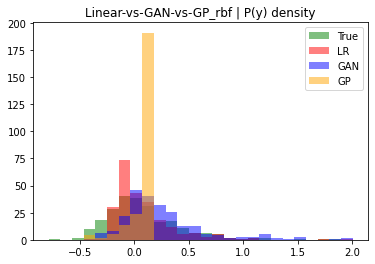

In [33]:
# plotting.plot_densities_joint(y_test, ypred_nn_test, ypred_mean_gan_test, ypred_gp_test, 
#                              "Linear-vs-GAN-vs-GP P(y) density", fig_dir=fig_dir, 
#                              prefix="all_marginalized", save_fig=exp_config.run.save_fig, at_x=True)

plotting.plot_datadistrib_joint(y_test, ypred_nn_test, ypred_mean_gan_test, ypred_gp_rbf_test, 
                                "Linear-vs-GAN-vs-GP_rbf | P(y) density", fig_dir=fig_dir, 
                                prefix="all_marginalized", save_fig=exp_config.run.save_fig)

# plotting.plot_datadistrib_joint(y_test, ypred_nn_test, ypred_mean_gan_test, ypred_gp_quad_test, 
#                                 "Linear-vs-GAN-vs-GP_quad | P(y) density", fig_dir=fig_dir, 
#                                 prefix="all_marginalized", save_fig=exp_config.run.save_fig)

# Metrics

In [34]:
n_eval_runs = 10

In [35]:
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

mse_gan_= []
mae_gan_ = []
r2_gan_ = []
for i in range(n_eval_runs):
    ypred_mean_gan_test_, ypred_median_gan_test_, _ = cgan.sample(X_test, exp_config.training.n_samples)
    mae_gan_.append(mean_absolute_error(y_test, ypred_median_gan_test_))
    mse_gan_.append(mean_squared_error(y_test, ypred_mean_gan_test_, squared=False))
    r2_gan_.append(r2_score(y_test, ypred_mean_gan_test_))

1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 1ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 1ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 1ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 1ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 1ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 1ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 1ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 1ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 1ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 1ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 1ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 1ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 1ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 1ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 1ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 1ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 1ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 1ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 1ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 1ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 1ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 1ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 1ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 1ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 1ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 1ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 1ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 1ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 1ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 1ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 1ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 1ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 1ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 1ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 1ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 1ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 1ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 1ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 1ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 1ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 1ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 1ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 1ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 1ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 1ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 1ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 1ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 1ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 1ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 1ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 1ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 1ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 1ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 1ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 1ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 1ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 1ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 1ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 1ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 1ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 1ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 1ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 1ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 1ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 1ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 1ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 1ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 1ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 1ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 1ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 1ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 1ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 1ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 1ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 1ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 1ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 1ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 1ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 1ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 1ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 1ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 1ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 1ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 1ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 1ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 1ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 1ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 1ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 1ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 1ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 1ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 1ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 1ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 1ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 1ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 1ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 1ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 1ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 1ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 1ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 1ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 1ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 1ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 1ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 1ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 1ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 1ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 1ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 1ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 1ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 1ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 1ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 1ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 1ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 1ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 1ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 1ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 1ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 1ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 1ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 1ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 1ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 1ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 1ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 1ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 1ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 1ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 1ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 1ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 1ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 1ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 1ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 1ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 1ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 1ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 1ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 1ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 1ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 1ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 1ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 1ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 1ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 1ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 1ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 1ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 1ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 1ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 1ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 1ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 1ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 1ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 1ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 1ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 1ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 1ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 1ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 1ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 1ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 1ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 1ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 1ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 1ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 1ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 1ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 1ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 1ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 1ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 1ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 1ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 1ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 1ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 1ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 1ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 1ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 1ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 1ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 1ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 1ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 1ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 1ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 1ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 1ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 1ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 1ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 1ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 1ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 1ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 1ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 1ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 1ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 1ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 1ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 1ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 1ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 1ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 1ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 1ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 1ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 1ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 1ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 1ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 1ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 1ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 1ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 1ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 1ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 1ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 1ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 1ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 1ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 1ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 1ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 1ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 1ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 1ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 1ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 1ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 1ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 1ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 1ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 1ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 1ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 1ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 1ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 1ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 1ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 1ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 1ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 1ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 1ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 1ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 1ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 1ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 1ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 1ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 1ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 1ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 1ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 1ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 1ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 1ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 1ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 1ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 1ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 1ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 1ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 1ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 1ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 1ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 1ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 1ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 1ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 1ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 1ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 1ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 1ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 1ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 1ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 1ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 1ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 1ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 1ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 1ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 1ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 1ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 1ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 1ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 1ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


1/8 [==>...........................] - ETA: 0s

8/8 [==============================] - 0s 2ms/step


<span id="papermill-error-cell" style="color:red; font-family:Helvetica Neue, Helvetica, Arial, sans-serif; font-size:2em;">Execution using papermill encountered an exception here and stopped:</span>

In [36]:
nn_mae = mean_absolute_error(y_test, ypred_nn_test)
gp_rbf_mae = mean_absolute_error(y_test, ypred_gp_rbf_test)
gp_quad_mae = mean_absolute_error(y_test, ypred_gp_quad_test)
gan_mae_mean = np.mean(np.asarray(mae_gan_))
gan_mae_std = np.std(np.asarray(mae_gan_))

print(f"NN MAE test: {nn_mae}")
print(f"GP MAE test: RBF = {gp_rbf_mae}, QUAD = {gp_quad_mae}")
print(f"GAN MAE test: {gan_mae_mean} +- {gan_mae_std}")

NameError: name 'ypred_gp_quad_test' is not defined

In [ ]:
nn_mse = mean_squared_error(y_test, ypred_nn_test).round(2)
gp_rbf_mse = mean_squared_error(y_test, ypred_gp_rbf_test).round(2)
gp_quad_mse = mean_squared_error(y_test, ypred_gp_quad_test).round(2)
gan_mse_mean = np.mean(np.asarray(mse_gan_)).round(2)
gan_mse_std = np.std(np.asarray(mse_gan_)).round(2)
# mdn_mse_mean = np.mean(np.asarray(mse_mdn_))
# mdn_mse_std = np.std(np.asarray(mse_mdn_))

print(f"NN MSE test: {nn_mse}")
print(f"GP MSE test: RBF = {gp_rbf_mse}, QUAD = {gp_quad_mse}")
print(f"GAN MSE test: {gan_mse_mean} +- {gan_mse_std}")
# print(f"MDN MSE test: {mdn_mse_mean} +- {mdn_mse_std}")

In [ ]:
nn_r2 = r2_score(y_test, ypred_nn_test).round(2)
gp_rbf_r2 = r2_score(y_test, ypred_gp_rbf_test).round(2)
gp_quad_r2 = r2_score(y_test, ypred_gp_quad_test).round(2)
gan_r2_mean = np.mean(np.asarray(r2_gan_)).round(2)
gan_r2_std = np.std(np.asarray(r2_gan_)).round(2)

print(f"NN R2 test: {nn_r2}")
print(f"GP R2 test: RBF = {gp_rbf_r2}, QUAD = {gp_quad_r2}")
print(f"GAN R2 test: {gan_r2_mean} +- {gan_r2_std}")
# print(f"MDN MSE test: {mdn_mse_mean} +- {mdn_mse_std}")

In [ ]:
cov_nn = np.mean((y_test - ypred_nn_test)**2)
nn_nlpd = metrics.gaussian_NLPD(y_test, ypred_nn_test, np.ones(len(ypred_nn_test)) * cov_nn, "NN")

In [ ]:
gp_rbf_nlpd = metrics.gaussian_NLPD(y_test, ypred_gp_rbf_test, cov_rbf_train, "GP-RBF")
gp_quad_nlpd = metrics.gaussian_NLPD(y_test, ypred_gp_quad_test, cov_quad_train, "GP-QUAD")

In [ ]:
gan_nlpd_train, w, lls = metrics.Parzen(cgan, X_train, y_train, n_sample=exp_config.training.n_samples)
nlpd_ = []
for i in range(n_eval_runs):
    nlpd_.append(metrics.Parzen_test(cgan, X_test, y_test, w, exp_config.training.n_samples))
gan_nlpd_test = np.mean(nlpd_)
gan_nlpd_std_test = np.std(nlpd_)

In [ ]:
print(f"GAN Train NLLH: {gan_nlpd_train}")
print(f"GAN Test NLLH: mean {gan_nlpd_test} std {gan_nlpd_std_test}")

In [ ]:
if exp_config.run.save_fig:
    file = open(f"{fig_dir}/metrics.txt","w") 

    file.write(f"===Test MAE===\n")
    file.write(f"NN MAE test: {nn_mae}\n") 
    file.write(f"GP MAE test: RBF = {gp_rbf_mae}, QUAD = {gp_quad_mae}\n")
    file.write(f"GAN MAE test: {gan_mae_mean} +- {gan_mae_std}\n")
    file.write(f"===Test MSE===\n")
    file.write(f"NN MSE test: {nn_mse}\n")
    file.write(f"GP MSE test: RBF = {gp_rbf_mse}, QUAD = {gp_quad_mse}\n")
    file.write(f"GAN MSE test: {gan_mse_mean} +- {gan_mse_std}\n")
    file.write(f"===Test R2===\n")
    file.write(f"NN R2 test: {nn_r2}\n")
    file.write(f"GP R2 test: RBF = {gp_rbf_r2}, QUAD = {gp_quad_r2}\n")
    file.write(f"GAN R2 test: {gan_r2_mean} +- {gan_r2_std}\n")
    file.write(f"===Test NLPD===\n")
    file.write(f"NN Gaussian NLPD: {nn_nlpd}\n")
    file.write(f"GP Gaussian NLPD: RBF = {gp_rbf_nlpd}, QUAD = {gp_quad_nlpd}\n")
    file.write(f"GAN NLPD: {gan_nlpd_test} +- {gan_nlpd_std_test}\n")
    file.close() 

In [ ]:
ypred_mean_gan_train.shape

In [ ]:
# Training covariances
cov_nn_train = np.mean((y_train - ypred_nn_train)**2)
cov_xgb_train = np.mean((y_train - ypred_xgb_train)**2)

# ----------------- Finding Training Losses -----------------
nn_r2_train, nn_mse_train, nn_mae_train, nn_nlpd_train = r2_score(y_train, ypred_nn_train), mean_squared_error(y_train, ypred_nn_train), mean_absolute_error(y_train, ypred_nn_train), metrics.gaussian_NLPD(y_train, ypred_nn_train, np.ones(len(ypred_nn_train)) * cov_nn_train, "NN")
gp_rbf_r2_train, gp_rbf_mse_train, gp_rbf_mae_train, gp_rbf_nlpd_train = r2_score(y_train, ypred_gp_rbf_train), mean_squared_error(y_train, ypred_gp_rbf_train), mean_absolute_error(y_train, ypred_gp_rbf_train), metrics.gaussian_NLPD(y_train, ypred_gp_rbf_train, cov_rbf_train, "GP-RBF")
gp_quad_r2_train, gp_quad_mse_train, gp_quad_mae_train, gp_quad_nlpd_train = r2_score(y_train, ypred_gp_quad_train), mean_squared_error(y_train, ypred_gp_quad_train), mean_absolute_error(y_train, ypred_gp_quad_train), metrics.gaussian_NLPD(y_train, ypred_gp_quad_train, cov_quad_train, "GP-QUAD")
gan_r2_train, gan_mse_train, gan_mae_train, gan_nlpd_train = r2_score(y_train, ypred_mean_gan_train), mean_squared_error(y_train, ypred_mean_gan_train), mean_absolute_error(y_train, ypred_mean_gan_train), gan_nlpd_train
xgb_r2_train, xgb_mse_train, xgb_mae_train, xgb_nlpd_train = r2_score(y_train, ypred_xgb_train), mean_squared_error(y_train, ypred_xgb_train), mean_absolute_error(y_train, ypred_xgb_train), metrics.gaussian_NLPD(y_train, ypred_xgb_train, np.ones(len(ypred_xgb_train)) * cov_xgb_train, "XGB")

# ----------------- Finding Test Losses for XGBOOST -----------------
cov_xgb_test = np.mean((y_test - ypred_xg_test)**2)
xgb_r2, xgb_mse, xgb_mae, xgb_nlpd = r2_score(y_test, ypred_xg_test), mean_squared_error(y_test, ypred_xg_test), mean_absolute_error(y_test, ypred_xg_test), metrics.gaussian_NLPD(y_test, ypred_xg_test, np.ones(len(ypred_xg_test)) * cov_xgb_test, "XGB")

results = {
    "NN": {'Train': {'R2':nn_r2_train.round(2), "RMSE":nn_mse_train.round(2), "MAE":nn_mae_train.round(2), "NLPD":nn_nlpd_train.round(2)}, 'Test': {'R2':nn_r2.round(2), "RMSE":nn_mse.round(2), "MAE":nn_mae.round(2), "NLPD":nn_nlpd.round(2)}},
    "GP-RBF": {'Train': {'R2':gp_rbf_r2_train.round(2), "RMSE":gp_rbf_mse_train.round(2), "MAE":gp_rbf_mae_train.round(2), "NLPD":gp_rbf_nlpd_train.round(2)}, 'Test': {'R2':gp_rbf_r2.round(2), "RMSE":gp_rbf_mse.round(2), "MAE":gp_rbf_mae.round(2), "NLPD":gp_rbf_nlpd.round(2)}},
    "GP-QUAD": {'Train': {'R2':gp_quad_r2_train.round(2), "RMSE":gp_quad_mse_train.round(2), "MAE":gp_quad_mae_train.round(2), "NLPD":gp_quad_nlpd_train.round(2)}, 'Test': {'R2':gp_quad_r2.round(2), "RMSE":gp_quad_mse.round(2), "MAE":gp_quad_mae.round(2), "NLPD":gp_quad_nlpd.round(2)}},
    "CGAN": {'Train': {'R2':gan_r2_train.round(2), "RMSE":gan_mse_train.round(2), "MAE":gan_mae_train.round(2), "NLPD":gan_nlpd_train.round(2)}, 'Test': {'R2':gan_r2_mean.round(2), "RMSE":gan_mse_mean.round(2), "MAE":gan_mae_mean.round(2), "NLPD":gan_nlpd_test.round(2)}},
    "XGB": {'Train': {'R2':xgb_r2_train.round(2), "RMSE":xgb_mse_train.round(2), "MAE":xgb_mae_train.round(2), "NLPD":xgb_nlpd_train.round(2)}, 'Test': {'R2':xgb_r2.round(2), "RMSE":xgb_mse.round(2), "MAE":xgb_mae.round(2), "NLPD":xgb_nlpd.round(2)}},
}

In [ ]:
pd.DataFrame.from_dict({(i,j): results[i][j] 
                           for i in results.keys() 
                           for j in results[i].keys()},
                       orient='index')